# Data Cleaning, Preprocessing, and Manipulation

In [1]:
# Import the necessary packages
import pandas as pd
import numpy as np
from datetime import datetime
import missingno as msno

# Load the data
data = pd.read_csv('students_dropout_and_academic_success.csv', delimiter=';')

In [2]:
# To check the first few entries of a dataframe
data.head(5)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171,1,1,122.0,1,19,12,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,15,1,9254,1,1,160.0,1,1,3,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,9070,1,1,122.0,1,37,37,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,17,2,9773,1,1,122.0,1,38,37,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,39,1,8014,0,1,100.0,1,37,38,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate


In [3]:
# To count the number of rows and columns
print(f"Number of rows: {len(data)}")
print(f"Number of columns: {len(data.columns)}")

Number of rows: 4424
Number of columns: 37


In [4]:
# Number of rows and columns as a pair of values
data.shape

(4424, 37)

In [5]:
# Let's show all column names
data.columns

Index(['Marital status', 'Application mode', 'Application order', 'Course',
       'Daytime/evening attendance\t', 'Previous qualification',
       'Previous qualification (grade)', 'Nacionality',
       'Mother's qualification', 'Father's qualification',
       'Mother's occupation', 'Father's occupation', 'Admission grade',
       'Displaced', 'Educational special needs', 'Debtor',
       'Tuition fees up to date', 'Gender', 'Scholarship holder',
       'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd

In [6]:
# Rename the columns for easier access (if needed)
data.rename(columns={
    'Marital status': 'MARITAL_STATUS',
    'Application mode': 'APPLICATION_MODE',
    'Application order': 'APPLICATION_ORDER',
    'Course': 'COURSE',
    'Daytime/evening attendance': 'ATTENDANCE',
    'Previous qualification': 'PREVIOUS_QUALIFICATION',
    'Previous qualification (grade)': 'PREVIOUS_QUALIFICATION_GRADE',
    'Nacionality': 'NATIONALITY',
    'Mother\'s qualification': 'MOTHER_QUALIFICATION',
    'Father\'s qualification': 'FATHER_QUALIFICATION',
    'Mother\'s occupation': 'MOTHER_OCCUPATION',
    'Father\'s occupation': 'FATHER_OCCUPATION',
    'Admission grade': 'ADMISSION_GRADE',
    'Displaced': 'DISPLACED',
    'Educational special needs': 'SPECIAL_NEEDS',
    'Debtor': 'DEBTOR',
    'Tuition fees up to date': 'TUITION_FEES_UPTODATE',
    'Gender': 'GENDER',
    'Scholarship holder': 'SCHOLARSHIP_HOLDER',
    'Age at enrollment': 'AGE_AT_ENROLLMENT',
    'International': 'INTERNATIONAL',
    'Curricular units 1st sem (credited)': 'CURRICULAR_UNITS_1ST_SEM_CREDITED',
    'Curricular units 1st sem (enrolled)': 'CURRICULAR_UNITS_1ST_SEM_ENROLLED',
    'Curricular units 1st sem (evaluations)': 'CURRICULAR_UNITS_1ST_SEM_EVALUATIONS',
    'Curricular units 1st sem (approved)': 'CURRICULAR_UNITS_1ST_SEM_APPROVED',
    'Curricular units 1st sem (grade)': 'CURRICULAR_UNITS_1ST_SEM_GRADE',
    'Curricular units 1st sem (without evaluations)': 'CURRICULAR_UNITS_1ST_SEM_WITHOUT_EVALUATIONS',
    'Curricular units 2nd sem (credited)': 'CURRICULAR_UNITS_2ND_SEM_CREDITED',
    'Curricular units 2nd sem (enrolled)': 'CURRICULAR_UNITS_2ND_SEM_ENROLLED',
    'Curricular units 2nd sem (evaluations)': 'CURRICULAR_UNITS_2ND_SEM_EVALUATIONS',
    'Curricular units 2nd sem (approved)': 'CURRICULAR_UNITS_2ND_SEM_APPROVED',
    'Curricular units 2nd sem (grade)': 'CURRICULAR_UNITS_2ND_SEM_GRADE',
    'Curricular units 2nd sem (without evaluations)': 'CURRICULAR_UNITS_2ND_SEM_WITHOUT_EVALUATIONS',
    'Unemployment rate': 'UNEMPLOYMENT_RATE',
    'Inflation rate': 'INFLATION_RATE',
    'GDP': 'GDP',
    'Target': 'TARGET'
}, inplace=True)

In [7]:
# Check the data
data.head()

,MARITAL_STATUS,APPLICATION_MODE,APPLICATION_ORDER,COURSE,Daytime/evening attendance\t,PREVIOUS_QUALIFICATION,PREVIOUS_QUALIFICATION_GRADE,NATIONALITY,MOTHER_QUALIFICATION,FATHER_QUALIFICATION,...,CURRICULAR_UNITS_2ND_SEM_CREDITED,CURRICULAR_UNITS_2ND_SEM_ENROLLED,CURRICULAR_UNITS_2ND_SEM_EVALUATIONS,CURRICULAR_UNITS_2ND_SEM_APPROVED,CURRICULAR_UNITS_2ND_SEM_GRADE,CURRICULAR_UNITS_2ND_SEM_WITHOUT_EVALUATIONS,UNEMPLOYMENT_RATE,INFLATION_RATE,GDP,TARGET
0,1,17,5,171,1,1,122.0,1,19,12,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,15,1,9254,1,1,160.0,1,1,3,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,9070,1,1,122.0,1,37,37,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,17,2,9773,1,1,122.0,1,38,37,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,39,1,8014,0,1,100.0,1,37,38,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate


In [8]:
# Identify variable types (nominal, ordinal, continuous, etc.)

nominal_vars = ['MARITAL_STATUS', 'APPLICATION_MODE', 'COURSE', 'NATIONALITY', 'MOTHER_QUALIFICATION', 'FATHER_QUALIFICATION', 'MOTHER_OCCUPATION', 'FATHER_OCCUPATION', 'DISPLACED', 'SPECIAL_NEEDS', 'DEBTOR', 'TUITION_FEES_UPTODATE', 'GENDER', 'SCHOLARSHIP_HOLDER', 'INTERNATIONAL', 'TARGET'] 
ordinal_vars = ['PREVIOUS_QUALIFICATION', 'GRADE_CLASS'] 
continuous_vars = ['PREVIOUS_QUALIFICATION_GRADE', 'ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'CURRICULAR_UNITS_1ST_SEM_GRADE', 'CURRICULAR_UNITS_2ND_SEM_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP', 'AVERAGE_GRADE'] 
discrete_vars = ['APPLICATION_ORDER', 'CURRICULAR_UNITS_1ST_SEM_CREDITED', 'CURRICULAR_UNITS_1ST_SEM_ENROLLED', 'CURRICULAR_UNITS_1ST_SEM_EVALUATIONS', 'CURRICULAR_UNITS_1ST_SEM_APPROVED', 'CURRICULAR_UNITS_1ST_SEM_WITHOUT_EVALUATIONS', 'CURRICULAR_UNITS_2ND_SEM_CREDITED', 'CURRICULAR_UNITS_2ND_SEM_ENROLLED', 'CURRICULAR_UNITS_2ND_SEM_EVALUATIONS', 'CURRICULAR_UNITS_2ND_SEM_APPROVED', 'CURRICULAR_UNITS_2ND_SEM_WITHOUT_EVALUATIONS']

# Print variable types
print("Nominal Variables:", nominal_vars)
print("Ordinal Variables:", ordinal_vars)
print("Continuous Variables:", continuous_vars)
print("Discrete Variables:", discrete_vars)

Nominal Variables: ['MARITAL_STATUS', 'APPLICATION_MODE', 'COURSE', 'NATIONALITY', 'MOTHER_QUALIFICATION', 'FATHER_QUALIFICATION', 'MOTHER_OCCUPATION', 'FATHER_OCCUPATION', 'DISPLACED', 'SPECIAL_NEEDS', 'DEBTOR', 'TUITION_FEES_UPTODATE', 'GENDER', 'SCHOLARSHIP_HOLDER', 'INTERNATIONAL', 'TARGET']
Ordinal Variables: ['PREVIOUS_QUALIFICATION', 'GRADE_CLASS']
Continuous Variables: ['PREVIOUS_QUALIFICATION_GRADE', 'ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'CURRICULAR_UNITS_1ST_SEM_GRADE', 'CURRICULAR_UNITS_2ND_SEM_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP', 'AVERAGE_GRADE']
Discrete Variables: ['APPLICATION_ORDER', 'CURRICULAR_UNITS_1ST_SEM_CREDITED', 'CURRICULAR_UNITS_1ST_SEM_ENROLLED', 'CURRICULAR_UNITS_1ST_SEM_EVALUATIONS', 'CURRICULAR_UNITS_1ST_SEM_APPROVED', 'CURRICULAR_UNITS_1ST_SEM_WITHOUT_EVALUATIONS', 'CURRICULAR_UNITS_2ND_SEM_CREDITED', 'CURRICULAR_UNITS_2ND_SEM_ENROLLED', 'CURRICULAR_UNITS_2ND_SEM_EVALUATIONS', 'CURRICULAR_UNITS_2ND_SEM_APPROVED', 'CURRICULAR_UNITS_2ND_SE

In [9]:
# Access a single column
data["MARITAL_STATUS"]

0       1
1       1
2       1
3       1
4       2
       ..
4419    1
4420    1
4421    1
4422    1
4423    1
Name: MARITAL_STATUS, Length: 4424, dtype: int64

In [10]:
# Check the unique values that appear in this column
data["MARITAL_STATUS"].value_counts()

MARITAL_STATUS
1    3919
2     379
4      91
5      25
6       6
3       4
Name: count, dtype: int64

In [11]:
# Impute missing values

# Impute numerical columns with mean
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns
data[numerical_columns] = data[numerical_columns].fillna(data[numerical_columns].mean())

# Impute categorical columns with mode
categorical_columns = data.select_dtypes(include=['object', 'category']).columns
data[categorical_columns] = data[categorical_columns].apply(lambda x: x.fillna(x.mode()[0]))

# Verify no missing values remain
print(data.isnull().sum())

MARITAL_STATUS                                  0
APPLICATION_MODE                                0
APPLICATION_ORDER                               0
COURSE                                          0
Daytime/evening attendance\t                    0
PREVIOUS_QUALIFICATION                          0
PREVIOUS_QUALIFICATION_GRADE                    0
NATIONALITY                                     0
MOTHER_QUALIFICATION                            0
FATHER_QUALIFICATION                            0
MOTHER_OCCUPATION                               0
FATHER_OCCUPATION                               0
ADMISSION_GRADE                                 0
DISPLACED                                       0
SPECIAL_NEEDS                                   0
DEBTOR                                          0
TUITION_FEES_UPTODATE                           0
GENDER                                          0
SCHOLARSHIP_HOLDER                              0
AGE_AT_ENROLLMENT                               0


In [12]:
# Drop the unneeded column
data.drop(['Daytime/evening attendance\t'], axis=1, inplace=True)

In [13]:
# Verify the column has been dropped
data.columns

Index(['MARITAL_STATUS', 'APPLICATION_MODE', 'APPLICATION_ORDER', 'COURSE',
       'PREVIOUS_QUALIFICATION', 'PREVIOUS_QUALIFICATION_GRADE', 'NATIONALITY',
       'MOTHER_QUALIFICATION', 'FATHER_QUALIFICATION', 'MOTHER_OCCUPATION',
       'FATHER_OCCUPATION', 'ADMISSION_GRADE', 'DISPLACED', 'SPECIAL_NEEDS',
       'DEBTOR', 'TUITION_FEES_UPTODATE', 'GENDER', 'SCHOLARSHIP_HOLDER',
       'AGE_AT_ENROLLMENT', 'INTERNATIONAL',
       'CURRICULAR_UNITS_1ST_SEM_CREDITED',
       'CURRICULAR_UNITS_1ST_SEM_ENROLLED',
       'CURRICULAR_UNITS_1ST_SEM_EVALUATIONS',
       'CURRICULAR_UNITS_1ST_SEM_APPROVED', 'CURRICULAR_UNITS_1ST_SEM_GRADE',
       'CURRICULAR_UNITS_1ST_SEM_WITHOUT_EVALUATIONS',
       'CURRICULAR_UNITS_2ND_SEM_CREDITED',
       'CURRICULAR_UNITS_2ND_SEM_ENROLLED',
       'CURRICULAR_UNITS_2ND_SEM_EVALUATIONS',
       'CURRICULAR_UNITS_2ND_SEM_APPROVED', 'CURRICULAR_UNITS_2ND_SEM_GRADE',
       'CURRICULAR_UNITS_2ND_SEM_WITHOUT_EVALUATIONS', 'UNEMPLOYMENT_RATE',
       'INFLATI

In [14]:
# Access a single row
data.loc[20, :]

MARITAL_STATUS                                         1
APPLICATION_MODE                                       1
APPLICATION_ORDER                                      3
COURSE                                               171
PREVIOUS_QUALIFICATION                                 1
PREVIOUS_QUALIFICATION_GRADE                       122.0
NATIONALITY                                            1
MOTHER_QUALIFICATION                                   1
FATHER_QUALIFICATION                                   1
MOTHER_OCCUPATION                                      9
FATHER_OCCUPATION                                      8
ADMISSION_GRADE                                    120.3
DISPLACED                                              0
SPECIAL_NEEDS                                          0
DEBTOR                                                 0
TUITION_FEES_UPTODATE                                  1
GENDER                                                 0
SCHOLARSHIP_HOLDER             

In [15]:
# Access a single cell using .loc
data.loc[20, "APPLICATION_MODE"]

1

In [16]:
# Access a single cell using .iloc
data.iloc[20, 1]

1

In [17]:
# Access a single cell using a mix of index and column name
data.loc[data.index[20], 'APPLICATION_MODE']

1

In [18]:
# Display data for students who are debtors
data.loc[data["DEBTOR"] == 1, :]

,MARITAL_STATUS,APPLICATION_MODE,APPLICATION_ORDER,COURSE,PREVIOUS_QUALIFICATION,PREVIOUS_QUALIFICATION_GRADE,NATIONALITY,MOTHER_QUALIFICATION,FATHER_QUALIFICATION,MOTHER_OCCUPATION,...,CURRICULAR_UNITS_2ND_SEM_CREDITED,CURRICULAR_UNITS_2ND_SEM_ENROLLED,CURRICULAR_UNITS_2ND_SEM_EVALUATIONS,CURRICULAR_UNITS_2ND_SEM_APPROVED,CURRICULAR_UNITS_2ND_SEM_GRADE,CURRICULAR_UNITS_2ND_SEM_WITHOUT_EVALUATIONS,UNEMPLOYMENT_RATE,INFLATION_RATE,GDP,TARGET
5,2,39,1,9991,19,133.1,1,37,37,9,...,0,5,17,5,11.500000,5,16.2,0.3,-0.92,Graduate
9,1,1,1,9238,1,138.0,1,1,19,4,...,0,6,14,2,13.500000,0,8.9,1.4,3.51,Dropout
25,1,1,1,9238,1,151.0,1,19,38,9,...,0,6,12,4,11.000000,0,7.6,2.6,0.32,Enrolled
35,1,39,1,33,1,130.0,1,38,37,9,...,0,7,7,1,10.000000,0,8.9,1.4,3.51,Dropout
39,1,44,1,9130,39,120.0,6,4,4,3,...,1,6,11,3,12.000000,0,12.4,0.5,1.79,Dropout
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4395,1,17,3,9773,1,153.0,1,34,34,99,...,0,6,8,5,12.400000,0,9.4,-0.8,-3.12,Dropout
4400,2,39,1,9991,1,133.1,1,37,37,6,...,0,5,12,3,13.333333,0,9.4,-0.8,-3.12,Dropout
4404,2,39,1,9130,19,133.1,1,2,1,8,...,0,6,9,2,10.500000,0,16.2,0.3,-0.92,Dropout
4415,4,39,1,9500,19,133.1,1,37,37,6,...,0,7,12,3,11.083333,0,11.1,0.6,2.02,Dropout


In [19]:
# SLICE ROWS - show data between the 4th and 6th respondents
print(data.iloc[3:6, :])

   MARITAL_STATUS  APPLICATION_MODE  APPLICATION_ORDER  COURSE  \
3               1                17                  2    9773   
4               2                39                  1    8014   
5               2                39                  1    9991   

   PREVIOUS_QUALIFICATION  PREVIOUS_QUALIFICATION_GRADE  NATIONALITY  \
3                       1                         122.0            1   
4                       1                         100.0            1   
5                      19                         133.1            1   

   MOTHER_QUALIFICATION  FATHER_QUALIFICATION  MOTHER_OCCUPATION  ...  \
3                    38                    37                  5  ...   
4                    37                    38                  9  ...   
5                    37                    37                  9  ...   

   CURRICULAR_UNITS_2ND_SEM_CREDITED  CURRICULAR_UNITS_2ND_SEM_ENROLLED  \
3                                  0                                  6   
4  

In [20]:
# SLICE COLUMNS
data.loc[:, "APPLICATION_MODE":"PREVIOUS_QUALIFICATION_GRADE"]

,APPLICATION_MODE,APPLICATION_ORDER,COURSE,PREVIOUS_QUALIFICATION,PREVIOUS_QUALIFICATION_GRADE
0,17,5,171,1,122.0
1,15,1,9254,1,160.0
2,1,5,9070,1,122.0
3,17,2,9773,1,122.0
4,39,1,8014,1,100.0
...,...,...,...,...,...
4419,1,6,9773,1,125.0
4420,1,2,9773,1,120.0
4421,1,1,9500,1,154.0
4422,1,1,9147,1,180.0


In [21]:
# Sort all rows by one column (values)
data.sort_values("ADMISSION_GRADE", axis=0)

,MARITAL_STATUS,APPLICATION_MODE,APPLICATION_ORDER,COURSE,PREVIOUS_QUALIFICATION,PREVIOUS_QUALIFICATION_GRADE,NATIONALITY,MOTHER_QUALIFICATION,FATHER_QUALIFICATION,MOTHER_OCCUPATION,...,CURRICULAR_UNITS_2ND_SEM_CREDITED,CURRICULAR_UNITS_2ND_SEM_ENROLLED,CURRICULAR_UNITS_2ND_SEM_EVALUATIONS,CURRICULAR_UNITS_2ND_SEM_APPROVED,CURRICULAR_UNITS_2ND_SEM_GRADE,CURRICULAR_UNITS_2ND_SEM_WITHOUT_EVALUATIONS,UNEMPLOYMENT_RATE,INFLATION_RATE,GDP,TARGET
1617,1,39,1,8014,1,120.0,1,37,1,7,...,0,6,8,5,11.800000,0,15.5,2.8,-4.06,Dropout
2591,1,1,1,9853,1,133.1,1,19,37,9,...,0,7,8,6,13.166667,0,11.1,0.6,2.02,Enrolled
4200,1,1,1,9147,1,133.1,1,37,37,191,...,0,5,8,5,11.800000,0,11.1,0.6,2.02,Graduate
2304,1,17,1,9147,1,133.1,1,1,19,4,...,0,5,5,0,0.000000,0,11.1,0.6,2.02,Dropout
2375,1,1,1,9670,1,95.0,1,37,37,5,...,0,6,6,5,11.000000,0,12.7,3.7,-1.70,Dropout
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1126,1,39,1,9500,3,133.8,1,3,37,2,...,1,8,9,8,16.582222,0,15.5,2.8,-4.06,Graduate
1888,1,10,1,9085,1,184.4,22,2,19,2,...,0,6,10,5,14.333333,0,11.1,0.6,2.02,Graduate
1673,1,39,1,9500,40,130.0,1,1,1,4,...,1,8,9,8,14.077778,0,16.2,0.3,-0.92,Graduate
702,1,7,1,9556,4,190.0,1,5,5,2,...,1,1,1,1,12.500000,0,11.1,0.6,2.02,Dropout


In [22]:
# What is the admission grade of the 5th student as integer value?
data.loc[data.index[4], "ADMISSION_GRADE"]

141.5

In [23]:
# round down the admission grade
data["ADMISSION_GRADE"] = data["ADMISSION_GRADE"].apply(np.floor)

In [24]:
data["ADMISSION_GRADE"].unique()

array([127., 142., 124., 119., 141., 114., 128., 113., 129., 123., 130.,
       111., 137., 120., 136., 121., 125., 157., 116., 131., 122., 118.,
       150., 138., 134., 102., 100., 109., 132., 133., 126., 159., 155.,
       139., 115., 135., 106., 117., 110., 180., 161., 112., 105., 160.,
       108., 107., 140., 145., 174.,  99., 170., 148., 104., 162., 163.,
       152., 149., 147.,  97., 103., 144., 143., 101., 154., 146., 151.,
       166., 178., 172., 156., 158.,  96., 153., 183.,  95., 190., 175.,
       164., 184., 168., 169., 171.,  98., 165., 176., 167., 173., 179.])

In [25]:
# Ensure admission grade has no decimals
data["ADMISSION_GRADE"] = data["ADMISSION_GRADE"].astype(int)


In [26]:
data.loc[4, "ADMISSION_GRADE"]

141

In [27]:
data.dtypes

MARITAL_STATUS                                    int64
APPLICATION_MODE                                  int64
APPLICATION_ORDER                                 int64
COURSE                                            int64
PREVIOUS_QUALIFICATION                            int64
PREVIOUS_QUALIFICATION_GRADE                    float64
NATIONALITY                                       int64
MOTHER_QUALIFICATION                              int64
FATHER_QUALIFICATION                              int64
MOTHER_OCCUPATION                                 int64
FATHER_OCCUPATION                                 int64
ADMISSION_GRADE                                   int32
DISPLACED                                         int64
SPECIAL_NEEDS                                     int64
DEBTOR                                            int64
TUITION_FEES_UPTODATE                             int64
GENDER                                            int64
SCHOLARSHIP_HOLDER                              

In [28]:
# Generate descriptive statistics for the data
descriptive_statistics = data.describe()
print("Descriptive Statistics:")
print(descriptive_statistics)

Descriptive Statistics:
       MARITAL_STATUS  APPLICATION_MODE  APPLICATION_ORDER       COURSE  \
count     4424.000000       4424.000000        4424.000000  4424.000000   
mean         1.178571         18.669078           1.727848  8856.642631   
std          0.605747         17.484682           1.313793  2063.566416   
min          1.000000          1.000000           0.000000    33.000000   
25%          1.000000          1.000000           1.000000  9085.000000   
50%          1.000000         17.000000           1.000000  9238.000000   
75%          1.000000         39.000000           2.000000  9556.000000   
max          6.000000         57.000000           9.000000  9991.000000   

       PREVIOUS_QUALIFICATION  PREVIOUS_QUALIFICATION_GRADE  NATIONALITY  \
count             4424.000000                   4424.000000  4424.000000   
mean                 4.577758                    132.613314     1.873192   
std                 10.216592                     13.188332     6.914514

In [29]:
# Print the unique values of all columns
for column in data.columns:
    print(column)
    print(data[column].value_counts().head(10))
    print('\n')

MARITAL_STATUS
MARITAL_STATUS
1    3919
2     379
4      91
5      25
6       6
3       4
Name: count, dtype: int64


APPLICATION_MODE
APPLICATION_MODE
1     1708
17     872
39     785
43     312
44     213
7      139
18     124
42      77
51      59
16      38
Name: count, dtype: int64


APPLICATION_ORDER
APPLICATION_ORDER
1    3026
2     547
3     309
4     249
5     154
6     137
9       1
0       1
Name: count, dtype: int64


COURSE
COURSE
9500    766
9147    380
9238    355
9085    337
9773    331
9670    268
9991    268
9254    252
9070    226
171     215
Name: count, dtype: int64


PREVIOUS_QUALIFICATION
PREVIOUS_QUALIFICATION
1     3717
39     219
19     162
3      126
12      45
40      40
42      36
2       23
6       16
9       11
Name: count, dtype: int64


PREVIOUS_QUALIFICATION_GRADE
PREVIOUS_QUALIFICATION_GRADE
133.1    491
130.0    375
140.0    336
120.0    278
150.0    162
125.0    122
135.0    108
110.0    101
131.0     99
160.0     95
Name: count, dtype: int64


NATI

In [30]:
# Convert columns to appropriate data types if needed
# Example: Convert 'ADMISSION_GRADE' to float
data['ADMISSION_GRADE'] = data['ADMISSION_GRADE'].astype(float)

In [31]:
# Step 1: Standardize Column Names
data.columns = data.columns.str.upper().str.replace(' ', '_')

# Step 2: Handle Missing Values
data.fillna({'APPLICATION_MODE': 'UNKNOWN', 'APPLICATION_ORDER': 0}, inplace=True)

In [32]:
data['APPLICATION_ORDER'] = data['APPLICATION_ORDER'].astype(int)
data['AGE_AT_ENROLLMENT'] = pd.to_numeric(data['AGE_AT_ENROLLMENT'], errors='coerce')

In [33]:
# Check the cleaned values
print("Cleaned Values:")
print(data.head())

Cleaned Values:
   MARITAL_STATUS  APPLICATION_MODE  APPLICATION_ORDER  COURSE  \
0               1                17                  5     171   
1               1                15                  1    9254   
2               1                 1                  5    9070   
3               1                17                  2    9773   
4               2                39                  1    8014   

   PREVIOUS_QUALIFICATION  PREVIOUS_QUALIFICATION_GRADE  NATIONALITY  \
0                       1                         122.0            1   
1                       1                         160.0            1   
2                       1                         122.0            1   
3                       1                         122.0            1   
4                       1                         100.0            1   

   MOTHER_QUALIFICATION  FATHER_QUALIFICATION  MOTHER_OCCUPATION  ...  \
0                    19                    12                  5  ...   
1       

In [34]:
# Check the cleaned values
data['ADMISSION_GRADE'].value_counts()

ADMISSION_GRADE
130.0    248
120.0    247
140.0    183
126.0    152
121.0    138
        ... 
175.0      1
171.0      1
174.0      1
183.0      1
179.0      1
Name: count, Length: 88, dtype: int64

In [35]:
# Counting data
print("Distribution of marital status:")
print("-------------------------------")
print(data['MARITAL_STATUS'].value_counts())

Distribution of marital status:
-------------------------------
MARITAL_STATUS
1    3919
2     379
4      91
5      25
6       6
3       4
Name: count, dtype: int64


In [36]:
# TODO: Calculate distribution of target (dropout vs graduate)
print("Distribution of target:")
print("-----------------------")
print(data['TARGET'].value_counts())

Distribution of target:
-----------------------
TARGET
Graduate    2209
Dropout     1421
Enrolled     794
Name: count, dtype: int64


In [37]:
# BEGIN: Label values in gender column as male or female
data['GENDER'] = data['GENDER'].map({0: 'Female', 1: 'Male'})
# END:

# Verify the changes
print(data[['GENDER']].head())

   GENDER
0    Male
1    Male
2    Male
3  Female
4  Female


In [38]:
# Calculate the percentage of students who dropped out
dropout_percentage = data['TARGET'].value_counts(normalize=True)[1] * 100
print(f"Percentage of students who dropped out: {dropout_percentage:.2f}%")
# Calculate the percentage of students who completed the course
completion_percentage = data['TARGET'].value_counts(normalize=True)[0] * 100
print(f"Percentage of students who completed the course: {completion_percentage:.2f}%")
# Calculate the percentage of students who dropped out by gender
dropout_by_gender = data.groupby('GENDER')['TARGET'].value_counts(normalize=True) * 100
print("Percentage of students who dropped out by gender:")


Percentage of students who dropped out: 32.12%
Percentage of students who completed the course: 49.93%
Percentage of students who dropped out by gender:


C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\4264362348.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  dropout_percentage = data['TARGET'].value_counts(normalize=True)[1] * 100
C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\4264362348.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  completion_percentage = data['TARGET'].value_counts(normalize=True)[0] * 100


In [39]:
# calculating the mode: first calculate the frequencies (here we also sort the values)
frequencies = data['MARITAL_STATUS'].value_counts().sort_values(ascending=False)
# then select the first value from the resulting series
mode = frequencies.index[0]
print(f"The mode of the 'MARITAL_STATUS' column is: {mode}")


The mode of the 'MARITAL_STATUS' column is: 1


In [40]:
frequencies

MARITAL_STATUS
1    3919
2     379
4      91
5      25
6       6
3       4
Name: count, dtype: int64

In [41]:
# Calculating the mode
def mode(data, column):
    val_freqs = data[column].value_counts()
    return val_freqs.idxmax()

In [42]:
# Example on how to use the 'mode' function
print("Marital status mode:", mode(data, 'MARITAL_STATUS'))

Marital status mode: 1


In [43]:
# TODO: Calculate the mode of target
print("Target mode:", mode(data, 'TARGET'))

Target mode: Graduate


In [44]:
# calculate the mode of admission grade and course
admission_grade_mode = data['ADMISSION_GRADE'].mode()[0]
course_mode = data['COURSE'].mode()[0]
print("Admission grade mode:", admission_grade_mode)
print("Course mode:", course_mode)


Admission grade mode: 130.0
Course mode: 9500


In [45]:
# Calculate the mean of the target variable
mean_target = data['TARGET'].value_counts(normalize=True).mean()
print("Mean of target:", mean_target)

Mean of target: 0.3333333333333333


In [46]:
# Check data types of all columns
data.dtypes

MARITAL_STATUS                                    int64
APPLICATION_MODE                                  int64
APPLICATION_ORDER                                 int32
COURSE                                            int64
PREVIOUS_QUALIFICATION                            int64
PREVIOUS_QUALIFICATION_GRADE                    float64
NATIONALITY                                       int64
MOTHER_QUALIFICATION                              int64
FATHER_QUALIFICATION                              int64
MOTHER_OCCUPATION                                 int64
FATHER_OCCUPATION                                 int64
ADMISSION_GRADE                                 float64
DISPLACED                                         int64
SPECIAL_NEEDS                                     int64
DEBTOR                                            int64
TUITION_FEES_UPTODATE                             int64
GENDER                                           object
SCHOLARSHIP_HOLDER                              

In [47]:
# convert necessary columns to float
data['ADMISSION_GRADE'] = data['ADMISSION_GRADE'].astype(float)
data['CURRICULAR_UNITS_1ST_SEM_GRADE'] = data['CURRICULAR_UNITS_1ST_SEM_GRADE'].astype(float)
data['CURRICULAR_UNITS_2ND_SEM_GRADE'] = data['CURRICULAR_UNITS_2ND_SEM_GRADE'].astype(float)

In [48]:
# calculate the average of the two grades
data['AVERAGE_GRADE'] = (data['CURRICULAR_UNITS_1ST_SEM_GRADE'] + data['CURRICULAR_UNITS_2ND_SEM_GRADE']) / 2
# create a new column for the grade classification
data['GRADE_CLASS'] = pd.cut(data['AVERAGE_GRADE'], bins=[0, 9.5, 12.5, 14.5, 20], labels=['Weak', 'Average', 'Good', 'Excellent'])
# check the new columns
data[['CURRICULAR_UNITS_1ST_SEM_GRADE', 'CURRICULAR_UNITS_2ND_SEM_GRADE', 'AVERAGE_GRADE', 'GRADE_CLASS']].head()

,CURRICULAR_UNITS_1ST_SEM_GRADE,CURRICULAR_UNITS_2ND_SEM_GRADE,AVERAGE_GRADE,GRADE_CLASS
0,0.000000,0.000000,0.000000,NaN
1,14.000000,13.666667,13.833333,Good
2,0.000000,0.000000,0.000000,NaN
3,13.428571,12.400000,12.914286,Good
4,12.333333,13.000000,12.666667,Good


In [49]:
# cap every column to 2 decimal places
data = data.round(2)

In [50]:
# cap every value that just contains 0 or 0.0 or 0.00 etc to 0 if it only contains 0 and nothing else
data = data.replace({'0.0': 0, '0.00': 0, '0.000': 0})

In [51]:
data.head()

,MARITAL_STATUS,APPLICATION_MODE,APPLICATION_ORDER,COURSE,PREVIOUS_QUALIFICATION,PREVIOUS_QUALIFICATION_GRADE,NATIONALITY,MOTHER_QUALIFICATION,FATHER_QUALIFICATION,MOTHER_OCCUPATION,...,CURRICULAR_UNITS_2ND_SEM_EVALUATIONS,CURRICULAR_UNITS_2ND_SEM_APPROVED,CURRICULAR_UNITS_2ND_SEM_GRADE,CURRICULAR_UNITS_2ND_SEM_WITHOUT_EVALUATIONS,UNEMPLOYMENT_RATE,INFLATION_RATE,GDP,TARGET,AVERAGE_GRADE,GRADE_CLASS
0,1,17,5,171,1,122.0,1,19,12,5,...,0,0,0.00,0,10.8,1.4,1.74,Dropout,0.00,NaN
1,1,15,1,9254,1,160.0,1,1,3,3,...,6,6,13.67,0,13.9,-0.3,0.79,Graduate,13.83,Good
2,1,1,5,9070,1,122.0,1,37,37,9,...,0,0,0.00,0,10.8,1.4,1.74,Dropout,0.00,NaN
3,1,17,2,9773,1,122.0,1,38,37,5,...,10,5,12.40,0,9.4,-0.8,-3.12,Graduate,12.91,Good
4,2,39,1,8014,1,100.0,1,37,38,9,...,6,6,13.00,0,13.9,-0.3,0.79,Graduate,12.67,Good


In [52]:
# Calculate descriptive statistics
for column in ['ADMISSION_GRADE', 'PREVIOUS_QUALIFICATION_GRADE']:
    print(column)
    v = data[column].values
    print(f"* Min: {np.nanmin(v)}")
    print(f"* Max: {np.nanmax(v)}")
    print(f"* Range: {np.nanmax(v)-np.nanmin(v)}")
    print(f"* Mean: {np.nanmean(v)}")
    print(f"* Standard deviation: {np.nanstd(v)}")
    print(f"* Median: {np.nanmedian(v)}")
    q1 = np.nanpercentile(v, 25)
    print(f"* 25th percentile (Q1): {q1}")
    q3 = np.nanpercentile(v, 75)
    print(f"* 75th percentile (Q3): {q3}")
    iqr = q3 - q1
    print(f"* IQR: {iqr}\n")

ADMISSION_GRADE
* Min: 95.0
* Max: 190.0
* Range: 95.0
* Mean: 126.64308318264014
* Standard deviation: 14.482540997661898
* Median: 126.0
* 25th percentile (Q1): 117.0
* 75th percentile (Q3): 134.0
* IQR: 17.0

PREVIOUS_QUALIFICATION_GRADE
* Min: 95.0
* Max: 190.0
* Range: 95.0
* Mean: 132.6133137432188
* Standard deviation: 13.186841057819926
* Median: 133.1
* 25th percentile (Q1): 125.0
* 75th percentile (Q3): 140.0
* IQR: 15.0



In [53]:
# Convert binary columns to TRUE/FALSE labels
binary_columns = ['DISPLACED', 'SPECIAL_NEEDS', 'DEBTOR', 'TUITION_FEES_UPTODATE']
for column in binary_columns:
    data[column] = data[column].map({0: 'FALSE', 1: 'TRUE'})


In [54]:
# Round all numerical columns to 2 decimal places
for column in data.columns:
    if data[column].dtype == 'float64':
        data[column] = data[column].round(2)

In [55]:
# Fill missing values in 'TARGET' column with a default value (e.g., 0 for Dropout)
#data['TARGET'].fillna('Dropout', inplace=True)

# Convert 'TARGET' column to binary labels (0 for Dropout, 1 for Graduate) with no decimal places
#data['TARGET'] = data['TARGET'].map({'Dropout': 0, 'Graduate': 1}).fillna(0).astype(int)

In [56]:
# Convert marital status codes to labels
marital_status_labels = {1: 'single', 2: 'married', 3: 'divorced', 4: 'widowed'}
data['MARITAL_STATUS'] = data['MARITAL_STATUS'].map(marital_status_labels)


In [57]:
# Count the frequency of each application mode
application_mode_counts = data['APPLICATION_MODE'].value_counts()

# Sort the modes by their frequency
sorted_modes = application_mode_counts.index

# Create a dictionary to map the modes to labels
mode_labels = {mode: f"Mode_{i+1}" for i, mode in enumerate(sorted_modes[:3])}  # Assign labels to the top 3 most common modes
mode_labels.update({mode: "Other" for mode in sorted_modes[3:]})  # Assign "Other" to the remaining modes

# Map the application modes to their respective labels
data['APPLICATION_MODE'] = data['APPLICATION_MODE'].map(mode_labels)

# Display the first few rows to verify the changes
print(data[['APPLICATION_MODE']].head())

  APPLICATION_MODE
0           Mode_2
1            Other
2           Mode_1
3           Mode_2
4           Mode_3


In [58]:
# Reduce the size of the dataset by selecting a smaller subset of columns and rows
subset_data = data[['CURRICULAR_UNITS_1ST_SEM_CREDITED', 'CURRICULAR_UNITS_2ND_SEM_CREDITED']].sample(frac=0.1, random_state=1)

# Merge first semester and second semester data on the smaller subset
merged_semesters = subset_data.merge(
    subset_data, 
    left_on='CURRICULAR_UNITS_1ST_SEM_CREDITED', 
    right_on='CURRICULAR_UNITS_2ND_SEM_CREDITED', 
    how='inner'
)


In [59]:
data.head()

,MARITAL_STATUS,APPLICATION_MODE,APPLICATION_ORDER,COURSE,PREVIOUS_QUALIFICATION,PREVIOUS_QUALIFICATION_GRADE,NATIONALITY,MOTHER_QUALIFICATION,FATHER_QUALIFICATION,MOTHER_OCCUPATION,...,CURRICULAR_UNITS_2ND_SEM_EVALUATIONS,CURRICULAR_UNITS_2ND_SEM_APPROVED,CURRICULAR_UNITS_2ND_SEM_GRADE,CURRICULAR_UNITS_2ND_SEM_WITHOUT_EVALUATIONS,UNEMPLOYMENT_RATE,INFLATION_RATE,GDP,TARGET,AVERAGE_GRADE,GRADE_CLASS
0,single,Mode_2,5,171,1,122.0,1,19,12,5,...,0,0,0.00,0,10.8,1.4,1.74,Dropout,0.00,NaN
1,single,Other,1,9254,1,160.0,1,1,3,3,...,6,6,13.67,0,13.9,-0.3,0.79,Graduate,13.83,Good
2,single,Mode_1,5,9070,1,122.0,1,37,37,9,...,0,0,0.00,0,10.8,1.4,1.74,Dropout,0.00,NaN
3,single,Mode_2,2,9773,1,122.0,1,38,37,5,...,10,5,12.40,0,9.4,-0.8,-3.12,Graduate,12.91,Good
4,married,Mode_3,1,8014,1,100.0,1,37,38,9,...,6,6,13.00,0,13.9,-0.3,0.79,Graduate,12.67,Good


In [181]:
# Convert 'NATIONALITY' column to 'Local' for 1 and 'International' for any other value
data['NATIONALITY'] = data['NATIONALITY'].apply(lambda x: 'Local' if x == 1 else 'International')

In [176]:
# Convert 'NATIONALITY' column to specific labels
nationality_labels = {
    1: 'Portuguese', 2: 'German', 6: 'Spanish', 11: 'Italian', 13: 'Dutch', 14: 'English', 
    17: 'Lithuanian', 21: 'Angolan', 22: 'Cape Verdean', 24: 'Guinean', 25: 'Mozambican', 
    26: 'Santomean', 32: 'Turkish', 41: 'Brazilian', 62: 'Romanian', 100: 'Moldova (Republic of)', 
    101: 'Mexican', 103: 'Ukrainian', 105: 'Russian', 108: 'Cuban', 109: 'Colombian'
}
data['NATIONALITY'] = data['NATIONALITY'].map(nationality_labels)

In [61]:
# Check the missing values in each column
data.isnull().sum()

MARITAL_STATUS                                   31
APPLICATION_MODE                                  0
APPLICATION_ORDER                                 0
COURSE                                            0
PREVIOUS_QUALIFICATION                            0
PREVIOUS_QUALIFICATION_GRADE                      0
NATIONALITY                                       0
MOTHER_QUALIFICATION                              0
FATHER_QUALIFICATION                              0
MOTHER_OCCUPATION                                 0
FATHER_OCCUPATION                                 0
ADMISSION_GRADE                                   0
DISPLACED                                         0
SPECIAL_NEEDS                                     0
DEBTOR                                            0
TUITION_FEES_UPTODATE                             0
GENDER                                            0
SCHOLARSHIP_HOLDER                                0
AGE_AT_ENROLLMENT                                 0
INTERNATIONA

<Axes: >

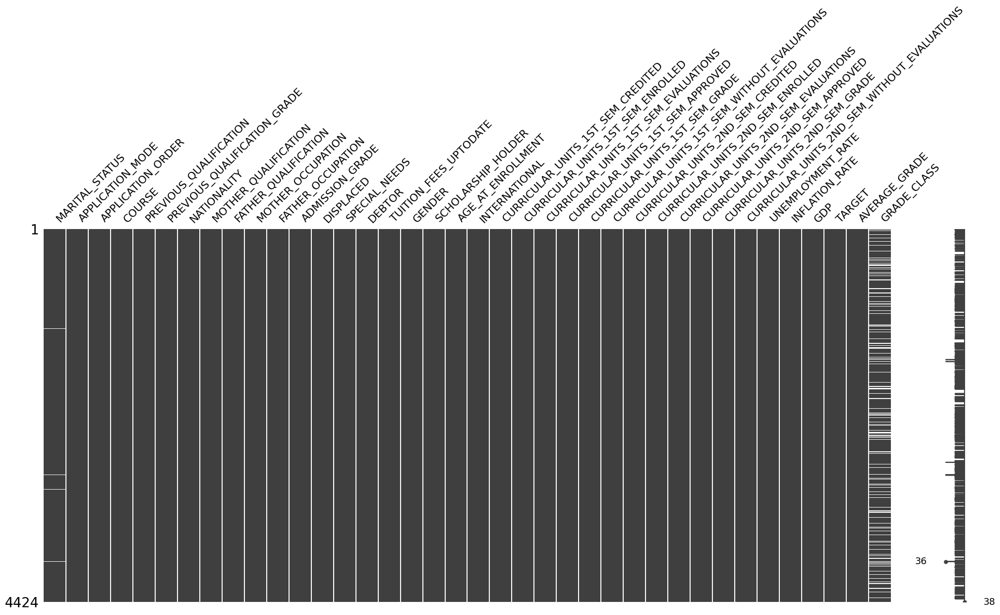

In [62]:
# Check missing value distribution using missingno library
msno.matrix(data)

In [63]:
# Drop rows with missing values in 'AGE_AT_ENROLLMENT' column
data.dropna(subset=['AGE_AT_ENROLLMENT'], inplace=True)

In [64]:
# drop rows with missing values in grade class
data.dropna(subset=['GRADE_CLASS'], inplace=True)


In [65]:
# replace rows with missing values in marital status with mean or mode
data['MARITAL_STATUS'].fillna(data['MARITAL_STATUS'].mode()[0], inplace=True)

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\1786171346.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['MARITAL_STATUS'].fillna(data['MARITAL_STATUS'].mode()[0], inplace=True)


In [66]:

# Convert 'AGE_AT_ENROLLMENT' to numeric type
data['AGE_AT_ENROLLMENT'] = pd.to_numeric(data['AGE_AT_ENROLLMENT'])
# Calculate the mean age at enrollment
mean_age = data['AGE_AT_ENROLLMENT'].mean()
print(f"Mean age at enrollment: {mean_age:.2f}")
# Calculate the median age at enrollment
median_age = data['AGE_AT_ENROLLMENT'].median()
print(f"Median age at enrollment: {median_age:.2f}")
# Calculate the mode age at enrollment
mode_age = data['AGE_AT_ENROLLMENT'].mode()[0]
print(f"Mode age at enrollment: {mode_age:.2f}")
# Calculate the standard deviation of age at enrollment
std_age = data['AGE_AT_ENROLLMENT'].std()
print(f"Standard deviation of age at enrollment: {std_age:.2f}")
# Calculate the variance of age at enrollment
var_age = data['AGE_AT_ENROLLMENT'].var()
print(f"Variance of age at enrollment: {var_age:.2f}")
# Calculate the range of age at enrollment
range_age = data['AGE_AT_ENROLLMENT'].max() - data['AGE_AT_ENROLLMENT'].min()
print(f"Range of age at enrollment: {range_age:.2f}")
# Calculate the interquartile range (IQR) of age at enrollment
q1_age = data['AGE_AT_ENROLLMENT'].quantile(0.25)
q3_age = data['AGE_AT_ENROLLMENT'].quantile(0.75)
iqr_age = q3_age - q1_age
print(f"IQR of age at enrollment: {iqr_age:.2f}")
# Calculate the skewness of age at enrollment
skew_age = data['AGE_AT_ENROLLMENT'].skew()
print(f"Skewness of age at enrollment: {skew_age:.2f}")
# Calculate the kurtosis of age at enrollment
kurtosis_age = data['AGE_AT_ENROLLMENT'].kurtosis()
print(f"Kurtosis of age at enrollment: {kurtosis_age:.2f}")
# Calculate the coefficient of variation of age at enrollment
cv_age = std_age / mean_age
print(f"Coefficient of variation of age at enrollment: {cv_age:.2f}")
# Calculate the z-score of age at enrollment
z_scores = (data['AGE_AT_ENROLLMENT'] - mean_age) / std_age
print("Z-scores of age at enrollment:")
print(z_scores.head())
# Calculate the percentile rank of age at enrollment
percentile_rank = data['AGE_AT_ENROLLMENT'].rank(pct=True)
print("Percentile rank of age at enrollment:")
print(percentile_rank.head())
# Calculate the cumulative distribution function (CDF) of age at enrollment
cdf = data['AGE_AT_ENROLLMENT'].value_counts(normalize=True).sort_index().cumsum()
print("Cumulative distribution function of age at enrollment:")
print(cdf.head())


Mean age at enrollment: 22.82
Median age at enrollment: 20.00
Mode age at enrollment: 18.00
Standard deviation of age at enrollment: 7.26
Variance of age at enrollment: 52.64
Range of age at enrollment: 45.00
IQR of age at enrollment: 5.00
Skewness of age at enrollment: 2.20
Kurtosis of age at enrollment: 4.73
Coefficient of variation of age at enrollment: 0.32
Z-scores of age at enrollment:
1   -0.526179
3   -0.388355
4    3.057237
5    3.746356
6   -0.664003
Name: AGE_AT_ENROLLMENT, dtype: float64
Percentile rank of age at enrollment:
1    0.356057
3    0.533751
4    0.975987
5    0.990261
6    0.125133
Name: AGE_AT_ENROLLMENT, dtype: float64
Cumulative distribution function of age at enrollment:
AGE_AT_ENROLLMENT
17    0.001067
18    0.248933
19    0.462914
20    0.604322
21    0.680896
Name: proportion, dtype: float64


In [67]:
# Print rows with more than one missing value
data[data.isnull().sum(axis=1) > 1]

# Remove rows with more than one missing value
data = data[data.isnull().sum(axis=1) <= 1]

In [68]:
# Replace the missing values in 'ADMISSION_GRADE' with the median
data['ADMISSION_GRADE'].fillna(data['ADMISSION_GRADE'].median(), inplace=True)

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\2443505292.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['ADMISSION_GRADE'].fillna(data['ADMISSION_GRADE'].median(), inplace=True)


In [69]:
# Replace the missing values in 'PREVIOUS_QUALIFICATION_GRADE' with the mean
data['PREVIOUS_QUALIFICATION_GRADE'].fillna(data['PREVIOUS_QUALIFICATION_GRADE'].mean(), inplace=True)

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\3437587510.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['PREVIOUS_QUALIFICATION_GRADE'].fillna(data['PREVIOUS_QUALIFICATION_GRADE'].mean(), inplace=True)


In [70]:
# Replace the missing values in 'CURRICULAR_UNITS_1ST_SEM_GRADE' with 0 (assuming no evaluations)
data['CURRICULAR_UNITS_1ST_SEM_GRADE'].fillna(0, inplace=True)

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\2556991041.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['CURRICULAR_UNITS_1ST_SEM_GRADE'].fillna(0, inplace=True)


In [71]:
# Check the missing values in each column
data.isnull().sum()

MARITAL_STATUS                                  0
APPLICATION_MODE                                0
APPLICATION_ORDER                               0
COURSE                                          0
PREVIOUS_QUALIFICATION                          0
PREVIOUS_QUALIFICATION_GRADE                    0
NATIONALITY                                     0
MOTHER_QUALIFICATION                            0
FATHER_QUALIFICATION                            0
MOTHER_OCCUPATION                               0
FATHER_OCCUPATION                               0
ADMISSION_GRADE                                 0
DISPLACED                                       0
SPECIAL_NEEDS                                   0
DEBTOR                                          0
TUITION_FEES_UPTODATE                           0
GENDER                                          0
SCHOLARSHIP_HOLDER                              0
AGE_AT_ENROLLMENT                               0
INTERNATIONAL                                   0


In [72]:
# Assign labels to the most common courses
course_counts = data['COURSE'].value_counts()

# Sort the courses by their frequency
sorted_courses = course_counts.index

# Create a dictionary to map the courses to labels
course_labels = {course: f"Course_{i+1}" for i, course in enumerate(sorted_courses[:3])}  # Assign labels to the top 3 most common courses
course_labels.update({course: "Other" for course in sorted_courses[3:]})  # Assign "Other" to the remaining courses

# Map the courses to their respective labels
data['COURSE'] = data['COURSE'].map(course_labels)

# Display the first few rows to verify the changes
print(data[['COURSE']].head())

     COURSE
1     Other
3     Other
4     Other
5     Other
6  Course_1


In [73]:
# Drop 'mean' and 'std' columns
# data.drop(columns=['mean', 'std'], inplace=True)

# Verify the changes
# print(data.head())

In [74]:
# Convert numerical gender values to labels
# data['GENDER'] = data['GENDER'].map({0: 'Female', 1: 'Male'})

# Verify the changes
# print(data[['GENDER']].head())

In [75]:
# export the cleaned data to a new CSV file
data.to_csv('cleaned_data.csv', index=False)

In [76]:
# Feature Engineering

# Create a new feature 'AGE_AT_ENROLLMENT_GROUP' based on 'AGE_AT_ENROLLMENT'
data['AGE_AT_ENROLLMENT_GROUP'] = pd.cut(data['AGE_AT_ENROLLMENT'], bins=[17, 20, 25, 30, 35, 40, 50, 60], labels=['17-20', '21-25', '26-30', '31-35', '36-40', '41-50', '51-60'])

# Create a new feature 'IS_SCHOLARSHIP_HOLDER' as a binary feature
data['IS_SCHOLARSHIP_HOLDER'] = data['SCHOLARSHIP_HOLDER'].apply(lambda x: 1 if x == 1 else 0)

# Create a new feature 'IS_INTERNATIONAL' as a binary feature
data['IS_INTERNATIONAL'] = data['INTERNATIONAL'].apply(lambda x: 1 if x == 1 else 0)

# Create a new feature 'TOTAL_CREDITS' by summing credits from both semesters
data['TOTAL_CREDITS'] = data['CURRICULAR_UNITS_1ST_SEM_CREDITED'] + data['CURRICULAR_UNITS_2ND_SEM_CREDITED']

# Create a new feature 'TOTAL_EVALUATIONS' by summing evaluations from both semesters
data['TOTAL_EVALUATIONS'] = data['CURRICULAR_UNITS_1ST_SEM_EVALUATIONS'] + data['CURRICULAR_UNITS_2ND_SEM_EVALUATIONS']

# Create a new feature 'TOTAL_APPROVED' by summing approved units from both semesters
data['TOTAL_APPROVED'] = data['CURRICULAR_UNITS_1ST_SEM_APPROVED'] + data['CURRICULAR_UNITS_2ND_SEM_APPROVED']

# Create a new feature 'AVERAGE_GRADE' by averaging grades from both semesters
data['AVERAGE_GRADE'] = (data['CURRICULAR_UNITS_1ST_SEM_GRADE'] + data['CURRICULAR_UNITS_2ND_SEM_GRADE']) / 2

# Create a new feature 'GRADE_CLASS' based on 'AVERAGE_GRADE'
data['GRADE_CLASS'] = pd.cut(data['AVERAGE_GRADE'], bins=[0, 9.5, 12.5, 14.5, 20], labels=['Weak', 'Average', 'Good', 'Excellent'])

# Display the first few rows to verify the changes
print(data.head())

  MARITAL_STATUS APPLICATION_MODE  APPLICATION_ORDER    COURSE  \
1         single            Other                  1     Other   
3         single           Mode_2                  2     Other   
4        married           Mode_3                  1     Other   
5        married           Mode_3                  1     Other   
6         single           Mode_1                  1  Course_1   

   PREVIOUS_QUALIFICATION  PREVIOUS_QUALIFICATION_GRADE NATIONALITY  \
1                       1                         160.0       Local   
3                       1                         122.0       Local   
4                       1                         100.0       Local   
5                      19                         133.1       Local   
6                       1                         142.0       Local   

   MOTHER_QUALIFICATION  FATHER_QUALIFICATION  MOTHER_OCCUPATION  ...   GDP  \
1                     1                     3                  3  ...  0.79   
3                 

In [77]:
data = data.round(2)

In [78]:
# save feature engineered data to a new CSV file
data.to_csv('feature_engineered_data.csv', index=False)

In [79]:
# Further clean the cleaned data set

# Drop columns with more than 50% missing values
threshold = len(data) * 0.5
data.dropna(thresh=threshold, axis=1, inplace=True)

# Remove duplicate rows
data.drop_duplicates(inplace=True)

# Reset the index after dropping rows
data.reset_index(drop=True, inplace=True)

# Verify the changes
print("Data after further cleaning:")
print(data.info())

Data after further cleaning:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3748 entries, 0 to 3747
Data columns (total 44 columns):
 #   Column                                        Non-Null Count  Dtype   
---  ------                                        --------------  -----   
 0   MARITAL_STATUS                                3748 non-null   object  
 1   APPLICATION_MODE                              3748 non-null   object  
 2   APPLICATION_ORDER                             3748 non-null   int32   
 3   COURSE                                        3748 non-null   object  
 4   PREVIOUS_QUALIFICATION                        3748 non-null   int64   
 5   PREVIOUS_QUALIFICATION_GRADE                  3748 non-null   float64 
 6   NATIONALITY                                   3748 non-null   object  
 7   MOTHER_QUALIFICATION                          3748 non-null   int64   
 8   FATHER_QUALIFICATION                          3748 non-null   int64   
 9   MOTHER_OCCUPATION      

In [80]:
# Load the cleaned data
cleaned_data = pd.read_csv('cleaned_data.csv')

# Generate descriptive statistics for the cleaned dataset
cleaned_data_statistics = cleaned_data.describe(include='all')
print("Descriptive Statistics for the cleaned dataset:")
print(cleaned_data_statistics)

# Save the descriptive statistics to a CSV file
cleaned_data_statistics.to_csv('cleaned_data_description.csv')

Descriptive Statistics for the cleaned dataset:
       MARITAL_STATUS APPLICATION_MODE  APPLICATION_ORDER COURSE  \
count            3748             3748        3748.000000   3748   
unique              4                4                NaN      4   
top            single           Mode_1                NaN  Other   
freq             3372             1502                NaN   2375   
mean              NaN              NaN           1.751067    NaN   
std               NaN              NaN           1.334075    NaN   
min               NaN              NaN           0.000000    NaN   
25%               NaN              NaN           1.000000    NaN   
50%               NaN              NaN           1.000000    NaN   
75%               NaN              NaN           2.000000    NaN   
max               NaN              NaN           9.000000    NaN   

        PREVIOUS_QUALIFICATION  PREVIOUS_QUALIFICATION_GRADE NATIONALITY  \
count              3748.000000                   3748.00000

In [81]:
# Generate descriptive statistics for the cleaned dataset
cleaned_data_statistics = data.describe(include='all')
print("Descriptive Statistics for the cleaned dataset:")
print(cleaned_data_statistics)

Descriptive Statistics for the cleaned dataset:
       MARITAL_STATUS APPLICATION_MODE  APPLICATION_ORDER COURSE  \
count            3748             3748        3748.000000   3748   
unique              4                4                NaN      4   
top            single           Mode_1                NaN  Other   
freq             3372             1502                NaN   2375   
mean              NaN              NaN           1.751067    NaN   
std               NaN              NaN           1.334075    NaN   
min               NaN              NaN           0.000000    NaN   
25%               NaN              NaN           1.000000    NaN   
50%               NaN              NaN           1.000000    NaN   
75%               NaN              NaN           2.000000    NaN   
max               NaN              NaN           9.000000    NaN   

        PREVIOUS_QUALIFICATION  PREVIOUS_QUALIFICATION_GRADE NATIONALITY  \
count              3748.000000                   3748.00000

In [82]:
data = data.round(2)

In [83]:
# Perform data manipulation using pandas

# Filter data for students who have a scholarship
scholarship_students = data[data['SCHOLARSHIP_HOLDER'] == 1]

# Calculate the mean admission grade for scholarship holders
mean_admission_grade_scholarship = scholarship_students['ADMISSION_GRADE'].mean()
print(f"Mean admission grade for scholarship holders: {mean_admission_grade_scholarship:.2f}")

# Group data by 'COURSE' and calculate the mean 'ADMISSION_GRADE' for each course
mean_admission_grade_by_course = data.groupby('COURSE')['ADMISSION_GRADE'].mean()
print("Mean admission grade by course:")
print(mean_admission_grade_by_course)

# Create a new column 'AGE_GROUP' based on 'AGE_AT_ENROLLMENT'
data['AGE_GROUP'] = pd.cut(data['AGE_AT_ENROLLMENT'], bins=[17, 20, 25, 30, 35, 40, 50, 60], labels=['17-20', '21-25', '26-30', '31-35', '36-40', '41-50', '51-60'])
print("Data with new 'AGE_GROUP' column:")
print(data[['AGE_AT_ENROLLMENT', 'AGE_GROUP']].head())

# Calculate the number of students in each age group
age_group_counts = data['AGE_GROUP'].value_counts()
print("Number of students in each age group:")
print(age_group_counts)

# Save the manipulated data to a new CSV file
data.to_csv('manipulated_data_with_age_groups.csv', index=False)

Mean admission grade for scholarship holders: 126.71
Mean admission grade by course:
COURSE
Course_1    127.018156
Course_2    122.673716
Course_3    125.506135
Other       127.241263
Name: ADMISSION_GRADE, dtype: float64
Data with new 'AGE_GROUP' column:
   AGE_AT_ENROLLMENT AGE_GROUP
0                 19     17-20
1                 20     17-20
2                 45     41-50
3                 50     41-50
4                 18     17-20
Number of students in each age group:
AGE_GROUP
17-20    2261
21-25     703
26-30     280
31-35     207
41-50     141
36-40     121
51-60      30
Name: count, dtype: int64


In [84]:
# Calculate descriptive statistics for 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT'
admission_grade_stats = {
    'mean': data['ADMISSION_GRADE'].mean(),
    'std_dev': data['ADMISSION_GRADE'].std(),
    'median': data['ADMISSION_GRADE'].median()
}

age_at_enrollment_stats = {
    'mean': data['AGE_AT_ENROLLMENT'].mean(),
    'std_dev': data['AGE_AT_ENROLLMENT'].std(),
    'median': data['AGE_AT_ENROLLMENT'].median()
}

print("Descriptive Statistics for 'ADMISSION_GRADE':")
print(admission_grade_stats)
print("\nDescriptive Statistics for 'AGE_AT_ENROLLMENT':")
print(age_at_enrollment_stats)

Descriptive Statistics for 'ADMISSION_GRADE':
{'mean': 126.64434364994663, 'std_dev': 14.073816132444614, 'median': 126.0}

Descriptive Statistics for 'AGE_AT_ENROLLMENT':
{'mean': 22.81776947705443, 'std_dev': 7.255645521084228, 'median': 20.0}


In [85]:
# Advanced Data Manipulation

# Calculate the correlation matrix
# Exclude non-numeric columns
numeric_data = data.select_dtypes(include=[np.number])

correlation_matrix = numeric_data.corr()
print("Correlation Matrix:")
print(correlation_matrix)

# Identify highly correlated features (threshold > 0.8)
highly_correlated_features = correlation_matrix[correlation_matrix > 0.8].stack().reset_index()
highly_correlated_features = highly_correlated_features[highly_correlated_features['level_0'] != highly_correlated_features['level_1']]
print("Highly Correlated Features:")
print(highly_correlated_features)

# Create a pivot table to analyze the relationship between 'COURSE' and 'ADMISSION_GRADE'
pivot_table = data.pivot_table(values='ADMISSION_GRADE', index='COURSE', columns='GENDER', aggfunc='mean')
print("Pivot Table (COURSE vs ADMISSION_GRADE by GENDER):")
print(pivot_table)

# Perform a groupby operation to calculate the mean and standard deviation of 'ADMISSION_GRADE' for each 'COURSE'
grouped_data = data.groupby('COURSE')['ADMISSION_GRADE'].agg(['mean', 'std']).reset_index()
print("Grouped Data (Mean and Std Dev of ADMISSION_GRADE by COURSE):")
print(grouped_data)

# Merge the grouped data back to the original dataframe
data = data.merge(grouped_data, on='COURSE', suffixes=('', '_COURSE'))
print("Data with Grouped Statistics:")
print(data.head())

# Create a new feature 'ADMISSION_GRADE_ZSCORE' to standardize 'ADMISSION_GRADE' within each 'COURSE'
data['ADMISSION_GRADE_ZSCORE'] = (data['ADMISSION_GRADE'] - data['mean']) / data['std']
print("Data with ADMISSION_GRADE_ZSCORE:")
print(data[['COURSE', 'ADMISSION_GRADE', 'ADMISSION_GRADE_ZSCORE']].head())



Correlation Matrix:
                                              APPLICATION_ORDER  \
APPLICATION_ORDER                                      1.000000   
PREVIOUS_QUALIFICATION                                -0.184891   
PREVIOUS_QUALIFICATION_GRADE                          -0.065783   
MOTHER_QUALIFICATION                                  -0.063983   
FATHER_QUALIFICATION                                  -0.052171   
MOTHER_OCCUPATION                                     -0.036835   
FATHER_OCCUPATION                                     -0.030121   
ADMISSION_GRADE                                       -0.105098   
SCHOLARSHIP_HOLDER                                     0.076709   
AGE_AT_ENROLLMENT                                     -0.268381   
INTERNATIONAL                                         -0.025899   
CURRICULAR_UNITS_1ST_SEM_CREDITED                     -0.149596   
CURRICULAR_UNITS_1ST_SEM_ENROLLED                     -0.047678   
CURRICULAR_UNITS_1ST_SEM_EVALUATIONS      

In [86]:
# cap to 2dp
data = data.round(2)

In [87]:
# Save the manipulated data to a new CSV file
data.to_csv('advanced_manipulated_data.csv', index=False)

In [88]:
from scipy import stats

# Calculate descriptive statistics using numpy and scipy
admission_grade_mode = stats.mode(data['ADMISSION_GRADE'])
admission_grade_stats = {
    'mean': np.mean(data['ADMISSION_GRADE']),
    'std_dev': np.std(data['ADMISSION_GRADE']),
    'median': np.median(data['ADMISSION_GRADE']),
    'mode': admission_grade_mode[0],
    'range': np.ptp(data['ADMISSION_GRADE']),
    'iqr': stats.iqr(data['ADMISSION_GRADE']),
    'variance': np.var(data['ADMISSION_GRADE']),
    'skewness': stats.skew(data['ADMISSION_GRADE']),
    'kurtosis': stats.kurtosis(data['ADMISSION_GRADE'])
}

age_at_enrollment_mode = stats.mode(data['AGE_AT_ENROLLMENT'])
age_at_enrollment_stats = {
    'mean': np.mean(data['AGE_AT_ENROLLMENT']),
    'std_dev': np.std(data['AGE_AT_ENROLLMENT']),
    'median': np.median(data['AGE_AT_ENROLLMENT']),
    'mode': age_at_enrollment_mode[0],
    'range': np.ptp(data['AGE_AT_ENROLLMENT']),
    'iqr': stats.iqr(data['AGE_AT_ENROLLMENT']),
    'variance': np.var(data['AGE_AT_ENROLLMENT']),
    'skewness': stats.skew(data['AGE_AT_ENROLLMENT']),
    'kurtosis': stats.kurtosis(data['AGE_AT_ENROLLMENT'])
}

print("Descriptive Statistics for 'ADMISSION_GRADE':")
print(admission_grade_stats)
print("\nDescriptive Statistics for 'AGE_AT_ENROLLMENT':")
print(age_at_enrollment_stats)

Descriptive Statistics for 'ADMISSION_GRADE':
{'mean': 126.64434364994663, 'std_dev': 14.07193849703736, 'median': 126.0, 'mode': 130.0, 'range': 95.0, 'iqr': 16.0, 'variance': 198.01945306440206, 'skewness': 0.5674224818673974, 'kurtosis': 0.8097982094384792}

Descriptive Statistics for 'AGE_AT_ENROLLMENT':
{'mean': 22.81776947705443, 'std_dev': 7.254677520876988, 'median': 20.0, 'mode': 18, 'range': 45, 'iqr': 5.0, 'variance': 52.63034593191787, 'skewness': 2.198041786149928, 'kurtosis': 4.724762626986162}


In [89]:
# Identify outliers using the IQR method

def identify_outliers(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers

# Identify outliers in 'ADMISSION_GRADE'
admission_grade_outliers = identify_outliers(data, 'ADMISSION_GRADE')
print(f"Outliers in 'ADMISSION_GRADE':\n{admission_grade_outliers}")

# Identify outliers in 'AGE_AT_ENROLLMENT'
age_at_enrollment_outliers = identify_outliers(data, 'AGE_AT_ENROLLMENT')
print(f"Outliers in 'AGE_AT_ENROLLMENT':\n{age_at_enrollment_outliers}")

Outliers in 'ADMISSION_GRADE':
     MARITAL_STATUS APPLICATION_MODE  APPLICATION_ORDER    COURSE  \
46           single           Mode_1                  3     Other   
67           single           Mode_3                  1     Other   
70           single            Other                  1  Course_1   
85          widowed           Mode_3                  1     Other   
105          single            Other                  1     Other   
...             ...              ...                ...       ...   
3584         single           Mode_3                  1     Other   
3628         single            Other                  1     Other   
3653         single           Mode_1                  1     Other   
3686         single           Mode_1                  2     Other   
3718         single           Mode_1                  4  Course_1   

      PREVIOUS_QUALIFICATION  PREVIOUS_QUALIFICATION_GRADE    NATIONALITY  \
46                         1                         167.0     

In [90]:
# Count the number of outliers for each column

def count_outliers(data):
    outlier_counts = {}
    for column in data.select_dtypes(include=[np.number]).columns:
        Q1 = data[column].quantile(0.25)
        Q3 = data[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
        outlier_counts[column] = len(outliers)
    return outlier_counts

outlier_counts = count_outliers(data)
print("Number of outliers for each column:")
print(outlier_counts)

Number of outliers for each column:
{'APPLICATION_ORDER': 473, 'PREVIOUS_QUALIFICATION': 547, 'PREVIOUS_QUALIFICATION_GRADE': 60, 'MOTHER_QUALIFICATION': 0, 'FATHER_QUALIFICATION': 0, 'MOTHER_OCCUPATION': 139, 'FATHER_OCCUPATION': 139, 'ADMISSION_GRADE': 111, 'SCHOLARSHIP_HOLDER': 0, 'AGE_AT_ENROLLMENT': 458, 'INTERNATIONAL': 95, 'CURRICULAR_UNITS_1ST_SEM_CREDITED': 577, 'CURRICULAR_UNITS_1ST_SEM_ENROLLED': 339, 'CURRICULAR_UNITS_1ST_SEM_EVALUATIONS': 272, 'CURRICULAR_UNITS_1ST_SEM_APPROVED': 246, 'CURRICULAR_UNITS_1ST_SEM_GRADE': 70, 'CURRICULAR_UNITS_1ST_SEM_WITHOUT_EVALUATIONS': 251, 'CURRICULAR_UNITS_2ND_SEM_CREDITED': 529, 'CURRICULAR_UNITS_2ND_SEM_ENROLLED': 296, 'CURRICULAR_UNITS_2ND_SEM_EVALUATIONS': 250, 'CURRICULAR_UNITS_2ND_SEM_APPROVED': 358, 'CURRICULAR_UNITS_2ND_SEM_GRADE': 207, 'CURRICULAR_UNITS_2ND_SEM_WITHOUT_EVALUATIONS': 248, 'UNEMPLOYMENT_RATE': 0, 'INFLATION_RATE': 0, 'GDP': 0, 'AVERAGE_GRADE': 260, 'IS_SCHOLARSHIP_HOLDER': 0, 'IS_INTERNATIONAL': 95, 'TOTAL_CREDITS

In [91]:
# Identify outliers in numeric columns using the IQR method

def identify_outliers(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers

# Check outliers for each numeric column
numeric_columns = data.select_dtypes(include=[np.number]).columns
outliers_dict = {column: identify_outliers(data, column) for column in numeric_columns}

# Print the number and percentage of outliers for each column
for column, outliers in outliers_dict.items():
    num_outliers = len(outliers)
    percentage_outliers = (num_outliers / len(data)) * 100
    print(f"Number of outliers in '{column}': {num_outliers}")
    print(f"Percentage of outliers in '{column}': {percentage_outliers:.2f}%")

Number of outliers in 'APPLICATION_ORDER': 473
Percentage of outliers in 'APPLICATION_ORDER': 12.62%
Number of outliers in 'PREVIOUS_QUALIFICATION': 547
Percentage of outliers in 'PREVIOUS_QUALIFICATION': 14.59%
Number of outliers in 'PREVIOUS_QUALIFICATION_GRADE': 60
Percentage of outliers in 'PREVIOUS_QUALIFICATION_GRADE': 1.60%
Number of outliers in 'MOTHER_QUALIFICATION': 0
Percentage of outliers in 'MOTHER_QUALIFICATION': 0.00%
Number of outliers in 'FATHER_QUALIFICATION': 0
Percentage of outliers in 'FATHER_QUALIFICATION': 0.00%
Number of outliers in 'MOTHER_OCCUPATION': 139
Percentage of outliers in 'MOTHER_OCCUPATION': 3.71%
Number of outliers in 'FATHER_OCCUPATION': 139
Percentage of outliers in 'FATHER_OCCUPATION': 3.71%
Number of outliers in 'ADMISSION_GRADE': 111
Percentage of outliers in 'ADMISSION_GRADE': 2.96%
Number of outliers in 'SCHOLARSHIP_HOLDER': 0
Percentage of outliers in 'SCHOLARSHIP_HOLDER': 0.00%
Number of outliers in 'AGE_AT_ENROLLMENT': 458
Percentage of ou

In [92]:
# Cap outliers to the 1st and 99th percentiles
for column in data.select_dtypes(include=[np.number]).columns:
    lower_cap = data[column].quantile(0.01)
    upper_cap = data[column].quantile(0.99)
    data[column] = np.clip(data[column], lower_cap, upper_cap)


In [182]:
# Save the outlier-free data to a new CSV file
data.to_csv('outlier_free_data.csv', index=False)

In [94]:
# Categorize data

# Define bins and labels for categorizing 'ADMISSION_GRADE'
admission_grade_bins = [0, 50, 75, 100, 125, 150, 175, 200]
admission_grade_labels = ['Very Low', 'Low', 'Below Average', 'Average', 'Above Average', 'High', 'Very High']

# Categorize 'ADMISSION_GRADE'
data['ADMISSION_GRADE_CATEGORY'] = pd.cut(data['ADMISSION_GRADE'], bins=admission_grade_bins, labels=admission_grade_labels)

# Define bins and labels for categorizing 'AGE_AT_ENROLLMENT'
age_bins = [15, 20, 25, 30, 35, 40, 45, 50, 60]
age_labels = ['15-20', '21-25', '26-30', '31-35', '36-40', '41-45', '46-50', '51-60']

# Categorize 'AGE_AT_ENROLLMENT'
data['AGE_CATEGORY'] = pd.cut(data['AGE_AT_ENROLLMENT'], bins=age_bins, labels=age_labels)

# Display the first few rows to verify the changes
print(data[['ADMISSION_GRADE', 'ADMISSION_GRADE_CATEGORY', 'AGE_AT_ENROLLMENT', 'AGE_CATEGORY']].head())

   ADMISSION_GRADE ADMISSION_GRADE_CATEGORY  AGE_AT_ENROLLMENT AGE_CATEGORY
0            142.0            Above Average                 19        15-20
1            119.0                  Average                 20        15-20
2            141.0            Above Average                 45        41-45
3            114.0                  Average                 50        46-50
4            128.0            Above Average                 18        15-20


In [95]:
# Sort data into data types

# Categorical - Nominal
categorical_nominal_vars = ['MARITAL_STATUS', 'APPLICATION_MODE', 'COURSE', 'NATIONALITY', 'MOTHER_QUALIFICATION', 'FATHER_QUALIFICATION', 'MOTHER_OCCUPATION', 'FATHER_OCCUPATION', 'DISPLACED', 'SPECIAL_NEEDS', 'DEBTOR', 'TUITION_FEES_UPTODATE', 'GENDER', 'SCHOLARSHIP_HOLDER', 'INTERNATIONAL', 'TARGET']

# Categorical - Ordinal
categorical_ordinal_vars = ['PREVIOUS_QUALIFICATION', 'GRADE_CLASS']

# Continuous
continuous_vars = ['PREVIOUS_QUALIFICATION_GRADE', 'ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'CURRICULAR_UNITS_1ST_SEM_GRADE', 'CURRICULAR_UNITS_2ND_SEM_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP', 'AVERAGE_GRADE']

# Interval (Note: Interval data is rare in real-world datasets and often overlaps with continuous data)
interval_vars = []

# Ratio (All continuous variables can be considered as ratio variables since they have a true zero point)
ratio_vars = continuous_vars

# Print sorted data types
print("Categorical - Nominal Variables:", categorical_nominal_vars)
print("Categorical - Ordinal Variables:", categorical_ordinal_vars)
print("Continuous Variables:", continuous_vars)
print("Interval Variables:", interval_vars)
print("Ratio Variables:", ratio_vars)

Categorical - Nominal Variables: ['MARITAL_STATUS', 'APPLICATION_MODE', 'COURSE', 'NATIONALITY', 'MOTHER_QUALIFICATION', 'FATHER_QUALIFICATION', 'MOTHER_OCCUPATION', 'FATHER_OCCUPATION', 'DISPLACED', 'SPECIAL_NEEDS', 'DEBTOR', 'TUITION_FEES_UPTODATE', 'GENDER', 'SCHOLARSHIP_HOLDER', 'INTERNATIONAL', 'TARGET']
Categorical - Ordinal Variables: ['PREVIOUS_QUALIFICATION', 'GRADE_CLASS']
Continuous Variables: ['PREVIOUS_QUALIFICATION_GRADE', 'ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'CURRICULAR_UNITS_1ST_SEM_GRADE', 'CURRICULAR_UNITS_2ND_SEM_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP', 'AVERAGE_GRADE']
Interval Variables: []
Ratio Variables: ['PREVIOUS_QUALIFICATION_GRADE', 'ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'CURRICULAR_UNITS_1ST_SEM_GRADE', 'CURRICULAR_UNITS_2ND_SEM_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP', 'AVERAGE_GRADE']


In [96]:
# Identify the maximum and minimum admission grade from the cleaned data
max_admission_grade_cleaned = cleaned_data['ADMISSION_GRADE'].max()
min_admission_grade_cleaned = cleaned_data['ADMISSION_GRADE'].min()

print(f"Maximum Admission Grade (Cleaned Data): {max_admission_grade_cleaned}")
print(f"Minimum Admission Grade (Cleaned Data): {min_admission_grade_cleaned}")

Maximum Admission Grade (Cleaned Data): 190.0
Minimum Admission Grade (Cleaned Data): 95.0


In [97]:
# Define the grade boundaries for classification
grade_boundaries = [90, 105, 120, 150, 180]
grade_labels = ['Fail', 'Pass', 'Merit', 'Distinction']

# Classify the admission grades in the cleaned data
cleaned_data['ADMISSION_GRADE_CLASSIFICATION'] = pd.cut(cleaned_data['ADMISSION_GRADE'], bins=grade_boundaries, labels=grade_labels, include_lowest=True)

# Display the first few rows to verify the changes
print(cleaned_data[['ADMISSION_GRADE', 'ADMISSION_GRADE_CLASSIFICATION']].head())

   ADMISSION_GRADE ADMISSION_GRADE_CLASSIFICATION
0            142.0                          Merit
1            119.0                           Pass
2            141.0                          Merit
3            114.0                           Pass
4            128.0                          Merit


In [36]:
from imblearn.over_sampling import SMOTE

# Initialize SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to the training data
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

# Verify the new class distribution
print("Class distribution before SMOTE:")
print(y_train.value_counts())

print("\nClass distribution after SMOTE:")
print(y_train_balanced.value_counts())

Class distribution before SMOTE:
TARGET
2    1376
0     563
1     459
Name: count, dtype: int64

Class distribution after SMOTE:
TARGET
2    1376
1    1376
0    1376
Name: count, dtype: int64


In [37]:
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Ensemble Learning


# Create a VotingClassifier with different models
voting_clf = VotingClassifier(
    estimators=[
        ('dt', decision_tree_model),
        ('rf', rf_classifier),
        ('gb', gb_classifier),
        ('svc', svm_model),
        ('mlp', neural_network_model)
    ],
    voting='soft'
)

# Train the VotingClassifier
voting_clf.fit(X_train_balanced, y_train_balanced)

# Predict on the validation set
y_val_pred_ensemble = voting_clf.predict(X_val)

# Evaluate the ensemble model
accuracy_ensemble = accuracy_score(y_val, y_val_pred_ensemble)
class_report_ensemble = classification_report(y_val, y_val_pred_ensemble)
conf_matrix_ensemble = confusion_matrix(y_val, y_val_pred_ensemble)

print(f"Ensemble Model Accuracy: {accuracy_ensemble:.2f}")
print("Classification Report:\n", class_report_ensemble)
print("Confusion Matrix:\n", conf_matrix_ensemble)

Ensemble Model Accuracy: 0.60
Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.34      0.39       132
           1       0.30      0.38      0.33       121
           2       0.78      0.78      0.78       347

    accuracy                           0.60       600
   macro avg       0.51      0.50      0.50       600
weighted avg       0.61      0.60      0.60       600

Confusion Matrix:
 [[ 45  53  34]
 [ 32  46  43]
 [ 21  56 270]]


C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_52040\1706105703.py:20: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  yearly_admission_grade = data['ADMISSION_GRADE'].resample('Y').mean()


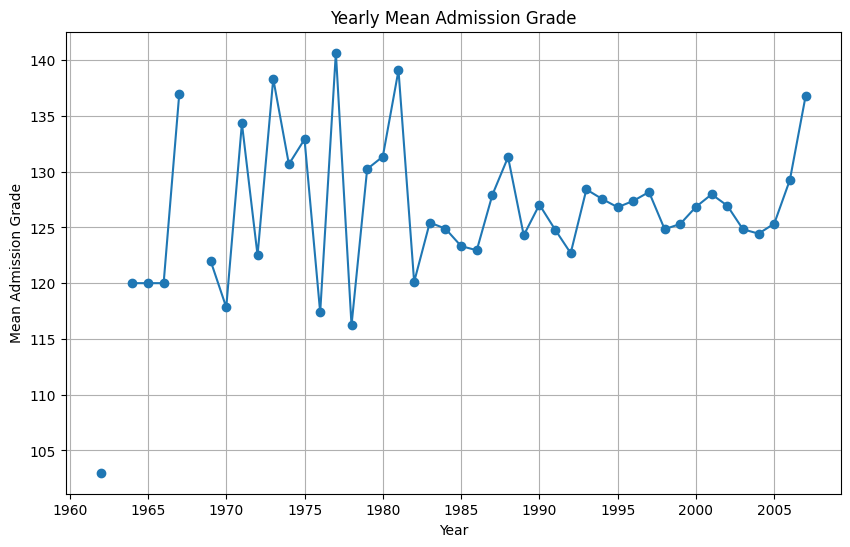

In [39]:
import pandas as pd

# Time Series Analysis

import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('cleaned_data.csv')

# Convert the 'AGE_AT_ENROLLMENT' to an integer representing the year
data['ENROLLMENT_YEAR'] = 2023 - data['AGE_AT_ENROLLMENT'].astype(int)

# Create a datetime object from the 'ENROLLMENT_YEAR'
data['ENROLLMENT_YEAR'] = pd.to_datetime(data['ENROLLMENT_YEAR'], format='%Y')

# Set the 'ENROLLMENT_YEAR' as the index
data.set_index('ENROLLMENT_YEAR', inplace=True)

# Resample the data to yearly frequency and calculate the mean admission grade per year
yearly_admission_grade = data['ADMISSION_GRADE'].resample('Y').mean()

# Plot the time series
plt.figure(figsize=(10, 6))
plt.plot(yearly_admission_grade, marker='o', linestyle='-')
plt.title('Yearly Mean Admission Grade')
plt.xlabel('Year')
plt.ylabel('Mean Admission Grade')
plt.grid(True)
plt.show()

In [40]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Initialize the KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=5)

# Train the KNeighborsClassifier
knn_model.fit(X_train_balanced, y_train_balanced)

# Predict on the validation set
y_val_pred_knn = knn_model.predict(X_val)

# Evaluate the KNeighborsClassifier model
accuracy_knn = accuracy_score(y_val, y_val_pred_knn)
class_report_knn = classification_report(y_val, y_val_pred_knn)
conf_matrix_knn = confusion_matrix(y_val, y_val_pred_knn)

print(f"K-Nearest Neighbors Model Accuracy: {accuracy_knn:.2f}")
print("Classification Report:\n", class_report_knn)
print("Confusion Matrix:\n", conf_matrix_knn)

K-Nearest Neighbors Model Accuracy: 0.60
Classification Report:
               precision    recall  f1-score   support

           0       0.43      0.36      0.39       132
           1       0.35      0.32      0.34       121
           2       0.72      0.80      0.76       347

    accuracy                           0.60       600
   macro avg       0.50      0.49      0.50       600
weighted avg       0.59      0.60      0.59       600

Confusion Matrix:
 [[ 47  33  52]
 [ 29  39  53]
 [ 33  38 276]]


In [98]:
from sklearn.model_selection import train_test_split
# Cap all numerical columns to 2 decimal places
data = data.round(2)
X = data.copy()  # Define X as a copy of data

# Define X_train and X_test
X_train, X_test = train_test_split(X, test_size=0.2, random_state=42)

X = X.round(2)
X_train = X_train.round(2)
X_test = X_test.round(2)

In [99]:
# Rank the previous qualification numbers
previous_qualification_ranks = data['PREVIOUS_QUALIFICATION'].rank()

# Display the ranked previous qualification numbers
print("Ranked Previous Qualification Numbers:")
print(previous_qualification_ranks)

Ranked Previous Qualification Numbers:
0       1601.0
1       1601.0
2       1601.0
3       3416.5
4       1601.0
         ...  
3743    1601.0
3744    1601.0
3745    1601.0
3746    1601.0
3747    1601.0
Name: PREVIOUS_QUALIFICATION, Length: 3748, dtype: float64


In [100]:
# Load the test dataset
test_data = pd.read_csv('test.csv')

# Define the mapping for 'PREVIOUS_QUALIFICATION'
previous_qualification_labels = {
    1: 'High School',
    39: 'Vocational Training',
    19: 'Undergraduate Degree',
    3: 'Postgraduate Degree',
    42: 'Professional Certification',
    40: 'Associate Degree',
    12: 'Diploma',
    2: 'Secondary School',
    6: 'Technical School',
    4: 'Other'
}

# Map the numerical values to text labels
test_data['PREVIOUS_QUALIFICATION'] = test_data['PREVIOUS_QUALIFICATION'].map(previous_qualification_labels)

# Save the updated dataset to a new CSV file
test_data.to_csv('test_updated.csv', index=False)

In [101]:
# Merge columns for 1st semester and 2nd semester data

# Create new columns by summing the respective 1st and 2nd semester columns
data['TOTAL_CREDITED'] = data['CURRICULAR_UNITS_1ST_SEM_CREDITED'] + data['CURRICULAR_UNITS_2ND_SEM_CREDITED']
data['TOTAL_ENROLLED'] = data['CURRICULAR_UNITS_1ST_SEM_ENROLLED'] + data['CURRICULAR_UNITS_2ND_SEM_ENROLLED']
data['TOTAL_EVALUATIONS'] = data['CURRICULAR_UNITS_1ST_SEM_EVALUATIONS'] + data['CURRICULAR_UNITS_2ND_SEM_EVALUATIONS']
data['TOTAL_APPROVED'] = data['CURRICULAR_UNITS_1ST_SEM_APPROVED'] + data['CURRICULAR_UNITS_2ND_SEM_APPROVED']
data['TOTAL_GRADE'] = data['CURRICULAR_UNITS_1ST_SEM_GRADE'] + data['CURRICULAR_UNITS_2ND_SEM_GRADE']
data['TOTAL_WITHOUT_EVALUATIONS'] = data['CURRICULAR_UNITS_1ST_SEM_WITHOUT_EVALUATIONS'] + data['CURRICULAR_UNITS_2ND_SEM_WITHOUT_EVALUATIONS']



# Display the first few rows to verify the changes
print(data.head())

  MARITAL_STATUS APPLICATION_MODE  APPLICATION_ORDER    COURSE  \
0         single            Other                  1     Other   
1         single           Mode_2                  2     Other   
2        married           Mode_3                  1     Other   
3        married           Mode_3                  1     Other   
4         single           Mode_1                  1  Course_1   

   PREVIOUS_QUALIFICATION  PREVIOUS_QUALIFICATION_GRADE NATIONALITY  \
0                       1                         160.0       Local   
1                       1                         122.0       Local   
2                       1                         100.0       Local   
3                      19                         133.1       Local   
4                       1                         142.0       Local   

   MOTHER_QUALIFICATION  FATHER_QUALIFICATION  MOTHER_OCCUPATION  ...  \
0                     1                     3                  3  ...   
1                    38       

In [102]:
# Drop the original 1st and 2nd semester columns
#data.drop(columns=[
    #'CURRICULAR_UNITS_1ST_SEM_CREDITED', 'CURRICULAR_UNITS_2ND_SEM_CREDITED',
    #'CURRICULAR_UNITS_1ST_SEM_ENROLLED', 'CURRICULAR_UNITS_2ND_SEM_ENROLLED',
    #'CURRICULAR_UNITS_1ST_SEM_EVALUATIONS', 'CURRICULAR_UNITS_2ND_SEM_EVALUATIONS',
    #'CURRICULAR_UNITS_1ST_SEM_APPROVED', 'CURRICULAR_UNITS_2ND_SEM_APPROVED',
    #'CURRICULAR_UNITS_1ST_SEM_GRADE', 'CURRICULAR_UNITS_2ND_SEM_GRADE',
    #'CURRICULAR_UNITS_1ST_SEM_WITHOUT_EVALUATIONS', 'CURRICULAR_UNITS_2ND_SEM_WITHOUT_EVALUATIONS'
#], inplace=True)

In [103]:
cleaned_data.to_csv('test.csv', index=False)

# EDA

In [169]:
# Distribution of target variable based on the original data (enrolled, graduate, dropout)
target_distribution = data['TARGET'].value_counts(normalize=True) * 100
target_labels = {1: 'Enrolled', 2: 'Graduate', 0: 'Dropout'}

# Map the target values to their respective labels
target_distribution.index = target_distribution.index.map(target_labels)

# Print the distribution
print("Distribution of target variable (Enrolled, Graduate, Dropout):")
print(target_distribution)

Distribution of target variable (Enrolled, Graduate, Dropout):
TARGET
Graduate    56.937033
Dropout     23.345784
Enrolled    19.717182
Name: proportion, dtype: float64


In [105]:
import matplotlib.pyplot as plt
import seaborn as sns

Distribution of the target variable:
TARGET
Graduate    2134
Dropout      875
Enrolled     739
Name: count, dtype: int64


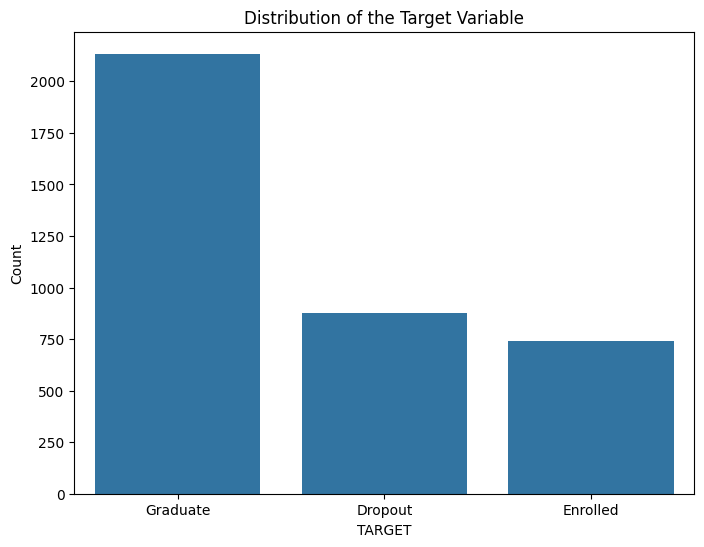

Proportion of each class in the target variable:
TARGET
Graduate    56.937033
Dropout     23.345784
Enrolled    19.717182
Name: proportion, dtype: float64


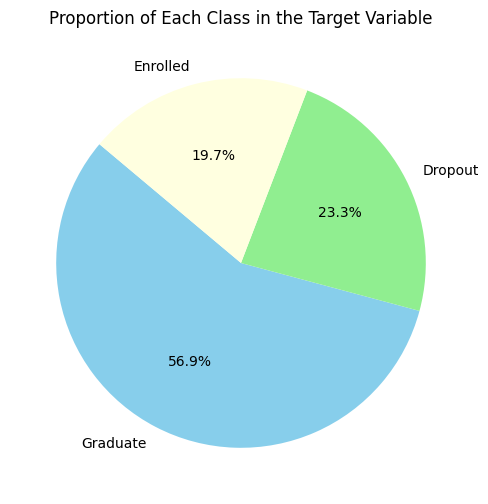

In [106]:
# Analyze the target variable

# Distribution of the target variable
target_counts = data['TARGET'].value_counts()
print("Distribution of the target variable:")
print(target_counts)

# Plot the distribution of the target variable
plt.figure(figsize=(8, 6))
sns.countplot(x='TARGET', data=data)
plt.title('Distribution of the Target Variable')
# plt.xlabel('Target (0: Dropout, 1: Graduate)')
plt.ylabel('Count')
plt.show()

# Calculate the proportion of each class in the target variable
target_proportions = data['TARGET'].value_counts(normalize=True) * 100
print("Proportion of each class in the target variable:")
print(target_proportions)

# Plot the proportion of each class in the target variable
plt.figure(figsize=(8, 6))
target_proportions.plot(kind='pie', autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightgreen', 'lightyellow'])
plt.title('Proportion of Each Class in the Target Variable')
plt.ylabel('')
plt.show()

Gender Distribution:
GENDER
Female    2556
Male      1192
Name: count, dtype: int64
Nationality Distribution:
NATIONALITY
Local            3653
International      95
Name: count, dtype: int64


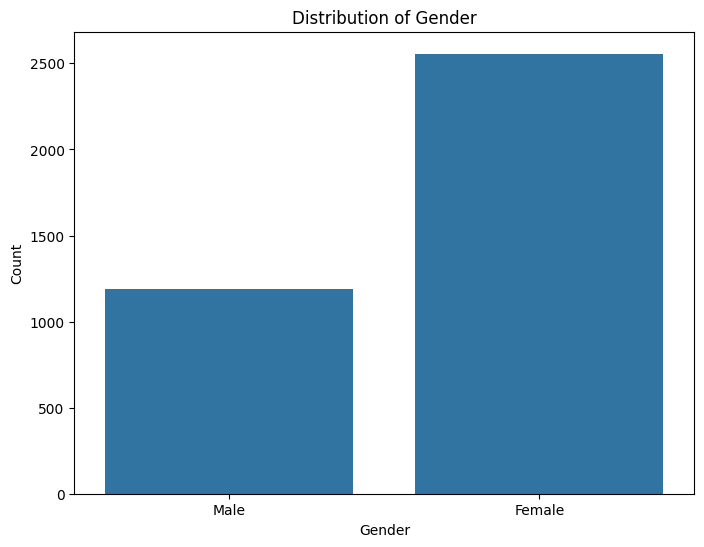

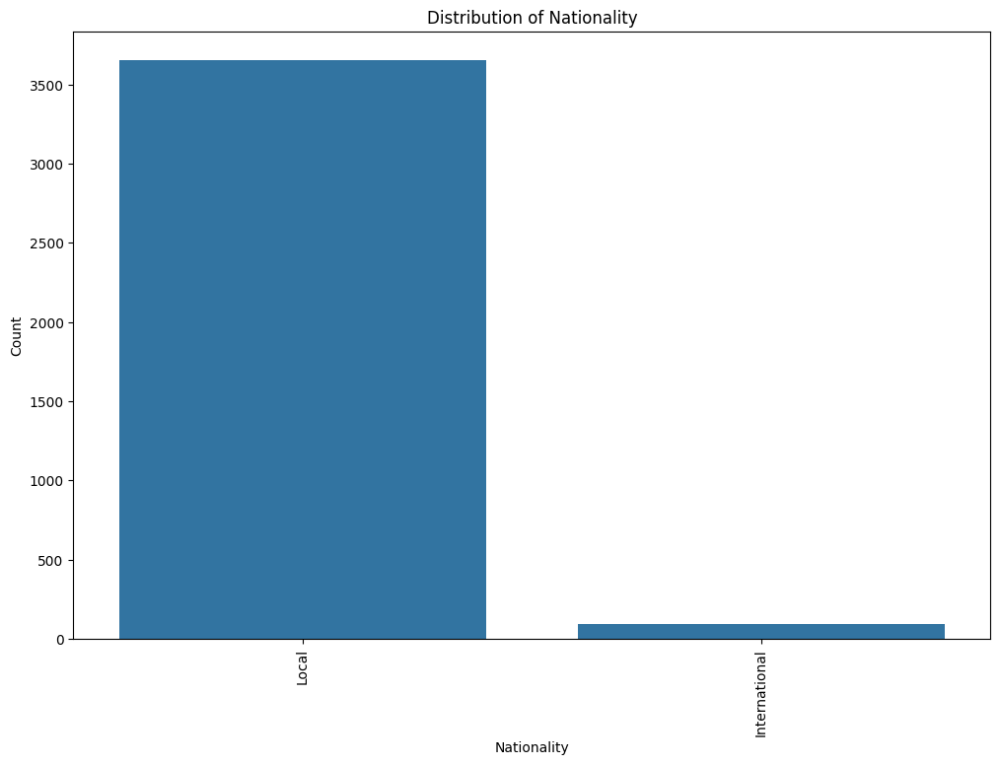

Mean Admission Grade by Gender:
GENDER
Female    126.365258
Male      127.012198
Name: ADMISSION_GRADE, dtype: float64
Mean Admission Grade by Nationality:
NATIONALITY
International    127.927579
Local            126.535730
Name: ADMISSION_GRADE, dtype: float64


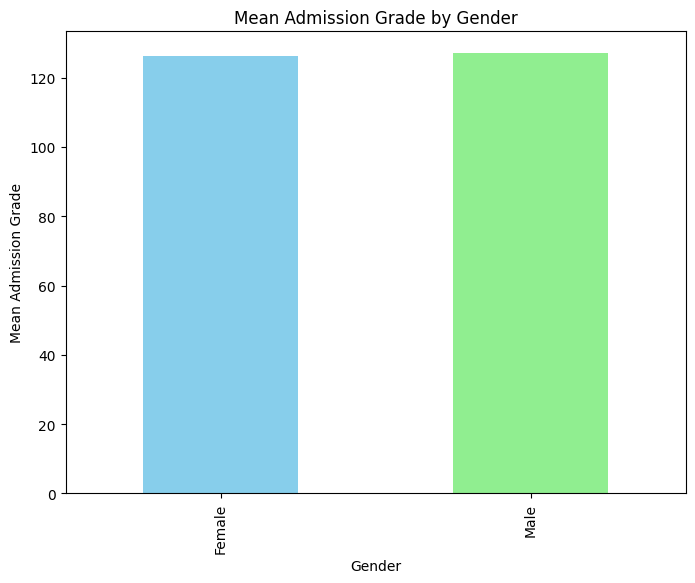

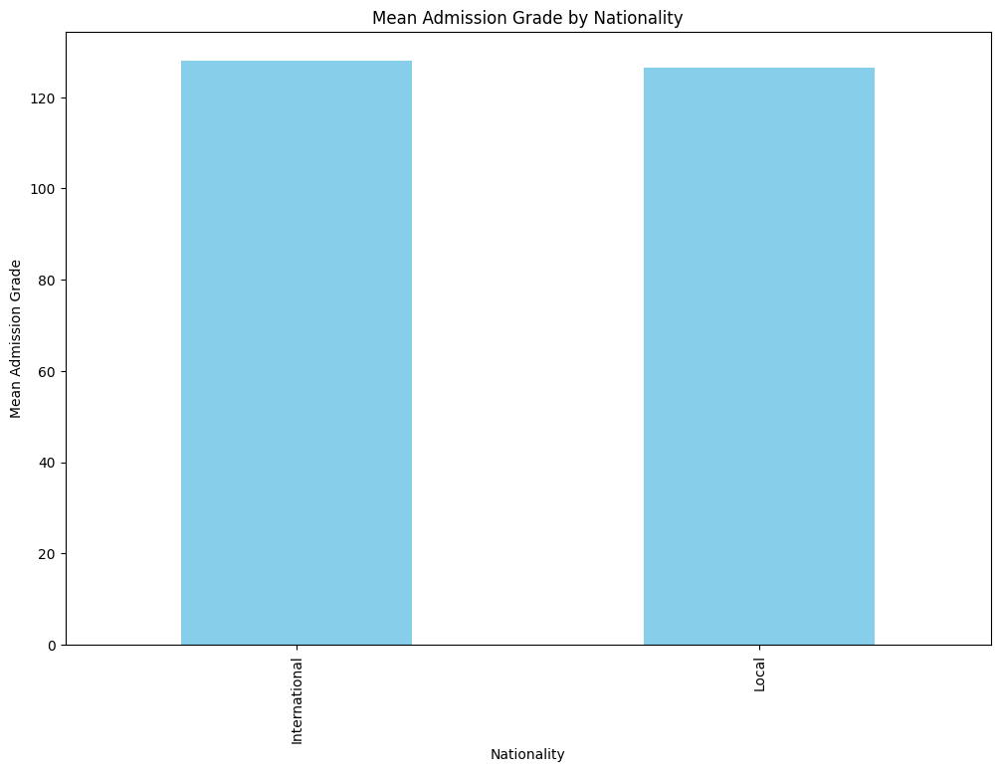

In [107]:
import matplotlib.pyplot as plt

# Analyze data by gender and nationality

# Distribution of gender
gender_distribution = data['GENDER'].value_counts()
print("Gender Distribution:")
print(gender_distribution)

# Distribution of nationality
nationality_distribution = data['NATIONALITY'].value_counts()
print("Nationality Distribution:")
print(nationality_distribution)

# Plot the distribution of gender
plt.figure(figsize=(8, 6))
sns.countplot(x='GENDER', data=data)
plt.title('Distribution of Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()

# Plot the distribution of nationality
plt.figure(figsize=(12, 8))
sns.countplot(x='NATIONALITY', data=data)
plt.title('Distribution of Nationality')
plt.xlabel('Nationality')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

# Analyze the average admission grade by gender
mean_admission_grade_gender = data.groupby('GENDER')['ADMISSION_GRADE'].mean()
print("Mean Admission Grade by Gender:")
print(mean_admission_grade_gender)

# Analyze the average admission grade by nationality
mean_admission_grade_nationality = data.groupby('NATIONALITY')['ADMISSION_GRADE'].mean()
print("Mean Admission Grade by Nationality:")
print(mean_admission_grade_nationality)

# Plot the average admission grade by gender
plt.figure(figsize=(8, 6))
mean_admission_grade_gender.plot(kind='bar', color=['skyblue', 'lightgreen'])
plt.title('Mean Admission Grade by Gender')
plt.xlabel('Gender')
plt.ylabel('Mean Admission Grade')
plt.show()

# Plot the average admission grade by nationality
if not mean_admission_grade_nationality.empty:
    plt.figure(figsize=(12, 8))
    mean_admission_grade_nationality.plot(kind='bar', color='skyblue')
    plt.title('Mean Admission Grade by Nationality')
    plt.xlabel('Nationality')
    plt.ylabel('Mean Admission Grade')
    plt.xticks(rotation=90)
    plt.show()
else:
    print("No data available for mean admission grade by nationality.")


In [14]:
data = pd.read_csv('cleaned_data.csv')

In [ ]:
# Set up visualization style
sns.set(style="whitegrid")

# 1. Distribution of Success Rate
plt.figure(figsize=(8, 5))
sns.histplot(data["SUCCESS_RATE"], bins=20, kde=True, color="blue")
plt.title("Distribution of Success Rate")
plt.xlabel("Success Rate")
plt.ylabel("Count")
plt.show()

# 2. Dropout Rate by Age Group
plt.figure(figsize=(8, 5))
sns.barplot(x=data["AGE_GROUP"], y=data["DROPOUT"], estimator=np.mean, palette="coolwarm")
plt.title("Dropout Rate by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Dropout Probability")
plt.show()

# 3. Success Rate by Attendance Type
plt.figure(figsize=(8, 5))
sns.boxplot(x="ATTENDANCE", y="SUCCESS_RATE", data=data, palette="Set2")
plt.title("Success Rate by Attendance Type")
plt.xlabel("Attendance Type")
plt.ylabel("Success Rate")
plt.show()

# 4. Impact of Tuition Payment on Dropout
plt.figure(figsize=(8, 5))
sns.countplot(x="TUITION_FEES_UP_TO_DATE", hue="DROPOUT", data=data, palette="pastel")
plt.title("Effect of Tuition Payment on Dropout")
plt.xlabel("Tuition Fees Up-to-Date")
plt.ylabel("Count")
plt.legend(title="Dropout", labels=["No", "Yes"])
plt.show()

# 5. Correlation Heatmap
plt.figure(figsize=(10, 6))
corr_matrix = data.corr()
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()


In [108]:
# Analyze academic factors

# Calculate the mean, median, and mode of admission grades
mean_admission_grade = data['ADMISSION_GRADE'].mean()
median_admission_grade = data['ADMISSION_GRADE'].median()
mode_admission_grade = data['ADMISSION_GRADE'].mode()[0]

print(f"Mean Admission Grade: {mean_admission_grade:.2f}")
print(f"Median Admission Grade: {median_admission_grade:.2f}")
print(f"Mode Admission Grade: {mode_admission_grade:.2f}")

# Calculate the mean, median, and mode of average grades
mean_average_grade = data['AVERAGE_GRADE'].mean()
median_average_grade = data['AVERAGE_GRADE'].median()
mode_average_grade = data['AVERAGE_GRADE'].mode()[0]

print(f"Mean Average Grade: {mean_average_grade:.2f}")
print(f"Median Average Grade: {median_average_grade:.2f}")
print(f"Mode Average Grade: {mode_average_grade:.2f}")

# Calculate the mean, median, and mode of age at enrollment
mean_age_at_enrollment = data['AGE_AT_ENROLLMENT'].mean()
median_age_at_enrollment = data['AGE_AT_ENROLLMENT'].median()
mode_age_at_enrollment = data['AGE_AT_ENROLLMENT'].mode()[0]

print(f"Mean Age at Enrollment: {mean_age_at_enrollment:.2f}")
print(f"Median Age at Enrollment: {median_age_at_enrollment:.2f}")
print(f"Mode Age at Enrollment: {mode_age_at_enrollment:.2f}")

# Calculate the mean, median, and mode of first semester credits
mean_1st_sem_credits = data['CURRICULAR_UNITS_1ST_SEM_CREDITED'].mean()
median_1st_sem_credits = data['CURRICULAR_UNITS_1ST_SEM_CREDITED'].median()
mode_1st_sem_credits = data['CURRICULAR_UNITS_1ST_SEM_CREDITED'].mode()[0]

print(f"Mean 1st Semester Credits: {mean_1st_sem_credits:.2f}")
print(f"Median 1st Semester Credits: {median_1st_sem_credits:.2f}")
print(f"Mode 1st Semester Credits: {mode_1st_sem_credits:.2f}")

# Calculate the mean, median, and mode of second semester credits
mean_2nd_sem_credits = data['CURRICULAR_UNITS_2ND_SEM_CREDITED'].mean()
median_2nd_sem_credits = data['CURRICULAR_UNITS_2ND_SEM_CREDITED'].median()
mode_2nd_sem_credits = data['CURRICULAR_UNITS_2ND_SEM_CREDITED'].mode()[0]

print(f"Mean 2nd Semester Credits: {mean_2nd_sem_credits:.2f}")
print(f"Median 2nd Semester Credits: {median_2nd_sem_credits:.2f}")
print(f"Mode 2nd Semester Credits: {mode_2nd_sem_credits:.2f}")

# Calculate the mean, median, and mode of first semester approved units
mean_1st_sem_approved = data['CURRICULAR_UNITS_1ST_SEM_APPROVED'].mean()
median_1st_sem_approved = data['CURRICULAR_UNITS_1ST_SEM_APPROVED'].median()
mode_1st_sem_approved = data['CURRICULAR_UNITS_1ST_SEM_APPROVED'].mode()[0]

print(f"Mean 1st Semester Approved Units: {mean_1st_sem_approved:.2f}")
print(f"Median 1st Semester Approved Units: {median_1st_sem_approved:.2f}")
print(f"Mode 1st Semester Approved Units: {mode_1st_sem_approved:.2f}")

# Calculate the mean, median, and mode of second semester approved units
mean_2nd_sem_approved = data['CURRICULAR_UNITS_2ND_SEM_APPROVED'].mean()
median_2nd_sem_approved = data['CURRICULAR_UNITS_2ND_SEM_APPROVED'].median()
mode_2nd_sem_approved = data['CURRICULAR_UNITS_2ND_SEM_APPROVED'].mode()[0]

print(f"Mean 2nd Semester Approved Units: {mean_2nd_sem_approved:.2f}")
print(f"Median 2nd Semester Approved Units: {median_2nd_sem_approved:.2f}")
print(f"Mode 2nd Semester Approved Units: {mode_2nd_sem_approved:.2f}")

Mean Admission Grade: 126.57
Median Admission Grade: 126.00
Mode Admission Grade: 130.00
Mean Average Grade: 12.31
Median Average Grade: 12.54
Mode Average Grade: 12.00
Mean Age at Enrollment: 22.78
Median Age at Enrollment: 20.00
Mode Age at Enrollment: 18.00
Mean 1st Semester Credits: 0.81
Median 1st Semester Credits: 0.00
Mode 1st Semester Credits: 0.00
Mean 2nd Semester Credits: 0.62
Median 2nd Semester Credits: 0.00
Mode 2nd Semester Credits: 0.00
Mean 1st Semester Approved Units: 5.53
Median 1st Semester Approved Units: 6.00
Mode 1st Semester Approved Units: 6.00
Mean 2nd Semester Approved Units: 5.21
Median 2nd Semester Approved Units: 5.00
Mode 2nd Semester Approved Units: 6.00


C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\13864851.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='AGE_AT_ENROLLMENT', y='count', data=age_distribution, palette='Blues_d')


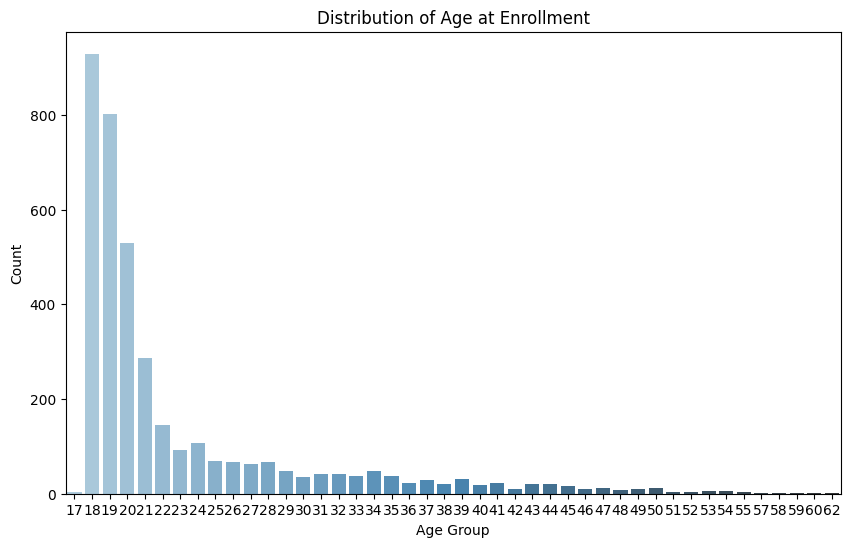

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\13864851.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='GENDER', y='count', data=gender_distribution, palette='Greens_d')


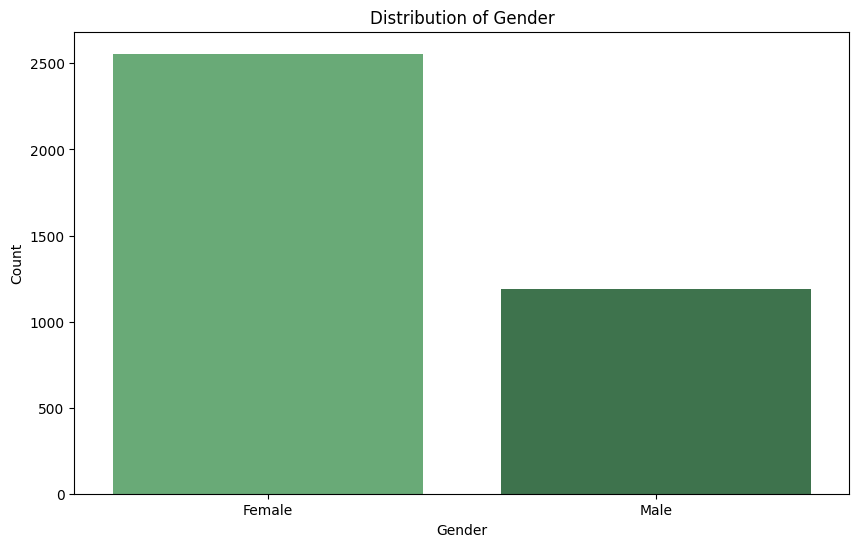

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\13864851.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='MARITAL_STATUS', y='count', data=marital_status_distribution, palette='Reds_d')


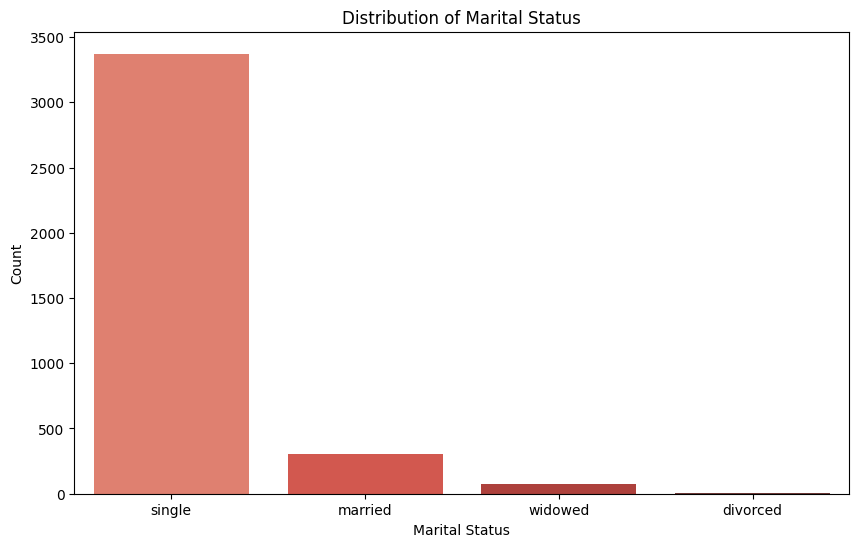

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\13864851.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='NATIONALITY', y='count', data=nationality_distribution, palette='Blues_d')


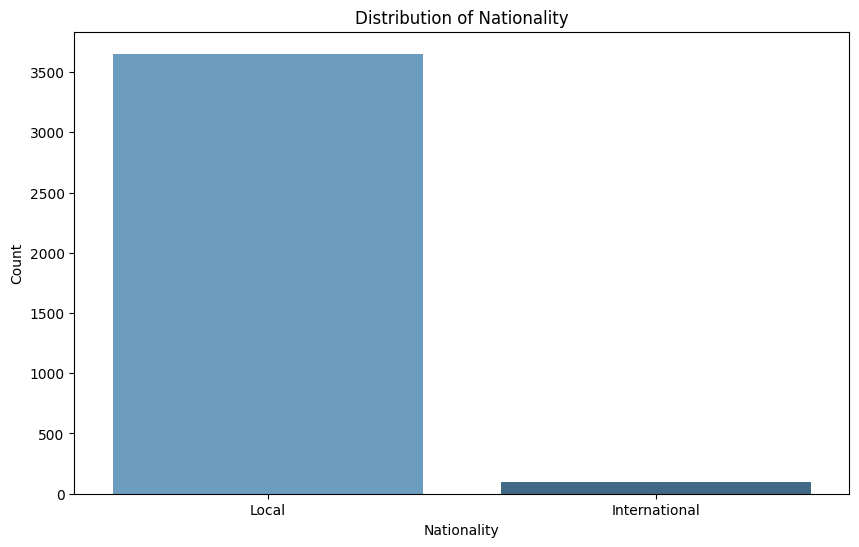

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\13864851.py:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='SCHOLARSHIP_HOLDER', y='count', data=scholarship_distribution, palette='Purples_d')


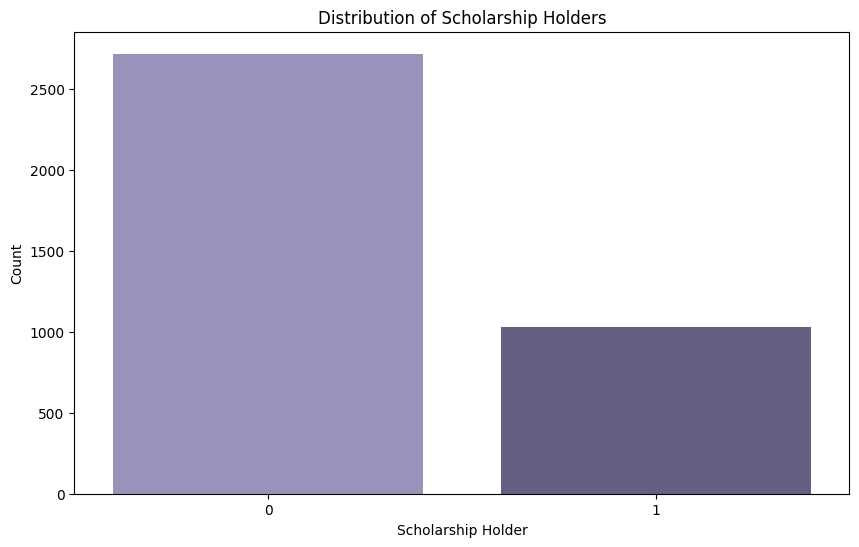

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\13864851.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='INTERNATIONAL', y='count', data=international_distribution, palette='YlOrBr')


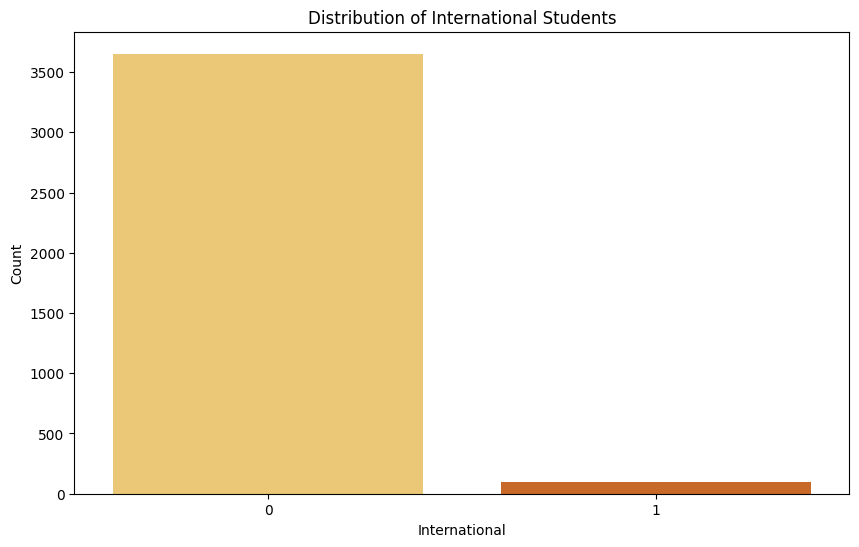

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\13864851.py:92: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='AGE_AT_ENROLLMENT', y='count', data=age_distribution, palette='Blues_d')


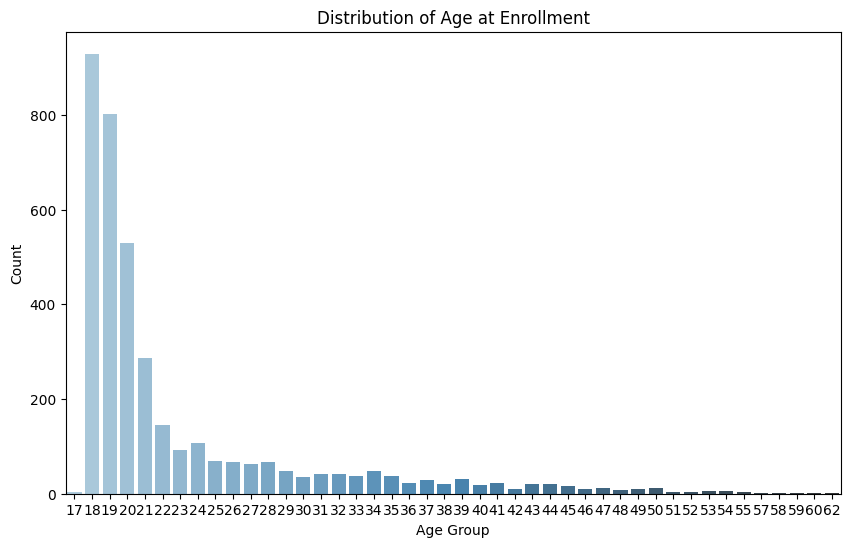

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\13864851.py:104: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='GENDER', y='count', data=gender_distribution, palette='Greens_d')


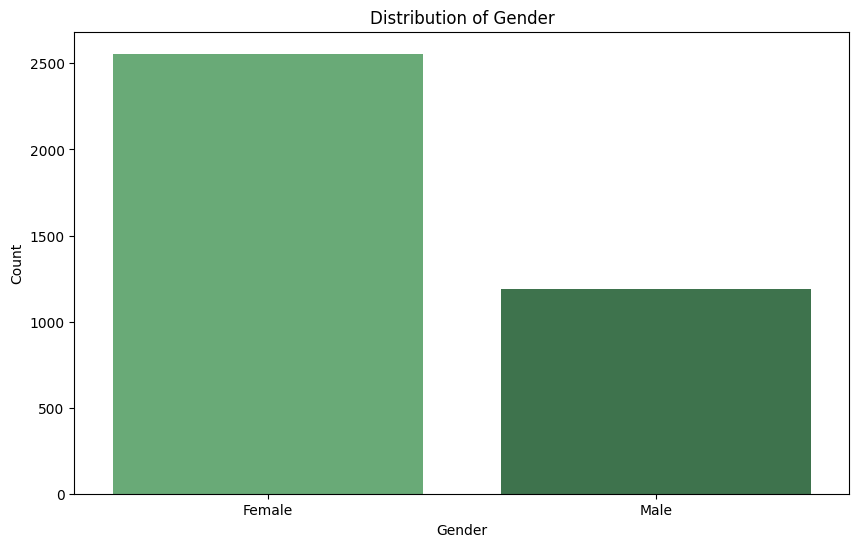

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\13864851.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='MARITAL_STATUS', y='count', data=marital_status_distribution, palette='Reds_d')


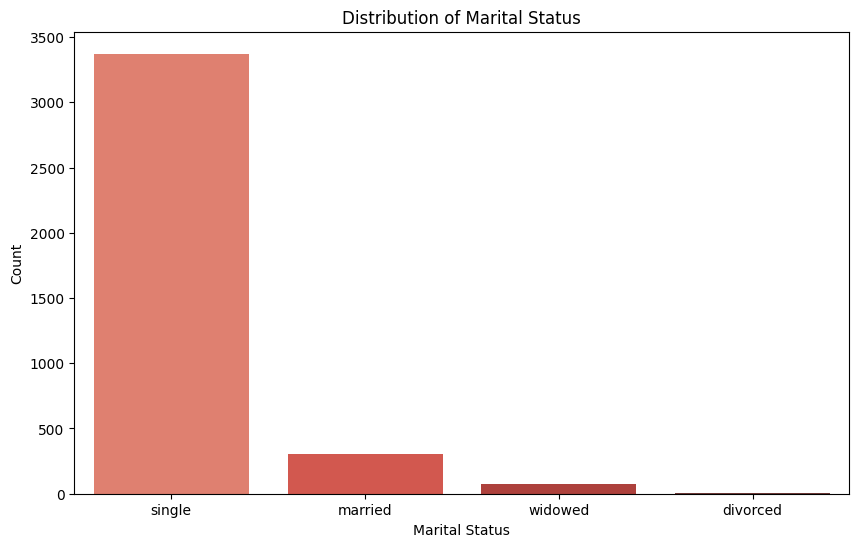

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\13864851.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='NATIONALITY', y='count', data=nationality_distribution, palette='Blues_d')


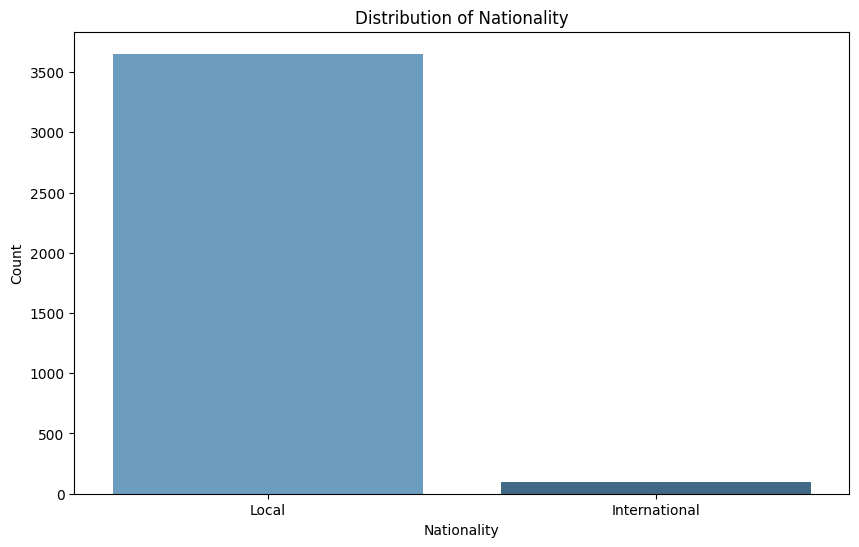

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\13864851.py:140: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='SCHOLARSHIP_HOLDER', y='count', data=scholarship_distribution, palette='Purples_d')


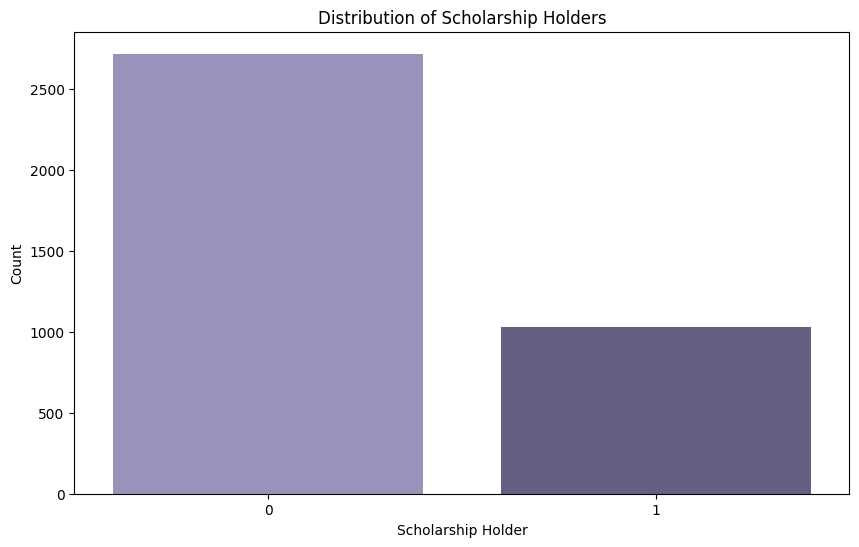

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\13864851.py:152: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='INTERNATIONAL', y='count', data=international_distribution, palette='YlOrBr')


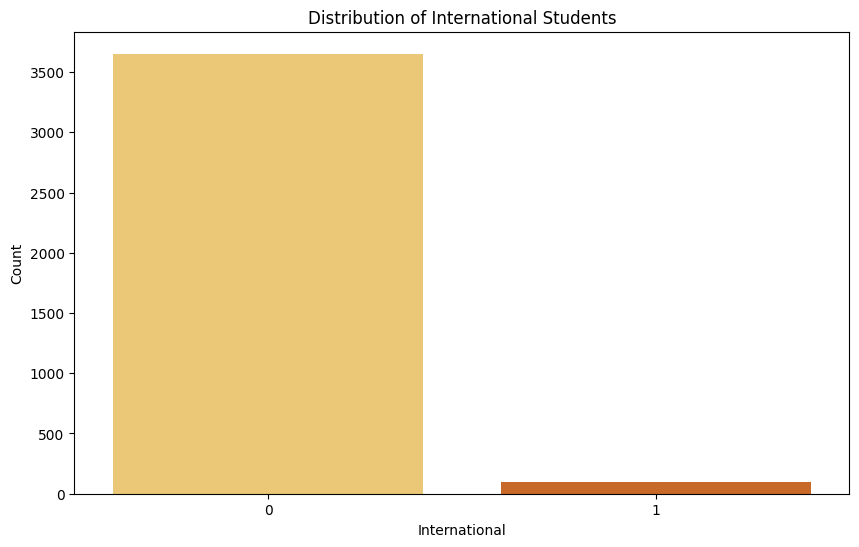

In [109]:
import pandas as pd
import seaborn as sns
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# Load the data
data = pd.read_csv('cleaned_data.csv')

# Analyze the distribution of age at enrollment
age_distribution = data['AGE_AT_ENROLLMENT'].value_counts().reset_index()
age_distribution.columns = ['AGE_AT_ENROLLMENT', 'count']

# Plot the distribution of age at enrollment
plt.figure(figsize=(10, 6))
sns.barplot(x='AGE_AT_ENROLLMENT', y='count', data=age_distribution, palette='Blues_d')
plt.title("Distribution of Age at Enrollment")
plt.xlabel("Age Group")
plt.ylabel("Count")
plt.show()

# Analyze the distribution of gender
gender_distribution = data['GENDER'].value_counts().reset_index()
gender_distribution.columns = ['GENDER', 'count']

# Plot the distribution of gender
plt.figure(figsize=(10, 6))
sns.barplot(x='GENDER', y='count', data=gender_distribution, palette='Greens_d')
plt.title("Distribution of Gender")
plt.xlabel("Gender")
plt.ylabel("Count")
plt.show()

# Analyze the distribution of marital status
marital_status_distribution = data['MARITAL_STATUS'].value_counts().reset_index()
marital_status_distribution.columns = ['MARITAL_STATUS', 'count']

# Plot the distribution of marital status
plt.figure(figsize=(10, 6))
sns.barplot(x='MARITAL_STATUS', y='count', data=marital_status_distribution, palette='Reds_d')
plt.title("Distribution of Marital Status")
plt.xlabel("Marital Status")
plt.ylabel("Count")
plt.show()

# Analyze the distribution of nationality
nationality_distribution = data['NATIONALITY'].value_counts().reset_index()
nationality_distribution.columns = ['NATIONALITY', 'count']

# Plot the distribution of nationality
plt.figure(figsize=(10, 6))
sns.barplot(x='NATIONALITY', y='count', data=nationality_distribution, palette='Blues_d')
plt.title("Distribution of Nationality")
plt.xlabel("Nationality")
plt.ylabel("Count")
plt.show()

# Analyze the distribution of scholarship holders
scholarship_distribution = data['SCHOLARSHIP_HOLDER'].value_counts().reset_index()
scholarship_distribution.columns = ['SCHOLARSHIP_HOLDER', 'count']

# Plot the distribution of scholarship holders
plt.figure(figsize=(10, 6))
sns.barplot(x='SCHOLARSHIP_HOLDER', y='count', data=scholarship_distribution, palette='Purples_d')
plt.title("Distribution of Scholarship Holders")
plt.xlabel("Scholarship Holder")
plt.ylabel("Count")
plt.show()

# Analyze the distribution of international students
international_distribution = data['INTERNATIONAL'].value_counts().reset_index()
international_distribution.columns = ['INTERNATIONAL', 'count']

# Plot the distribution of international students
plt.figure(figsize=(10, 6))
sns.barplot(x='INTERNATIONAL', y='count', data=international_distribution, palette='YlOrBr')
plt.title("Distribution of International Students")
plt.xlabel("International")
plt.ylabel("Count")
plt.show()

# Display the distributions

# Load the data
data = pd.read_csv('cleaned_data.csv')

# Analyze the distribution of age at enrollment
age_distribution = data['AGE_AT_ENROLLMENT'].value_counts().reset_index()
age_distribution.columns = ['AGE_AT_ENROLLMENT', 'count']

# Plot the distribution of age at enrollment
plt.figure(figsize=(10, 6))
sns.barplot(x='AGE_AT_ENROLLMENT', y='count', data=age_distribution, palette='Blues_d')
plt.title("Distribution of Age at Enrollment")
plt.xlabel("Age Group")
plt.ylabel("Count")
plt.show()

# Analyze the distribution of gender
gender_distribution = data['GENDER'].value_counts().reset_index()
gender_distribution.columns = ['GENDER', 'count']

# Plot the distribution of gender
plt.figure(figsize=(10, 6))
sns.barplot(x='GENDER', y='count', data=gender_distribution, palette='Greens_d')
plt.title("Distribution of Gender")
plt.xlabel("Gender")
plt.ylabel("Count")
plt.show()

# Analyze the distribution of marital status
marital_status_distribution = data['MARITAL_STATUS'].value_counts().reset_index()
marital_status_distribution.columns = ['MARITAL_STATUS', 'count']

# Plot the distribution of marital status
plt.figure(figsize=(10, 6))
sns.barplot(x='MARITAL_STATUS', y='count', data=marital_status_distribution, palette='Reds_d')
plt.title("Distribution of Marital Status")
plt.xlabel("Marital Status")
plt.ylabel("Count")
plt.show()

# Analyze the distribution of nationality
nationality_distribution = data['NATIONALITY'].value_counts().reset_index()
nationality_distribution.columns = ['NATIONALITY', 'count']

# Plot the distribution of nationality
plt.figure(figsize=(10, 6))
sns.barplot(x='NATIONALITY', y='count', data=nationality_distribution, palette='Blues_d')
plt.title("Distribution of Nationality")
plt.xlabel("Nationality")
plt.ylabel("Count")
plt.show()

# Analyze the distribution of scholarship holders
scholarship_distribution = data['SCHOLARSHIP_HOLDER'].value_counts().reset_index()
scholarship_distribution.columns = ['SCHOLARSHIP_HOLDER', 'count']

# Plot the distribution of scholarship holders
plt.figure(figsize=(10, 6))
sns.barplot(x='SCHOLARSHIP_HOLDER', y='count', data=scholarship_distribution, palette='Purples_d')
plt.title("Distribution of Scholarship Holders")
plt.xlabel("Scholarship Holder")
plt.ylabel("Count")
plt.show()

# Analyze the distribution of international students
international_distribution = data['INTERNATIONAL'].value_counts().reset_index()
international_distribution.columns = ['INTERNATIONAL', 'count']

# Plot the distribution of international students
plt.figure(figsize=(10, 6))
sns.barplot(x='INTERNATIONAL', y='count', data=international_distribution, palette='YlOrBr')
plt.title("Distribution of International Students")
plt.xlabel("International")
plt.ylabel("Count")
plt.show()

# Display the distributions


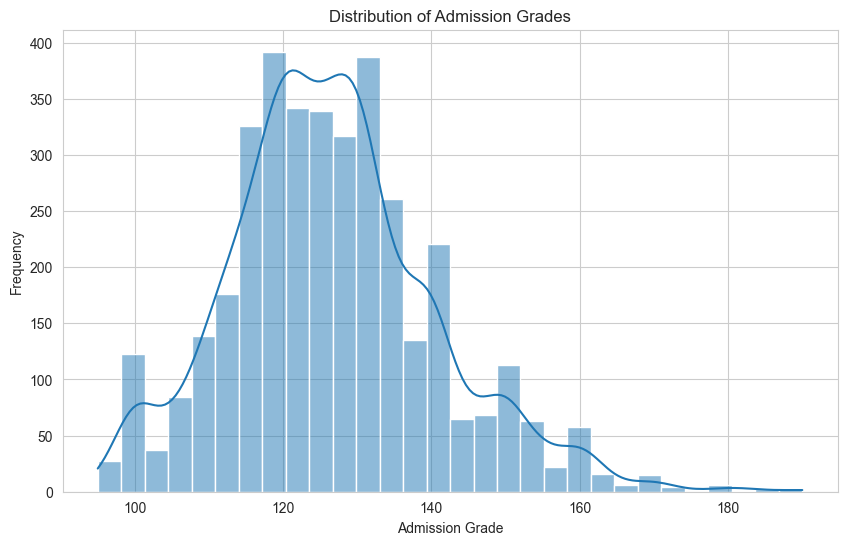

In [110]:
import seaborn as sns

# Exploratory Data Analysis (EDA)

import matplotlib.pyplot as plt

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Distribution of Admission Grades
plt.figure(figsize=(10, 6))
sns.histplot(data['ADMISSION_GRADE'], bins=30, kde=True)
plt.title('Distribution of Admission Grades')
plt.xlabel('Admission Grade')
plt.ylabel('Frequency')
plt.show()

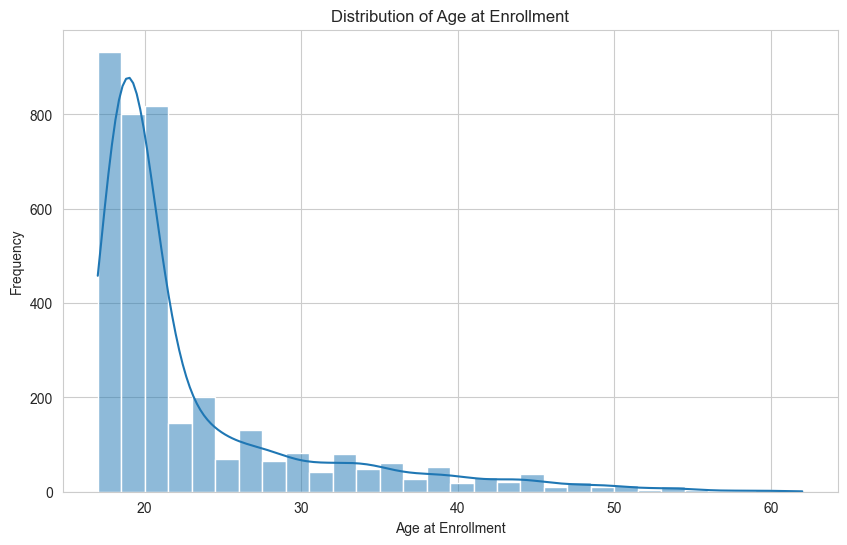

In [111]:
# Distribution of Age at Enrollment
plt.figure(figsize=(10, 6))
sns.histplot(data['AGE_AT_ENROLLMENT'], bins=30, kde=True)
plt.title('Distribution of Age at Enrollment')
plt.xlabel('Age at Enrollment')
plt.ylabel('Frequency')
plt.show()

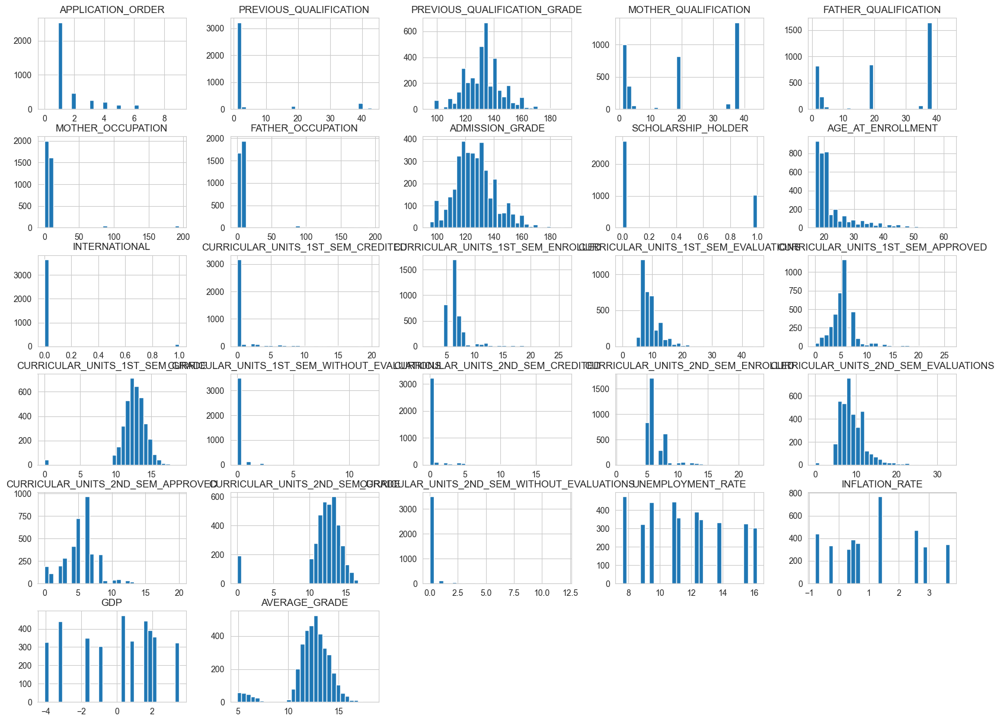

In [112]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histograms for numerical variables
data.hist(bins=30, figsize=(20, 15))
plt.show()

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\3290957444.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(cleaned_data['ADMISSION_GRADE'], shade=True, color='blue')


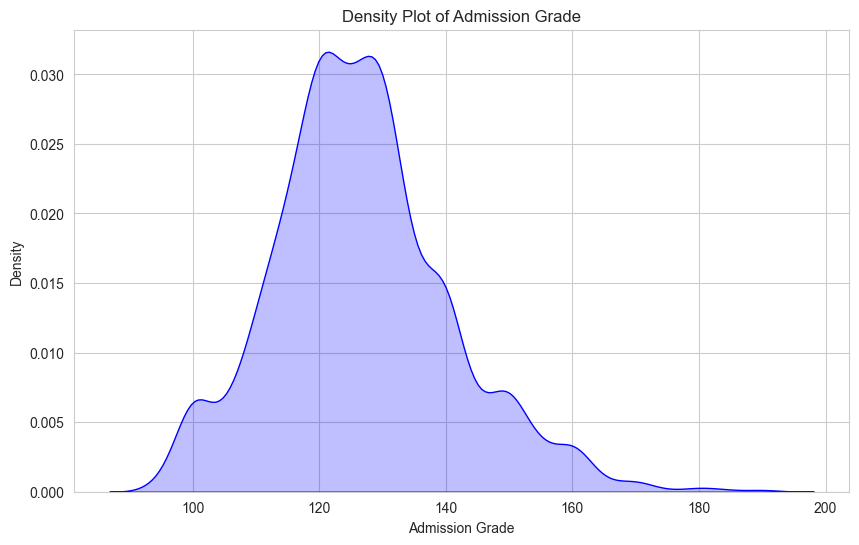

In [113]:
import seaborn as sns

import matplotlib.pyplot as plt

# Density plot for Admission Grade
plt.figure(figsize=(10, 6))
sns.kdeplot(cleaned_data['ADMISSION_GRADE'], shade=True, color='blue')
plt.title('Density Plot of Admission Grade')
plt.xlabel('Admission Grade')
plt.ylabel('Density')
plt.show()

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_55448\299853460.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(cleaned_data['AGE_AT_ENROLLMENT'], shade=True, color='green')


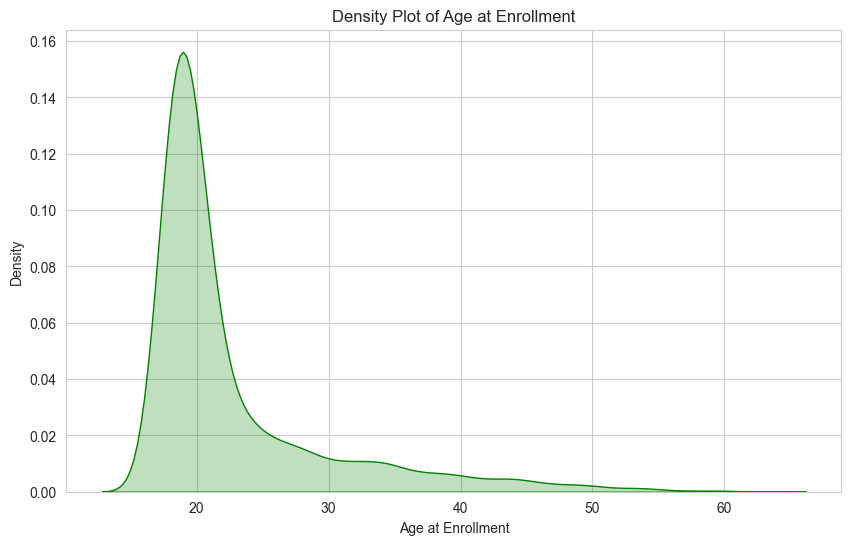

In [114]:
# Density plot for Age at Enrollment
plt.figure(figsize=(10, 6))
sns.kdeplot(cleaned_data['AGE_AT_ENROLLMENT'], shade=True, color='green')
plt.title('Density Plot of Age at Enrollment')
plt.xlabel('Age at Enrollment')
plt.ylabel('Density')
plt.show()

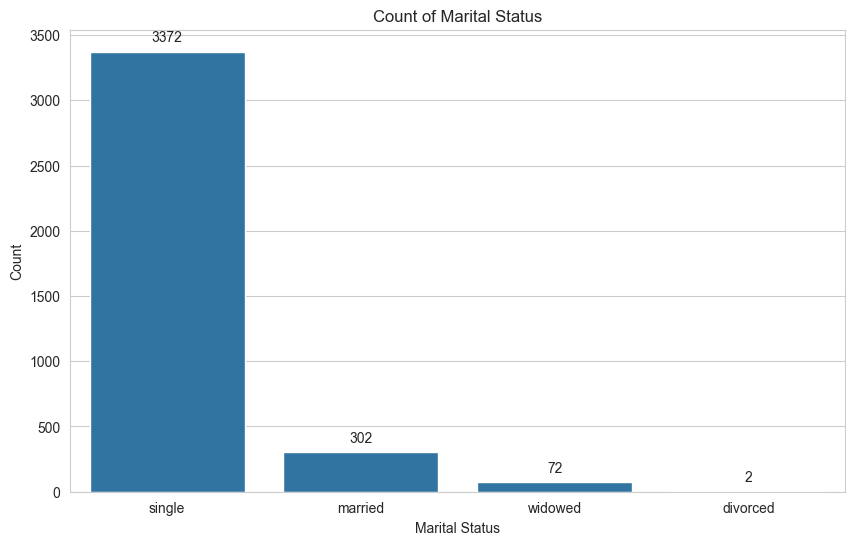

In [115]:
# Count plot of Marital Status with numbers at the top of each count
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='MARITAL_STATUS', data=data)
plt.title('Count of Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Count')

# Add numbers at the top of each bar
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.show()

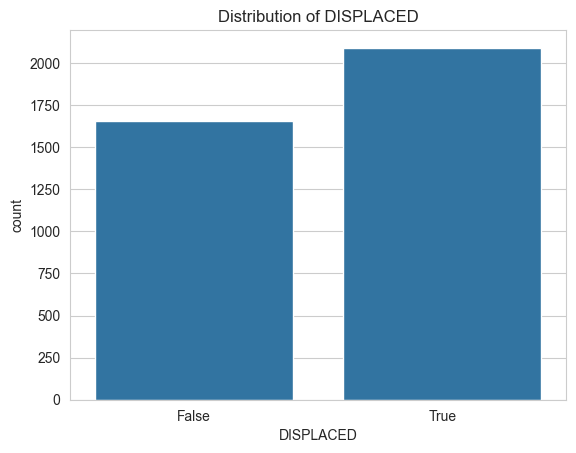

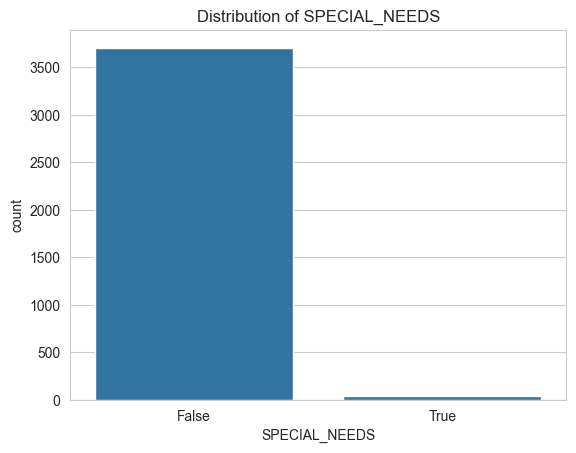

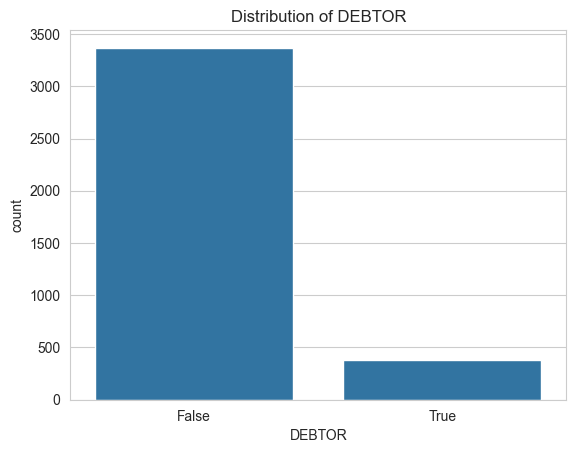

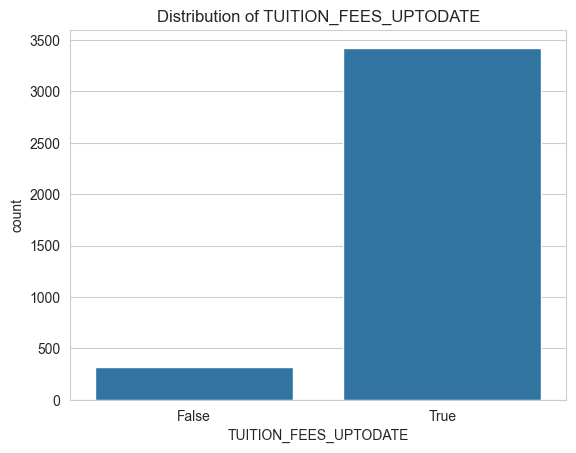

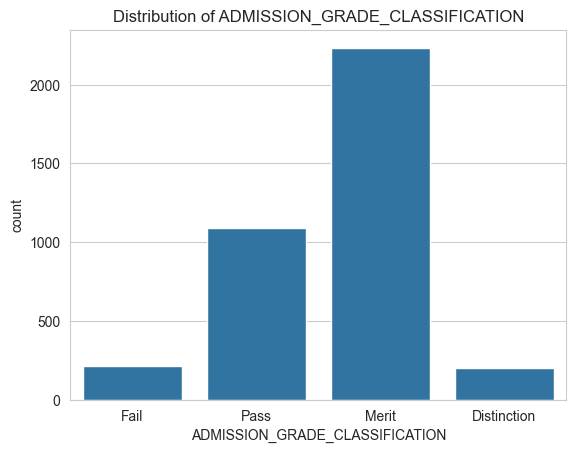

In [116]:
# Bar plots for categorical variables
for col in cleaned_data.select_dtypes(include=['category', 'bool']).columns:
    sns.countplot(x=col, data=cleaned_data)
    plt.title(f'Distribution of {col}')
    plt.show()

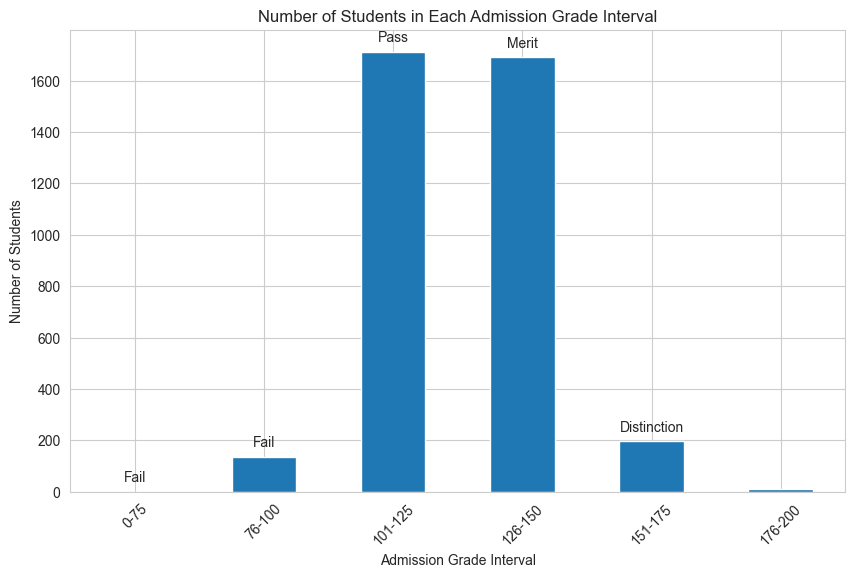

In [117]:
import matplotlib.pyplot as plt

# Define the grade boundaries for classification
grade_boundaries = [0, 75, 100, 125, 150, 175, 200]
grade_labels = ['0-75', '76-100', '101-125', '126-150', '151-175', '176-200']
grade_classification_labels = ['Fail', 'Fail', 'Pass', 'Merit', 'Distinction']

# Categorize 'ADMISSION_GRADE'
data['ADMISSION_GRADE_INTERVAL'] = pd.cut(data['ADMISSION_GRADE'], bins=grade_boundaries, labels=grade_labels, include_lowest=True)

# Plot the number of students in each interval
plt.figure(figsize=(10, 6))
ax = data['ADMISSION_GRADE_INTERVAL'].value_counts().sort_index().plot(kind='bar')
plt.title('Number of Students in Each Admission Grade Interval')
plt.xlabel('Admission Grade Interval')
plt.ylabel('Number of Students')
plt.xticks(rotation=45)

# Add labels at the top of each bar
for i, bar in enumerate(ax.patches):
    height = bar.get_height()
    if i < len(grade_classification_labels):
        label = grade_classification_labels[i]
    else:
        label = ''
    ax.annotate(f'{label}', (bar.get_x() + bar.get_width() / 2., height), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.show()

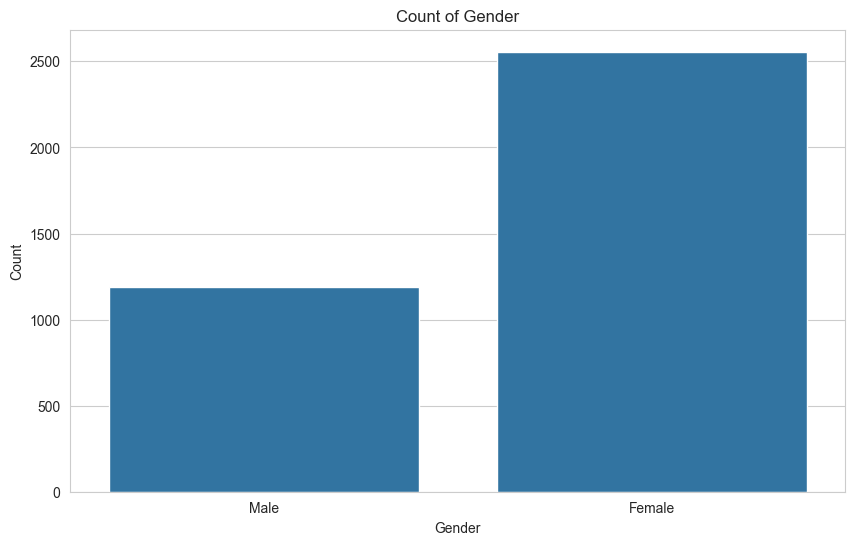

In [118]:
# Count plot of Gender
plt.figure(figsize=(10, 6))
sns.countplot(x='GENDER', data=data)
plt.title('Count of Gender')
plt.xlabel('Gender')
plt.ylabel('Count')

# Add labels for gender
data['GENDER'] = data['GENDER'].map({0: 'Female', 1: 'Male'})

plt.show()

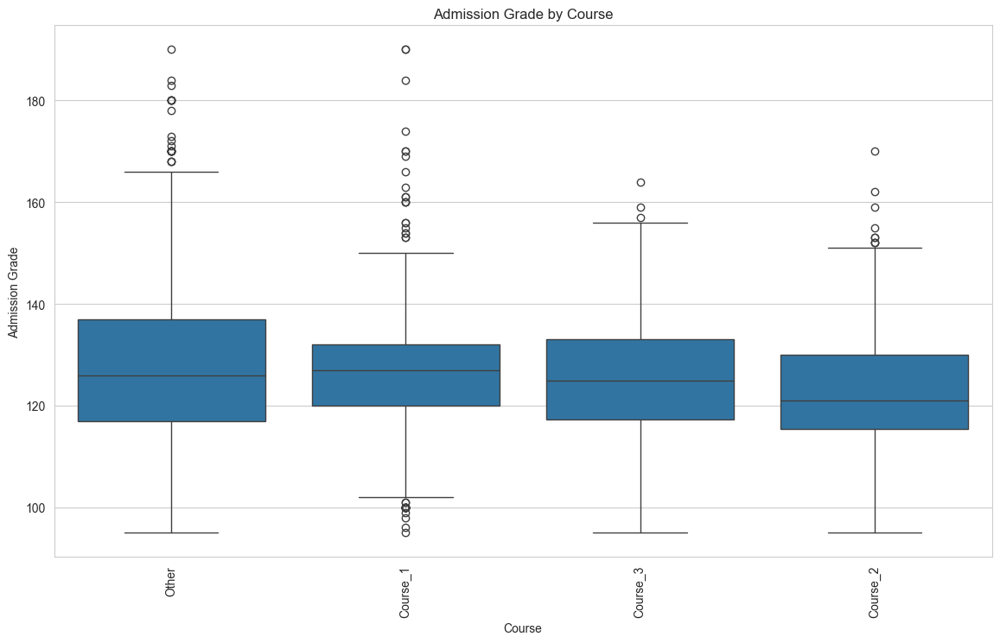

In [119]:
# Box plot of Admission Grade by Course
plt.figure(figsize=(14, 8))
sns.boxplot(x='COURSE', y='ADMISSION_GRADE', data=data)
plt.title('Admission Grade by Course')
plt.xlabel('Course')
plt.ylabel('Admission Grade')
plt.xticks(rotation=90)
plt.show()

GENDER
Female    126.420579
Male      127.124161
Name: ADMISSION_GRADE, dtype: float64


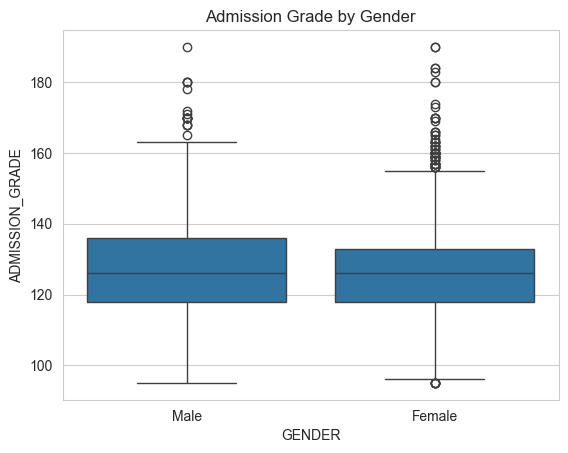

In [120]:
# Average admission grade by gender
print(cleaned_data.groupby('GENDER')['ADMISSION_GRADE'].mean())

# Boxplot of admission grade by gender
sns.boxplot(x='GENDER', y='ADMISSION_GRADE', data=cleaned_data)
plt.title('Admission Grade by Gender')
plt.show()

SCHOLARSHIP_HOLDER
0    12.142740
1    12.779563
Name: AVERAGE_GRADE, dtype: float64


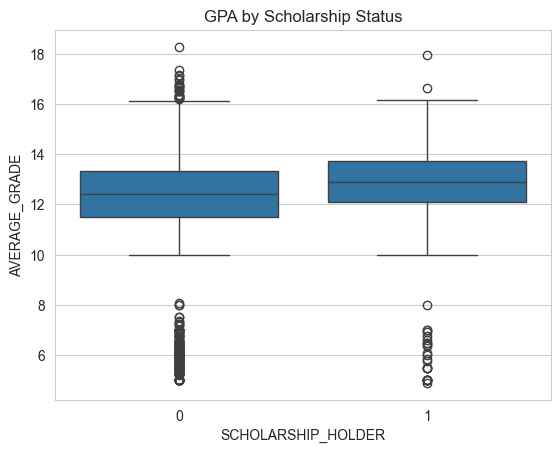

In [121]:
# Average GPA by scholarship status
print(cleaned_data.groupby('SCHOLARSHIP_HOLDER')['AVERAGE_GRADE'].mean())

# Boxplot of GPA by scholarship status
sns.boxplot(x='SCHOLARSHIP_HOLDER', y='AVERAGE_GRADE', data=cleaned_data)
plt.title('GPA by Scholarship Status')
plt.show()

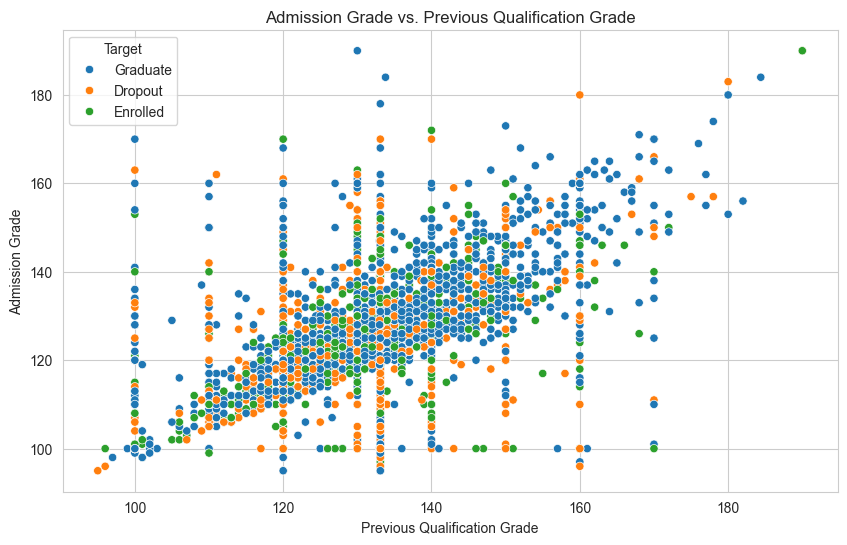

In [122]:
# Scatter plot of admission grade vs. previous qualification grade
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PREVIOUS_QUALIFICATION_GRADE', y='ADMISSION_GRADE', hue='TARGET', data=data)
plt.title('Admission Grade vs. Previous Qualification Grade')
plt.xlabel('Previous Qualification Grade')
plt.ylabel('Admission Grade')
plt.legend(title='Target')
plt.show()

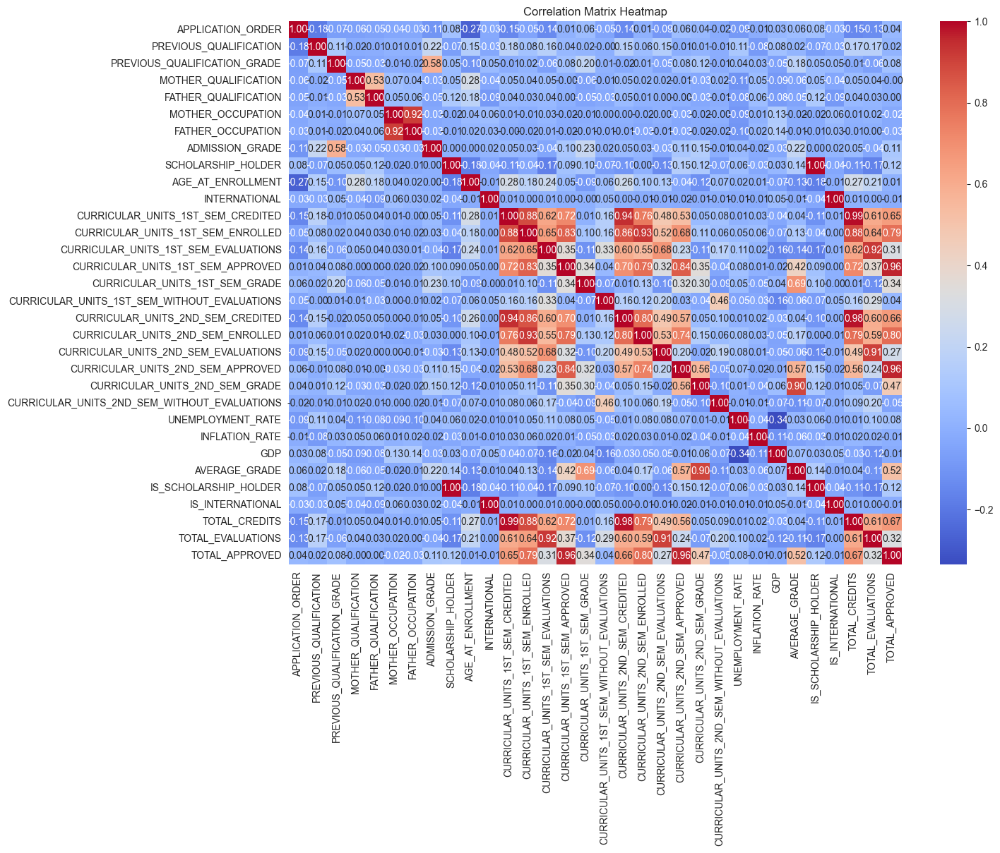

In [123]:
# Heatmap of Correlation Matrix
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap')
plt.show()

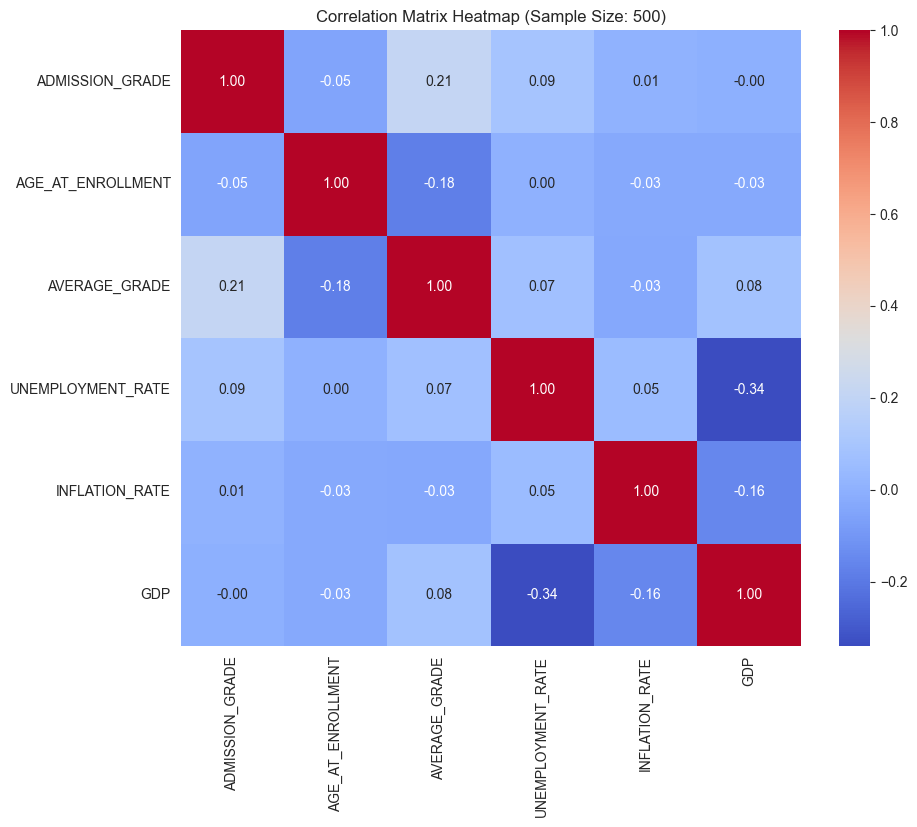

In [133]:
# Select the most insightful columns
insightful_columns = ['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'AVERAGE_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP']

# Create a smaller sample size
sample_data = data[insightful_columns].sample(n=500, random_state=42)

# Calculate the correlation matrix
sample_correlation_matrix = sample_data.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(sample_correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap (Sample Size: 500)')
plt.show()

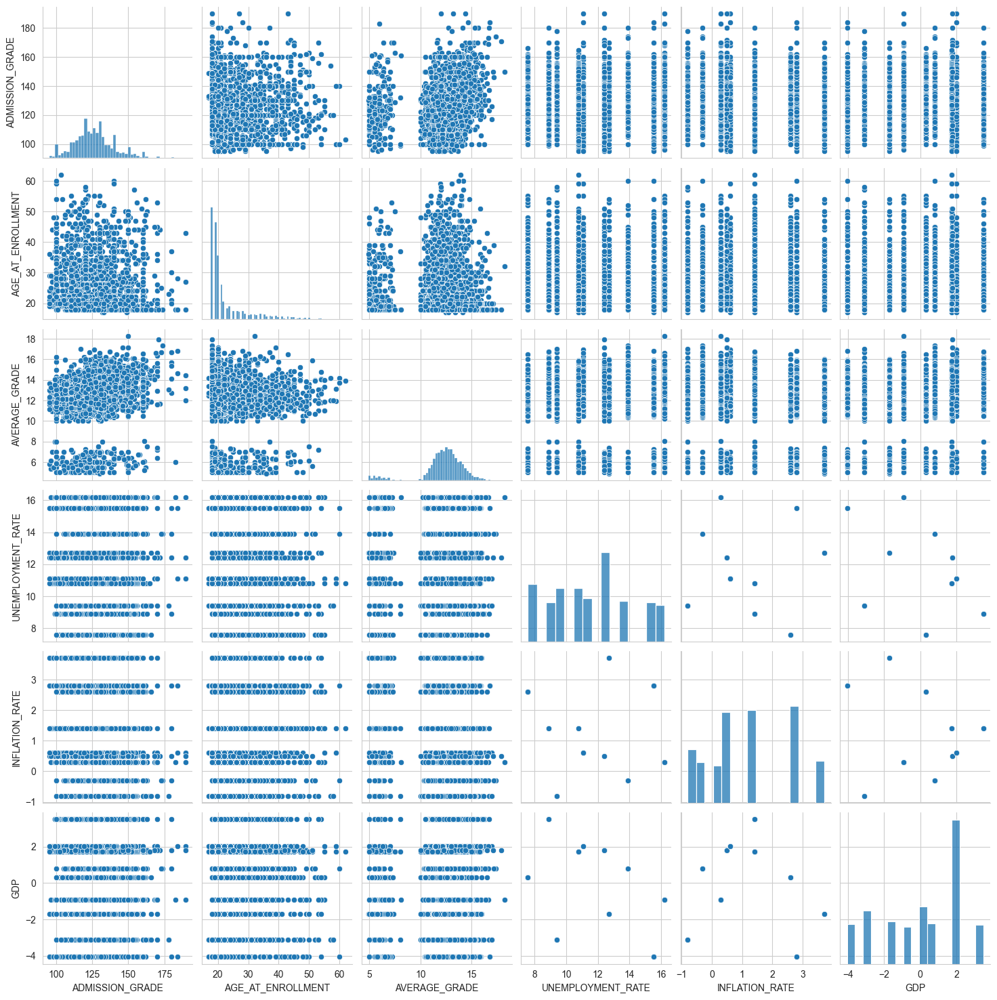

In [125]:
# Pairplot of selected continuous variables
selected_continuous_vars = ['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'AVERAGE_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP']
sns.pairplot(data[selected_continuous_vars])
plt.show()

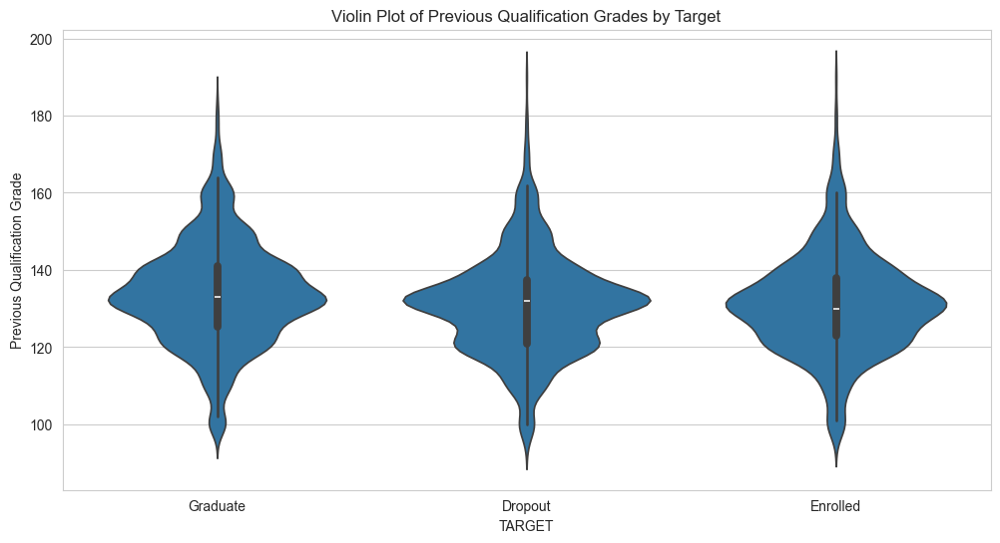

In [126]:
# Violin plot to visualize the distribution of previous qualification grades by target
plt.figure(figsize=(12, 6))
sns.violinplot(x='TARGET', y='PREVIOUS_QUALIFICATION_GRADE', data=data)
plt.title('Violin Plot of Previous Qualification Grades by Target')
#plt.xlabel('Target (0: Dropout, 1: Graduate)')
plt.ylabel('Previous Qualification Grade')
plt.show()

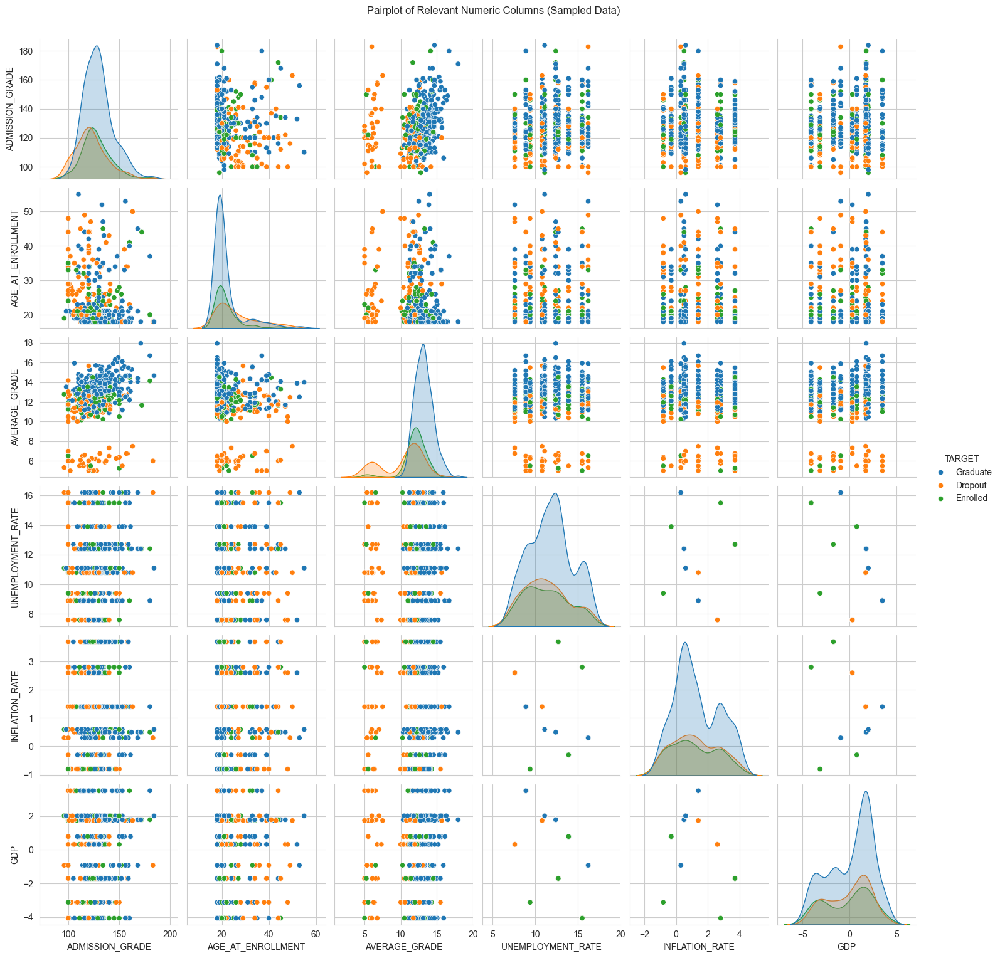

In [127]:
# Sample a subset of the data for faster plotting
sampled_data = data.sample(n=500, random_state=42)

# Define relevant numeric columns
relevant_numeric_columns = ['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'AVERAGE_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP']

# Create the pairplot
sns.pairplot(sampled_data[relevant_numeric_columns + ['TARGET']], hue='TARGET', diag_kind='kde')
plt.suptitle('Pairplot of Relevant Numeric Columns (Sampled Data)', y=1.02)
plt.show()

C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:3399: UserWarning: 68.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:3399: UserWarning: 26.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:3399: UserWarning: 42.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:3399: UserWarning: 72.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarni

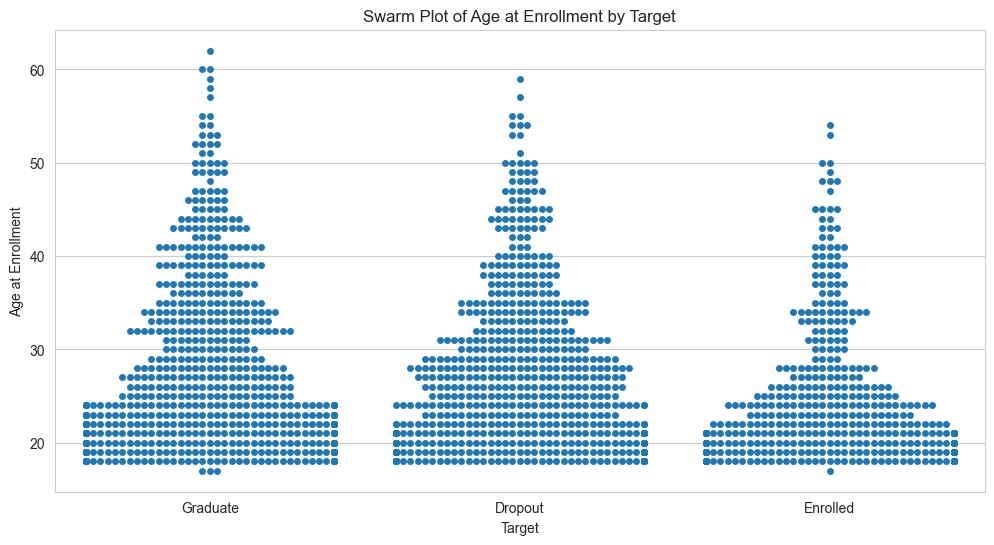

In [128]:
#  Swarm plot to visualize the distribution of age at enrollment by target
plt.figure(figsize=(12, 6))
sns.swarmplot(x='TARGET', y='AGE_AT_ENROLLMENT', data=data)
plt.title('Swarm Plot of Age at Enrollment by Target')
plt.xlabel('Target')
plt.ylabel('Age at Enrollment')
plt.show()

In [129]:
# Calculate the Pearson correlation coefficient between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT'
pearson_corr = data[['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT']].corr(method='pearson')
print("Pearson Correlation Coefficient between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT':")
print(pearson_corr)

Pearson Correlation Coefficient between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT':
                   ADMISSION_GRADE  AGE_AT_ENROLLMENT
ADMISSION_GRADE           1.000000           0.002219
AGE_AT_ENROLLMENT         0.002219           1.000000


In [130]:
# Calculate the Spearman correlation coefficient between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT'
spearman_corr = data[['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT']].corr(method='spearman')
print("Spearman Correlation Coefficient between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT':")
print(spearman_corr)

Spearman Correlation Coefficient between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT':
                   ADMISSION_GRADE  AGE_AT_ENROLLMENT
ADMISSION_GRADE           1.000000          -0.074523
AGE_AT_ENROLLMENT        -0.074523           1.000000


In [131]:
# Calculate the Kendall's tau correlation coefficient between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT'
kendall_tau_corr = data[['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT']].corr(method='kendall')
print("Kendall's Tau Correlation Coefficient between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT':")
print(kendall_tau_corr)

Kendall's Tau Correlation Coefficient between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT':
                   ADMISSION_GRADE  AGE_AT_ENROLLMENT
ADMISSION_GRADE           1.000000          -0.058186
AGE_AT_ENROLLMENT        -0.058186           1.000000


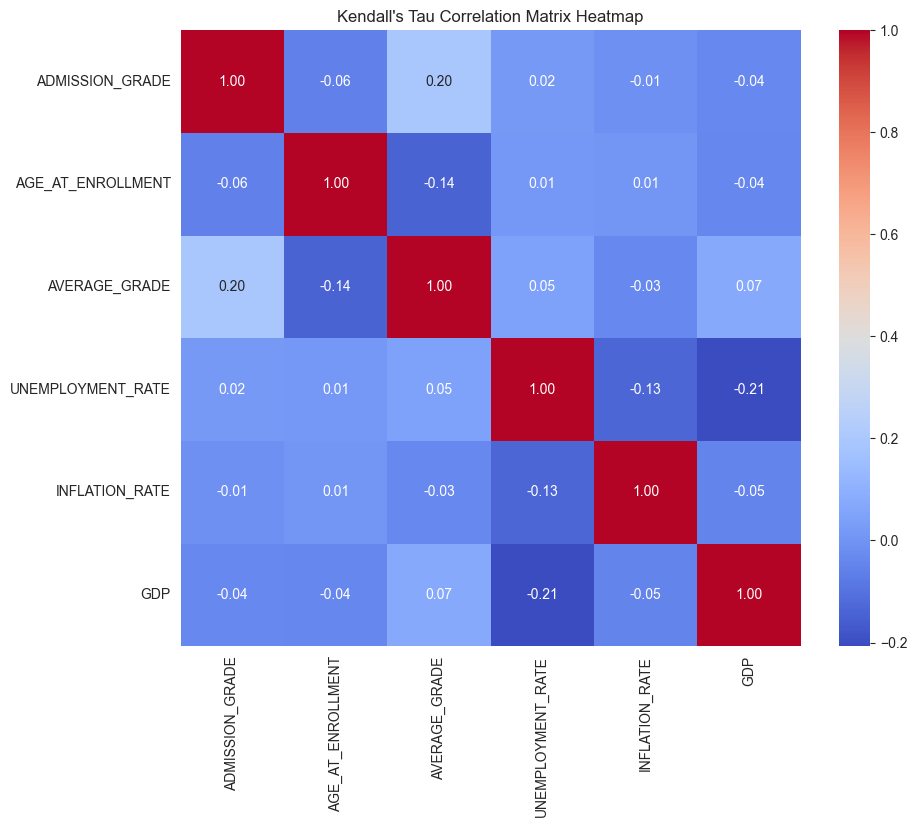

In [134]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select the most important numeric columns for the Kendall's tau correlation matrix
important_columns = ['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'AVERAGE_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP']

# Calculate the Kendall's tau correlation matrix for the selected columns
kendall_tau_corr_important = data[important_columns].corr(method='kendall')

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(kendall_tau_corr_important, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Kendall's Tau Correlation Matrix Heatmap")
plt.show()

In [135]:
#from wordcloud import WordCloud

#import matplotlib.pyplot as plt

# Generate a word cloud from the text data
#wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_data)

# Display the word cloud
#plt.figure(figsize=(10, 5))
#plt.imshow(wordcloud, interpolation='bilinear')
#plt.axis('off')
#plt.title('Word Cloud of Text Data')
#plt.show()

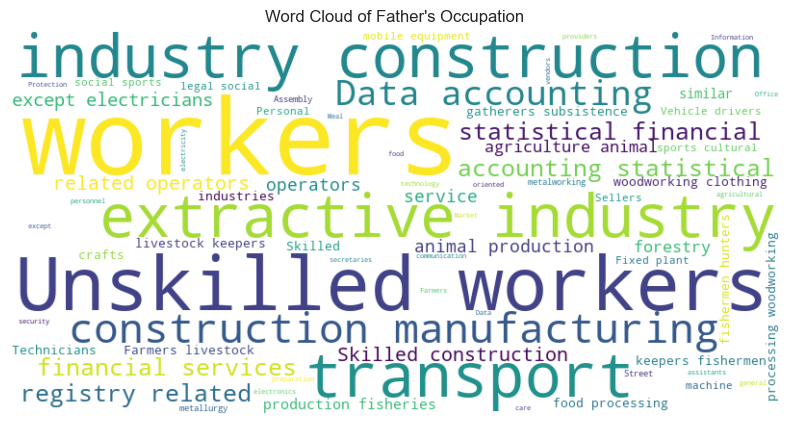

In [137]:
from wordcloud import WordCloud

import matplotlib.pyplot as plt

# Define the mapping for 'FATHER_OCCUPATION'
father_occupation_labels = {
    135: 'Technicians from legal, social, sports, cultural and similar services',
    141: 'Information and communication technology technicians',
    143: 'Office workers, secretaries in general and data processing operators',
    144: 'Data, accounting, statistical, financial services and registry-related operators',
    151: 'Personal service workers',
    152: 'Sellers',
    153: 'Personal care workers and the like',
    154: 'Protection and security services personnel',
    161: 'Market-oriented farmers and skilled agricultural and animal production workers',
    163: 'Farmers, livestock keepers, fishermen, hunters and gatherers, subsistence',
    171: 'Skilled construction workers and the like, except electricians',
    172: 'Skilled workers in metallurgy, metalworking and similar',
    174: 'Skilled workers in electricity and electronics',
    175: 'Workers in food processing, woodworking, clothing and other industries and crafts',
    181: 'Fixed plant and machine operators',
    182: 'Assembly workers',
    183: 'Vehicle drivers and mobile equipment operators',
    192: 'Unskilled workers in agriculture, animal production, fisheries and forestry',
    193: 'Unskilled workers in extractive industry, construction, manufacturing and transport',
    194: 'Meal preparation assistants',
    195: 'Street vendors (except food) and street service providers'
}

# Map the numerical values to text labels
data['FATHER_OCCUPATION_LABEL'] = data['FATHER_OCCUPATION'].map(father_occupation_labels)

# Combine all the occupation labels into a single string
text_data = ' '.join(data['FATHER_OCCUPATION_LABEL'].dropna().values)

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_data)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud of Father's Occupation")
plt.show()

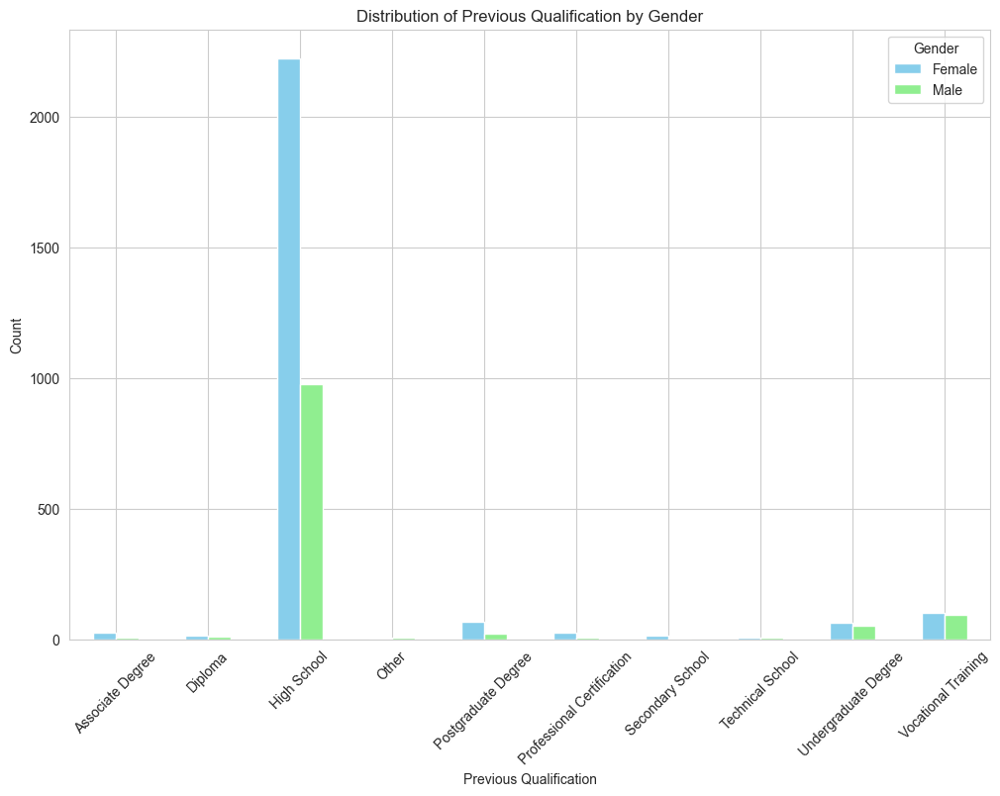

In [138]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the test dataset
test_data = pd.read_csv('test_updated.csv')

# Calculate the distribution of 'PREVIOUS_QUALIFICATION' by 'GENDER'
previous_qualification_gender_counts = test_data.groupby(['PREVIOUS_QUALIFICATION', 'GENDER']).size().unstack()

# Create a clustered bar chart
previous_qualification_gender_counts.plot(kind='bar', figsize=(12, 8), color=['skyblue', 'lightgreen'])
plt.title('Distribution of Previous Qualification by Gender')
plt.xlabel('Previous Qualification')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Gender', labels=['Female', 'Male'])
plt.show()

In [186]:
# Convert numerical gender values to labels
data['GENDER'] = data['GENDER'].map({0: 'Female', 1: 'Male'})

# Verify the changes
print(data[['GENDER']].head())

   GENDER
0    Male
1  Female
2  Female
3    Male
4  Female


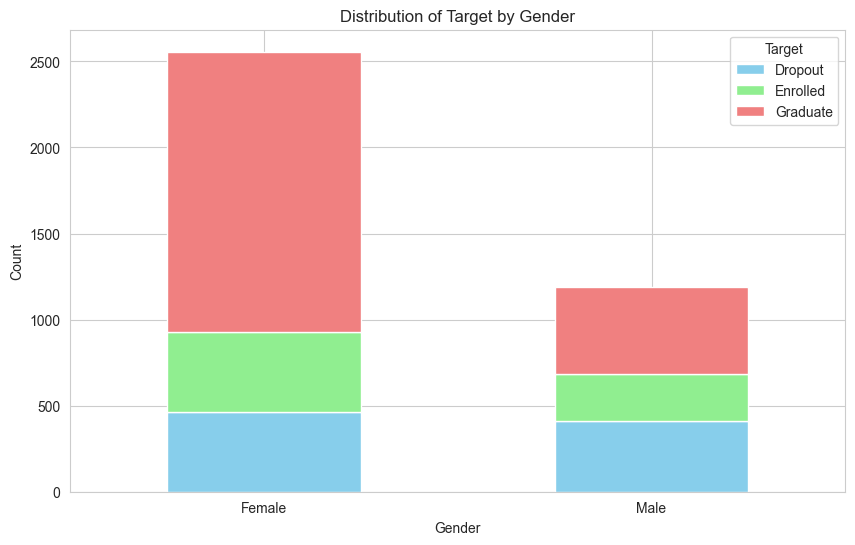

In [187]:
import matplotlib.pyplot as plt

# Create a stacked bar chart for the distribution of 'TARGET' by 'GENDER'
target_gender_counts = data.groupby(['GENDER', 'TARGET']).size().unstack()

# Plot the stacked bar chart
target_gender_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=['skyblue', 'lightgreen', 'lightcoral'])
plt.title('Distribution of Target by Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(title='Target', labels=['Dropout', 'Enrolled', 'Graduate'])
plt.xticks(rotation=0)
plt.show()

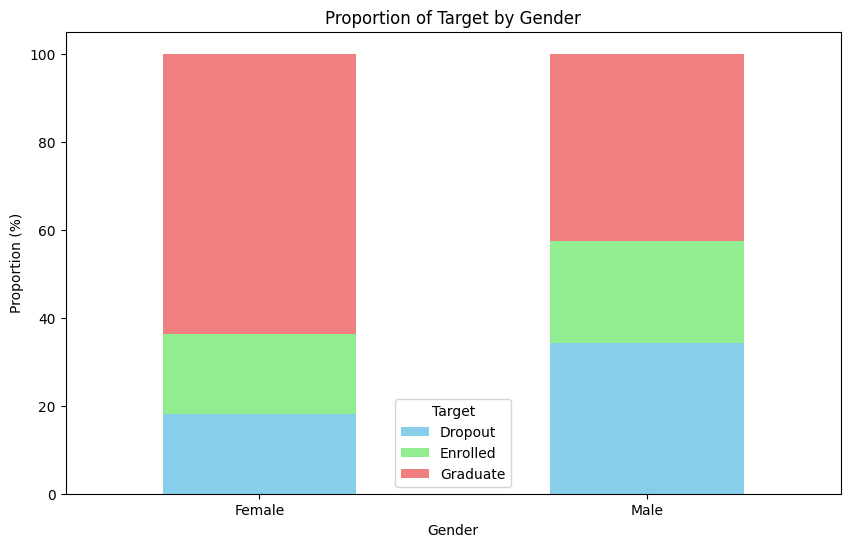

In [21]:
import matplotlib.pyplot as plt

# Create a stacked bar chart for the distribution of 'TARGET' by 'GENDER'
target_gender_counts = data.groupby(['GENDER', 'TARGET']).size().unstack()

# Convert counts to proportions
target_gender_proportions = target_gender_counts.div(target_gender_counts.sum(axis=1), axis=0) * 100

# Plot the stacked bar chart
target_gender_proportions.plot(kind='bar', stacked=True, figsize=(10, 6), color=['skyblue', 'lightgreen', 'lightcoral'])
plt.title('Proportion of Target by Gender')
plt.xlabel('Gender')
plt.ylabel('Proportion (%)')
plt.legend(title='Target', labels=['Dropout', 'Enrolled', 'Graduate'])
plt.xticks(rotation=0)
plt.show()

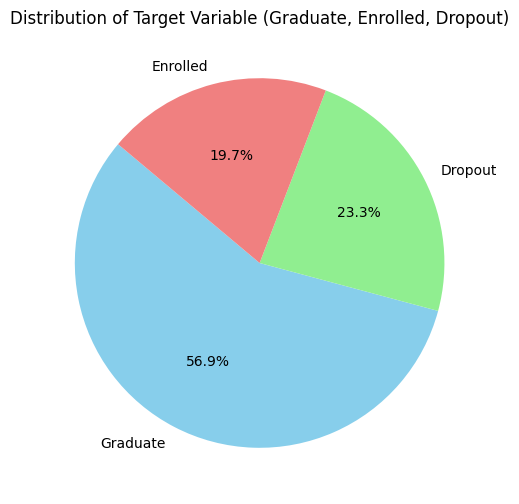

In [30]:
import matplotlib.pyplot as plt

# Map the target values to their respective labels
target_labels = {0: 'Dropout', 1: 'Enrolled', 2: 'Graduate'}
data['TARGET_LABEL'] = data['TARGET'].map(target_labels)

# Calculate the distribution of each category in the target variable
target_distribution = data['TARGET_LABEL'].value_counts()

# Plot the distribution as a pie chart
plt.figure(figsize=(8, 6))
target_distribution.plot(kind='pie', autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightgreen', 'lightcoral'])
plt.title('Distribution of Target Variable (Graduate, Enrolled, Dropout)')
plt.ylabel('')
plt.show()

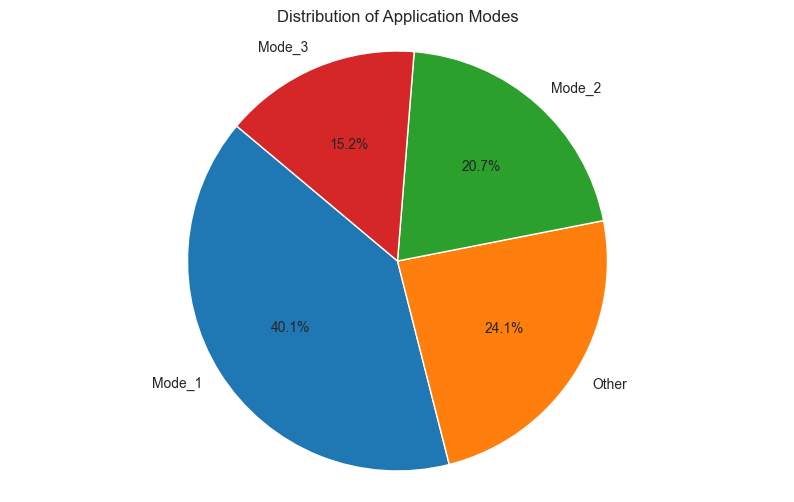

In [139]:
import matplotlib.pyplot as plt

# Create a pie chart for APPLICATION_MODE
application_mode_counts = data['APPLICATION_MODE'].value_counts()

plt.figure(figsize=(10, 6))
plt.pie(application_mode_counts, labels=application_mode_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Application Modes')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

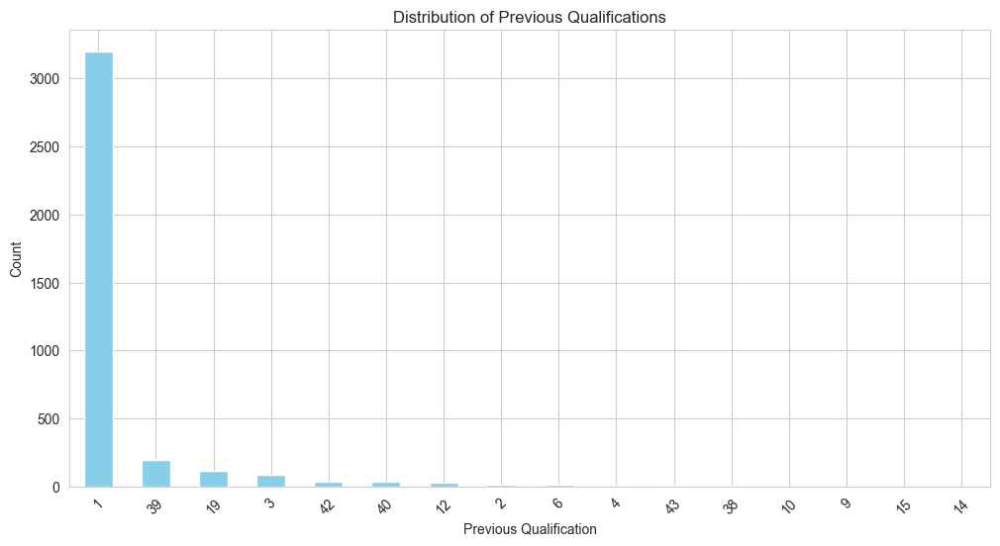

In [140]:
import matplotlib.pyplot as plt

# Calculate the counts of previous qualifications
previous_qualification_counts = data['PREVIOUS_QUALIFICATION'].value_counts()

# Bar plot of previous qualifications
plt.figure(figsize=(12, 6))
previous_qualification_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Previous Qualifications')
plt.xlabel('Previous Qualification')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [170]:
# Further Insights from the Data

# Calculate the mean, median, and mode of 'ADMISSION_GRADE' for each 'COURSE'
admission_grade_stats_by_course = data.groupby('COURSE')['ADMISSION_GRADE'].agg(['mean', 'median', lambda x: x.mode()[0]])
admission_grade_stats_by_course.columns = ['Mean Admission Grade', 'Median Admission Grade', 'Mode Admission Grade']
print("Admission Grade Statistics by Course:")
print(admission_grade_stats_by_course)

# Calculate the mean, median, and mode of 'AGE_AT_ENROLLMENT' for each 'COURSE'
age_at_enrollment_stats_by_course = data.groupby('COURSE')['AGE_AT_ENROLLMENT'].agg(['mean', 'median', lambda x: x.mode()[0]])
age_at_enrollment_stats_by_course.columns = ['Mean Age at Enrollment', 'Median Age at Enrollment', 'Mode Age at Enrollment']
print("\nAge at Enrollment Statistics by Course:")
print(age_at_enrollment_stats_by_course)

# Calculate the dropout rate by 'COURSE'
dropout_rate_by_course = data[data['TARGET'] == 0].groupby('COURSE').size() / data.groupby('COURSE').size() * 100
dropout_rate_by_course = dropout_rate_by_course.rename('Dropout Rate (%)')
print("\nDropout Rate by Course:")
print(dropout_rate_by_course)

# Calculate the graduation rate by 'COURSE'
graduation_rate_by_course = data[data['TARGET'] == 1].groupby('COURSE').size() / data.groupby('COURSE').size() * 100
graduation_rate_by_course = graduation_rate_by_course.rename('Graduation Rate (%)')
print("\nGraduation Rate by Course:")
print(graduation_rate_by_course)

# Calculate the mean 'ADMISSION_GRADE' for students with and without scholarships
mean_admission_grade_scholarship = data.groupby('SCHOLARSHIP_HOLDER')['ADMISSION_GRADE'].mean()
mean_admission_grade_scholarship.index = ['Without Scholarship', 'With Scholarship']
print("\nMean Admission Grade for Students with and without Scholarships:")
print(mean_admission_grade_scholarship)

# Calculate the mean 'AGE_AT_ENROLLMENT' for students with and without scholarships
mean_age_scholarship = data.groupby('SCHOLARSHIP_HOLDER')['AGE_AT_ENROLLMENT'].mean()
mean_age_scholarship.index = ['Without Scholarship', 'With Scholarship']
print("\nMean Age at Enrollment for Students with and without Scholarships:")
print(mean_age_scholarship)

# Calculate the mean 'ADMISSION_GRADE' by 'GENDER'
mean_admission_grade_gender = data.groupby('GENDER')['ADMISSION_GRADE'].mean()
mean_admission_grade_gender.index = ['Female', 'Male']
print("\nMean Admission Grade by Gender:")
print(mean_admission_grade_gender)

# Calculate the mean 'AGE_AT_ENROLLMENT' by 'GENDER'
mean_age_gender = data.groupby('GENDER')['AGE_AT_ENROLLMENT'].mean()
mean_age_gender.index = ['Female', 'Male']
print("\nMean Age at Enrollment by Gender:")
print(mean_age_gender)

Admission Grade Statistics by Course:
        Mean Admission Grade  Median Admission Grade  Mode Admission Grade
COURSE                                                                    
0                 126.888603                   127.0                 130.0
1                 122.705529                   121.0                 118.0
2                 125.529233                   125.0                 121.0
3                 127.156985                   126.0                 120.0

Age at Enrollment Statistics by Course:
        Mean Age at Enrollment  Median Age at Enrollment  \
COURSE                                                     
0                    20.660615                      19.0   
1                    22.287009                      20.0   
2                    20.745399                      19.0   
3                    23.767158                      20.0   

        Mode Age at Enrollment  
COURSE                          
0                           18  
1          

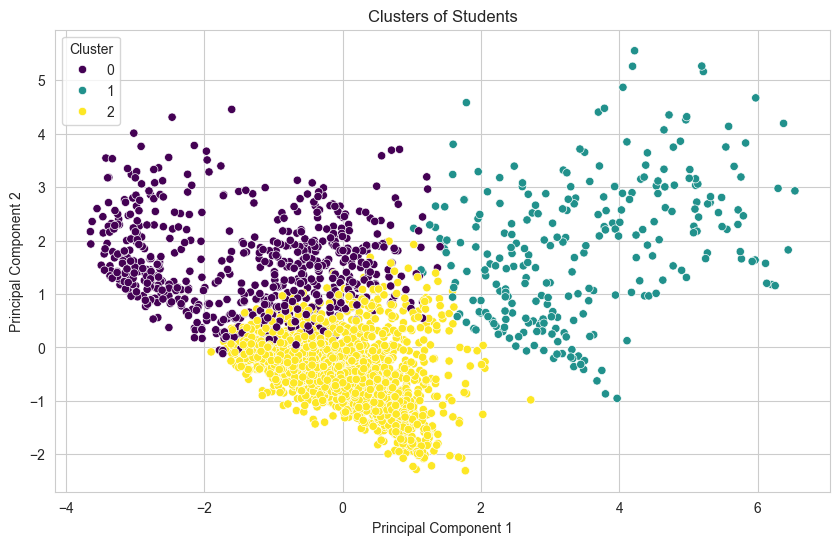

Cluster Analysis:
         ADMISSION_GRADE  AGE_AT_ENROLLMENT  AVERAGE_GRADE  TOTAL_CREDITS  \
Cluster                                                                     
0             123.723510          31.502340       9.566568       0.588144   
1             129.738277          28.985019      12.738879      15.127341   
2             126.915933          20.228169      12.891789       0.336268   

         TOTAL_APPROVED  
Cluster                  
0              5.720749  
1             21.509363  
2             10.871831  


In [171]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import seaborn as sns
from sklearn.preprocessing import StandardScaler

# Perform data mining to identify patterns and relationships in the dataset

# Import necessary libraries
import matplotlib.pyplot as plt

# Select relevant features for clustering
features = ['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'AVERAGE_GRADE', 'TOTAL_CREDITS', 'TOTAL_APPROVED']

# Standardize the features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[features])

# Apply KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
data['Cluster'] = kmeans.fit_predict(data_scaled)

# Visualize the clusters using PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(data_scaled)
data['PC1'] = principal_components[:, 0]
data['PC2'] = principal_components[:, 1]

plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=data, palette='viridis')
plt.title('Clusters of Students')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# Analyze the clusters
cluster_analysis = data.groupby('Cluster')[features].mean()
print("Cluster Analysis:")
print(cluster_analysis)

In [172]:
# (mean) clusters
cluster_analysis = data.groupby('Cluster')[features].mean()
cluster_analysis.index.name = 'Cluster ID'
cluster_analysis.columns = ['Mean Admission Grade', 'Mean Age at Enrollment', 'Mean Average Grade', 'Mean Total Credits', 'Mean Total Approved']
print("Cluster Analysis:")
print(cluster_analysis)

Cluster Analysis:
            Mean Admission Grade  Mean Age at Enrollment  Mean Average Grade  \
Cluster ID                                                                     
0                     123.723510               31.502340            9.566568   
1                     129.738277               28.985019           12.738879   
2                     126.915933               20.228169           12.891789   

            Mean Total Credits  Mean Total Approved  
Cluster ID                                           
0                     0.588144             5.720749  
1                    15.127341            21.509363  
2                     0.336268            10.871831  


In [144]:
# Create columns for TOTAL_CREDITS and TOTAL_APPROVED in cleaned_data.csv
cleaned_data['TOTAL_CREDITS'] = cleaned_data['CURRICULAR_UNITS_1ST_SEM_CREDITED'] + cleaned_data['CURRICULAR_UNITS_2ND_SEM_CREDITED']
cleaned_data['TOTAL_APPROVED'] = cleaned_data['CURRICULAR_UNITS_1ST_SEM_APPROVED'] + cleaned_data['CURRICULAR_UNITS_2ND_SEM_APPROVED']

# Save the updated cleaned_data to a new CSV file
cleaned_data.to_csv('cleaned_data_with_totals.csv', index=False)

In [174]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Select features and target variable for regression analysis
features = ['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'AVERAGE_GRADE', 'TOTAL_CREDITS', 'TOTAL_APPROVED']
target = 'TARGET'

# Convert target variable to numerical values
cleaned_data[target] = cleaned_data[target].map({'Dropout': 0, 'Enrolled': 1, 'Graduate': 2})

# Split the data into training and testing sets
X_train = cleaned_data[features]
y_train = cleaned_data[target]

# Initialize the Linear Regression model
regression_model = LinearRegression()

# Fit the model to the training data
regression_model.fit(X_train, y_train)

# Make predictions on the training data
y_train_pred = regression_model.predict(X_train)

# Calculate the mean squared error and R-squared value for the training data
mse_train = mean_squared_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

print(f"Training Mean Squared Error: {mse_train:.2f}")
print(f"Training R-squared: {r2_train:.2f}")

# Make predictions on the test data
X_test = cleaned_data[features]
y_test = cleaned_data[target]
y_test_pred = regression_model.predict(X_test)

# Calculate the mean squared error and R-squared value for the test data
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print(f"Test Mean Squared Error: {mse_test:.2f}")
print(f"Test R-squared: {r2_test:.2f}")

Training Mean Squared Error: 0.39
Training R-squared: 0.44
Test Mean Squared Error: 0.39
Test R-squared: 0.44


Mean Squared Error: 4.392979150484264
R-squared: 0.04492712051531822


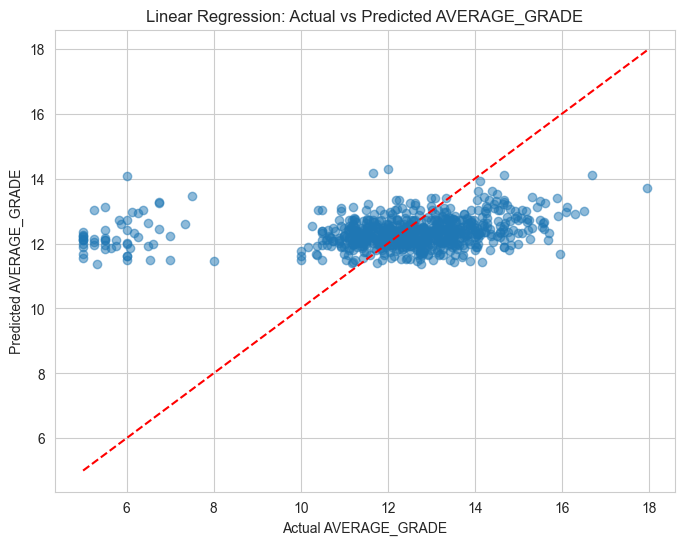

In [146]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score


# Select features and target variable
X = cleaned_data[['ADMISSION_GRADE', 'CURRICULAR_UNITS_1ST_SEM_CREDITED', 'CURRICULAR_UNITS_2ND_SEM_CREDITED']]
y = cleaned_data['AVERAGE_GRADE']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict on test set
y_pred = model.predict(X_test)

# Evaluate model
print(f'Mean Squared Error: {mean_squared_error(y_test, y_pred)}')
print(f'R-squared: {r2_score(y_test, y_pred)}')

# Plot actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # Diagonal line
plt.xlabel('Actual AVERAGE_GRADE')
plt.ylabel('Predicted AVERAGE_GRADE')
plt.title('Linear Regression: Actual vs Predicted AVERAGE_GRADE')
plt.show()

In [147]:
# Combine the columns 'CURRICULAR_UNITS_1ST_SEM_CREDITED' and 'CURRICULAR_UNITS_2ND_SEM_CREDITED'
cleaned_data['TOTAL_CREDITS'] = cleaned_data['CURRICULAR_UNITS_1ST_SEM_CREDITED'] + cleaned_data['CURRICULAR_UNITS_2ND_SEM_CREDITED']

# Display the first few rows to verify the changes
print(cleaned_data[['CURRICULAR_UNITS_1ST_SEM_CREDITED', 'CURRICULAR_UNITS_2ND_SEM_CREDITED', 'TOTAL_CREDITS']].head())

   CURRICULAR_UNITS_1ST_SEM_CREDITED  CURRICULAR_UNITS_2ND_SEM_CREDITED  \
0                                  0                                  0   
1                                  0                                  0   
2                                  0                                  0   
3                                  0                                  0   
4                                  0                                  0   

   TOTAL_CREDITS  
0              0  
1              0  
2              0  
3              0  
4              0  


In [148]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Select features and target variable
X = cleaned_data[['ADMISSION_GRADE', 'TOTAL_CREDITS']]
y = cleaned_data['AVERAGE_GRADE']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict on test set
y_pred = model.predict(X_test)

# Evaluate model
print(f'Mean Squared Error: {mean_squared_error(y_test, y_pred)}')
print(f'R-squared: {r2_score(y_test, y_pred)}')

Mean Squared Error: 4.380097986596332
R-squared: 0.04772760052310632


In [149]:
dataset = pd.read_csv("students_dropout_and_academic_success.csv")

C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: U

Accuracy: 0.5466666666666666
Confusion Matrix:
[[  0   0 180]
 [  0   0 159]
 [  1   0 410]]
Classification Report:
              precision    recall  f1-score   support

     Dropout       0.00      0.00      0.00       180
    Enrolled       0.00      0.00      0.00       159
    Graduate       0.55      1.00      0.71       411

    accuracy                           0.55       750
   macro avg       0.18      0.33      0.24       750
weighted avg       0.30      0.55      0.39       750



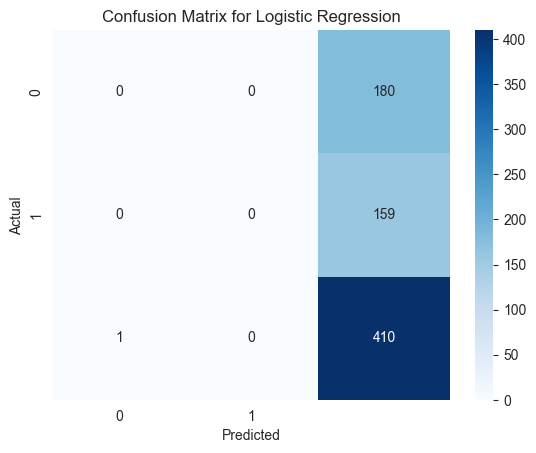

In [150]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Select features and target variable
X = cleaned_data[['ADMISSION_GRADE', 'CURRICULAR_UNITS_1ST_SEM_CREDITED', 'CURRICULAR_UNITS_2ND_SEM_CREDITED']]
y = cleaned_data['TARGET']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Predict on test set
y_pred = model.predict(X_test)

# Evaluate model
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')
print('Confusion Matrix:')
print(confusion_matrix(y_test, y_pred))
print('Classification Report:')
print(classification_report(y_test, y_pred))

# Plot confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['0', '1'], yticklabels=['0', '1'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Logistic Regression')
plt.show()

In [151]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Fit ANOVA model
model = ols('AVERAGE_GRADE ~ C(GRADE_CLASS)', data=cleaned_data).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)

                      sum_sq      df             F  PR(>F)
C(GRADE_CLASS)  14550.695250     3.0  14533.521098     0.0
Residual         1249.474752  3744.0           NaN     NaN


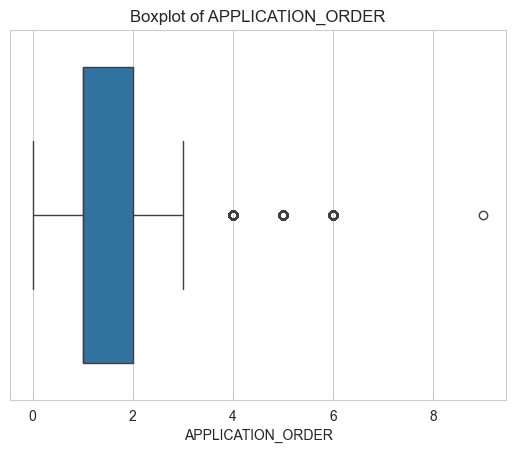

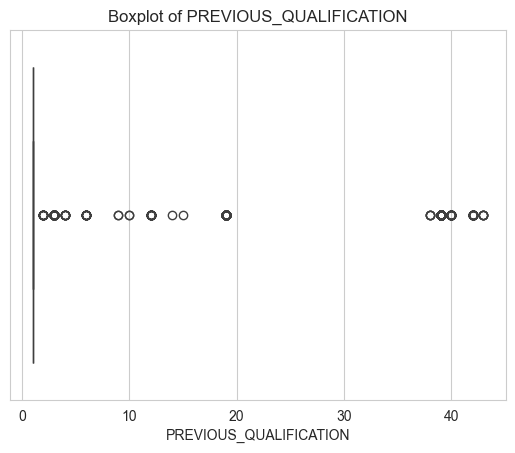

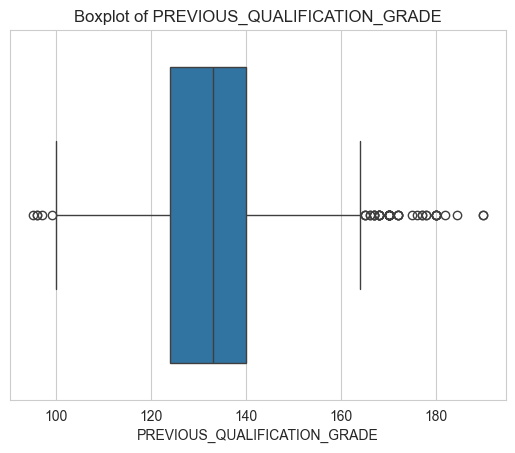

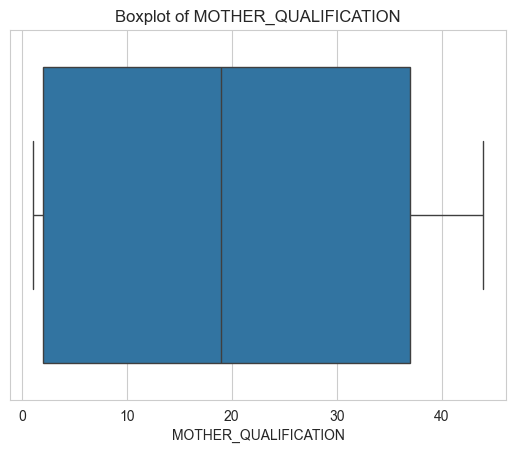

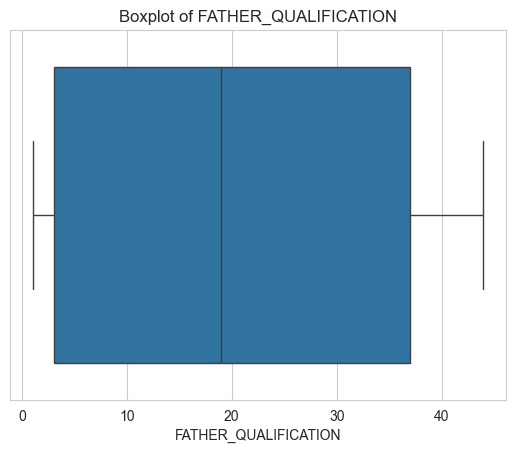

...

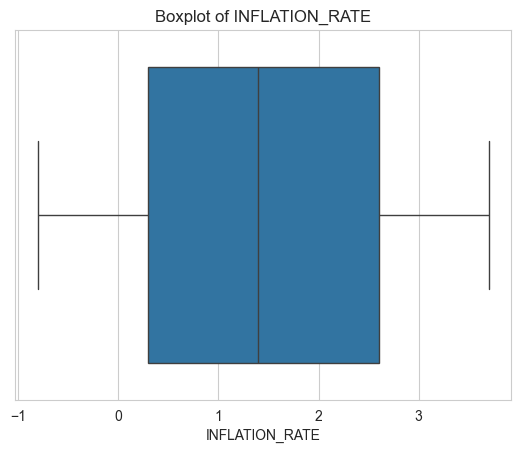

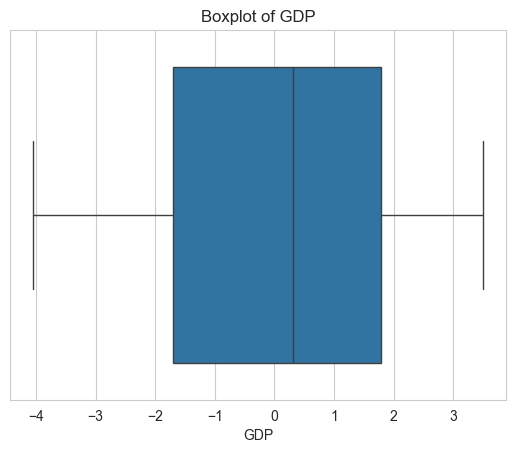

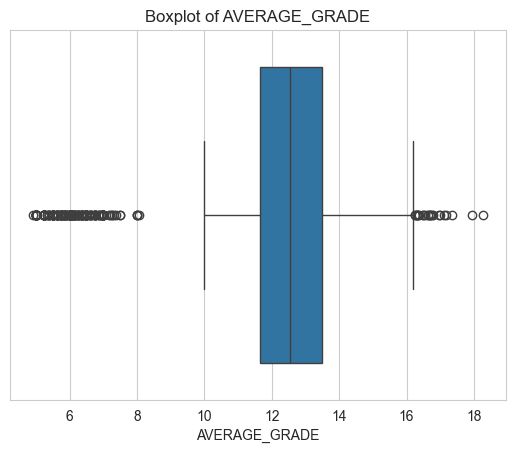

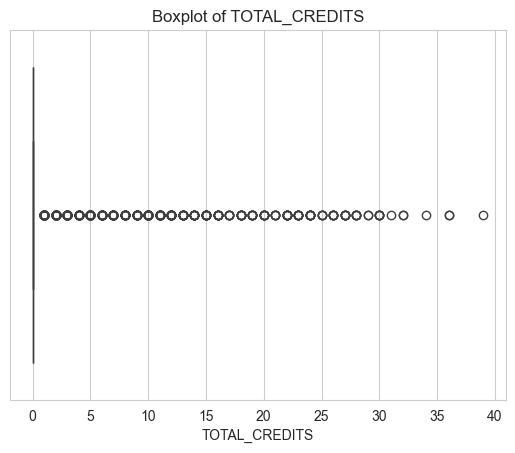

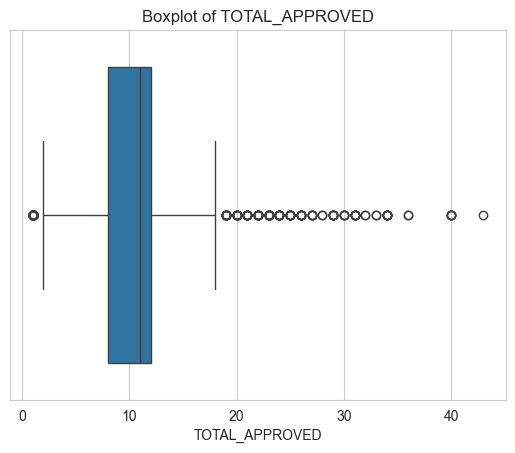

In [152]:
# Boxplot for numerical columns to detect outliers
numerical_cols = cleaned_data.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    sns.boxplot(x=cleaned_data[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

In [175]:
# Perform statistical analysis on the dataset

import scipy.stats as stats

# Calculate descriptive statistics for 'ADMISSION_GRADE'
admission_grade_stats = {
    'mean': np.mean(data['ADMISSION_GRADE']),
    'std_dev': np.std(data['ADMISSION_GRADE']),
    'median': np.median(data['ADMISSION_GRADE']),
    'mode': stats.mode(data['ADMISSION_GRADE']),
    'range': np.ptp(data['ADMISSION_GRADE']),
    'iqr': stats.iqr(data['ADMISSION_GRADE']),
    'variance': np.var(data['ADMISSION_GRADE']),
    'skewness': stats.skew(data['ADMISSION_GRADE']),
    'kurtosis': stats.kurtosis(data['ADMISSION_GRADE'])
}

# Calculate descriptive statistics for 'AGE_AT_ENROLLMENT'
age_at_enrollment_stats = {
    'mean': np.mean(data['AGE_AT_ENROLLMENT']),
    'std_dev': np.std(data['AGE_AT_ENROLLMENT']),
    'median': np.median(data['AGE_AT_ENROLLMENT']),
    'mode': stats.mode(data['AGE_AT_ENROLLMENT']),
    'range': np.ptp(data['AGE_AT_ENROLLMENT']),
    'iqr': stats.iqr(data['AGE_AT_ENROLLMENT']),
    'variance': np.var(data['AGE_AT_ENROLLMENT']),
    'skewness': stats.skew(data['AGE_AT_ENROLLMENT']),
    'kurtosis': stats.kurtosis(data['AGE_AT_ENROLLMENT'])
}

print("Descriptive Statistics for 'ADMISSION_GRADE':")
print(admission_grade_stats)
print("\nDescriptive Statistics for 'AGE_AT_ENROLLMENT':")
print(age_at_enrollment_stats)

# Perform a t-test to compare the means of 'ADMISSION_GRADE' for scholarship holders and non-scholarship holders
scholarship_holders = data[data['SCHOLARSHIP_HOLDER'] == 1]['ADMISSION_GRADE']
non_scholarship_holders = data[data['SCHOLARSHIP_HOLDER'] == 0]['ADMISSION_GRADE']
t_stat, p_value = stats.ttest_ind(scholarship_holders, non_scholarship_holders)

print(f"\nT-test for 'ADMISSION_GRADE' between scholarship holders and non-scholarship holders:")
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# Perform a chi-square test to examine the relationship between 'GENDER' and 'TARGET'
contingency_table = pd.crosstab(data['GENDER'], data['TARGET'])
chi2, p, dof, expected = stats.chi2_contingency(contingency_table)

print(f"\nChi-square test for 'GENDER' and 'TARGET':")
print(f"Chi2: {chi2}, P-value: {p}, Degrees of freedom: {dof}")
print("Expected frequencies:")
print(expected)

Descriptive Statistics for 'ADMISSION_GRADE':
{'mean': 126.57100853788685, 'std_dev': 13.6956454139685, 'median': 126.0, 'mode': ModeResult(mode=130.0, count=205), 'range': 63.529999999999774, 'iqr': 16.0, 'variance': 187.5707033051564, 'skewness': 0.41986565151004956, 'kurtosis': 0.11151880147830484}

Descriptive Statistics for 'AGE_AT_ENROLLMENT':
{'mean': 22.78014941302028, 'std_dev': 7.089736654215603, 'median': 20.0, 'mode': ModeResult(mode=18, count=933), 'range': 32, 'iqr': 5.0, 'variance': 50.264365826128255, 'skewness': 2.0677849636818664, 'kurtosis': 3.750897634081179}

T-test for 'ADMISSION_GRADE' between scholarship holders and non-scholarship holders:
T-statistic: 0.34094794375196785, P-value: 0.733161891576434

Chi-square test for 'GENDER' and 'TARGET':
Chi2: 165.460332934665, P-value: 1.1769153204562801e-36, Degrees of freedom: 2
Expected frequencies:
[[ 596.71824973  503.97118463 1455.31056564]
 [ 278.28175027  235.02881537  678.68943436]]


In [200]:
# Perform correlation tests between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT'

# Pearson correlation
pearson_corr = data[['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT']].corr(method='pearson')
print("Pearson Correlation Coefficient between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT':")
print(pearson_corr)

# Spearman correlation
spearman_corr = data[['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT']].corr(method='spearman')
print("Spearman Correlation Coefficient between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT':")
print(spearman_corr)

# Kendall's tau correlation
kendall_tau_corr = data[['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT']].corr(method='kendall')
print("Kendall's Tau Correlation Coefficient between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT':")
print(kendall_tau_corr)

Pearson Correlation Coefficient between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT':
                   ADMISSION_GRADE  AGE_AT_ENROLLMENT
ADMISSION_GRADE           1.000000           0.000815
AGE_AT_ENROLLMENT         0.000815           1.000000
Spearman Correlation Coefficient between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT':
                   ADMISSION_GRADE  AGE_AT_ENROLLMENT
ADMISSION_GRADE           1.000000          -0.074277
AGE_AT_ENROLLMENT        -0.074277           1.000000
Kendall's Tau Correlation Coefficient between 'ADMISSION_GRADE' and 'AGE_AT_ENROLLMENT':
                   ADMISSION_GRADE  AGE_AT_ENROLLMENT
ADMISSION_GRADE           1.000000          -0.058058
AGE_AT_ENROLLMENT        -0.058058           1.000000


In [201]:
from statsmodels.stats.proportion import proportions_ztest

# Define the number of successes and the number of trials
count = data['TARGET'].value_counts()[2]  # Number of graduates
nobs = len(data)  # Total number of observations

# Define the hypothesized proportion value
prop = 0.5  # Hypothesized proportion (e.g., 50%)

# Perform the one-sample proportion test
stat, p_value = proportions_ztest(count, nobs, prop)

print(f"Z-statistic: {stat}")
print(f"P-value: {p_value}")

Z-statistic: 8.576777947265795
P-value: 9.756771869603887e-18


# CDA

In [313]:
# confirmatory data analysis

In [190]:
from scipy.stats import ttest_ind

# Hypothesis Testing

# Hypothesis: Students with higher admission grades are more likely to graduate.

# Step 1: Define the null and alternative hypotheses
# Null Hypothesis (H0): There is no significant difference in admission grades between students who graduate and those who do not.
# Alternative Hypothesis (H1): Students who graduate have significantly higher admission grades than those who do not.

# Step 2: Separate the data into two groups based on the target variable
graduates = data[data['TARGET'] == 2]  # Graduates
non_graduates = data[data['TARGET'] != 2]  # Non-graduates (Dropouts and Enrolled)

# Step 3: Calculate the mean admission grade for each group
mean_admission_grade_graduates = graduates['ADMISSION_GRADE'].mean()
mean_admission_grade_non_graduates = non_graduates['ADMISSION_GRADE'].mean()

print(f"Mean Admission Grade for Graduates: {mean_admission_grade_graduates:.2f}")
print(f"Mean Admission Grade for Non-Graduates: {mean_admission_grade_non_graduates:.2f}")

# Step 4: Perform an independent t-test to compare the means
t_stat, p_value = ttest_ind(graduates['ADMISSION_GRADE'], non_graduates['ADMISSION_GRADE'])

print(f"T-statistic: {t_stat:.2f}")
print(f"P-value: {p_value:.4f}")

# Step 5: Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference in admission grades between graduates and non-graduates.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in admission grades between graduates and non-graduates.")

Mean Admission Grade for Graduates: 127.93
Mean Admission Grade for Non-Graduates: 124.78
T-statistic: 7.02
P-value: 0.0000
Reject the null hypothesis. There is a significant difference in admission grades between graduates and non-graduates.


In [192]:
from scipy.stats import ttest_ind

# Hypothesis: People with lower admission grades are more likely to dropout than people with higher admission grades.

# Step 1: Define the null and alternative hypotheses
# Null Hypothesis (H0): There is no significant difference in admission grades between people who dropout and those who do not.
# Alternative Hypothesis (H1): People who dropout have significantly lower admission grades than those who do not.

# Step 2: Separate the data into two groups based on the target variable
dropouts = data[data['TARGET'] == 0]  # Dropouts
non_dropouts = data[data['TARGET'] != 0]  # Non-dropouts (Enrolled and Graduates)

# Step 3: Calculate the mean admission grade for each group
mean_admission_grade_dropouts = dropouts['ADMISSION_GRADE'].mean()
mean_admission_grade_non_dropouts = non_dropouts['ADMISSION_GRADE'].mean()

print(f"Mean Admission Grade for Dropouts: {mean_admission_grade_dropouts:.2f}")
print(f"Mean Admission Grade for Non-Dropouts: {mean_admission_grade_non_dropouts:.2f}")

# Step 4: Perform an independent t-test to compare the means
t_stat, p_value = ttest_ind(dropouts['ADMISSION_GRADE'], non_dropouts['ADMISSION_GRADE'])

print(f"T-statistic: {t_stat:.2f}")
print(f"P-value: {p_value:.4f}")

# Step 5: Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference in admission grades between dropouts and non-dropouts.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in admission grades between dropouts and non-dropouts.")

Mean Admission Grade for Dropouts: 124.85
Mean Admission Grade for Non-Dropouts: 127.10
T-statistic: -4.26
P-value: 0.0000
Reject the null hypothesis. There is a significant difference in admission grades between dropouts and non-dropouts.


In [193]:
from scipy.stats import chi2_contingency

# Create a contingency table for father's occupation and student's graduation status
contingency_table = pd.crosstab(data['FATHER_OCCUPATION'], data['TARGET'])

# Perform the chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Print the results
print(f"Chi-square statistic: {chi2}")
print(f"P-value: {p}")
print(f"Degrees of freedom: {dof}")
print("Expected frequencies:")
print(expected)

# Interpret the results
alpha = 0.05
if p < alpha:
    print("Reject the null hypothesis. There is a significant association between father's occupation and student's graduation status.")
else:
    print("Fail to reject the null hypothesis. There is no significant association between father's occupation and student's graduation status.")

Chi-square statistic: 184.83087237798608
P-value: 9.624238090054414e-13
Degrees of freedom: 68
Expected frequencies:
[[2.12446638e+01 1.79426361e+01 5.18127001e+01]
 [2.56803629e+01 2.16889007e+01 6.26307364e+01]
 [3.71197972e+01 3.13503202e+01 9.05298826e+01]
 [7.65741729e+01 6.46723586e+01 1.86753469e+02]
 [7.93756670e+01 6.70384205e+01 1.93585912e+02]
 [1.02021078e+02 8.61640875e+01 2.48814835e+02]
 [4.76254002e+01 4.02230523e+01 1.16151547e+02]
 [1.37273212e+02 1.15937033e+02 3.34789755e+02]
 [6.32670758e+01 5.34335646e+01 1.54299360e+02]
 [2.00540288e+02 1.69370598e+02 4.89089114e+02]
 [5.18276414e+01 4.37721451e+01 1.26400213e+02]
 [1.00386873e+01 8.47838847e+00 2.44829242e+01]
 [2.33457844e+00 1.97171825e+00 5.69370331e+00]
 [2.33457844e-01 1.97171825e-01 5.69370331e-01]
 [4.66915688e-01 3.94343650e-01 1.13874066e+00]
 [7.00373533e-01 5.91515475e-01 1.70811099e+00]
 [4.66915688e-01 3.94343650e-01 1.13874066e+00]
 [2.33457844e-01 1.97171825e-01 5.69370331e-01]
 [2.33457844e-01 1.

In [3]:
import pandas as pd
from scipy.stats import f_oneway, ttest_ind

# Load the dataset
data = pd.read_csv('cleaned_data.csv')

# Research Hypotheses

# Hypothesis 1: There is a significant difference in 'ADMISSION_GRADE' (continuous variable) between different 'COURSE' (nominal variable).
# Null Hypothesis (H0): The mean 'ADMISSION_GRADE' is the same across different 'COURSE'.
# Alternative Hypothesis (H1): The mean 'ADMISSION_GRADE' is different across different 'COURSE'.

# Hypothesis 2: There is a significant difference in 'AGE_AT_ENROLLMENT' (continuous variable) between different 'GENDER' (nominal variable).
# Null Hypothesis (H0): The mean 'AGE_AT_ENROLLMENT' is the same for different 'GENDER'.
# Alternative Hypothesis (H1): The mean 'AGE_AT_ENROLLMENT' is different for different 'GENDER'.

# Hypothesis 1: ANOVA test for 'ADMISSION_GRADE' across different 'COURSE'
courses = data['COURSE'].unique()
admission_grades_by_course = [data[data['COURSE'] == course]['ADMISSION_GRADE'] for course in courses]
f_stat, p_value = f_oneway(*admission_grades_by_course)

print(f"ANOVA test for 'ADMISSION_GRADE' across different 'COURSE':")
print(f"F-statistic: {f_stat:.2f}")
print(f"P-value: {p_value:.4f}")

# Hypothesis 2: T-test for 'AGE_AT_ENROLLMENT' between different 'GENDER'
male_age_at_enrollment = data[data['GENDER'] == 'Male']['AGE_AT_ENROLLMENT']
female_age_at_enrollment = data[data['GENDER'] == 'Female']['AGE_AT_ENROLLMENT']
t_stat, p_value = ttest_ind(male_age_at_enrollment, female_age_at_enrollment)

print(f"T-test for 'AGE_AT_ENROLLMENT' between different 'GENDER':")
print(f"T-statistic: {t_stat:.2f}")
print(f"P-value: {p_value:.4f}")

ANOVA test for 'ADMISSION_GRADE' across different 'COURSE':
F-statistic: 11.18
P-value: 0.0000
T-test for 'AGE_AT_ENROLLMENT' between different 'GENDER':
T-statistic: 8.61
P-value: 0.0000


In [4]:
from scipy.stats import chi2_contingency

# Hypothesis 1: There is a significant association between 'GENDER' and 'TARGET'.
# Null Hypothesis (H0): There is no significant association between 'GENDER' and 'TARGET'.
# Alternative Hypothesis (H1): There is a significant association between 'GENDER' and 'TARGET'.

# Create a contingency table for 'GENDER' and 'TARGET'
contingency_table_gender_target = pd.crosstab(data['GENDER'], data['TARGET'])

# Perform the Chi-square test
chi2_gender_target, p_gender_target, dof_gender_target, expected_gender_target = chi2_contingency(contingency_table_gender_target)

print(f"Chi-square test for 'GENDER' and 'TARGET':")
print(f"Chi-square statistic: {chi2_gender_target}")
print(f"P-value: {p_gender_target}")
print(f"Degrees of freedom: {dof_gender_target}")
print("Expected frequencies:")
print(expected_gender_target)

# Interpret the results
alpha = 0.05
if p_gender_target < alpha:
    print("Reject the null hypothesis. There is a significant association between 'GENDER' and 'TARGET'.")
else:
    print("Fail to reject the null hypothesis. There is no significant association between 'GENDER' and 'TARGET'.")

# Hypothesis 2: There is a significant association between 'SCHOLARSHIP_HOLDER' and 'TARGET'.
# Null Hypothesis (H0): There is no significant association between 'SCHOLARSHIP_HOLDER' and 'TARGET'.
# Alternative Hypothesis (H1): There is a significant association between 'SCHOLARSHIP_HOLDER' and 'TARGET'.

# Create a contingency table for 'SCHOLARSHIP_HOLDER' and 'TARGET'
contingency_table_scholarship_target = pd.crosstab(data['SCHOLARSHIP_HOLDER'], data['TARGET'])

# Perform the Chi-square test
chi2_scholarship_target, p_scholarship_target, dof_scholarship_target, expected_scholarship_target = chi2_contingency(contingency_table_scholarship_target)

print(f"\nChi-square test for 'SCHOLARSHIP_HOLDER' and 'TARGET':")
print(f"Chi-square statistic: {chi2_scholarship_target}")
print(f"P-value: {p_scholarship_target}")
print(f"Degrees of freedom: {dof_scholarship_target}")
print("Expected frequencies:")
print(expected_scholarship_target)

# Interpret the results
if p_scholarship_target < alpha:
    print("Reject the null hypothesis. There is a significant association between 'SCHOLARSHIP_HOLDER' and 'TARGET'.")
else:
    print("Fail to reject the null hypothesis. There is no significant association between 'SCHOLARSHIP_HOLDER' and 'TARGET'.")

Chi-square test for 'GENDER' and 'TARGET':
Chi-square statistic: 165.460332934665
P-value: 1.1769153204562801e-36
Degrees of freedom: 2
Expected frequencies:
[[ 596.71824973  503.97118463 1455.31056564]
 [ 278.28175027  235.02881537  678.68943436]]
Reject the null hypothesis. There is a significant association between 'GENDER' and 'TARGET'.

Chi-square test for 'SCHOLARSHIP_HOLDER' and 'TARGET':
Chi-square statistic: 273.9871163034718
P-value: 3.1948732890597987e-60
Degrees of freedom: 2
Expected frequencies:
[[ 634.77187834  536.1101921  1548.11792956]
 [ 240.22812166  202.8898079   585.88207044]]
Reject the null hypothesis. There is a significant association between 'SCHOLARSHIP_HOLDER' and 'TARGET'.


In [ ]:
# conclusion: 
# women were more likely to graduate than men
# scholarship holders were more likely to graduate than non-scholarship holders

In [7]:
from scipy.stats import shapiro

# Check normality for male students
male_grades = data[data['GENDER'] == 1]['ADMISSION_GRADE']
shapiro_male = shapiro(male_grades)
print(f"Shapiro-Wilk test for male students: statistic={shapiro_male.statistic}, p-value={shapiro_male.pvalue}")

# Check normality for female students
female_grades = data[data['GENDER'] == 0]['ADMISSION_GRADE']
shapiro_female = shapiro(female_grades)
print(f"Shapiro-Wilk test for female students: statistic={shapiro_female.statistic}, p-value={shapiro_female.pvalue}")

Shapiro-Wilk test for male students: statistic=nan, p-value=nan
Shapiro-Wilk test for female students: statistic=nan, p-value=nan


C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_44488\4110515610.py:5: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  shapiro_male = shapiro(male_grades)
C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_44488\4110515610.py:10: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  shapiro_female = shapiro(female_grades)


In [8]:
# Check normality for scholarship holders
scholarship_grades = data[data['SCHOLARSHIP_HOLDER'] == 1]['AVERAGE_GRADE']
shapiro_scholarship = shapiro(scholarship_grades)
print(f"Shapiro-Wilk test for scholarship holders: statistic={shapiro_scholarship.statistic}, p-value={shapiro_scholarship.pvalue}")

# Check normality for non-scholarship holders
non_scholarship_grades = data[data['SCHOLARSHIP_HOLDER'] == 0]['AVERAGE_GRADE']
shapiro_non_scholarship = shapiro(non_scholarship_grades)
print(f"Shapiro-Wilk test for non-scholarship holders: statistic={shapiro_non_scholarship.statistic}, p-value={shapiro_non_scholarship.pvalue}")

Shapiro-Wilk test for scholarship holders: statistic=0.853001333223083, p-value=6.983235644297936e-30
Shapiro-Wilk test for non-scholarship holders: statistic=0.8439652645080727, p-value=1.0265603871344534e-45


In [11]:
# Perform Levene's test
levene_test = levene(scholarship_grades, non_scholarship_grades)
print(f"Levene's test: statistic={levene_test.statistic}, p-value={levene_test.pvalue}")

Levene's test: statistic=41.5724040284291, p-value=1.280615559705147e-10


In [12]:
# Check assumptions
if shapiro_scholarship.pvalue > 0.05 and shapiro_non_scholarship.pvalue > 0.05 and levene_test.pvalue > 0.05:
    # Perform t-test
    t_stat, p_value = ttest_ind(scholarship_grades, non_scholarship_grades)
    print("Using t-test:")
    print(f"T-statistic: {t_stat}, p-value: {p_value}")
else:
    # Perform Mann-Whitney U test
    u_stat, p_value = mannwhitneyu(scholarship_grades, non_scholarship_grades)
    print("Using Mann-Whitney U test:")
    print(f"U-statistic: {u_stat}, p-value: {p_value}")

Using Mann-Whitney U test:
U-statistic: 1672391.0, p-value: 2.2507556166785718e-20


In [198]:
from scipy.stats import ttest_ind

# Hypothesis: There is no significant difference in average grades between students who are scholarship holders and those who are not.

# Step 1: Define the null and alternative hypotheses
# Null Hypothesis (H0): There is no significant difference in average grades between students who are scholarship holders and those who are not.
# Alternative Hypothesis (H1): There is a significant difference in average grades between students who are scholarship holders and those who are not.

# Step 2: Separate the data into two groups based on scholarship holder status
scholarship_holders = data[data['SCHOLARSHIP_HOLDER'] == 1]['AVERAGE_GRADE']
non_scholarship_holders = data[data['SCHOLARSHIP_HOLDER'] == 0]['AVERAGE_GRADE']

# Step 3: Calculate the mean average grade for each group
mean_average_grade_scholarship = scholarship_holders.mean()
mean_average_grade_non_scholarship = non_scholarship_holders.mean()

print(f"Mean Average Grade for Scholarship Holders: {mean_average_grade_scholarship:.2f}")
print(f"Mean Average Grade for Non-Scholarship Holders: {mean_average_grade_non_scholarship:.2f}")

# Step 4: Perform an independent t-test to compare the means
t_stat, p_value = ttest_ind(scholarship_holders, non_scholarship_holders)

print(f"T-statistic: {t_stat:.2f}")
print(f"P-value: {p_value:.4f}")

# Step 5: Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference in average grades between scholarship holders and non-scholarship holders.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in average grades between scholarship holders and non-scholarship holders.")

Mean Average Grade for Scholarship Holders: 12.78
Mean Average Grade for Non-Scholarship Holders: 12.14
T-statistic: 8.65
P-value: 0.0000
Reject the null hypothesis. There is a significant difference in average grades between scholarship holders and non-scholarship holders.


In [156]:
from scipy.stats import ttest_ind

# Split data into two groups
scholarship_holders = data[data['SCHOLARSHIP_HOLDER'] == 1]['AVERAGE_GRADE']
non_scholarship_holders = data[data['SCHOLARSHIP_HOLDER'] == 0]['AVERAGE_GRADE']

# Perform t-test
t_stat, p_value = ttest_ind(scholarship_holders, non_scholarship_holders)
print(f'T-statistic: {t_stat}, P-value: {p_value}')

T-statistic: 8.554310461158298, P-value: 1.703644861098147e-17


In [183]:
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(data['GENDER'], data['SCHOLARSHIP_HOLDER'])

# Perform chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(f'Chi-square statistic: {chi2}, P-value: {p}')

Chi-square statistic: 105.60451537073993, P-value: 9.002234100813121e-25


In [158]:
# data classification

# Import the necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

# Load the data
data = pd.read_csv('outlier_free_data.csv')

# Encode categorical columns using LabelEncoder
label_encoders = {}

for column in data.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    data[column] = le.fit_transform(data[column])
    label_encoders[column] = le

# Split the data into features and target
X = data.drop('TARGET', axis=1)
y = data['TARGET']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate a classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Save the trained model to a file
import joblib

joblib.dump(rf_classifier, 'random_forest_classifier.joblib')

# Load the trained model from the file
loaded_model = joblib.load('random_forest_classifier.joblib')

# Make predictions using the loaded model
y_pred_loaded = loaded_model.predict(X_test)

# Verify that the predictions are the same
print("Predictions using the loaded model are the same as before:", np.array_equal(y_pred, y_pred_loaded))

Accuracy: 0.74
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.64      0.70       180
           1       0.53      0.33      0.40       159
           2       0.78      0.95      0.86       411

    accuracy                           0.74       750
   macro avg       0.69      0.64      0.65       750
weighted avg       0.72      0.74      0.72       750

Predictions using the loaded model are the same as before: True


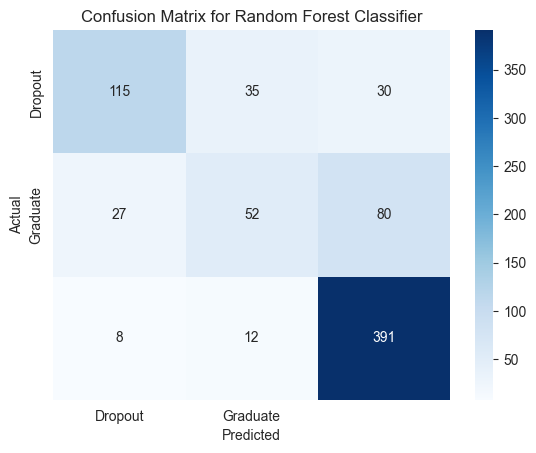

In [159]:

# Generate a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Dropout', 'Graduate'], yticklabels=['Dropout', 'Graduate'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Random Forest Classifier')
plt.show()

In [160]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

# Ensure the target variable contains discrete class labels
y_train = y_train.astype('int')
y_test = y_test.astype('int')

# Train a Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred_dt = dt_classifier.predict(X_test)

# Calculate the accuracy of the model
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(f"Decision Tree Classifier Accuracy: {accuracy_dt:.2f}")

# Generate a classification report
class_report_dt = classification_report(y_test, y_pred_dt)
print("Decision Tree Classifier Classification Report:")
print(class_report_dt)

Decision Tree Classifier Accuracy: 0.69
Decision Tree Classifier Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.62      0.62       180
           1       0.43      0.37      0.40       159
           2       0.79      0.84      0.81       411

    accuracy                           0.69       750
   macro avg       0.62      0.61      0.61       750
weighted avg       0.68      0.69      0.68       750



In [161]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, classification_report

# Train a Neural Network Classifier
nn_classifier = MLPClassifier(random_state=42, max_iter=300)
nn_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred_nn = nn_classifier.predict(X_test)

# Calculate the accuracy of the model
accuracy_nn = accuracy_score(y_test, y_pred_nn)
print(f"Neural Network Classifier Accuracy: {accuracy_nn:.2f}")

# Generate a classification report
class_report_nn = classification_report(y_test, y_pred_nn)
print("Neural Network Classifier Classification Report:")
print(class_report_nn)

Neural Network Classifier Accuracy: 0.74
Neural Network Classifier Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.73      0.75       180
           1       0.52      0.21      0.30       159
           2       0.76      0.95      0.85       411

    accuracy                           0.74       750
   macro avg       0.68      0.63      0.63       750
weighted avg       0.71      0.74      0.71       750



Gradient Boosting Classifier Accuracy: 0.65
Gradient Boosting Classifier Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.52      0.56       180
           1       0.26      0.12      0.16       159
           2       0.72      0.91      0.81       411

    accuracy                           0.65       750
   macro avg       0.52      0.52      0.51       750
weighted avg       0.59      0.65      0.61       750



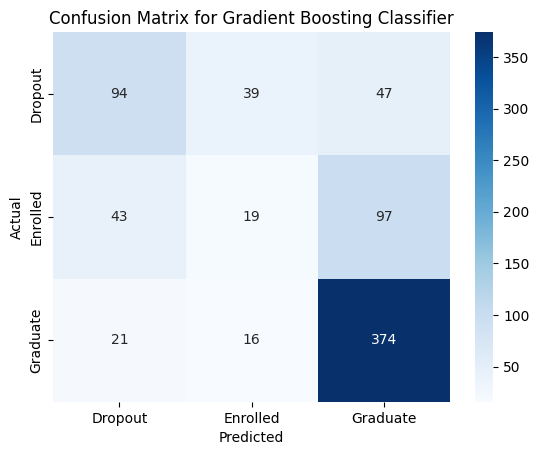

In [6]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns

import matplotlib.pyplot as plt

# Train a Gradient Boosting Classifier
gb_classifier = GradientBoostingClassifier(random_state=42)
gb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred_gb = gb_classifier.predict(X_test)

# Calculate the accuracy of the model
accuracy_gb = accuracy_score(y_test, y_pred_gb)
print(f"Gradient Boosting Classifier Accuracy: {accuracy_gb:.2f}")

# Generate a classification report
class_report_gb = classification_report(y_test, y_pred_gb)
print("Gradient Boosting Classifier Classification Report:")
print(class_report_gb)

# Generate a confusion matrix
conf_matrix_gb = confusion_matrix(y_test, y_pred_gb)
sns.heatmap(conf_matrix_gb, annot=True, fmt='d', cmap='Blues', xticklabels=['Dropout', 'Enrolled', 'Graduate'], yticklabels=['Dropout', 'Enrolled', 'Graduate'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Gradient Boosting Classifier')
plt.show()

SVM Classifier Accuracy: 0.75
SVM Classifier Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.66      0.71       180
           1       0.51      0.36      0.43       159
           2       0.79      0.94      0.86       411

    accuracy                           0.75       750
   macro avg       0.70      0.65      0.67       750
weighted avg       0.73      0.75      0.73       750



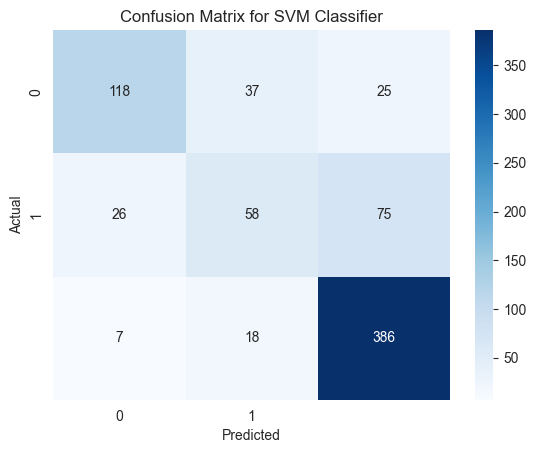

In [162]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Train a Support Vector Machine (SVM) Classifier
svm_classifier = SVC(kernel='linear', random_state=42)
svm_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred_svm = svm_classifier.predict(X_test)

# Calculate the accuracy of the model
accuracy_svm = accuracy_score(y_test, y_pred_svm)
print(f"SVM Classifier Accuracy: {accuracy_svm:.2f}")

# Generate a classification report
class_report_svm = classification_report(y_test, y_pred_svm)
print("SVM Classifier Classification Report:")
print(class_report_svm)

# Generate a confusion matrix
conf_matrix_svm = confusion_matrix(y_test, y_pred_svm)
sns.heatmap(conf_matrix_svm, annot=True, fmt='d', cmap='Blues', xticklabels=['0', '1'], yticklabels=['0', '1'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for SVM Classifier')
plt.show()


In [163]:
from sklearn.model_selection import GridSearchCV

# Tune the RandomForestClassifier model using GridSearchCV with a smaller parameter grid for faster execution

# Define a smaller parameter grid
param_grid = {
    'n_estimators': [50, 100],  # Reduced number of estimators
    'max_depth': [None, 10],    # Reduced depth options
    'min_samples_split': [2, 5] # Reduced split options
}

# Initialize the GridSearchCV with the RandomForestClassifier
grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=3, scoring='accuracy')

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

# Use the best estimator to make predictions on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

Best Parameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}
Best Score: 0.7608445111778446
Accuracy: 0.74


In [164]:
from skopt import BayesSearchCV
from skopt.space import Integer, Categorical

# Define the parameter space for Bayesian optimization
param_space = {
    'n_estimators': Integer(10, 50),  # Reduced range for faster execution
    'max_depth': Integer(5, 10),      # Reduced range for faster execution
    'min_samples_split': Integer(2, 5) # Reduced range for faster execution
}

# Initialize the BayesSearchCV with the RandomForestClassifier
bayes_search = BayesSearchCV(
    estimator=RandomForestClassifier(random_state=42),
    search_spaces=param_space,
    n_iter=10,  # Reduced number of iterations for faster execution
    cv=3,
    scoring='accuracy',
    random_state=42
)

# Fit the model to the training data
bayes_search.fit(X_train, y_train)

# Print the best parameters and best score
print("Best Parameters:", bayes_search.best_params_)
print("Best Score:", bayes_search.best_score_)

# Use the best estimator to make predictions on the test set
best_model_bayes = bayes_search.best_estimator_
y_pred_bayes = best_model_bayes.predict(X_test)

# Evaluate the model
accuracy_bayes = accuracy_score(y_test, y_pred_bayes)
print(f"Accuracy: {accuracy_bayes:.2f}")

Best Parameters: OrderedDict([('max_depth', 9), ('min_samples_split', 5), ('n_estimators', 22)])
Best Score: 0.7518381715048381
Accuracy: 0.74


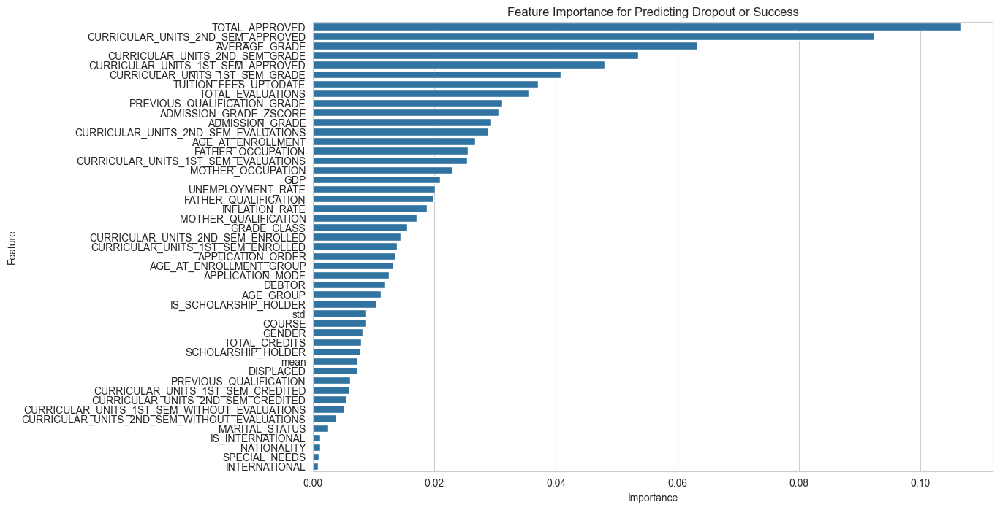

In [165]:
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
import matplotlib.pyplot as plt

# Train a RandomForestClassifier to determine feature importance
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)

# Get feature importances
feature_importances = rf.feature_importances_

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance for Predicting Dropout or Success')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [ ]:
# to do (explore research questions): https://chat.deepseek.com/a/chat/s/7440674d-9072-49bc-a39c-2d85a6b8b895

In [ ]:
# https://chat.deepseek.com/a/chat/s/437f9652-c2ef-41be-9c8c-7d52a7be6e24

In [13]:
# Descriptive Analysis

# Calculate descriptive statistics for 'ADMISSION_GRADE'
admission_grade_stats = data['ADMISSION_GRADE'].describe()
print("Descriptive Statistics for 'ADMISSION_GRADE':")
print(admission_grade_stats)

# Calculate descriptive statistics for 'AGE_AT_ENROLLMENT'
age_at_enrollment_stats = data['AGE_AT_ENROLLMENT'].describe()
print("\nDescriptive Statistics for 'AGE_AT_ENROLLMENT':")
print(age_at_enrollment_stats)

# Calculate descriptive statistics for 'AVERAGE_GRADE'
average_grade_stats = data['AVERAGE_GRADE'].describe()
print("\nDescriptive Statistics for 'AVERAGE_GRADE':")
print(average_grade_stats)

# Calculate descriptive statistics for 'UNEMPLOYMENT_RATE'
unemployment_rate_stats = data['UNEMPLOYMENT_RATE'].describe()
print("\nDescriptive Statistics for 'UNEMPLOYMENT_RATE':")
print(unemployment_rate_stats)

# Calculate descriptive statistics for 'INFLATION_RATE'
inflation_rate_stats = data['INFLATION_RATE'].describe()
print("\nDescriptive Statistics for 'INFLATION_RATE':")
print(inflation_rate_stats)

# Calculate descriptive statistics for 'GDP'
gdp_stats = data['GDP'].describe()
print("\nDescriptive Statistics for 'GDP':")
print(gdp_stats)

Descriptive Statistics for 'ADMISSION_GRADE':
count    3748.000000
mean      126.644344
std        14.073816
min        95.000000
25%       118.000000
50%       126.000000
75%       134.000000
max       190.000000
Name: ADMISSION_GRADE, dtype: float64

Descriptive Statistics for 'AGE_AT_ENROLLMENT':
count    3748.000000
mean       22.817769
std         7.255646
min        17.000000
25%        19.000000
50%        20.000000
75%        24.000000
max        62.000000
Name: AGE_AT_ENROLLMENT, dtype: float64

Descriptive Statistics for 'AVERAGE_GRADE':
count    3748.000000
mean       12.317577
std         2.053473
min         4.900000
25%        11.647500
50%        12.540000
75%        13.480000
max        18.280000
Name: AVERAGE_GRADE, dtype: float64

Descriptive Statistics for 'UNEMPLOYMENT_RATE':
count    3748.000000
mean       11.562940
std         2.649634
min         7.600000
25%         9.400000
50%        11.100000
75%        13.900000
max        16.200000
Name: UNEMPLOYMENT_RATE, 

In [14]:
# Understand the distribution and characteristics of the data

# Display descriptive statistics for 'ADMISSION_GRADE'
print("Descriptive Statistics for 'ADMISSION_GRADE':")
print(admission_grade_stats)

# Display descriptive statistics for 'AGE_AT_ENROLLMENT'
print("\nDescriptive Statistics for 'AGE_AT_ENROLLMENT':")
print(age_at_enrollment_stats)

# Display descriptive statistics for 'AVERAGE_GRADE'
print("\nDescriptive Statistics for 'AVERAGE_GRADE':")
print(average_grade_stats)

# Display descriptive statistics for 'UNEMPLOYMENT_RATE'
print("\nDescriptive Statistics for 'UNEMPLOYMENT_RATE':")
print(unemployment_rate_stats)

# Display descriptive statistics for 'INFLATION_RATE'
print("\nDescriptive Statistics for 'INFLATION_RATE':")
print(inflation_rate_stats)

# Display descriptive statistics for 'GDP'
print("\nDescriptive Statistics for 'GDP':")
print(gdp_stats)

# Display the contingency table for 'GENDER' and 'TARGET'
print("\nContingency Table for 'GENDER' and 'TARGET':")
print(contingency_table_gender_target)

# Display the contingency table for 'SCHOLARSHIP_HOLDER' and 'TARGET'
print("\nContingency Table for 'SCHOLARSHIP_HOLDER' and 'TARGET':")
print(contingency_table_scholarship_target)

Descriptive Statistics for 'ADMISSION_GRADE':
count    3748.000000
mean      126.644344
std        14.073816
min        95.000000
25%       118.000000
50%       126.000000
75%       134.000000
max       190.000000
Name: ADMISSION_GRADE, dtype: float64

Descriptive Statistics for 'AGE_AT_ENROLLMENT':
count    3748.000000
mean       22.817769
std         7.255646
min        17.000000
25%        19.000000
50%        20.000000
75%        24.000000
max        62.000000
Name: AGE_AT_ENROLLMENT, dtype: float64

Descriptive Statistics for 'AVERAGE_GRADE':
count    3748.000000
mean       12.317577
std         2.053473
min         4.900000
25%        11.647500
50%        12.540000
75%        13.480000
max        18.280000
Name: AVERAGE_GRADE, dtype: float64

Descriptive Statistics for 'UNEMPLOYMENT_RATE':
count    3748.000000
mean       11.562940
std         2.649634
min         7.600000
25%         9.400000
50%        11.100000
75%        13.900000
max        16.200000
Name: UNEMPLOYMENT_RATE, 

In [22]:
# Distribution of students across different outcomes (dropout, graduate, enrolled)
outcome_distribution = data['TARGET'].value_counts(normalize=True) * 100
outcome_labels = {0: 'Dropout', 1: 'Enrolled', 2: 'Graduate'}

# Map the target values to their respective labels
outcome_distribution.index = outcome_distribution.index.map(outcome_labels)

# Print the distribution with labels
print("Distribution of students across different outcomes (Dropout, Graduate, Enrolled):")
print(outcome_distribution)

Distribution of students across different outcomes (Dropout, Graduate, Enrolled):
TARGET
NaN    56.937033
NaN    23.345784
NaN    19.717182
Name: proportion, dtype: float64


In [23]:
# Demographic characteristics of the students

# Gender distribution
gender_distribution = data['GENDER'].value_counts(normalize=True) * 100
print("Gender Distribution (%):")
print(gender_distribution)

# Age distribution
age_distribution = data['AGE_AT_ENROLLMENT'].describe()
print("\nAge Distribution:")
print(age_distribution)

# Nationality distribution
nationality_distribution = data['NATIONALITY'].value_counts(normalize=True) * 100
print("\nNationality Distribution (%):")
print(nationality_distribution)

Gender Distribution (%):
GENDER
Female    68.196371
Male      31.803629
Name: proportion, dtype: float64

Age Distribution:
count    3748.000000
mean       22.817769
std         7.255646
min        17.000000
25%        19.000000
50%        20.000000
75%        24.000000
max        62.000000
Name: AGE_AT_ENROLLMENT, dtype: float64

Nationality Distribution (%):
NATIONALITY
Portuguese               97.465315
Brazilian                 0.800427
Santomean                 0.373533
Cape Verdean              0.293490
Spanish                   0.266809
Guinean                   0.133404
Italian                   0.080043
Ukrainian                 0.080043
Mozambican                0.053362
Angolan                   0.053362
Romanian                  0.053362
Moldova (Republic of)     0.053362
German                    0.053362
Russian                   0.053362
Mexican                   0.026681
Dutch                     0.026681
Turkish                   0.026681
Colombian                 0.02

Academic Performance by Gender:
        ADMISSION_GRADE  AVERAGE_GRADE
GENDER                                
Female       126.420579      12.517136
Male         127.124161      11.889664

Academic Performance by Scholarship Holder Status:
                    ADMISSION_GRADE  AVERAGE_GRADE
SCHOLARSHIP_HOLDER                                
0                        126.618610      12.142740
1                        126.712342      12.779563

Academic Performance by Course:
          ADMISSION_GRADE  AVERAGE_GRADE
COURSE                                  
Course_1       127.018156      13.276383
Course_2       122.673716      11.379849
Course_3       125.506135      12.170307
Other          127.241263      12.179427


<Figure size 1200x600 with 0 Axes>

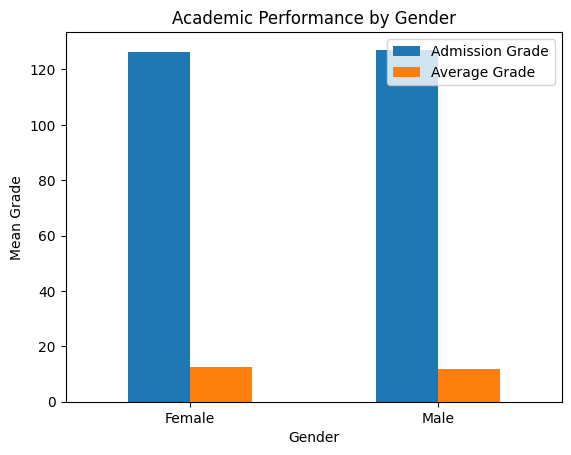

<Figure size 1200x600 with 0 Axes>

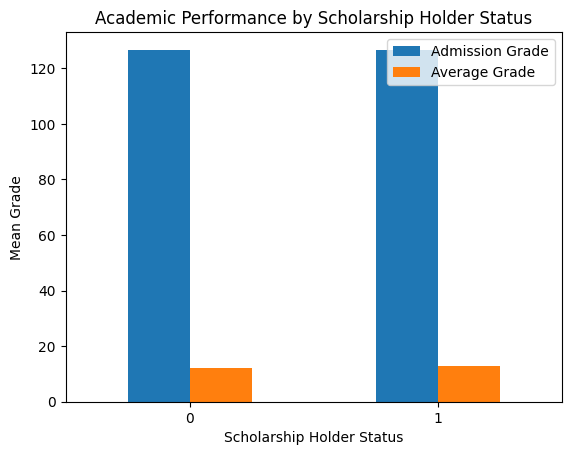

<Figure size 1200x600 with 0 Axes>

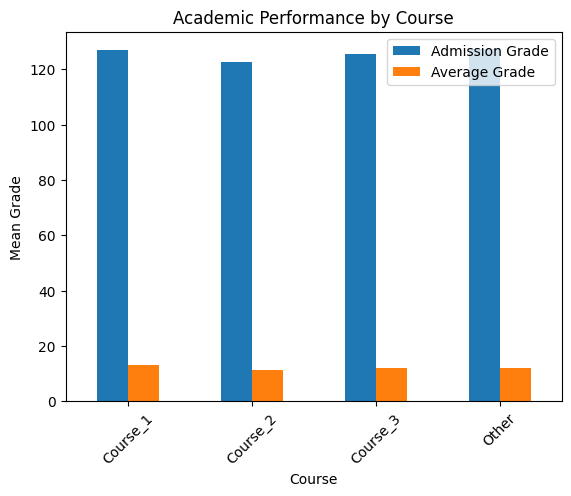

In [24]:
# Analyze academic performance metrics across different groups of students

# Group by gender and calculate mean admission grade and average grade
gender_performance = data.groupby('GENDER')[['ADMISSION_GRADE', 'AVERAGE_GRADE']].mean()
print("Academic Performance by Gender:")
print(gender_performance)

# Group by scholarship holder status and calculate mean admission grade and average grade
scholarship_performance = data.groupby('SCHOLARSHIP_HOLDER')[['ADMISSION_GRADE', 'AVERAGE_GRADE']].mean()
print("\nAcademic Performance by Scholarship Holder Status:")
print(scholarship_performance)

# Group by course and calculate mean admission grade and average grade
course_performance = data.groupby('COURSE')[['ADMISSION_GRADE', 'AVERAGE_GRADE']].mean()
print("\nAcademic Performance by Course:")
print(course_performance)

# Visualize the academic performance by gender
plt.figure(figsize=(12, 6))
gender_performance.plot(kind='bar')
plt.title('Academic Performance by Gender')
plt.xlabel('Gender')
plt.ylabel('Mean Grade')
plt.xticks(rotation=0)
plt.legend(['Admission Grade', 'Average Grade'])
plt.show()

# Visualize the academic performance by scholarship holder status
plt.figure(figsize=(12, 6))
scholarship_performance.plot(kind='bar')
plt.title('Academic Performance by Scholarship Holder Status')
plt.xlabel('Scholarship Holder Status')
plt.ylabel('Mean Grade')
plt.xticks(rotation=0)
plt.legend(['Admission Grade', 'Average Grade'])
plt.show()

# Visualize the academic performance by course
plt.figure(figsize=(12, 6))
course_performance.plot(kind='bar')
plt.title('Academic Performance by Course')
plt.xlabel('Course')
plt.ylabel('Mean Grade')
plt.xticks(rotation=45)
plt.legend(['Admission Grade', 'Average Grade'])
plt.show()

Accuracy: 0.61
Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.44      0.48       180
           1       0.33      0.19      0.24       159
           2       0.68      0.84      0.75       411

    accuracy                           0.61       750
   macro avg       0.51      0.49      0.49       750
weighted avg       0.57      0.61      0.58       750



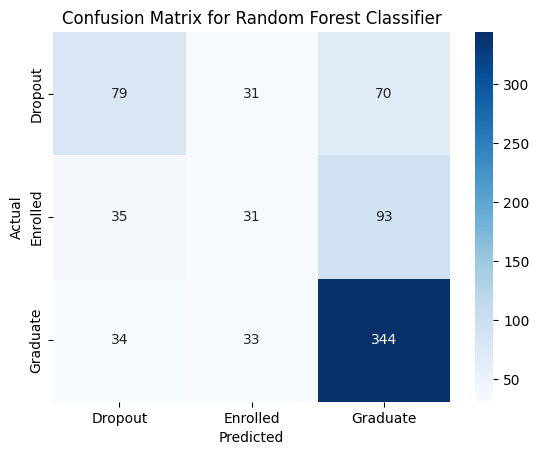

In [25]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns

# Predictive Analysis

import matplotlib.pyplot as plt

# Select features and target variable
features = ['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'AVERAGE_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP']
target = 'TARGET'

# Encode the target variable
data[target] = data[target].map({'Dropout': 0, 'Enrolled': 1, 'Graduate': 2})

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.2, random_state=42)

# Train a Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate a classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Generate a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Dropout', 'Enrolled', 'Graduate'], yticklabels=['Dropout', 'Enrolled', 'Graduate'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Random Forest Classifier')
plt.show()

C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Accuracy: 0.63
Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.47      0.54       180
           1       0.67      0.01      0.02       159
           2       0.63      0.95      0.76       411

    accuracy                           0.63       750
   macro avg       0.65      0.48      0.44       750
weighted avg       0.64      0.63      0.55       750



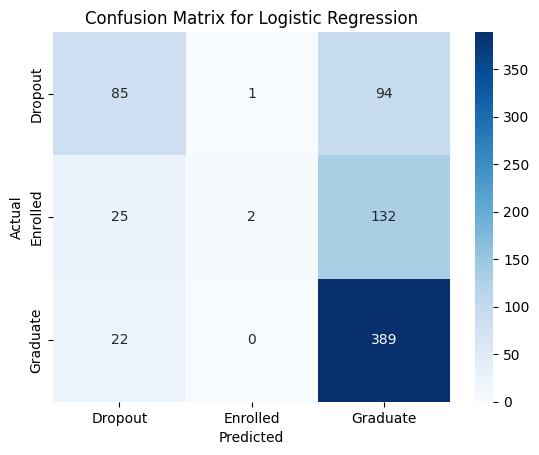

Decision Tree Accuracy: 0.55
Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       0.45      0.47      0.46       180
           1       0.29      0.28      0.28       159
           2       0.69      0.69      0.69       411

    accuracy                           0.55       750
   macro avg       0.48      0.48      0.48       750
weighted avg       0.55      0.55      0.55       750



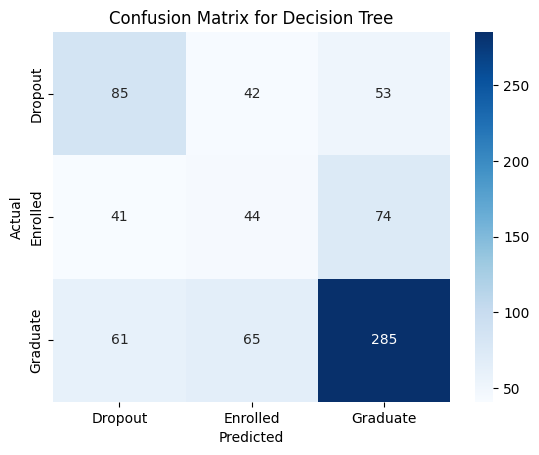

Neural Network Accuracy: 0.62
Neural Network Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.37      0.48       180
           1       0.00      0.00      0.00       159
           2       0.61      0.96      0.75       411

    accuracy                           0.62       750
   macro avg       0.43      0.44      0.41       750
weighted avg       0.49      0.62      0.52       750



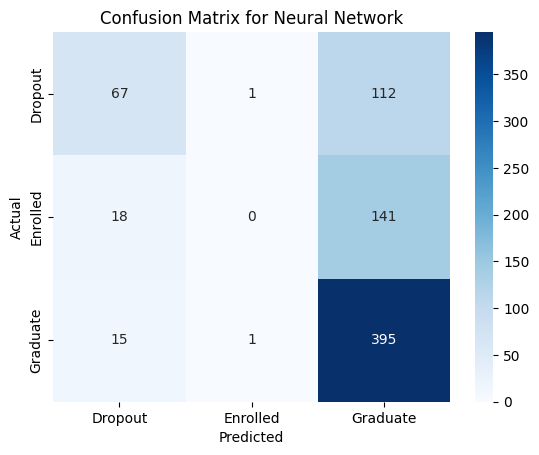

SVM Accuracy: 0.61
SVM Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.28      0.43       180
           1       0.00      0.00      0.00       159
           2       0.59      1.00      0.74       411

    accuracy                           0.61       750
   macro avg       0.49      0.43      0.39       750
weighted avg       0.54      0.61      0.51       750



C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

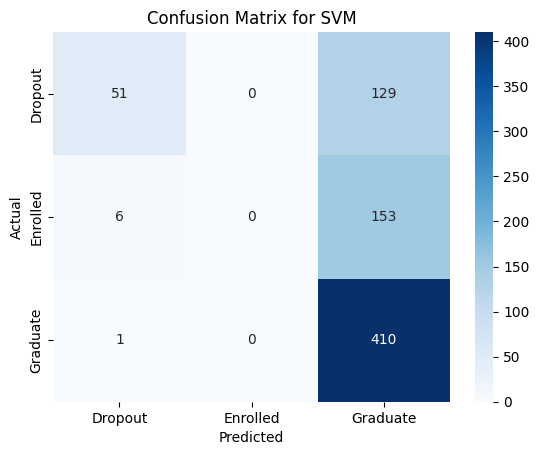

In [28]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns

# Objective: Build models to predict student outcomes (dropout, graduation, or enrollment)

import matplotlib.pyplot as plt

# Train and evaluate Logistic Regression model
logistic_model = LogisticRegression(random_state=42, max_iter=200)
logistic_model.fit(X_train, y_train)
y_pred_logistic = logistic_model.predict(X_test)
accuracy_logistic = accuracy_score(y_test, y_pred_logistic)
print(f"Logistic Regression Accuracy: {accuracy_logistic:.2f}")
print("Logistic Regression Classification Report:")
print(classification_report(y_test, y_pred_logistic))
conf_matrix_logistic = confusion_matrix(y_test, y_pred_logistic)
sns.heatmap(conf_matrix_logistic, annot=True, fmt='d', cmap='Blues', xticklabels=['Dropout', 'Enrolled', 'Graduate'], yticklabels=['Dropout', 'Enrolled', 'Graduate'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Logistic Regression')
plt.show()

# Train and evaluate Decision Tree model
decision_tree_model = DecisionTreeClassifier(random_state=42)
decision_tree_model.fit(X_train, y_train)
y_pred_decision_tree = decision_tree_model.predict(X_test)
accuracy_decision_tree = accuracy_score(y_test, y_pred_decision_tree)
print(f"Decision Tree Accuracy: {accuracy_decision_tree:.2f}")
print("Decision Tree Classification Report:")
print(classification_report(y_test, y_pred_decision_tree))
conf_matrix_decision_tree = confusion_matrix(y_test, y_pred_decision_tree)
sns.heatmap(conf_matrix_decision_tree, annot=True, fmt='d', cmap='Blues', xticklabels=['Dropout', 'Enrolled', 'Graduate'], yticklabels=['Dropout', 'Enrolled', 'Graduate'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Decision Tree')
plt.show()

# Train and evaluate Neural Network model
neural_network_model = MLPClassifier(random_state=42, max_iter=300)
neural_network_model.fit(X_train, y_train)
y_pred_neural_network = neural_network_model.predict(X_test)
accuracy_neural_network = accuracy_score(y_test, y_pred_neural_network)
print(f"Neural Network Accuracy: {accuracy_neural_network:.2f}")
print("Neural Network Classification Report:")
print(classification_report(y_test, y_pred_neural_network))
conf_matrix_neural_network = confusion_matrix(y_test, y_pred_neural_network)
sns.heatmap(conf_matrix_neural_network, annot=True, fmt='d', cmap='Blues', xticklabels=['Dropout', 'Enrolled', 'Graduate'], yticklabels=['Dropout', 'Enrolled', 'Graduate'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Neural Network')
plt.show()

# Train and evaluate Support Vector Machine (SVM) model
svm_model = SVC(kernel='linear', random_state=42)
svm_model.fit(X_train, y_train)
y_pred_svm = svm_model.predict(X_test)
accuracy_svm = accuracy_score(y_test, y_pred_svm)
print(f"SVM Accuracy: {accuracy_svm:.2f}")
print("SVM Classification Report:")
print(classification_report(y_test, y_pred_svm))
conf_matrix_svm = confusion_matrix(y_test, y_pred_svm)
sns.heatmap(conf_matrix_svm, annot=True, fmt='d', cmap='Blues', xticklabels=['Dropout', 'Enrolled', 'Graduate'], yticklabels=['Dropout', 'Enrolled', 'Graduate'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for SVM')
plt.show()

Feature Importances:
             Feature  Importance
2      AVERAGE_GRADE    0.462814
0    ADMISSION_GRADE    0.246640
1  AGE_AT_ENROLLMENT    0.169201
5                GDP    0.043045
3  UNEMPLOYMENT_RATE    0.039821
4     INFLATION_RATE    0.038479


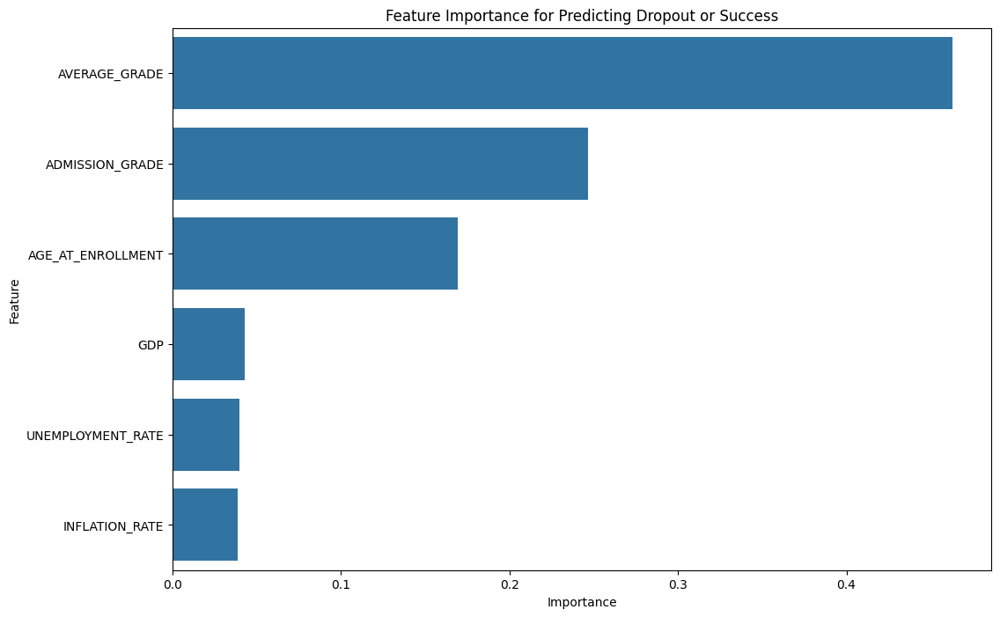

In [26]:
# Determine the most predictive features of student dropout or success using feature importance from the RandomForestClassifier

# Train the RandomForestClassifier if not already trained
if 'rf_classifier' not in globals():
    rf_classifier = RandomForestClassifier(random_state=42)
    rf_classifier.fit(X_train, y_train)

# Get feature importances from the trained RandomForestClassifier
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the feature importances
print("Feature Importances:")
print(feature_importance_df)

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance for Predicting Dropout or Success')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()# Determine the most predictive features of student dropout or success using feature importance from the RandomForestClassifier

# Train the RandomForestClassifier if not already trained
if 'rf_classifier' not in globals():
    rf_classifier = RandomForestClassifier(random_state=42)
    rf_classifier.fit(X_train, y_train)

# Get feature importances from the trained RandomForestClassifier
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the feature importances
print("Feature Importances:")
print(feature_importance_df)

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance for Predicting Dropout or Success')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()# Determine the most predictive features of student dropout or success using feature importance from the RandomForestClassifier

# Train the RandomForestClassifier if not already trained
if 'rf_classifier' not in globals():
    rf_classifier = RandomForestClassifier(random_state=42)
    rf_classifier.fit(X_train, y_train)

# Get feature importances from the trained RandomForestClassifier
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the feature importances
print("Feature Importances:")
print(feature_importance_df)

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance for Predicting Dropout or Success')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Accuracy: 0.63
Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.47      0.54       180
           1       0.67      0.01      0.02       159
           2       0.63      0.95      0.76       411

    accuracy                           0.63       750
   macro avg       0.65      0.48      0.44       750
weighted avg       0.64      0.63      0.55       750



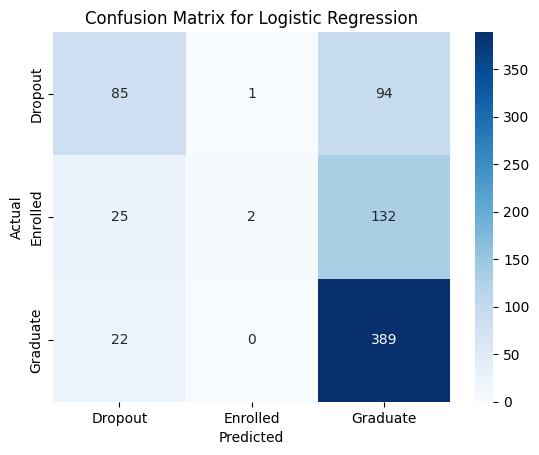

Decision Tree Accuracy: 0.55
Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       0.45      0.47      0.46       180
           1       0.29      0.28      0.28       159
           2       0.69      0.69      0.69       411

    accuracy                           0.55       750
   macro avg       0.48      0.48      0.48       750
weighted avg       0.55      0.55      0.55       750



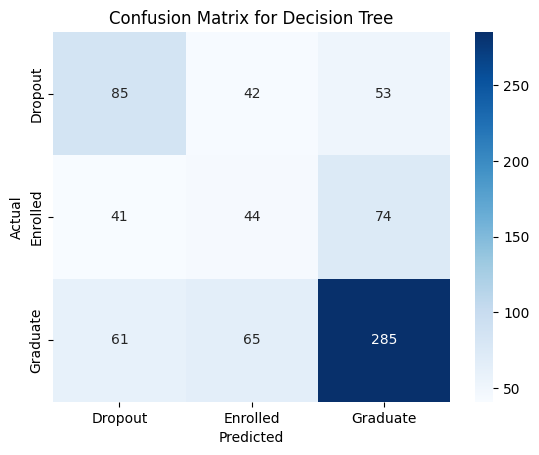

Random Forest Accuracy: 0.61
Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.44      0.48       180
           1       0.33      0.19      0.24       159
           2       0.68      0.84      0.75       411

    accuracy                           0.61       750
   macro avg       0.51      0.49      0.49       750
weighted avg       0.57      0.61      0.58       750



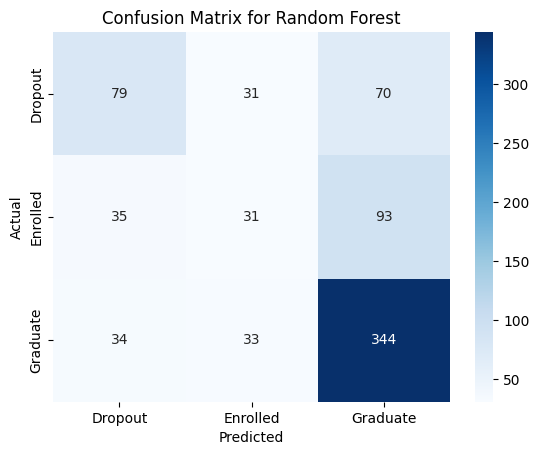

Neural Network Accuracy: 0.62
Neural Network Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.37      0.48       180
           1       0.00      0.00      0.00       159
           2       0.61      0.96      0.75       411

    accuracy                           0.62       750
   macro avg       0.43      0.44      0.41       750
weighted avg       0.49      0.62      0.52       750



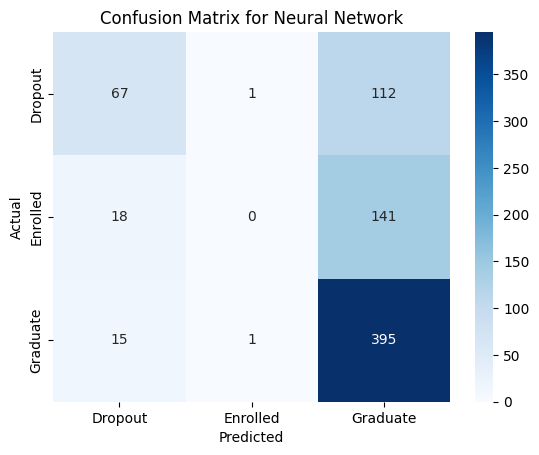

In [3]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
import seaborn as sns

# Evaluate the accuracy of various machine learning models in predicting student outcomes

# Import necessary libraries
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('cleaned_data.csv')

# Define features and target variable
features = ['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'AVERAGE_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP']
target = 'TARGET'

# Encode the target variable if necessary
data[target] = data[target].map({'Dropout': 0, 'Enrolled': 1, 'Graduate': 2})

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.2, random_state=42)

# Initialize models
models = {
    'Logistic Regression': LogisticRegression(random_state=42, max_iter=200),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Neural Network': MLPClassifier(random_state=42, max_iter=300)
}

# Train and evaluate each model
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"{model_name} Accuracy: {accuracy:.2f}")
    print(f"{model_name} Classification Report:")
    print(classification_report(y_test, y_pred))
    
    # Generate and plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Dropout', 'Enrolled', 'Graduate'], yticklabels=['Dropout', 'Enrolled', 'Graduate'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix for {model_name}')
    plt.show()

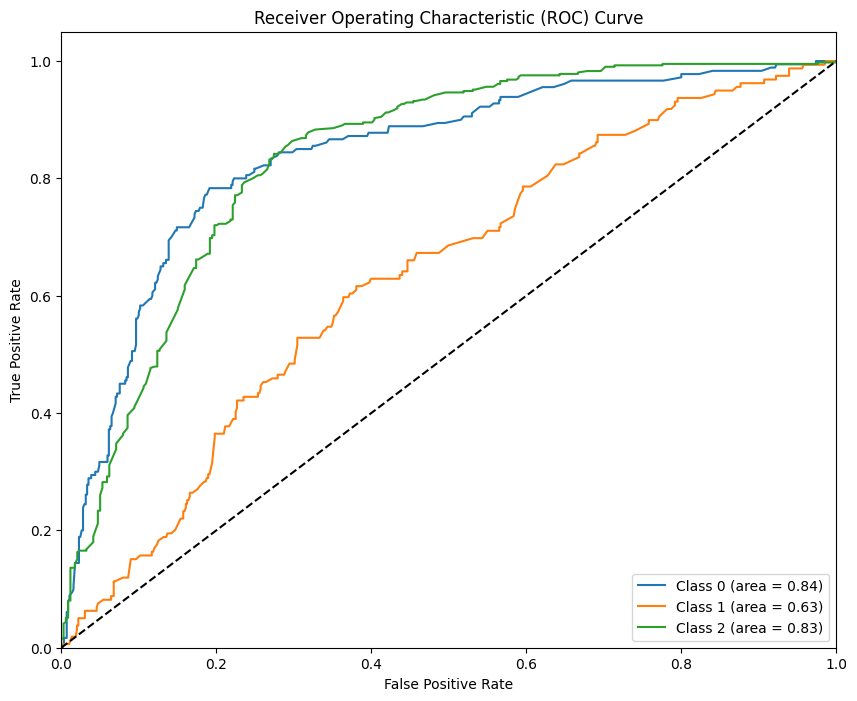

Overall ROC-AUC for Gradient Boosting Classifier: 0.77


In [7]:
from sklearn.metrics import roc_auc_score, roc_curve

import matplotlib.pyplot as plt

# Calculate ROC-AUC for Gradient Boosting Classifier
y_pred_proba_gb = gb_classifier.predict_proba(X_test)
roc_auc_gb = roc_auc_score(y_test, y_pred_proba_gb, multi_class='ovr')

# Calculate ROC curve for each class
fpr = {}
tpr = {}
roc_auc = {}

for i in range(3):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba_gb[:, i], pos_label=i)
    roc_auc[i] = roc_auc_score(y_test == i, y_pred_proba_gb[:, i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(3):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

print(f"Overall ROC-AUC for Gradient Boosting Classifier: {roc_auc_gb:.2f}")

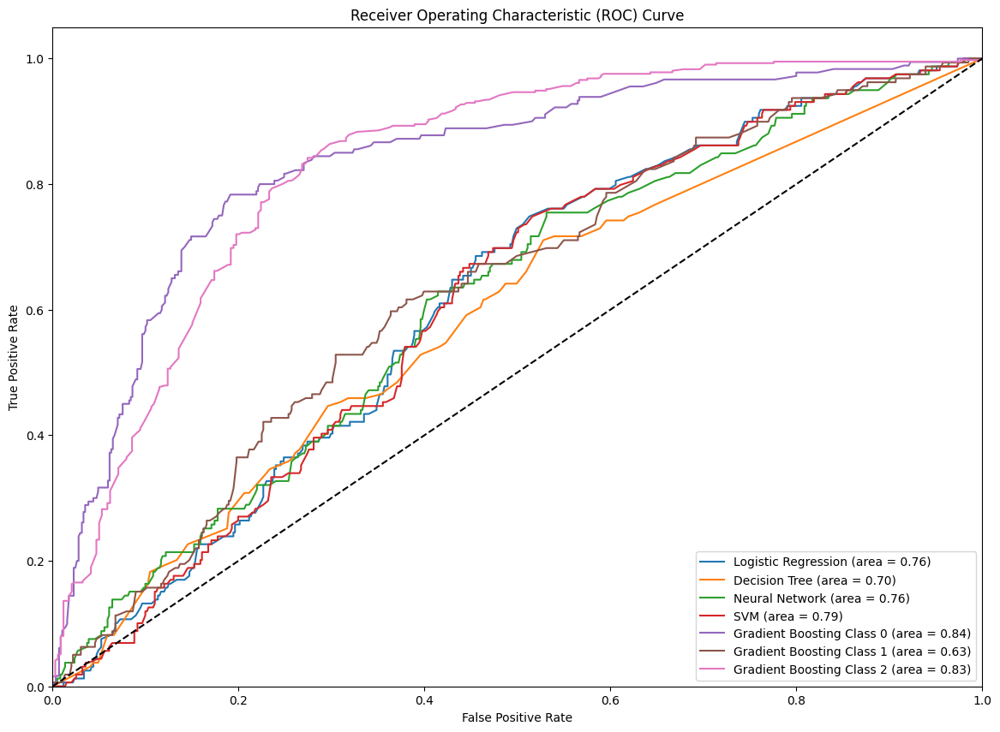

ROC-AUC for Logistic Regression: 0.76
ROC-AUC for Decision Tree: 0.70
ROC-AUC for Neural Network: 0.76
ROC-AUC for SVM: 0.79


In [17]:
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
import matplotlib.pyplot as plt

# Train and define the Decision Tree model
decision_tree_model = DecisionTreeClassifier(random_state=42)
decision_tree_model.fit(X_train, y_train)

# Train and define the Neural Network model
neural_network_model = MLPClassifier(random_state=42, max_iter=300)
neural_network_model.fit(X_train, y_train)

# Train and define the SVM model
svm_model = SVC(kernel='linear', random_state=42, probability=True)
svm_model.fit(X_train, y_train)

# Calculate ROC-AUC for Logistic Regression
y_pred_proba_logistic = logistic_model.predict_proba(X_test)
roc_auc_logistic = roc_auc_score(y_test, y_pred_proba_logistic, multi_class='ovr')

# Calculate ROC-AUC for Decision Tree
y_pred_proba_dt = decision_tree_model.predict_proba(X_test)
roc_auc_dt = roc_auc_score(y_test, y_pred_proba_dt, multi_class='ovr')

# Calculate ROC-AUC for Neural Network
y_pred_proba_nn = neural_network_model.predict_proba(X_test)
roc_auc_nn = roc_auc_score(y_test, y_pred_proba_nn, multi_class='ovr')

# Calculate ROC-AUC for SVM (using predict_proba)
y_pred_proba_svm = svm_model.predict_proba(X_test)
roc_auc_svm = roc_auc_score(y_test, y_pred_proba_svm, multi_class='ovr', average='weighted')


# Plot ROC curve for each classifier
plt.figure(figsize=(14, 10))

# Logistic Regression
fpr_logistic, tpr_logistic, _ = roc_curve(y_test, y_pred_proba_logistic[:, 1], pos_label=1)
plt.plot(fpr_logistic, tpr_logistic, label=f'Logistic Regression (area = {roc_auc_logistic:.2f})')

# Decision Tree
fpr_dt, tpr_dt, _ = roc_curve(y_test, y_pred_proba_dt[:, 1], pos_label=1)
plt.plot(fpr_dt, tpr_dt, label=f'Decision Tree (area = {roc_auc_dt:.2f})')

# Neural Network
fpr_nn, tpr_nn, _ = roc_curve(y_test, y_pred_proba_nn[:, 1], pos_label=1)
plt.plot(fpr_nn, tpr_nn, label=f'Neural Network (area = {roc_auc_nn:.2f})')

# SVM
fpr_svm, tpr_svm, _ = roc_curve(y_test, y_pred_proba_svm[:, 1], pos_label=1)
plt.plot(fpr_svm, tpr_svm, label=f'SVM (area = {roc_auc_svm:.2f})')

# Gradient Boosting
for i in range(3):
    plt.plot(fpr[i], tpr[i], label=f'Gradient Boosting Class {i} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

print(f"ROC-AUC for Logistic Regression: {roc_auc_logistic:.2f}")
print(f"ROC-AUC for Decision Tree: {roc_auc_dt:.2f}")
print(f"ROC-AUC for Neural Network: {roc_auc_nn:.2f}")
print(f"ROC-AUC for SVM: {roc_auc_svm:.2f}")

Validation Accuracy: 0.63
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.36      0.43       132
           1       0.32      0.20      0.24       121
           2       0.71      0.88      0.78       347

    accuracy                           0.63       600
   macro avg       0.52      0.48      0.49       600
weighted avg       0.59      0.63      0.60       600



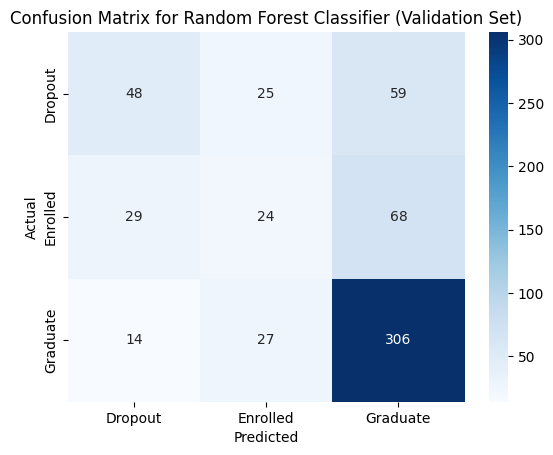

In [18]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns

import matplotlib.pyplot as plt

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Train a Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)

# Make predictions on the validation set
y_val_pred = rf_classifier.predict(X_val)

# Calculate the accuracy of the model
accuracy_val = accuracy_score(y_val, y_val_pred)
print(f"Validation Accuracy: {accuracy_val:.2f}")

# Generate a classification report
class_report_val = classification_report(y_val, y_val_pred)
print("Validation Classification Report:")
print(class_report_val)

# Generate a confusion matrix
conf_matrix_val = confusion_matrix(y_val, y_val_pred)
sns.heatmap(conf_matrix_val, annot=True, fmt='d', cmap='Blues', xticklabels=['Dropout', 'Enrolled', 'Graduate'], yticklabels=['Dropout', 'Enrolled', 'Graduate'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Random Forest Classifier (Validation Set)')
plt.show()

In [19]:
# Predict the likelihood of dropout for each student using the trained RandomForestClassifier

# Get the predicted probabilities for each class
y_pred_proba = rf_classifier.predict_proba(X_test)

# Extract the probability of dropout (class 0)
dropout_probabilities = y_pred_proba[:, 0]

# Add the dropout probabilities to the test dataset
X_test['Dropout_Probability'] = dropout_probabilities

# Display the first few rows to verify the changes
print(X_test.head())

      CURRICULAR_UNITS_1ST_SEM_CREDITED  CURRICULAR_UNITS_1ST_SEM_APPROVED  \
3020                                  0                                  5   
3266                                  0                                  7   
351                                   5                                 11   
1652                                  1                                  5   
3214                                  2                                  4   

      ADMISSION_GRADE  Dropout_Probability  
3020            106.0             0.000000  
3266            131.0             0.077785  
351             111.0             0.061111  
1652            100.0             0.484167  
3214            121.0             0.602897  


Feature Importances:
                             Feature  Importance
1  CURRICULAR_UNITS_1ST_SEM_APPROVED    0.476050
2                    ADMISSION_GRADE    0.419391
0  CURRICULAR_UNITS_1ST_SEM_CREDITED    0.104559


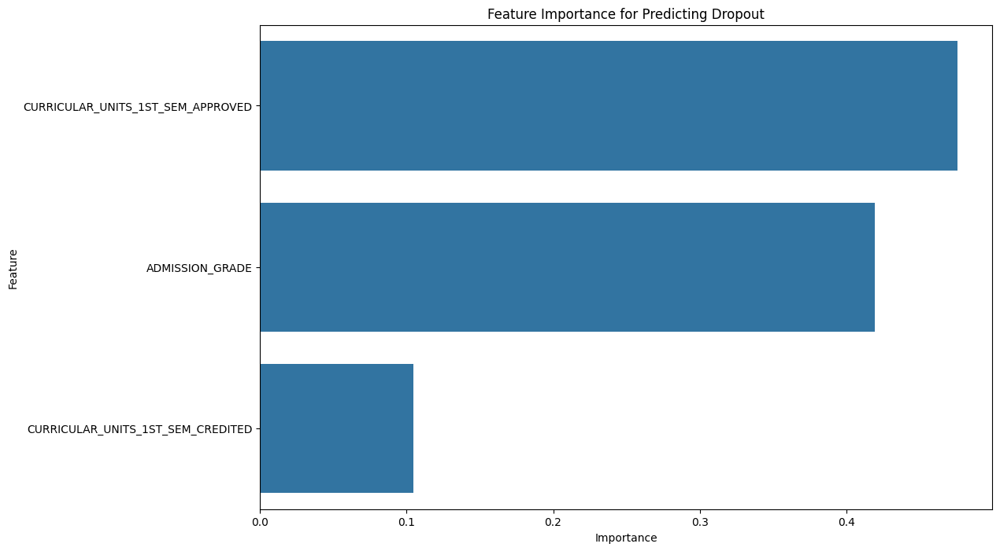

In [20]:
import pandas as pd
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

# Interpreting the model to understand the factors contributing to dropout

import matplotlib.pyplot as plt

# Train the RandomForestClassifier if not already trained
if 'rf_classifier' not in globals():
    rf_classifier = RandomForestClassifier(random_state=42)
    rf_classifier.fit(X_train, y_train)

# Get feature importances from the trained RandomForestClassifier
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the feature importances
print("Feature Importances:")
print(feature_importance_df)

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance for Predicting Dropout')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [4]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Compare different algorithms in terms of accuracy, precision, recall, and F1-score

# Import necessary libraries

# Initialize models
models = {
    'Logistic Regression': LogisticRegression(random_state=42, max_iter=200),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Neural Network': MLPClassifier(random_state=42, max_iter=300)
}

# Train and evaluate each model
results = {}
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    
    results[model_name] = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1
    }
    
    print(f"{model_name} Classification Report:")
    print(classification_report(y_test, y_pred))
    print("\n")

# Display the results
results_df = pd.DataFrame(results).T
print("Comparison of Different Algorithms:")
print(results_df)

C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.47      0.54       180
           1       0.67      0.01      0.02       159
           2       0.63      0.95      0.76       411

    accuracy                           0.63       750
   macro avg       0.65      0.48      0.44       750
weighted avg       0.64      0.63      0.55       750



Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       0.45      0.47      0.46       180
           1       0.29      0.28      0.28       159
           2       0.69      0.69      0.69       411

    accuracy                           0.55       750
   macro avg       0.48      0.48      0.48       750
weighted avg       0.55      0.55      0.55       750



Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.44      0.48       180
        

In [8]:
# Fit the RandomForestClassifier instance with the training data
rf_classifier.fit(X_train, y_train)

# Now you can make predictions
y_pred = rf_classifier.predict(X_test)


In [2]:
# Fit the RandomForestClassifier instance with the training data
rf_classifier.fit(X_train, y_train)

# Now you can make predictions
y_pred = rf_classifier.predict(X_test)


Feature Importances:
             Feature  Importance
2      AVERAGE_GRADE    0.462814
0    ADMISSION_GRADE    0.246640
1  AGE_AT_ENROLLMENT    0.169201
5                GDP    0.043045
3  UNEMPLOYMENT_RATE    0.039821
4     INFLATION_RATE    0.038479


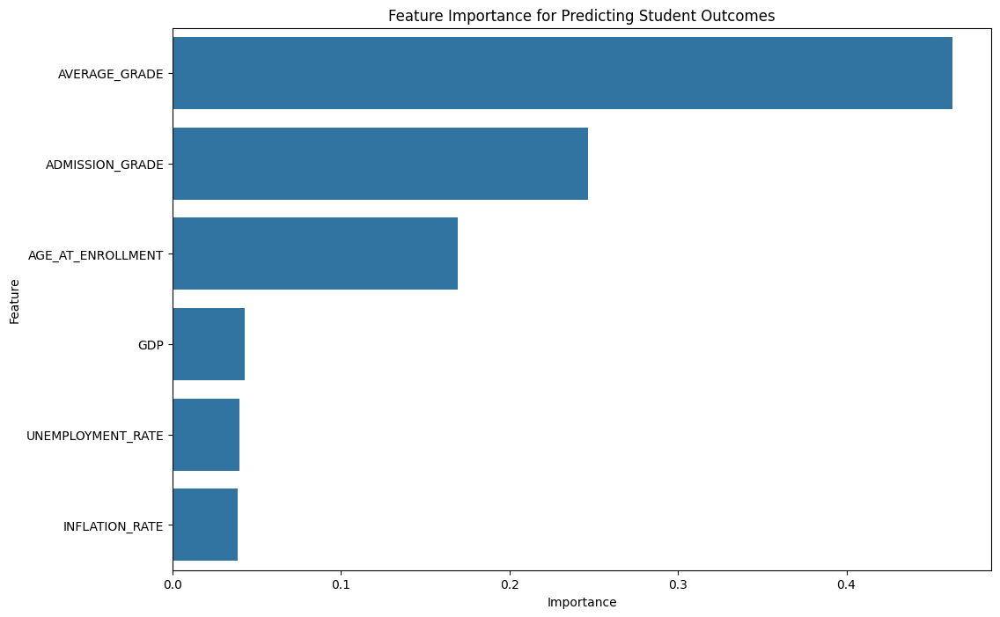

In [4]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt

# Feature Importance Analysis
# Identify the most important factors influencing student outcomes using feature importance from the RandomForestClassifier

# Load the dataset
data = pd.read_csv('cleaned_data.csv')

# Prepare the data
features = ['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'AVERAGE_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP']
target = 'TARGET'
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.2, random_state=42)

# Train the RandomForestClassifier if not already trained
if 'rf_classifier' not in globals():
    rf_classifier = RandomForestClassifier(random_state=42)
    rf_classifier.fit(X_train, y_train)

# Get feature importances from the trained RandomForestClassifier
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the feature importances
print("Feature Importances:")
print(feature_importance_df)

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance for Predicting Student Outcomes')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

Feature Importances:
             Feature  Importance
2      AVERAGE_GRADE    0.462814
0    ADMISSION_GRADE    0.246640
1  AGE_AT_ENROLLMENT    0.169201
5                GDP    0.043045
3  UNEMPLOYMENT_RATE    0.039821
4     INFLATION_RATE    0.038479


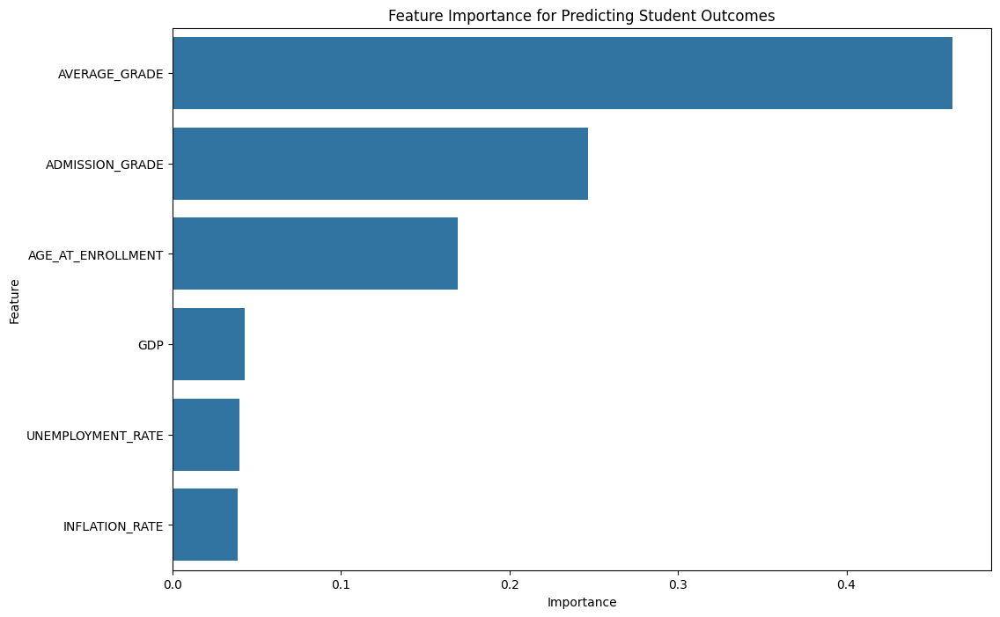

In [9]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import seaborn as sns

# Feature Importance Analysis
# Identify the most important factors influencing student outcomes using feature importance from the RandomForestClassifier

# Load the dataset
data = pd.read_csv('cleaned_data.csv')

# Prepare the data
features = ['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'AVERAGE_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP']
target = 'TARGET'
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.2, random_state=42)

# Train the RandomForestClassifier if not already trained
# Train the RandomForestClassifier if not already trained
if 'rf_classifier' not in globals():
    rf_classifier = RandomForestClassifier(random_state=42)
    rf_classifier.fit(X_train, y_train)

# Get feature importances from the trained RandomForestClassifier
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the feature importances
print("Feature Importances:")
print(feature_importance_df)

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance for Predicting Student Outcomes')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [6]:
from statsmodels.formula.api import ols
import statsmodels.api as sm

# Ensure 'TARGET' is numeric
data['TARGET'] = data['TARGET'].map({'Dropout': 0, 'Enrolled': 1, 'Graduate': 2})

# Create interaction terms between socioeconomic status and academic performance
data['UNEMPLOYMENT_RATE_AVERAGE_GRADE'] = data['UNEMPLOYMENT_RATE'] * data['AVERAGE_GRADE']
data['INFLATION_RATE_AVERAGE_GRADE'] = data['INFLATION_RATE'] * data['AVERAGE_GRADE']
data['GDP_AVERAGE_GRADE'] = data['GDP'] * data['AVERAGE_GRADE']

# Fit an OLS model to examine the interactions
interaction_model = ols('TARGET ~ UNEMPLOYMENT_RATE + INFLATION_RATE + GDP + AVERAGE_GRADE + UNEMPLOYMENT_RATE_AVERAGE_GRADE + INFLATION_RATE_AVERAGE_GRADE + GDP_AVERAGE_GRADE', data=data).fit()

# Print the summary of the model to see the significance of the interaction terms
print(interaction_model.summary())

                            OLS Regression Results                            
Dep. Variable:                 TARGET   R-squared:                       0.241
Model:                            OLS   Adj. R-squared:                  0.240
Method:                 Least Squares   F-statistic:                     169.9
Date:                Tue, 21 Jan 2025   Prob (F-statistic):          8.19e-219
Time:                        21:03:04   Log-Likelihood:                -4105.4
No. Observations:                3748   AIC:                             8227.
Df Residuals:                    3740   BIC:                             8277.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

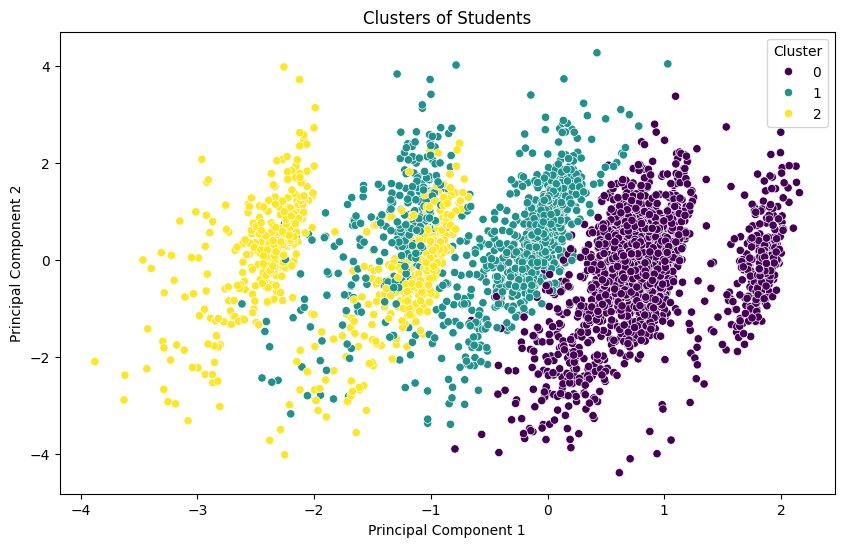

Cluster Analysis:
         ADMISSION_GRADE  AGE_AT_ENROLLMENT  AVERAGE_GRADE  UNEMPLOYMENT_RATE  \
Cluster                                                                         
0             125.265023          22.190550      12.335655          10.044941   
1             128.937833          23.642984      12.354929          12.695471   
2             126.797037          23.250370      12.203126          14.052296   

         INFLATION_RATE       GDP  
Cluster                            
0              1.385054  1.749096  
1             -0.301687 -1.167851  
2              3.265333 -2.839793  


In [8]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns

import matplotlib.pyplot as plt

# Perform clustering analysis to identify patterns and relationships in the dataset

# Select relevant features for clustering
clustering_features = ['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'AVERAGE_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP']

# Standardize the features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[clustering_features])

# Apply KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
data['Cluster'] = kmeans.fit_predict(data_scaled)

# Visualize the clusters using PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(data_scaled)
data['PC1'] = principal_components[:, 0]
data['PC2'] = principal_components[:, 1]

plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=data, palette='viridis')
plt.title('Clusters of Students')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# Analyze the clusters
cluster_analysis = data.groupby('Cluster')[clustering_features].mean()
print("Cluster Analysis:")
print(cluster_analysis)

Distribution of TARGET within each Cluster (%):
TARGET           0          1          2
Cluster                                 
0        22.239343  20.647149  57.113508
1        24.955595  19.005329  56.039076
2        23.851852  18.222222  57.925926


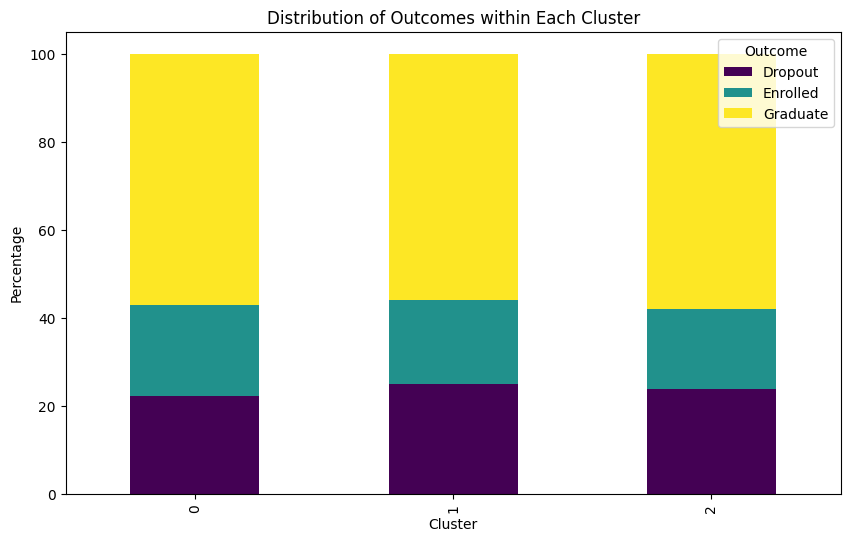

In [11]:
# Analyze the relationship between clusters and outcomes

# Create a crosstab to see the distribution of TARGET within each cluster
cluster_outcome_crosstab = pd.crosstab(data['Cluster'], data['TARGET'], normalize='index') * 100

# Print the crosstab
print("Distribution of TARGET within each Cluster (%):")
print(cluster_outcome_crosstab)

# Visualize the distribution
cluster_outcome_crosstab.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='viridis')
plt.title('Distribution of Outcomes within Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Percentage')
plt.legend(title='Outcome', labels=['Dropout', 'Enrolled', 'Graduate'])
plt.show()

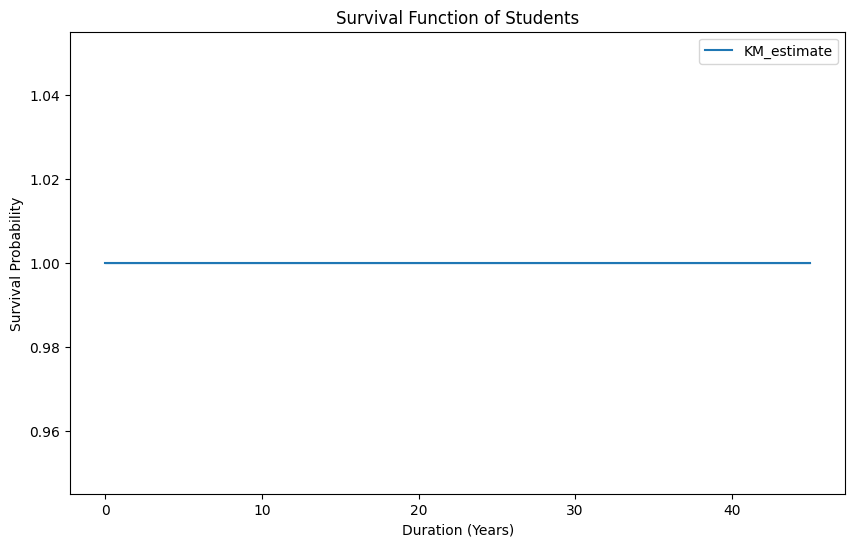

In [12]:
from lifelines import KaplanMeierFitter

import matplotlib.pyplot as plt

# Survival Analysis

# Assuming 'data' DataFrame has columns 'DURATION' (time until event or censoring) and 'EVENT' (1 if event occurred, 0 if censored)
# For this example, let's create these columns based on 'AGE_AT_ENROLLMENT' and 'TARGET' for simplicity

# Create a 'DURATION' column (e.g., years until dropout or graduation)
data['DURATION'] = data['AGE_AT_ENROLLMENT'] - data['AGE_AT_ENROLLMENT'].min()

# Create an 'EVENT' column (1 if graduated, 0 if not)
data['EVENT'] = data['TARGET'].apply(lambda x: 1 if x == 'Graduate' else 0)

# Initialize the KaplanMeierFitter
kmf = KaplanMeierFitter()

# Fit the data into the model
kmf.fit(durations=data['DURATION'], event_observed=data['EVENT'])

# Plot the survival function
plt.figure(figsize=(10, 6))
kmf.plot_survival_function()
plt.title('Survival Function of Students')
plt.xlabel('Duration (Years)')
plt.ylabel('Survival Probability')
plt.show()

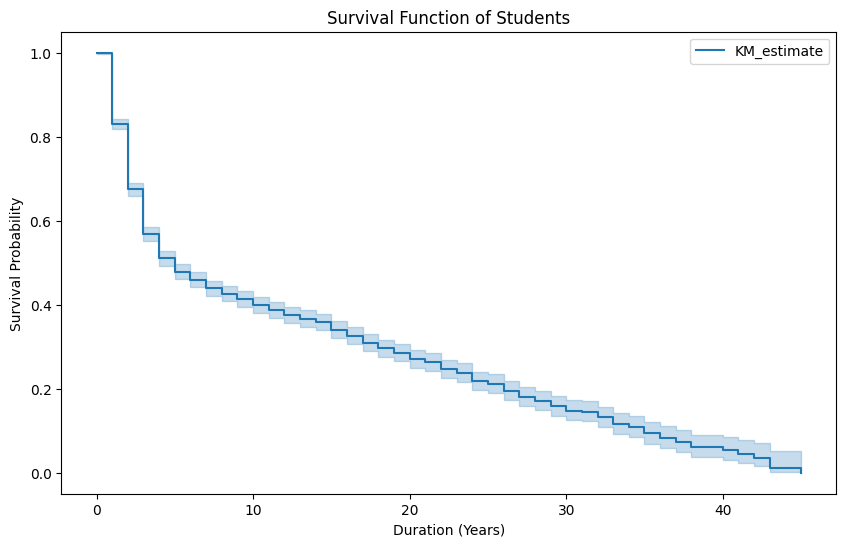

In [13]:
# Survival Analysis

from lifelines import KaplanMeierFitter

import matplotlib.pyplot as plt

# Assuming 'data' DataFrame has columns 'DURATION' (time until event or censoring) and 'EVENT' (1 if event occurred, 0 if censored)
# For this example, let's create these columns based on 'AGE_AT_ENROLLMENT' and 'TARGET' for simplicity

# Create a 'DURATION' column (e.g., years until dropout or graduation)
data['DURATION'] = data['AGE_AT_ENROLLMENT'] - data['AGE_AT_ENROLLMENT'].min()

# Create an 'EVENT' column (1 if graduated, 0 if not)
data['EVENT'] = data['TARGET'].apply(lambda x: 1 if x == 2 else 0)

# Initialize the KaplanMeierFitter
kmf = KaplanMeierFitter()

# Fit the data into the model
kmf.fit(durations=data['DURATION'], event_observed=data['EVENT'])

# Plot the survival function
plt.figure(figsize=(10, 6))
kmf.plot_survival_function()
plt.title('Survival Function of Students')
plt.xlabel('Duration (Years)')
plt.ylabel('Survival Probability')
plt.show()

             Feature        VIF
0    ADMISSION_GRADE  47.853989
1  AGE_AT_ENROLLMENT   9.977117
2      AVERAGE_GRADE  33.915405
3  UNEMPLOYMENT_RATE  19.749011
4     INFLATION_RATE   1.788208
5                GDP   1.131846
Iteration 1: norm_delta = 0.00e+00, step_size = 0.9500, log_lik = 0.00000, newton_decrement = 0.00e+00, seconds_since_start = 2.3
Convergence success after 1 iterations.
An error occurred: No admissable pairs in the dataset.. Please check the lifelines documentation for more information.


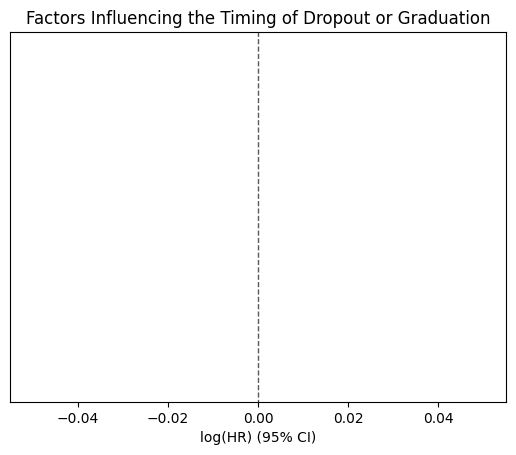

In [25]:
import pandas as pd
import numpy as np
from lifelines import CoxPHFitter
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Prepare the data for survival analysis
# Assuming 'DURATION' is the time until event or censoring and 'EVENT' is 1 if event occurred (graduation), 0 if censored (dropout)
data['EVENT'] = data['TARGET'].apply(lambda x: 1 if x == 'Graduate' else 0)

# Calculate VIF for each feature
X = data[cox_features]
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

# Print VIF values
print(vif_data)

# Remove features with high VIF (e.g., VIF > 5)
filtered_features = vif_data[vif_data["VIF"] <= 5]["Feature"].tolist()
filtered_features = vif_data[vif_data["VIF"] <= 10]["Feature"].tolist()

# Initialize the Cox Proportional Hazards model
cph = CoxPHFitter()
# Fit the model to the data with filtered features, ensuring to handle high collinearity
cph.fit(data[['DURATION', 'EVENT'] + filtered_features], duration_col='DURATION', event_col='EVENT', show_progress=True, strata=filtered_features)

# Print the summary of the model to see the significance of the factors, handling potential convergence issues
try:
    cph.print_summary()
except Exception as e:
    if "ConvergenceError" in str(e):
        print(f"Convergence error encountered: {e}. Please refer to the lifelines documentation for tips on handling convergence issues.")
    else:
        print(f"An error occurred: {e}. Please check the lifelines documentation for more information.")

# Plot the coefficients
cph.plot()
plt.title('Factors Influencing the Timing of Dropout or Graduation')
plt.show()

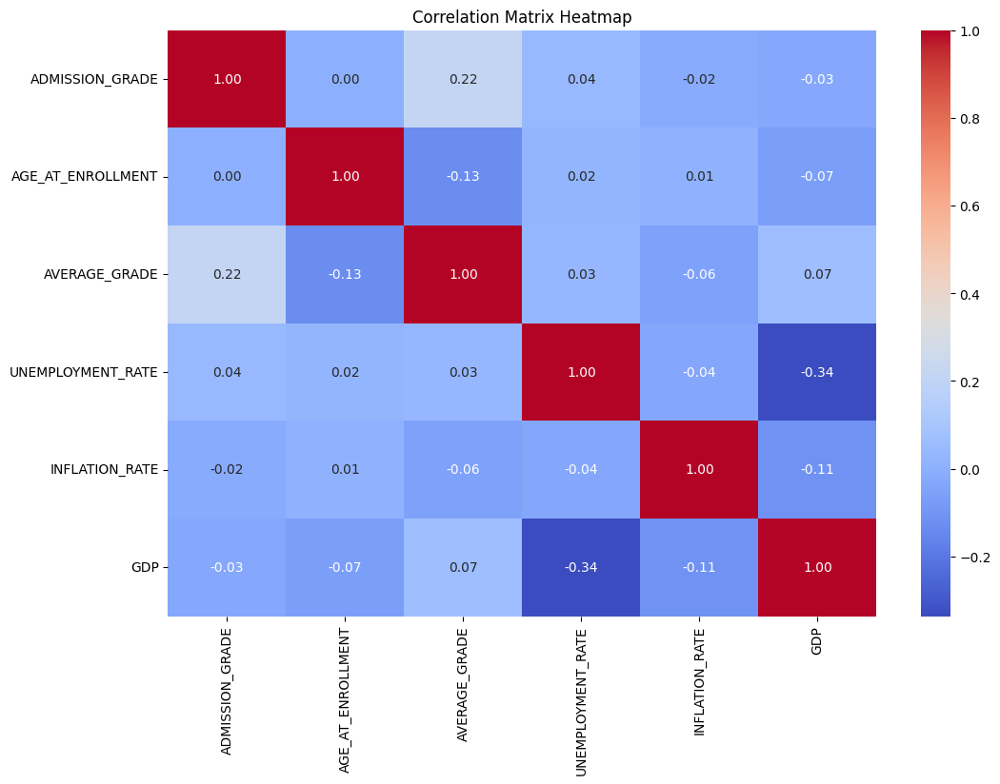

In [27]:
import seaborn as sns

# Correlation Analysis

import matplotlib.pyplot as plt

# Calculate the correlation matrix for the features
correlation_matrix = data[features].corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap')
plt.show()

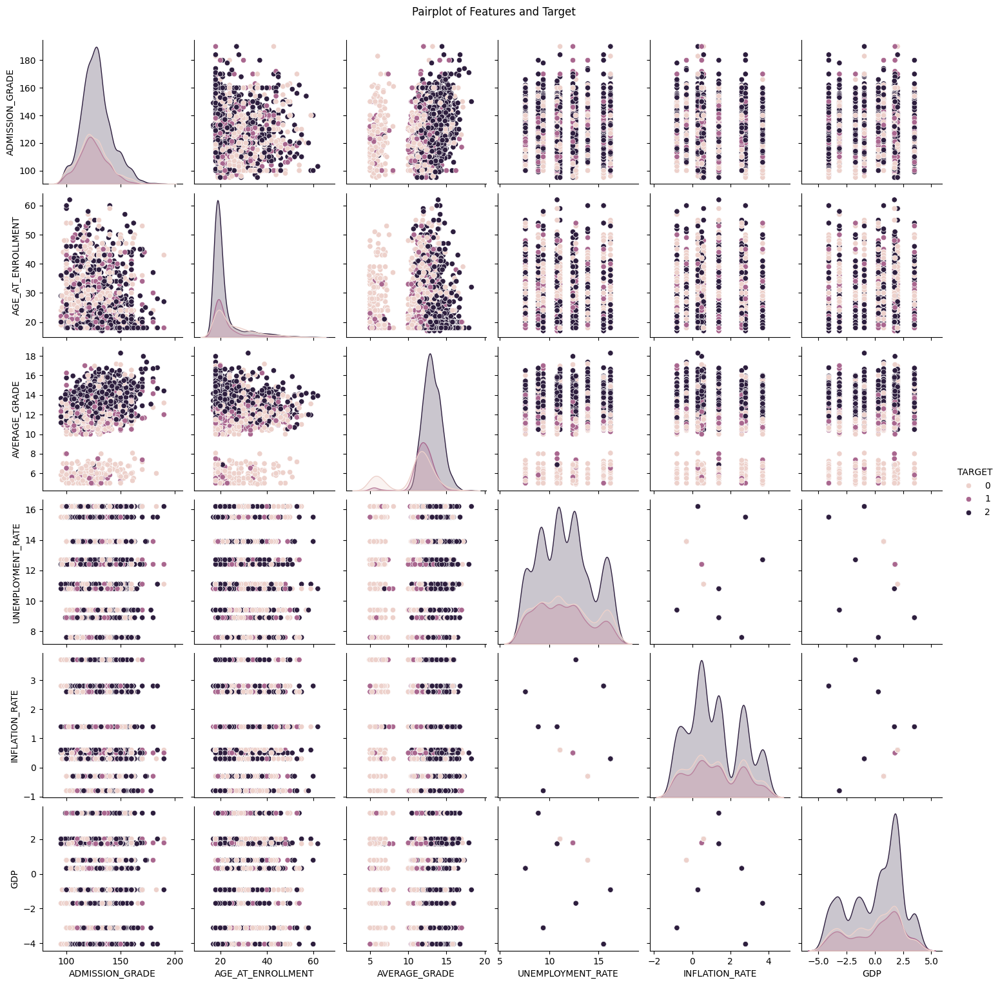

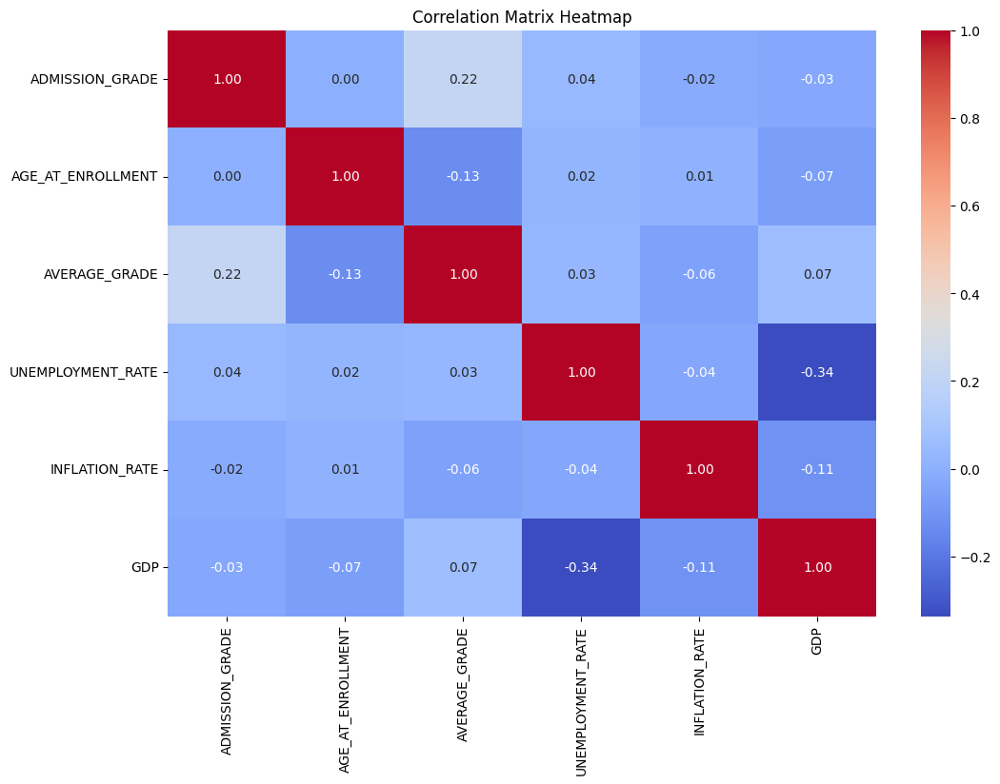

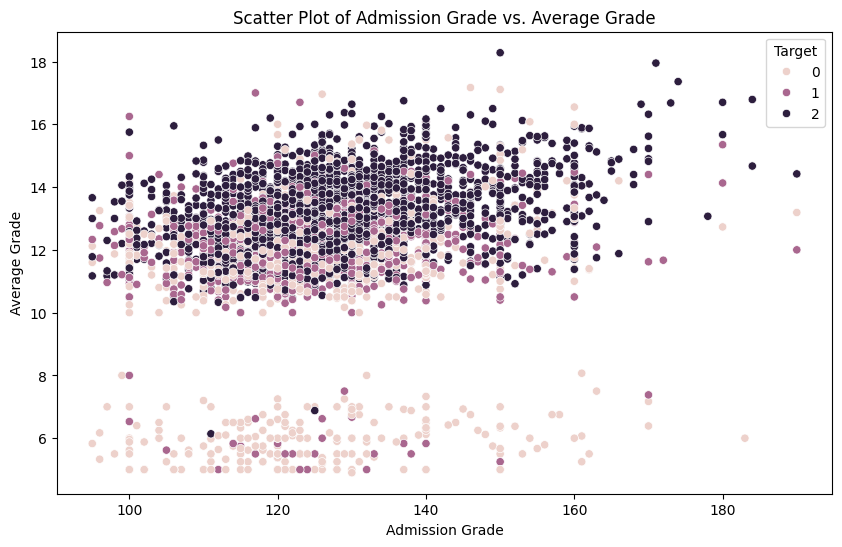

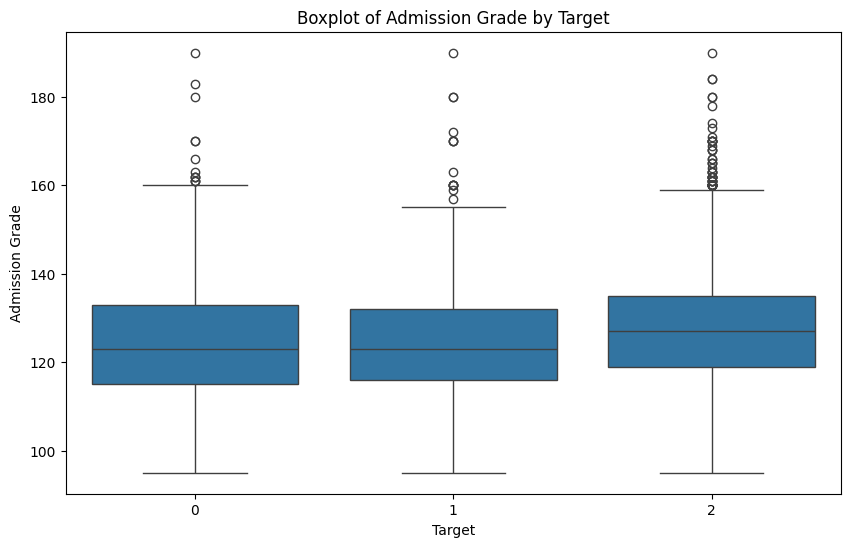

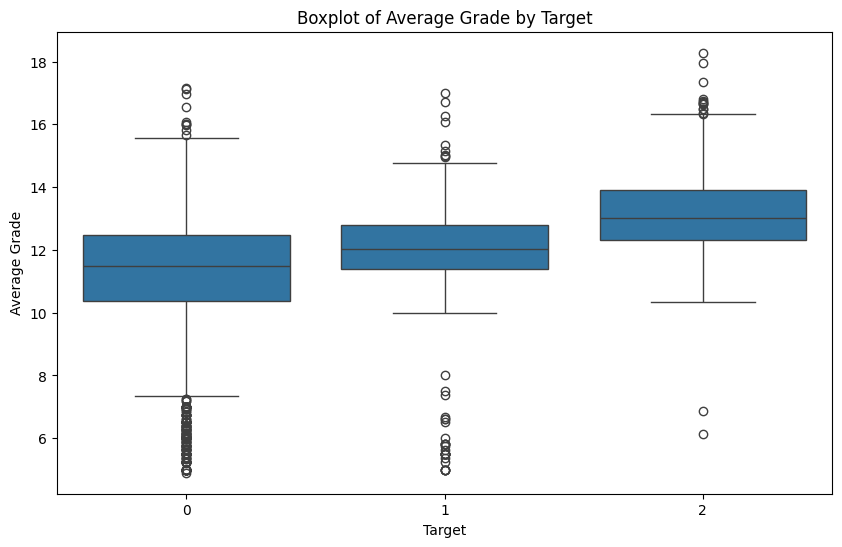

In [28]:
import seaborn as sns

# Explore relationships between variables

import matplotlib.pyplot as plt

# Pairplot to visualize relationships between variables
sns.pairplot(data[features + [target]], hue=target)
plt.suptitle('Pairplot of Features and Target', y=1.02)
plt.show()

# Correlation heatmap to visualize relationships between variables
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap')
plt.show()

# Scatter plot to visualize the relationship between ADMISSION_GRADE and AVERAGE_GRADE
plt.figure(figsize=(10, 6))
sns.scatterplot(x='ADMISSION_GRADE', y='AVERAGE_GRADE', hue=target, data=data)
plt.title('Scatter Plot of Admission Grade vs. Average Grade')
plt.xlabel('Admission Grade')
plt.ylabel('Average Grade')
plt.legend(title='Target')
plt.show()

# Boxplot to visualize the distribution of ADMISSION_GRADE by TARGET
plt.figure(figsize=(10, 6))
sns.boxplot(x=target, y='ADMISSION_GRADE', data=data)
plt.title('Boxplot of Admission Grade by Target')
plt.xlabel('Target')
plt.ylabel('Admission Grade')
plt.show()

# Boxplot to visualize the distribution of AVERAGE_GRADE by TARGET
plt.figure(figsize=(10, 6))
sns.boxplot(x=target, y='AVERAGE_GRADE', data=data)
plt.title('Boxplot of Average Grade by Target')
plt.xlabel('Target')
plt.ylabel('Average Grade')
plt.show()

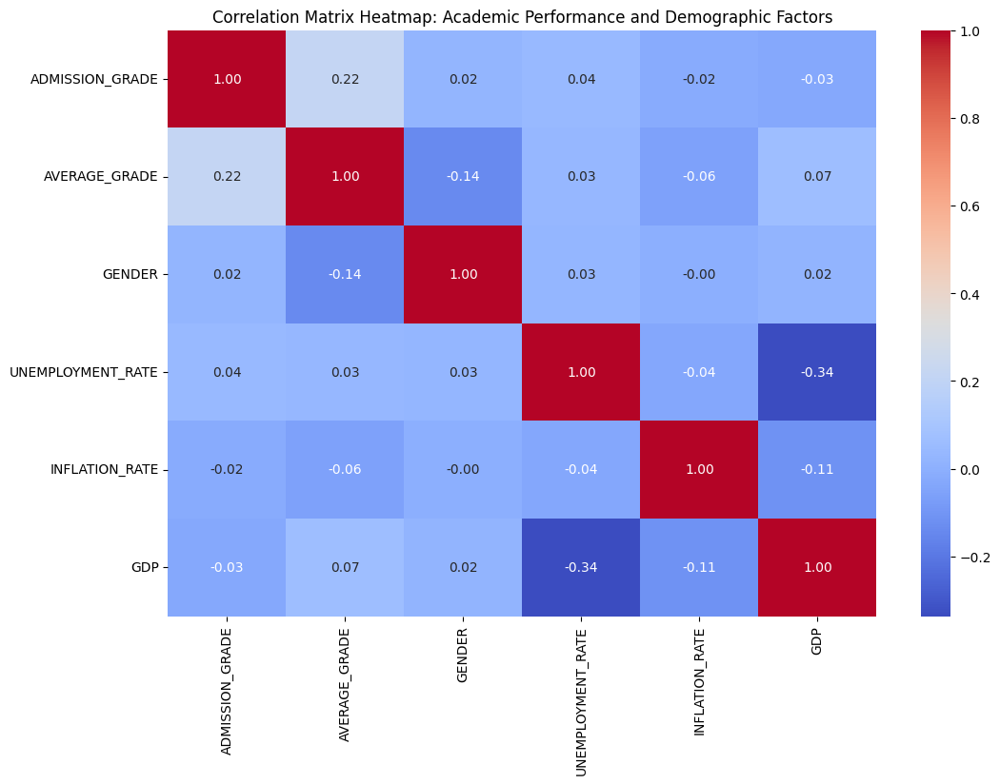

Pearson Correlation between Admission Grade and Gender: 0.02
Pearson Correlation between Average Grade and Gender: -0.14
Pearson Correlation between Admission Grade and Unemployment Rate: 0.04
Pearson Correlation between Average Grade and Unemployment Rate: 0.03
Pearson Correlation between Admission Grade and Inflation Rate: -0.02
Pearson Correlation between Average Grade and Inflation Rate: -0.06
Pearson Correlation between Admission Grade and GDP: -0.03
Pearson Correlation between Average Grade and GDP: 0.07


In [30]:
import seaborn as sns
from scipy.stats import pearsonr

import matplotlib.pyplot as plt

# Calculate the correlation matrix for academic performance and demographic factors
# Convert 'GENDER' column to numerical values
data['GENDER'] = data['GENDER'].map({'Female': 0, 'Male': 1})

# Calculate the correlation matrix for academic performance and demographic factors
correlation_matrix = data[['ADMISSION_GRADE', 'AVERAGE_GRADE', 'GENDER', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP']].corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap: Academic Performance and Demographic Factors')
plt.show()

# Calculate Pearson correlation coefficients for specific pairs
pearson_corr_admission_gender, _ = pearsonr(data['ADMISSION_GRADE'], data['GENDER'])
pearson_corr_average_gender, _ = pearsonr(data['AVERAGE_GRADE'], data['GENDER'])

print(f"Pearson Correlation between Admission Grade and Gender: {pearson_corr_admission_gender:.2f}")
print(f"Pearson Correlation between Average Grade and Gender: {pearson_corr_average_gender:.2f}")

# Calculate Pearson correlation coefficients for socioeconomic status
pearson_corr_admission_unemployment, _ = pearsonr(data['ADMISSION_GRADE'], data['UNEMPLOYMENT_RATE'])
pearson_corr_average_unemployment, _ = pearsonr(data['AVERAGE_GRADE'], data['UNEMPLOYMENT_RATE'])

print(f"Pearson Correlation between Admission Grade and Unemployment Rate: {pearson_corr_admission_unemployment:.2f}")
print(f"Pearson Correlation between Average Grade and Unemployment Rate: {pearson_corr_average_unemployment:.2f}")

pearson_corr_admission_inflation, _ = pearsonr(data['ADMISSION_GRADE'], data['INFLATION_RATE'])
pearson_corr_average_inflation, _ = pearsonr(data['AVERAGE_GRADE'], data['INFLATION_RATE'])

print(f"Pearson Correlation between Admission Grade and Inflation Rate: {pearson_corr_admission_inflation:.2f}")
print(f"Pearson Correlation between Average Grade and Inflation Rate: {pearson_corr_average_inflation:.2f}")

pearson_corr_admission_gdp, _ = pearsonr(data['ADMISSION_GRADE'], data['GDP'])
pearson_corr_average_gdp, _ = pearsonr(data['AVERAGE_GRADE'], data['GDP'])

print(f"Pearson Correlation between Admission Grade and GDP: {pearson_corr_admission_gdp:.2f}")
print(f"Pearson Correlation between Average Grade and GDP: {pearson_corr_average_gdp:.2f}")

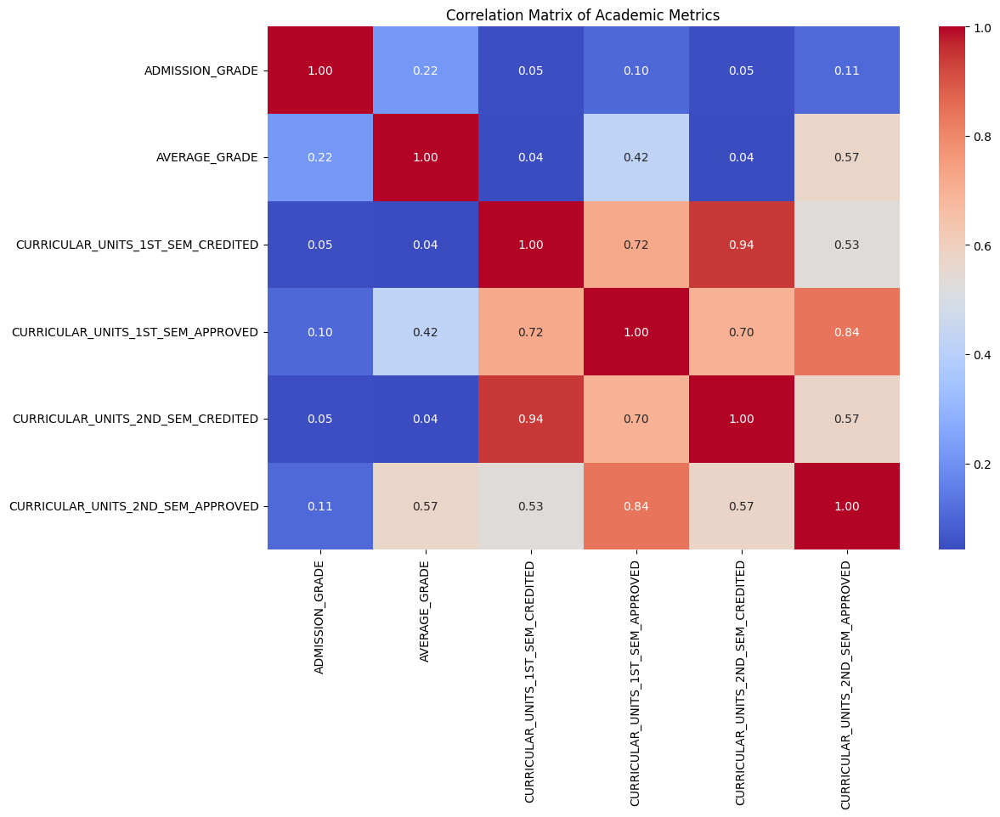

In [31]:
import seaborn as sns

# Analyze the correlation between different academic metrics

import matplotlib.pyplot as plt

# Select relevant academic metrics for correlation analysis
academic_metrics = ['ADMISSION_GRADE', 'AVERAGE_GRADE', 'CURRICULAR_UNITS_1ST_SEM_CREDITED', 
                    'CURRICULAR_UNITS_1ST_SEM_APPROVED', 'CURRICULAR_UNITS_2ND_SEM_CREDITED', 
                    'CURRICULAR_UNITS_2ND_SEM_APPROVED']

# Calculate the correlation matrix for the selected academic metrics
academic_correlation_matrix = data[academic_metrics].corr()

# Plot the heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(academic_correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Academic Metrics')
plt.show()

In [ ]:
# research questions: https://chat.deepseek.com/a/chat/s/2c79cf07-3928-4c68-be74-b400592675c5

Accuracy: 0.67
Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.71      0.65       180
           1       0.33      0.01      0.02       159
           2       0.71      0.91      0.80       411

    accuracy                           0.67       750
   macro avg       0.55      0.55      0.49       750
weighted avg       0.60      0.67      0.60       750



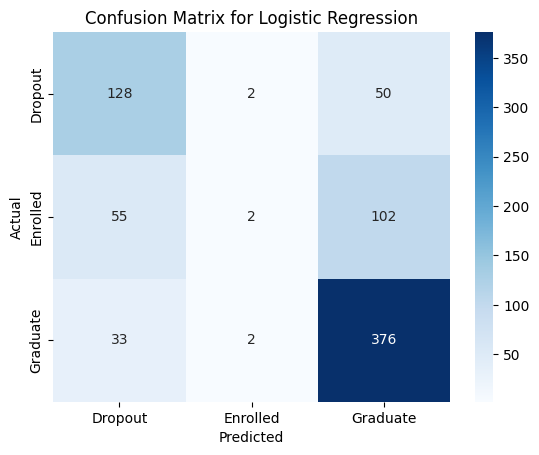

In [3]:
# How does first-semester academic performance (grades, approval rates) predict final outcomes (dropout, graduation, enrollment)?

import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('cleaned_data.csv')

# Select features related to first-semester academic performance
features = ['CURRICULAR_UNITS_1ST_SEM_CREDITED', 'CURRICULAR_UNITS_1ST_SEM_APPROVED', 'ADMISSION_GRADE']
target = 'TARGET'

# Encode the target variable if necessary
data[target] = data[target].map({'Dropout': 0, 'Enrolled': 1, 'Graduate': 2})

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.2, random_state=42)

# Train a Logistic Regression model
logistic_model = LogisticRegression(random_state=42, max_iter=200)
logistic_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = logistic_model.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate a classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Generate a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Dropout', 'Enrolled', 'Graduate'], yticklabels=['Dropout', 'Enrolled', 'Graduate'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Logistic Regression')
plt.show()

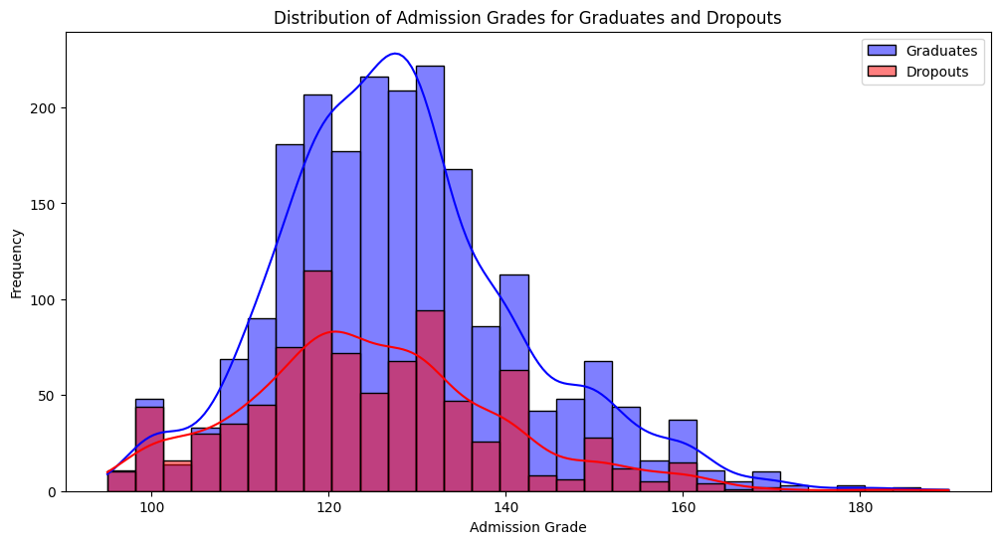

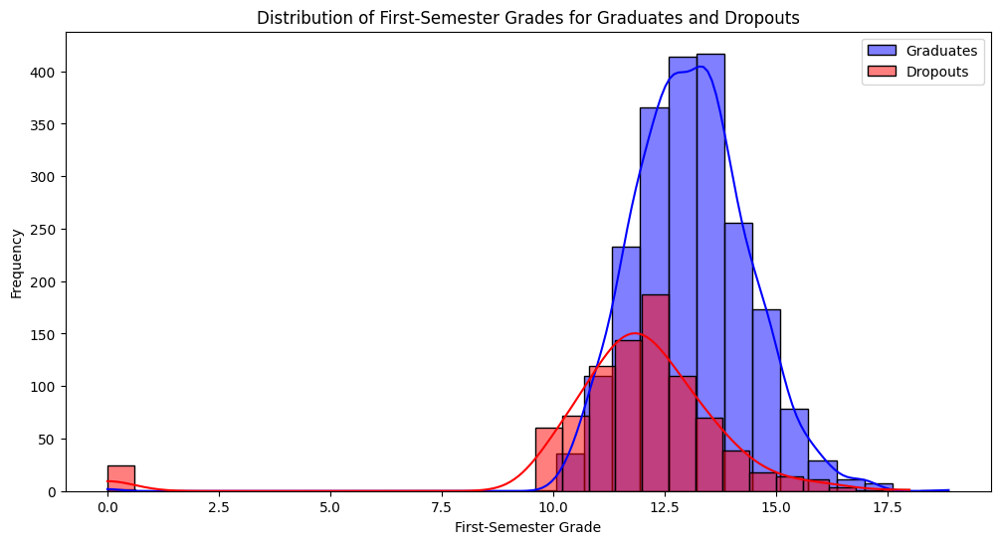

Mean Admission Grade for Graduates: 128.01 (±13.83)
Mean Admission Grade for Dropouts: 124.89 (±14.63)
Mean First-Semester Grade for Graduates: 13.09 (±1.31)
Mean First-Semester Grade for Dropouts: 11.78 (±2.38)
Critical Threshold for Admission Grade: 126.45
Critical Threshold for First-Semester Grade: 12.44


In [4]:
import numpy as np
import seaborn as sns

# Determine if there is a critical threshold of admission grades or first-semester grades that separates graduates from dropouts

import matplotlib.pyplot as plt

# Separate the data into graduates and dropouts
graduates = data[data['TARGET'] == 2]
dropouts = data[data['TARGET'] == 0]

# Plot the distribution of admission grades for graduates and dropouts
plt.figure(figsize=(12, 6))
sns.histplot(graduates['ADMISSION_GRADE'], bins=30, kde=True, color='blue', label='Graduates')
sns.histplot(dropouts['ADMISSION_GRADE'], bins=30, kde=True, color='red', label='Dropouts')
plt.title('Distribution of Admission Grades for Graduates and Dropouts')
plt.xlabel('Admission Grade')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# Plot the distribution of first-semester grades for graduates and dropouts
plt.figure(figsize=(12, 6))
sns.histplot(graduates['CURRICULAR_UNITS_1ST_SEM_GRADE'], bins=30, kde=True, color='blue', label='Graduates')
sns.histplot(dropouts['CURRICULAR_UNITS_1ST_SEM_GRADE'], bins=30, kde=True, color='red', label='Dropouts')
plt.title('Distribution of First-Semester Grades for Graduates and Dropouts')
plt.xlabel('First-Semester Grade')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# Calculate the mean and standard deviation of admission grades for graduates and dropouts
mean_admission_grade_graduates = graduates['ADMISSION_GRADE'].mean()
std_admission_grade_graduates = graduates['ADMISSION_GRADE'].std()
mean_admission_grade_dropouts = dropouts['ADMISSION_GRADE'].mean()
std_admission_grade_dropouts = dropouts['ADMISSION_GRADE'].std()

print(f"Mean Admission Grade for Graduates: {mean_admission_grade_graduates:.2f} (±{std_admission_grade_graduates:.2f})")
print(f"Mean Admission Grade for Dropouts: {mean_admission_grade_dropouts:.2f} (±{std_admission_grade_dropouts:.2f})")

# Calculate the mean and standard deviation of first-semester grades for graduates and dropouts
mean_first_sem_grade_graduates = graduates['CURRICULAR_UNITS_1ST_SEM_GRADE'].mean()
std_first_sem_grade_graduates = graduates['CURRICULAR_UNITS_1ST_SEM_GRADE'].std()
mean_first_sem_grade_dropouts = dropouts['CURRICULAR_UNITS_1ST_SEM_GRADE'].mean()
std_first_sem_grade_dropouts = dropouts['CURRICULAR_UNITS_1ST_SEM_GRADE'].std()

print(f"Mean First-Semester Grade for Graduates: {mean_first_sem_grade_graduates:.2f} (±{std_first_sem_grade_graduates:.2f})")
print(f"Mean First-Semester Grade for Dropouts: {mean_first_sem_grade_dropouts:.2f} (±{std_first_sem_grade_dropouts:.2f})")

# Determine critical thresholds using the mean values
critical_threshold_admission_grade = (mean_admission_grade_graduates + mean_admission_grade_dropouts) / 2
critical_threshold_first_sem_grade = (mean_first_sem_grade_graduates + mean_first_sem_grade_dropouts) / 2

print(f"Critical Threshold for Admission Grade: {critical_threshold_admission_grade:.2f}")
print(f"Critical Threshold for First-Semester Grade: {critical_threshold_first_sem_grade:.2f}")

Admission Grade Categories for Male Students:
ADMISSION_GRADE_CATEGORY
Low       422
Medium    386
High      384
Name: count, dtype: int64

Admission Grade Categories for Female Students:
ADMISSION_GRADE_CATEGORY
Medium    919
Low       882
High      755
Name: count, dtype: int64


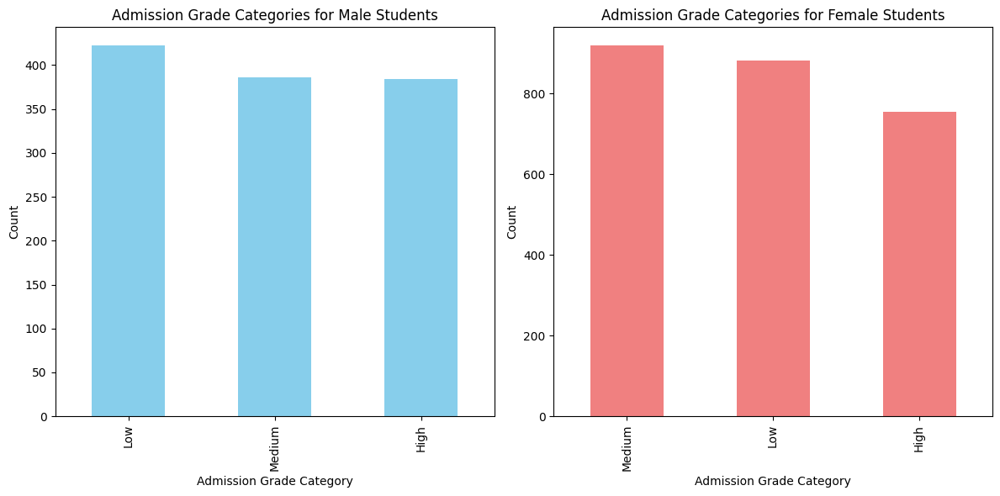

In [12]:
# Define the thresholds for low, medium, and high admission grades
low_threshold = data['ADMISSION_GRADE'].quantile(0.33)
high_threshold = data['ADMISSION_GRADE'].quantile(0.67)

# Create a new column for admission grade categories
data['ADMISSION_GRADE_CATEGORY'] = pd.cut(data['ADMISSION_GRADE'], 
                                          bins=[-float('inf'), low_threshold, high_threshold, float('inf')], 
                                          labels=['Low', 'Medium', 'High'])

# Split the data by gender
male_data = data[data['GENDER'] == 'Male']
female_data = data[data['GENDER'] == 'Female']

# Calculate the counts for each admission grade category for both genders
male_admission_grade_counts = male_data['ADMISSION_GRADE_CATEGORY'].value_counts()
female_admission_grade_counts = female_data['ADMISSION_GRADE_CATEGORY'].value_counts()

# Display the results
print("Admission Grade Categories for Male Students:")
print(male_admission_grade_counts)
print("\nAdmission Grade Categories for Female Students:")
print(female_admission_grade_counts)

# Plot the results
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
male_admission_grade_counts.plot(kind='bar', color='skyblue')
plt.title('Admission Grade Categories for Male Students')
plt.xlabel('Admission Grade Category')
plt.ylabel('Count')

plt.subplot(1, 2, 2)
female_admission_grade_counts.plot(kind='bar', color='lightcoral')
plt.title('Admission Grade Categories for Female Students')
plt.xlabel('Admission Grade Category')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

In [20]:
# Encode 'PREVIOUS_QUALIFICATION' with descriptive labels
previous_qualification_labels = {
    1: 'Secondary education',
    2: "Higher education - bachelor's degree",
    3: 'Higher education - degree',
    4: "Higher education - master's",
    5: 'Higher education - doctorate',
    6: 'Frequency of higher education',
    9: '12th year of schooling - not completed',
    10: '11th year of schooling - not completed',
    12: 'Other - 11th year of schooling',
    14: '10th year of schooling',
    15: '10th year of schooling - not completed',
    19: 'Basic education 3rd cycle (9th/10th/11th year) or equiv.',
    38: 'Basic education 2nd cycle (6th/7th/8th year) or equiv.',
    39: 'Technological specialization course',
    40: 'Higher education - degree (1st cycle)',
    42: 'Professional higher technical course',
    43: 'Higher education - master (2nd cycle)'
}

# Map the numerical values to text labels
data['PREVIOUS_QUALIFICATION_LABEL'] = data['PREVIOUS_QUALIFICATION'].map(previous_qualification_labels)

# Verify the changes
print(data[['PREVIOUS_QUALIFICATION', 'PREVIOUS_QUALIFICATION_LABEL']].head())

   PREVIOUS_QUALIFICATION                       PREVIOUS_QUALIFICATION_LABEL
0                       1                                Secondary education
1                       1                                Secondary education
2                       1                                Secondary education
3                      19  Basic education 3rd cycle (9th/10th/11th year)...
4                       1                                Secondary education


Success Rate by Previous Qualification:
PREVIOUS_QUALIFICATION_LABEL
10th year of schooling                                      100.000000
12th year of schooling - not completed                      100.000000
Higher education - bachelor's degree                         56.250000
11th year of schooling - not completed                       50.000000
Basic education 3rd cycle (9th/10th/11th year) or equiv.     50.000000
Higher education - master's                                  50.000000
Higher education - degree                                    42.696629
Frequency of higher education                                35.714286
Other - 11th year of schooling                               32.000000
Technological specialization course                          26.530612
Higher education - degree (1st cycle)                        25.714286
Secondary education                                          21.337082
Higher education - master (2nd cycle)                        20.000000
Professi

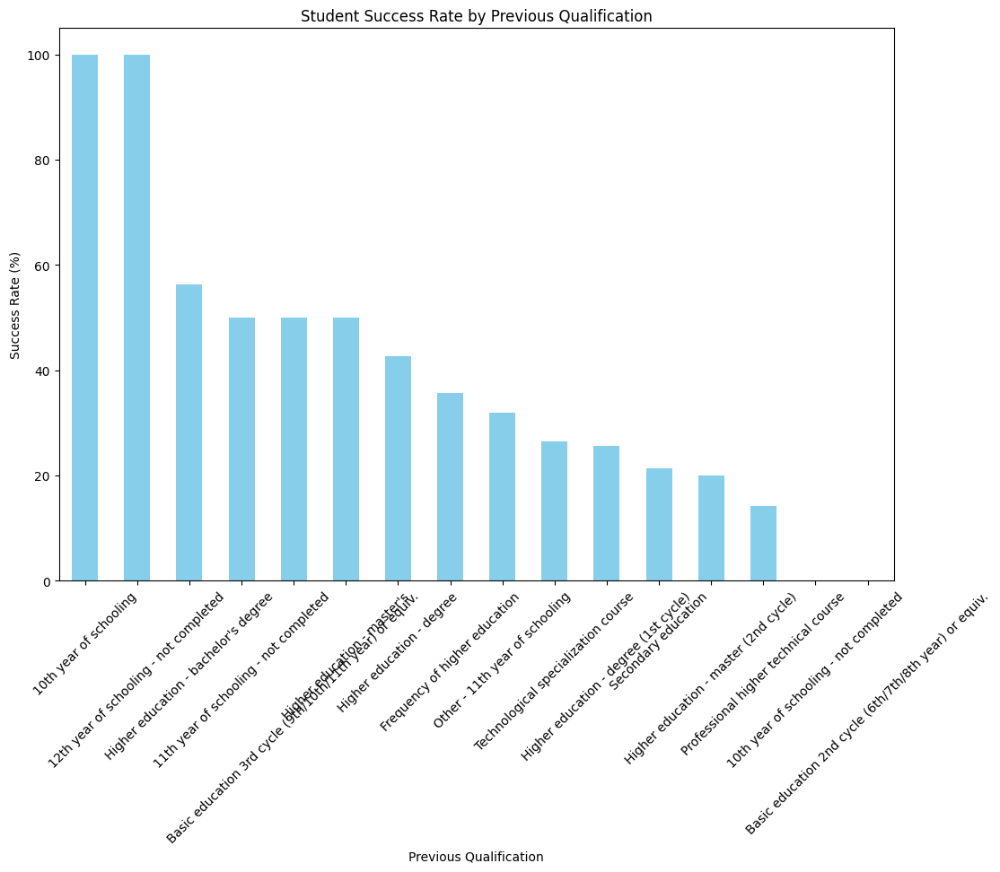

In [21]:
import pandas as pd

import matplotlib.pyplot as plt

# Calculate the success rate based on previous qualification
success_rate_by_qualification = data.groupby('PREVIOUS_QUALIFICATION_LABEL')['TARGET_BINARY'].mean() * 100

# Sort the success rates in descending order
success_rate_by_qualification = success_rate_by_qualification.sort_values(ascending=False)

# Print the success rates
print("Success Rate by Previous Qualification:")
print(success_rate_by_qualification)

# Plot the success rates
plt.figure(figsize=(12, 8))
success_rate_by_qualification.plot(kind='bar', color='skyblue')
plt.title('Student Success Rate by Previous Qualification')
plt.xlabel('Previous Qualification')
plt.ylabel('Success Rate (%)')
plt.xticks(rotation=45)
plt.show()

# skewed data (fix)

In [7]:
# Create a binary target column where 1 indicates 'Graduate' and 0 indicates 'Dropout' or 'Enrolled'
data['TARGET_BINARY'] = data['TARGET'].apply(lambda x: 1 if x == 'Graduate' else 0)

# Verify the changes
print(data[['TARGET', 'TARGET_BINARY']].head())

     TARGET  TARGET_BINARY
0  Graduate              1
1  Graduate              1
2  Graduate              1
3  Graduate              1
4  Graduate              1


Success Rate by Previous Qualification Label:
PREVIOUS_QUALIFICATION_LABEL
10th year of schooling - not completed                      100.000000
Higher education - master (2nd cycle)                        80.000000
Basic education 2nd cycle (6th/7th/8th year) or equiv.       75.000000
Professional higher technical course                         62.857143
Secondary education                                          58.419244
Frequency of higher education                                57.142857
Higher education - degree (1st cycle)                        57.142857
Higher education - degree                                    52.808989
11th year of schooling - not completed                       50.000000
Other - 11th year of schooling                               48.000000
Technological specialization course                          46.938776
Basic education 3rd cycle (9th/10th/11th year) or equiv.     39.473684
Higher education - bachelor's degree                         37.500000
Hi

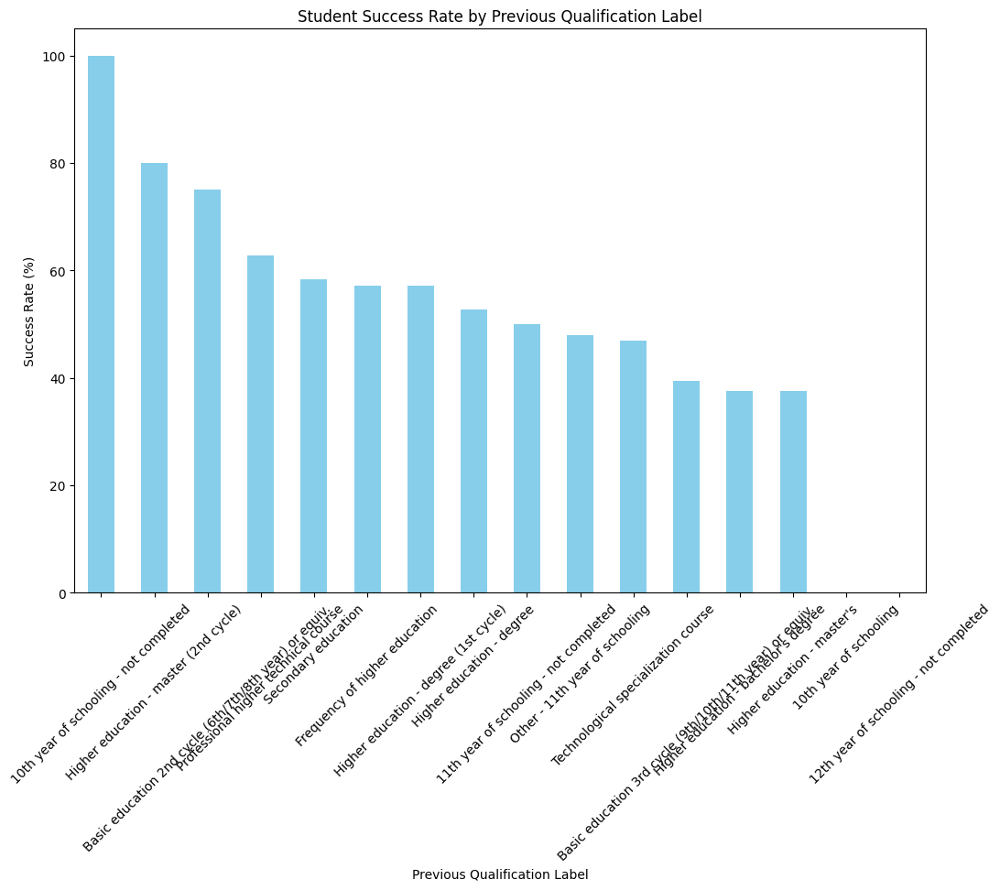

In [11]:
import numpy as np
import matplotlib.pyplot as plt

# handle the skewed data from student success rate by previous qualification label

# Apply log transformation to handle skewness
data['LOG_PREVIOUS_QUALIFICATION'] = np.log1p(data['PREVIOUS_QUALIFICATION'])

# Create 'PREVIOUS_QUALIFICATION_LABEL' column if not already created
previous_qualification_labels = {
    1: 'Secondary education',
    2: "Higher education - bachelor's degree",
    3: 'Higher education - degree',
    4: "Higher education - master's",
    5: 'Higher education - doctorate',
    6: 'Frequency of higher education',
    9: '12th year of schooling - not completed',
    10: '11th year of schooling - not completed',
    12: 'Other - 11th year of schooling',
    14: '10th year of schooling',
    15: '10th year of schooling - not completed',
    19: 'Basic education 3rd cycle (9th/10th/11th year) or equiv.',
    38: 'Basic education 2nd cycle (6th/7th/8th year) or equiv.',
    39: 'Technological specialization course',
    40: 'Higher education - degree (1st cycle)',
    42: 'Professional higher technical course',
    43: 'Higher education - master (2nd cycle)'
}
data['PREVIOUS_QUALIFICATION_LABEL'] = data['PREVIOUS_QUALIFICATION'].map(previous_qualification_labels)
data['LOG_PREVIOUS_QUALIFICATION'] = np.log1p(data['PREVIOUS_QUALIFICATION'])

# Recalculate the success rate based on the transformed qualification label
success_rate_by_log_qualification_label = data.groupby('PREVIOUS_QUALIFICATION_LABEL')['TARGET_BINARY'].mean() * 100

# Sort the success rates in descending order
success_rate_by_log_qualification_label = success_rate_by_log_qualification_label.sort_values(ascending=False)

# Print the success rates
print("Success Rate by Previous Qualification Label:")
print(success_rate_by_log_qualification_label)

# Plot the success rates
plt.figure(figsize=(12, 8))
success_rate_by_log_qualification_label.plot(kind='bar', color='skyblue')
plt.title('Student Success Rate by Previous Qualification Label')
plt.xlabel('Previous Qualification Label')
plt.ylabel('Success Rate (%)')
plt.xticks(rotation=45)
plt.show()

In [23]:
# do students from a secondary education background achieve better grades than people from different educational backgrounds?
import scipy.stats as stats

# Separate the data into two groups based on previous qualification
secondary_education_data = data[data['PREVIOUS_QUALIFICATION_LABEL'] == 'Secondary education']
other_background_data = data[data['PREVIOUS_QUALIFICATION_LABEL'] != 'Secondary education']

# Calculate the mean grades for both groups
mean_grade_secondary_education = secondary_education_data['AVERAGE_GRADE'].mean()
mean_grade_other_background = other_background_data['AVERAGE_GRADE'].mean()

print(f"Mean Grade for Secondary Education Background: {mean_grade_secondary_education:.2f}")
print(f"Mean Grade for Other Educational Backgrounds: {mean_grade_other_background:.2f}")

# Perform an independent t-test to compare the means
t_stat, p_value = stats.ttest_ind(secondary_education_data['AVERAGE_GRADE'], other_background_data['AVERAGE_GRADE'])

print(f"T-statistic: {t_stat:.2f}")
print(f"P-value: {p_value:.4f}")

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. Students from a secondary education background achieve significantly different grades compared to students from other educational backgrounds.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in grades between students from a secondary education background and those from other educational backgrounds.")

Mean Grade for Secondary Education Background: 12.32
Mean Grade for Other Educational Backgrounds: 12.28
T-statistic: 0.46
P-value: 0.6456
Fail to reject the null hypothesis. There is no significant difference in grades between students from a secondary education background and those from other educational backgrounds.


Mean Average Grade for High School Background: nan
Mean Average Grade for Other Educational Backgrounds: 12.32
T-statistic: nan
P-value: nan
Fail to reject the null hypothesis. There is no significant difference in average grades between high school background and other educational backgrounds.


C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_36048\1483518804.py:19: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  t_stat, p_value = ttest_ind(high_school_data['AVERAGE_GRADE'], other_background_data['AVERAGE_GRADE'])


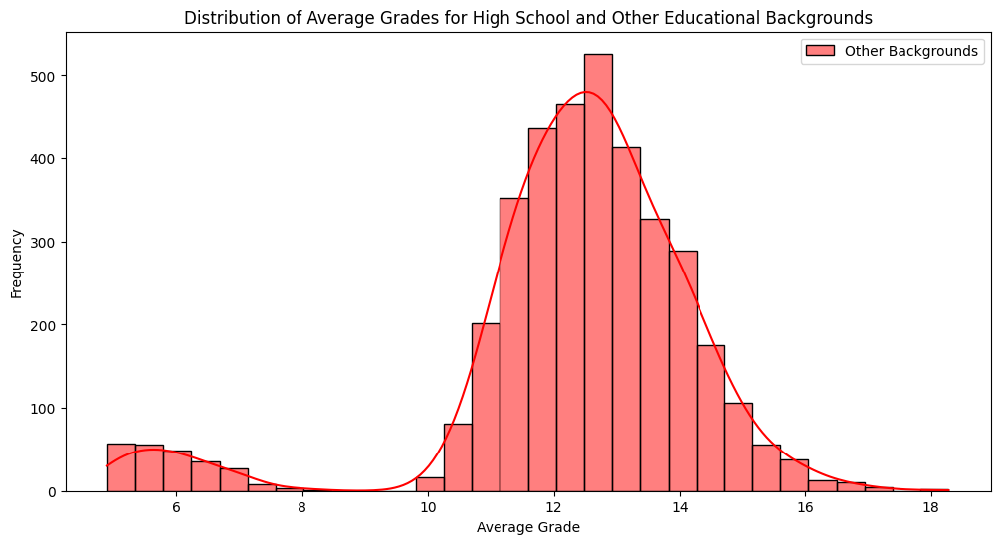

In [13]:
# did people from a high school background achieve better grades than people from different educational backgrounds?

import pandas as pd
import seaborn as sns
from scipy.stats import ttest_ind

import matplotlib.pyplot as plt

# Filter data for high school background and other educational backgrounds
high_school_data = data[data['PREVIOUS_QUALIFICATION'] == 'High School']
other_background_data = data[data['PREVIOUS_QUALIFICATION'] != 'High School']

# Calculate the mean average grade for each group
mean_grade_high_school = high_school_data['AVERAGE_GRADE'].mean()
mean_grade_other_background = other_background_data['AVERAGE_GRADE'].mean()

print(f"Mean Average Grade for High School Background: {mean_grade_high_school:.2f}")
print(f"Mean Average Grade for Other Educational Backgrounds: {mean_grade_other_background:.2f}")

# Perform an independent t-test to compare the means
t_stat, p_value = ttest_ind(high_school_data['AVERAGE_GRADE'], other_background_data['AVERAGE_GRADE'])

print(f"T-statistic: {t_stat:.2f}")
print(f"P-value: {p_value:.4f}")

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference in average grades between high school background and other educational backgrounds.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in average grades between high school background and other educational backgrounds.")

# Visualize the distribution of average grades for both groups
plt.figure(figsize=(12, 6))
sns.histplot(high_school_data['AVERAGE_GRADE'], bins=30, kde=True, color='blue', label='High School')
sns.histplot(other_background_data['AVERAGE_GRADE'], bins=30, kde=True, color='red', label='Other Backgrounds')
plt.title('Distribution of Average Grades for High School and Other Educational Backgrounds')
plt.xlabel('Average Grade')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [5]:
# Do students who improve their grades in the second semester have a higher likelihood of graduating?

from scipy.stats import ttest_ind

# Calculate the grade improvement from the first semester to the second semester
data['GRADE_IMPROVEMENT'] = data['CURRICULAR_UNITS_2ND_SEM_GRADE'] - data['CURRICULAR_UNITS_1ST_SEM_GRADE']

# Separate the data into graduates and non-graduates
graduates = data[data['TARGET'] == 2]
non_graduates = data[data['TARGET'] != 2]

# Calculate the mean grade improvement for graduates and non-graduates
mean_grade_improvement_graduates = graduates['GRADE_IMPROVEMENT'].mean()
mean_grade_improvement_non_graduates = non_graduates['GRADE_IMPROVEMENT'].mean()

print(f"Mean Grade Improvement for Graduates: {mean_grade_improvement_graduates:.2f}")
print(f"Mean Grade Improvement for Non-Graduates: {mean_grade_improvement_non_graduates:.2f}")

# Perform an independent t-test to compare the means

t_stat, p_value = ttest_ind(graduates['GRADE_IMPROVEMENT'], non_graduates['GRADE_IMPROVEMENT'])

print(f"T-statistic: {t_stat:.2f}")
print(f"P-value: {p_value:.4f}")

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. Students who improve their grades in the second semester have a higher likelihood of graduating.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in grade improvement between graduates and non-graduates.")

Mean Grade Improvement for Graduates: 0.06
Mean Grade Improvement for Non-Graduates: -1.20
T-statistic: 12.38
P-value: 0.0000
Reject the null hypothesis. Students who improve their grades in the second semester have a higher likelihood of graduating.


Dropout Rates by Debt Status and Tuition Fee Compliance:
DEBT_TUITION_STATUS
Debt: False, Tuition Up-to-date: False    75.925926
Debt: False, Tuition Up-to-date: True     17.056439
Debt: True, Tuition Up-to-date: False     84.905660
Debt: True, Tuition Up-to-date: True      31.818182
Name: count, dtype: float64

Chi-square test for Debt Status, Tuition Fee Compliance, and Dropout Rates:
Chi-square statistic: 697.25152741131
P-value: 2.3984738431073953e-147
Degrees of freedom: 6
Expected frequencies:
[[  37.82017076   31.94183565   92.2379936 ]
 [ 748.6993063   632.33004269 1825.97065101]
 [  37.11979723   31.35032017   90.5298826 ]
 [  51.36072572   43.37780149  125.26147279]]


C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_52040\1274222712.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=dropout_rates.index, y=dropout_rates.values, palette='viridis')


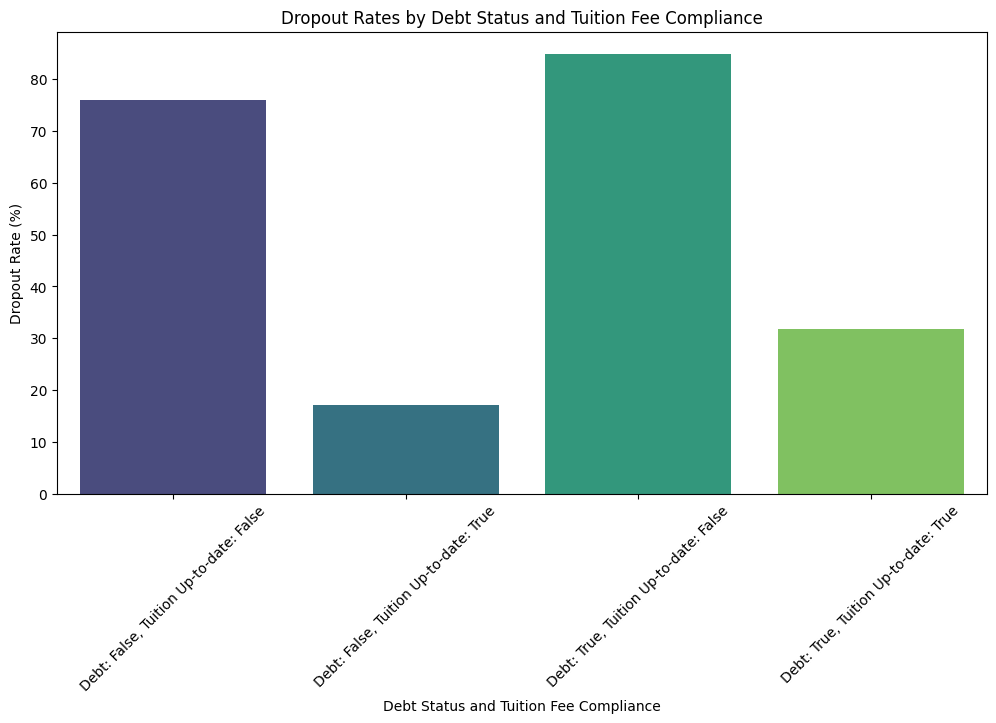

In [21]:
# What is the combined impact of debt status and tuition fee compliance on dropout rates?

import pandas as pd
import seaborn as sns
from scipy.stats import chi2_contingency

import matplotlib.pyplot as plt

# Create a new column combining debt status and tuition fee compliance
data['DEBT_TUITION_STATUS'] = data.apply(lambda row: f"Debt: {row['DEBTOR']}, Tuition Up-to-date: {row['TUITION_FEES_UPTODATE']}", axis=1)

# Calculate the dropout rates for each combination of debt status and tuition fee compliance
dropout_rates = data[data['TARGET'] == 0]['DEBT_TUITION_STATUS'].value_counts(normalize=True) * 100
total_counts = data['DEBT_TUITION_STATUS'].value_counts()
dropout_rates = (data[data['TARGET'] == 0]['DEBT_TUITION_STATUS'].value_counts() / total_counts) * 100

# Print the dropout rates
print("Dropout Rates by Debt Status and Tuition Fee Compliance:")
print(dropout_rates)

# Create a contingency table for debt status, tuition fee compliance, and dropout rates
contingency_table = pd.crosstab(data['DEBT_TUITION_STATUS'], data['TARGET'])

# Perform the chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Print the results of the chi-square test
print(f"\nChi-square test for Debt Status, Tuition Fee Compliance, and Dropout Rates:")
print(f"Chi-square statistic: {chi2}")
print(f"P-value: {p}")
print(f"Degrees of freedom: {dof}")
print("Expected frequencies:")
print(expected)

# Visualize the dropout rates
plt.figure(figsize=(12, 6))
sns.barplot(x=dropout_rates.index, y=dropout_rates.values, palette='viridis')
plt.title('Dropout Rates by Debt Status and Tuition Fee Compliance')
plt.xlabel('Debt Status and Tuition Fee Compliance')
plt.ylabel('Dropout Rate (%)')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# tuition up-to-date significant variable 

In [2]:
import pandas as pd

# Load the dataset
data = pd.read_csv('cleaned_data.csv')

# Display the first few rows of the dataset
print(data.head())

  MARITAL_STATUS APPLICATION_MODE  APPLICATION_ORDER    COURSE  \
0         single            Other                  1     Other   
1         single           Mode_2                  2     Other   
2        married           Mode_3                  1     Other   
3        married           Mode_3                  1     Other   
4         single           Mode_1                  1  Course_1   

   PREVIOUS_QUALIFICATION  PREVIOUS_QUALIFICATION_GRADE NATIONALITY  \
0                       1                         160.0  Portuguese   
1                       1                         122.0  Portuguese   
2                       1                         100.0  Portuguese   
3                      19                         133.1  Portuguese   
4                       1                         142.0  Portuguese   

   MOTHER_QUALIFICATION  FATHER_QUALIFICATION  MOTHER_OCCUPATION  ...  \
0                     1                     3                  3  ...   
1                    38       

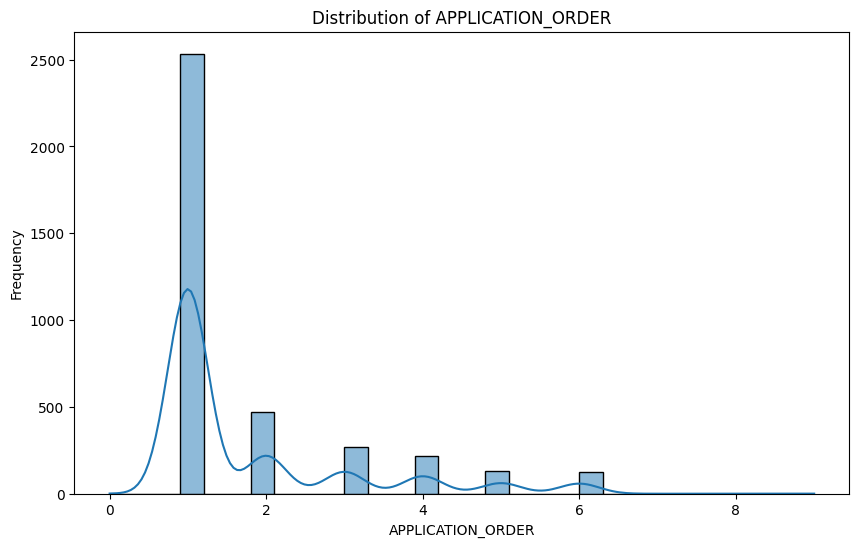

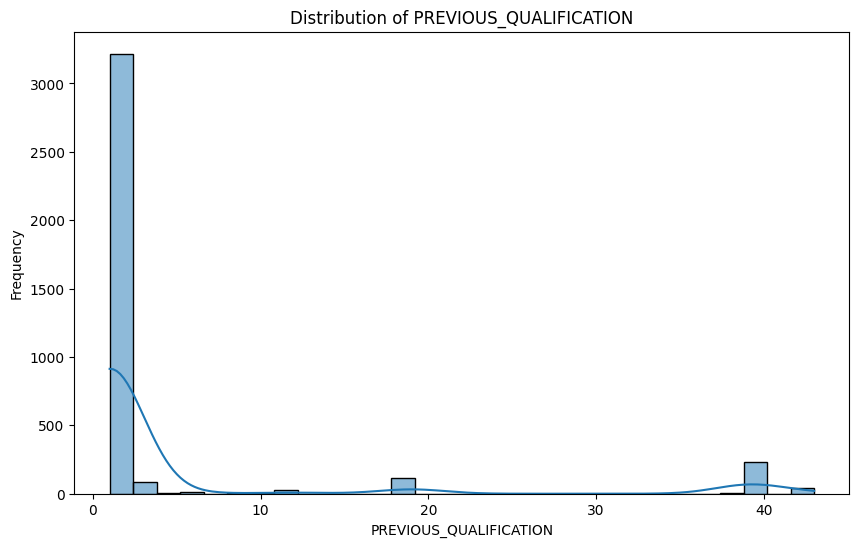

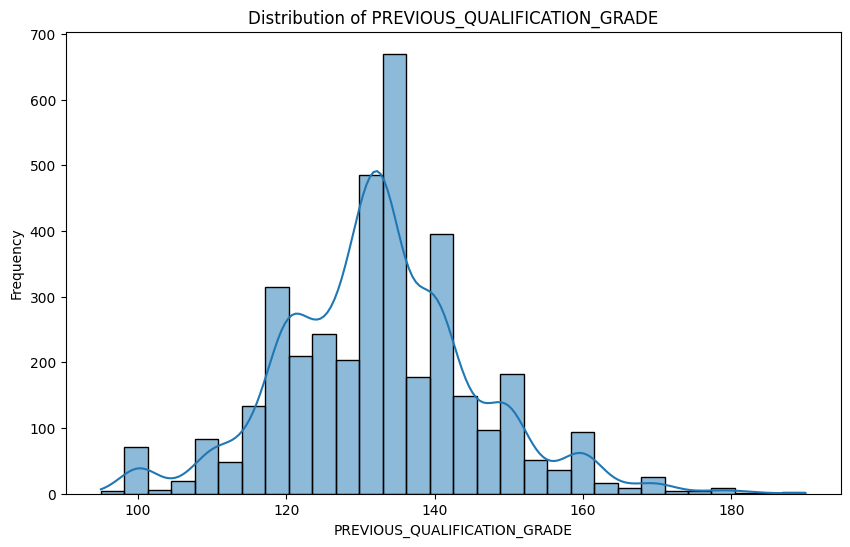

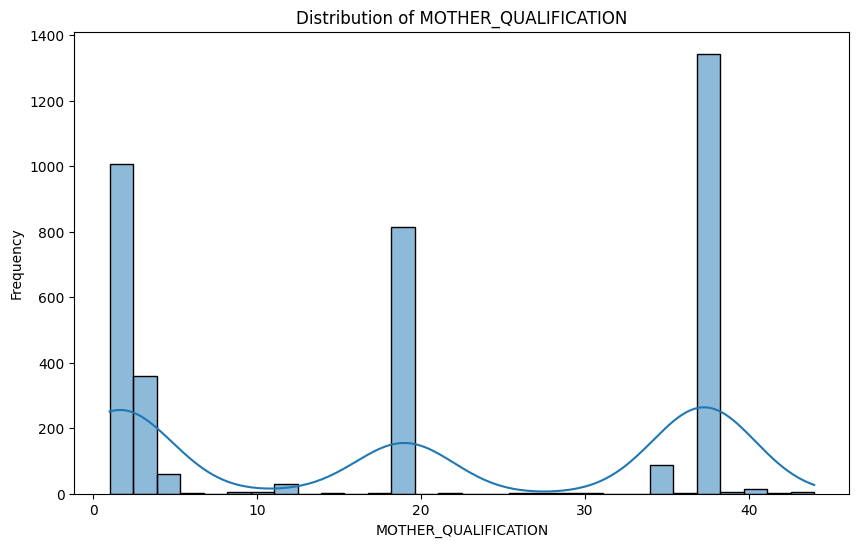

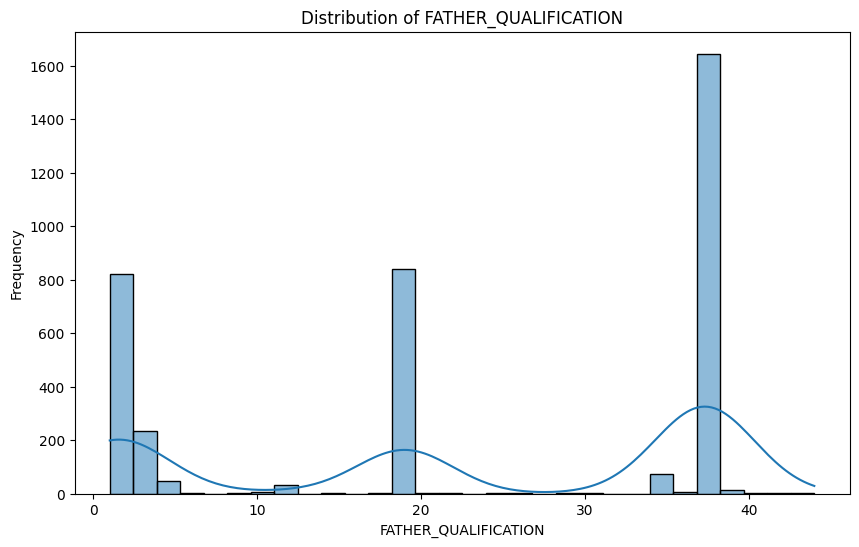

...

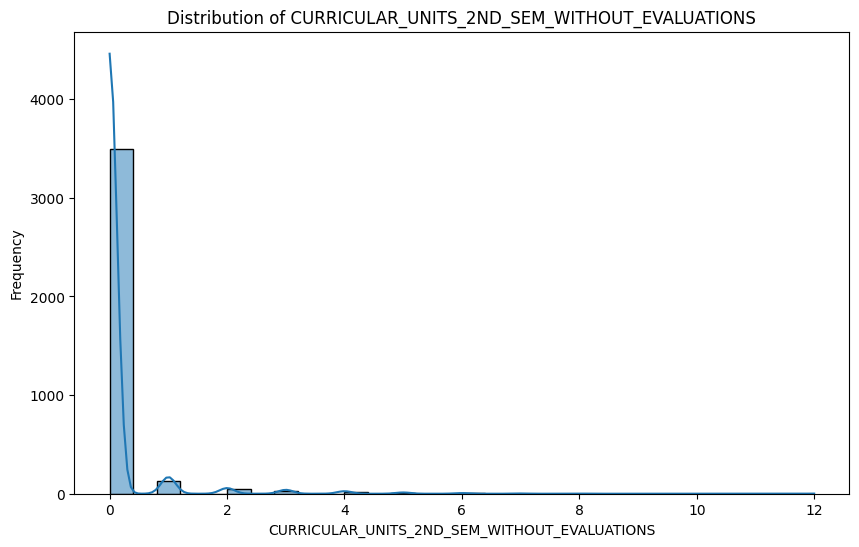

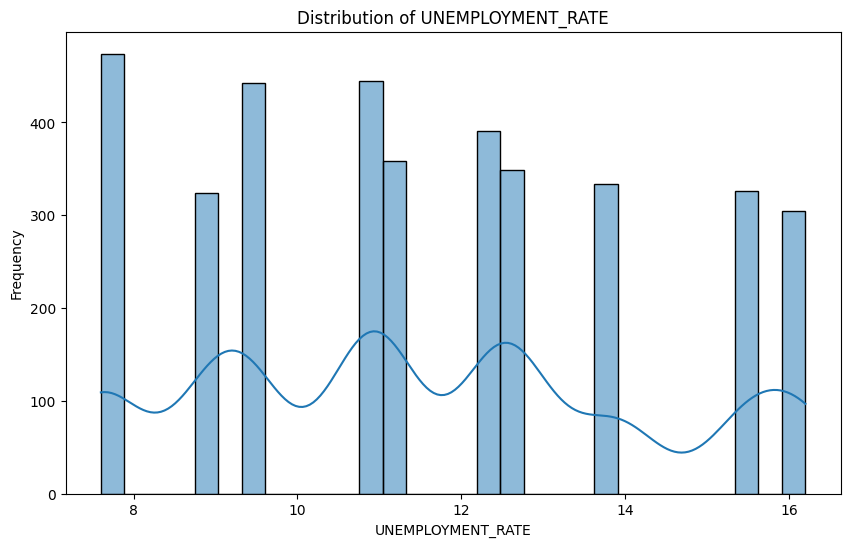

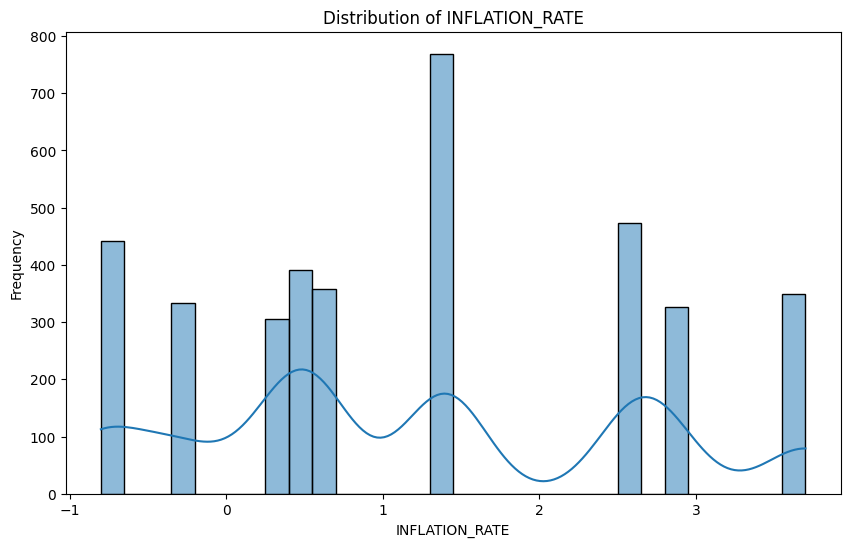

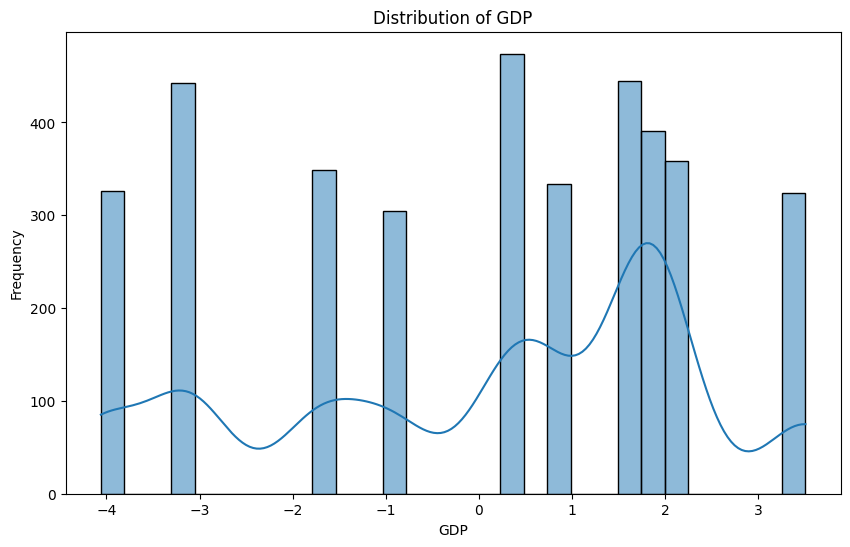

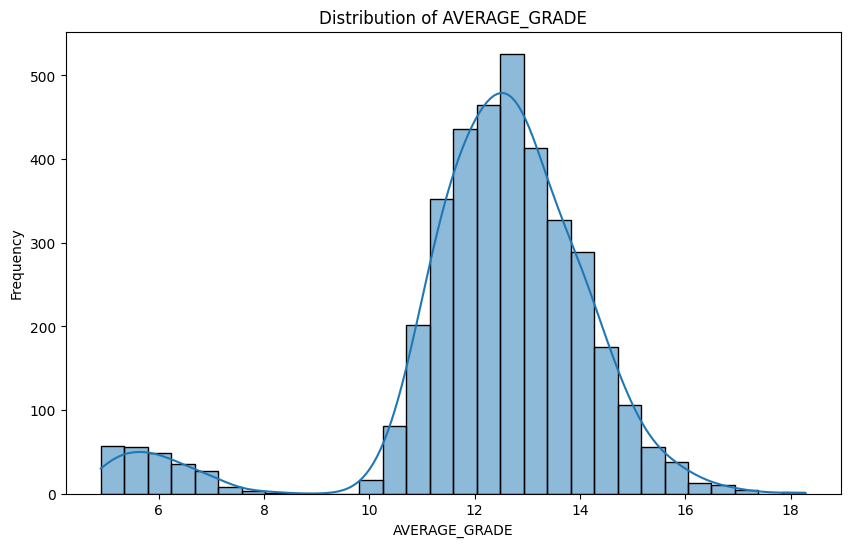

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt

# Distribution of numerical variables in the dataset

numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns

# Plot histograms for each numerical column
for column in numerical_columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(data[column], kde=True, bins=30)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

                            OLS Regression Results                            
Dep. Variable:     PARENTAL_EDUCATION   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                   0.03732
Date:                Thu, 23 Jan 2025   Prob (F-statistic):              0.847
Time:                        19:07:18   Log-Likelihood:                -15324.
No. Observations:                3748   AIC:                         3.065e+04
Df Residuals:                    3746   BIC:                         3.067e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

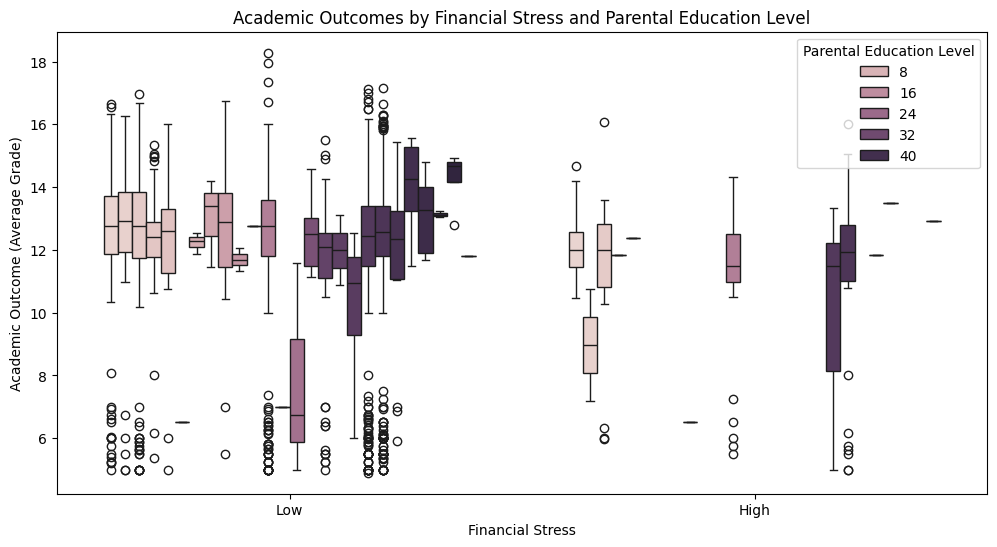

In [22]:
# How does parental education level mediate the relationship between financial stress and academic outcomes?

import pandas as pd
import seaborn as sns
from statsmodels.formula.api import ols

import matplotlib.pyplot as plt
import statsmodels.api as sm



# Create a new column for financial stress based on debt status and tuition fee compliance
data['FINANCIAL_STRESS'] = data.apply(lambda row: 'High' if row['DEBTOR'] and not row['TUITION_FEES_UPTODATE'] else 'Low', axis=1)

# Define the parental education level as the maximum of mother and father qualifications
data['PARENTAL_EDUCATION'] = data[['MOTHER_QUALIFICATION', 'FATHER_QUALIFICATION']].max(axis=1)

# Define academic outcomes as the average grade
data['ACADEMIC_OUTCOME'] = data['AVERAGE_GRADE']

# Perform mediation analysis using OLS regression
# Step 1: Regress financial stress on parental education level
model1 = ols('PARENTAL_EDUCATION ~ FINANCIAL_STRESS', data=data).fit()
print(model1.summary())

# Step 2: Regress academic outcomes on financial stress
model2 = ols('ACADEMIC_OUTCOME ~ FINANCIAL_STRESS', data=data).fit()
print(model2.summary())

# Step 3: Regress academic outcomes on financial stress and parental education level
model3 = ols('ACADEMIC_OUTCOME ~ FINANCIAL_STRESS + PARENTAL_EDUCATION', data=data).fit()
print(model3.summary())

# Visualize the relationship between financial stress, parental education level, and academic outcomes
plt.figure(figsize=(12, 6))
sns.boxplot(x='FINANCIAL_STRESS', y='ACADEMIC_OUTCOME', hue='PARENTAL_EDUCATION', data=data)
plt.title('Academic Outcomes by Financial Stress and Parental Education Level')
plt.xlabel('Financial Stress')
plt.ylabel('Academic Outcome (Average Grade)')
plt.legend(title='Parental Education Level')
plt.show()

In [ ]:
# Do students from low-income backgrounds (inferred from parental occupation) face systemic barriers to graduation?

Dropout Rate for Older Students: 39.40%
Dropout Rate for Younger Students: 20.87%


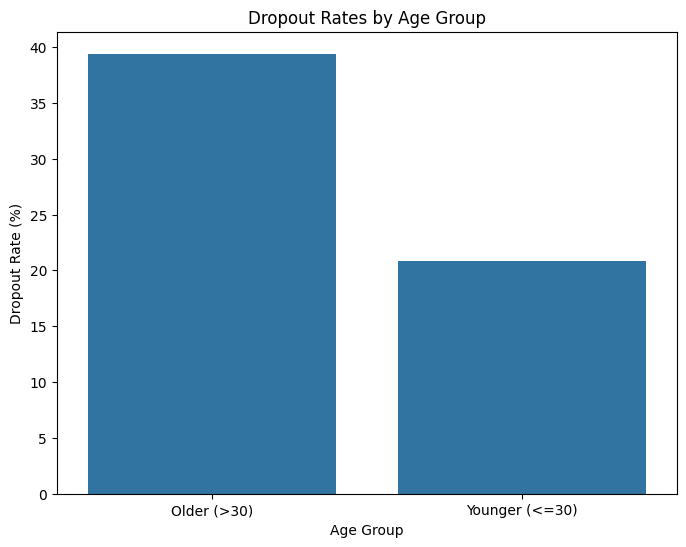

Chi-square test for Marital Status and Dropout Rates among Older Students:
Chi-square statistic: 12.601359135661745
P-value: 0.049821734465363504


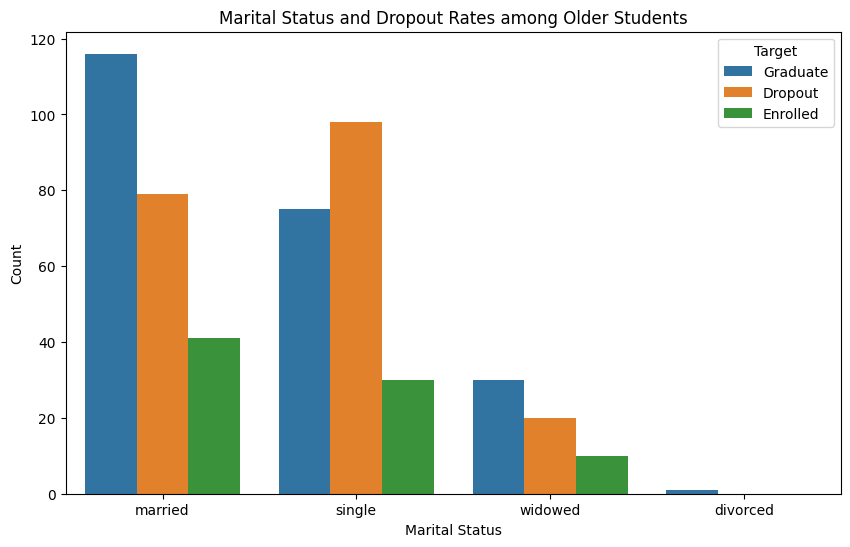


Chi-square test for DEBTOR and Dropout Rates among Older Students:
Chi-square statistic: 27.38235471638645
P-value: 1.132393121274579e-06


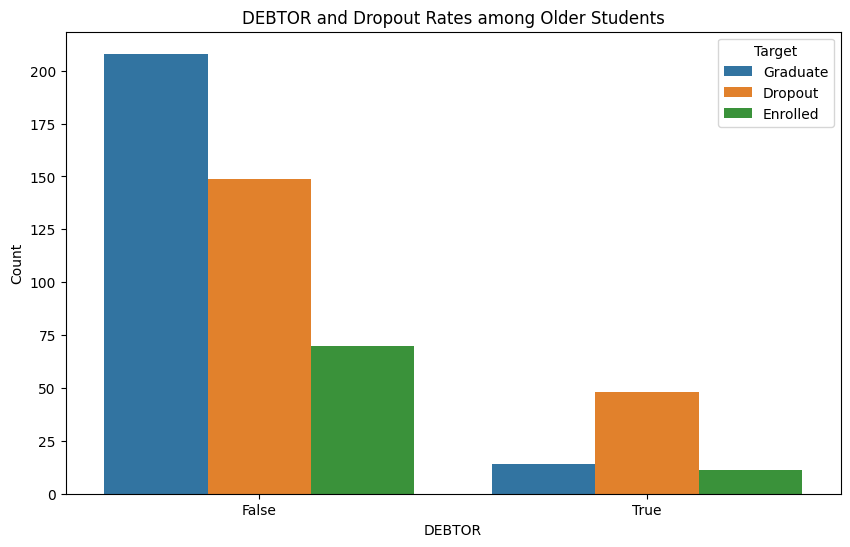


Chi-square test for TUITION_FEES_UPTODATE and Dropout Rates among Older Students:
Chi-square statistic: 111.95426868465715
P-value: 4.891470541554423e-25


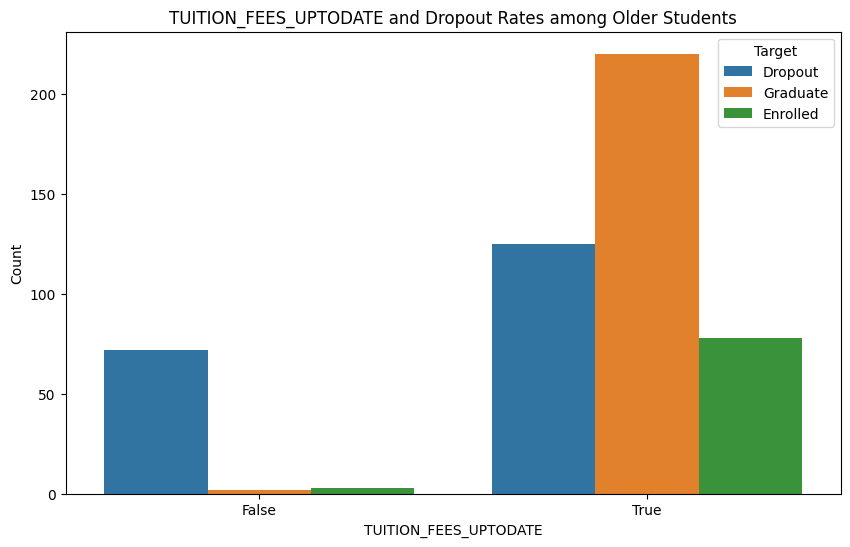


Chi-square test for SCHOLARSHIP_HOLDER and Dropout Rates among Older Students:
Chi-square statistic: 26.860301381342808
P-value: 1.4701432827407924e-06


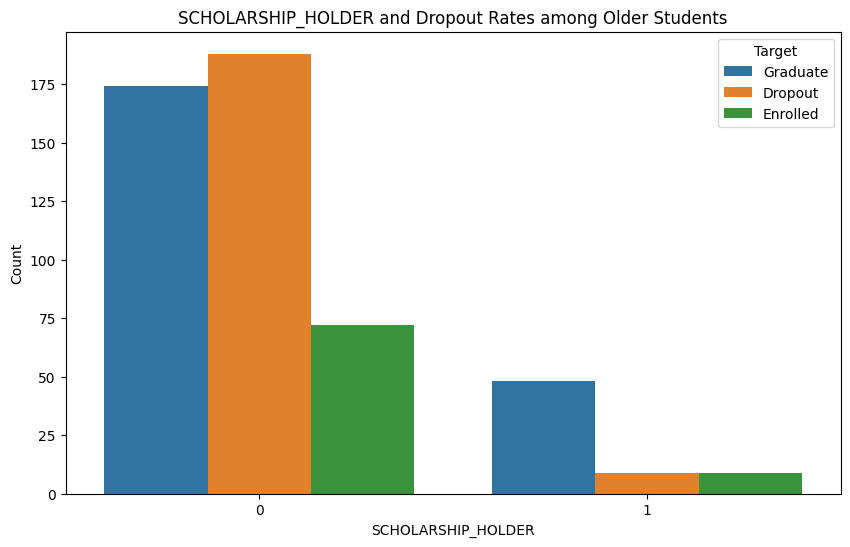

In [4]:
# Why do older students (>30) face significantly higher dropout rates? Is this linked to work-family balance or academic preparedness?

import seaborn as sns
from scipy.stats import chi2_contingency

# Analyze why older students (>30) face significantly higher dropout rates

import matplotlib.pyplot as plt

# Filter older students
older_students = data[data['AGE_AT_ENROLLMENT'] > 30]

# Calculate dropout rate for older students
dropout_rate_older_students = (older_students[older_students['TARGET'] == 'Dropout'].shape[0] / older_students.shape[0]) * 100
print(f"Dropout Rate for Older Students: {dropout_rate_older_students:.2f}%")

# Compare dropout rates between older and younger students
younger_students = data[data['AGE_AT_ENROLLMENT'] <= 30]
dropout_rate_younger_students = (younger_students[younger_students['TARGET'] == 'Dropout'].shape[0] / younger_students.shape[0]) * 100
print(f"Dropout Rate for Younger Students: {dropout_rate_younger_students:.2f}%")

# Visualize dropout rates
dropout_rates = pd.DataFrame({
    'Age Group': ['Older (>30)', 'Younger (<=30)'],
    'Dropout Rate (%)': [dropout_rate_older_students, dropout_rate_younger_students]
})

plt.figure(figsize=(8, 6))
sns.barplot(x='Age Group', y='Dropout Rate (%)', data=dropout_rates)
plt.title('Dropout Rates by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Dropout Rate (%)')
plt.show()

# Investigate potential factors contributing to higher dropout rates for older students
# Create a crosstab for marital status and dropout rates
marital_status_crosstab = pd.crosstab(older_students['MARITAL_STATUS'], older_students['TARGET'])

# Perform chi-square test
chi2, p, dof, expected = chi2_contingency(marital_status_crosstab)
print(f"Chi-square test for Marital Status and Dropout Rates among Older Students:")
print(f"Chi-square statistic: {chi2}")
print(f"P-value: {p}")

# Visualize the relationship between marital status and dropout rates
plt.figure(figsize=(10, 6))
sns.countplot(x='MARITAL_STATUS', hue='TARGET', data=older_students)
plt.title('Marital Status and Dropout Rates among Older Students')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.legend(title='Target')
plt.show()

# Investigate financial factors
financial_factors = ['DEBTOR', 'TUITION_FEES_UPTODATE', 'SCHOLARSHIP_HOLDER']

for factor in financial_factors:
    crosstab = pd.crosstab(older_students[factor], older_students['TARGET'])
    chi2, p, dof, expected = chi2_contingency(crosstab)
    print(f"\nChi-square test for {factor} and Dropout Rates among Older Students:")
    print(f"Chi-square statistic: {chi2}")
    print(f"P-value: {p}")

    plt.figure(figsize=(10, 6))
    sns.countplot(x=factor, hue='TARGET', data=older_students)
    plt.title(f'{factor} and Dropout Rates among Older Students')
    plt.xlabel(factor)
    plt.ylabel('Count')
    plt.legend(title='Target')
    plt.show()

Feature Importances:
                  Feature  Importance
2           AVERAGE_GRADE    0.307672
0         ADMISSION_GRADE    0.135953
1       AGE_AT_ENROLLMENT    0.118053
9   TUITION_FEES_UPTODATE    0.114511
7    FATHER_QUALIFICATION    0.068466
6    MOTHER_QUALIFICATION    0.064828
5                     GDP    0.048718
3       UNEMPLOYMENT_RATE    0.041446
4          INFLATION_RATE    0.040375
8                  DEBTOR    0.034589
10     SCHOLARSHIP_HOLDER    0.025388


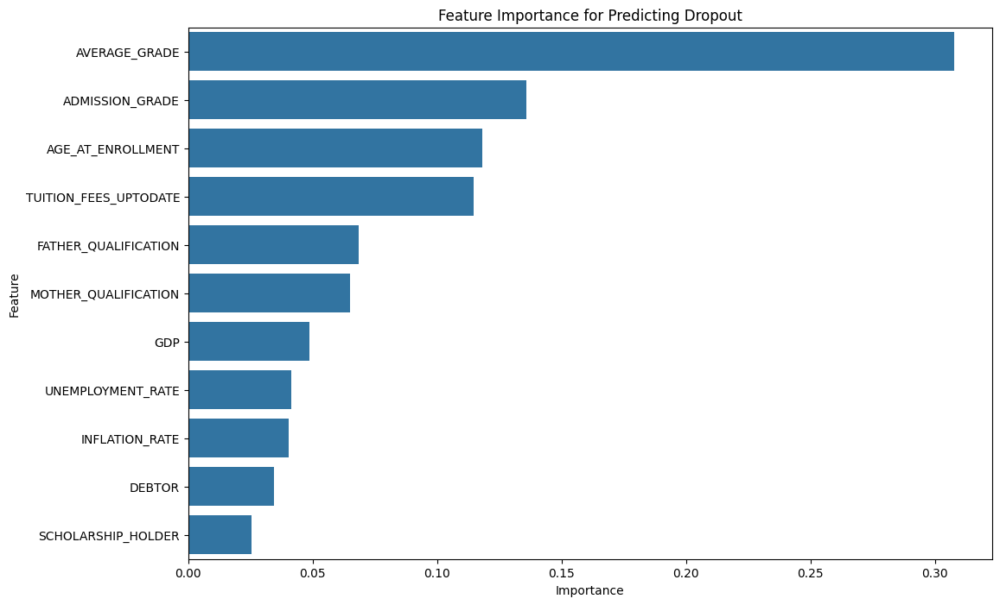

In [5]:

import pandas as pd
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt

# Prepare the data
features = ['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'AVERAGE_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP', 
            'MOTHER_QUALIFICATION', 'FATHER_QUALIFICATION', 'DEBTOR', 'TUITION_FEES_UPTODATE', 'SCHOLARSHIP_HOLDER']
target = 'TARGET'

# Encode the target variable to binary (1 for Dropout, 0 for others)
data[target] = data[target].apply(lambda x: 1 if x == 'Dropout' else 0)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.2, random_state=42)

# Train a Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)

# Get feature importances from the trained RandomForestClassifier
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the feature importances
print("Feature Importances:")
print(feature_importance_df)

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance for Predicting Dropout')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

Persistence and Graduation Rates by Nationality:
                       Dropout Rate (%)  Graduation Rate (%)
NATIONALITY                                                 
Angolan                       50.000000            50.000000
Brazilian                     73.333333            26.666667
Cape Verdean                  81.818182            18.181818
Colombian                           NaN           100.000000
Cuban                        100.000000                  NaN
Dutch                        100.000000                  NaN
English                      100.000000                  NaN
German                       100.000000                  NaN
Guinean                       80.000000            20.000000
Italian                      100.000000                  NaN
Lithuanian                          NaN           100.000000
Mexican                      100.000000                  NaN
Moldova (Republic of)         50.000000            50.000000
Mozambican                   100.000

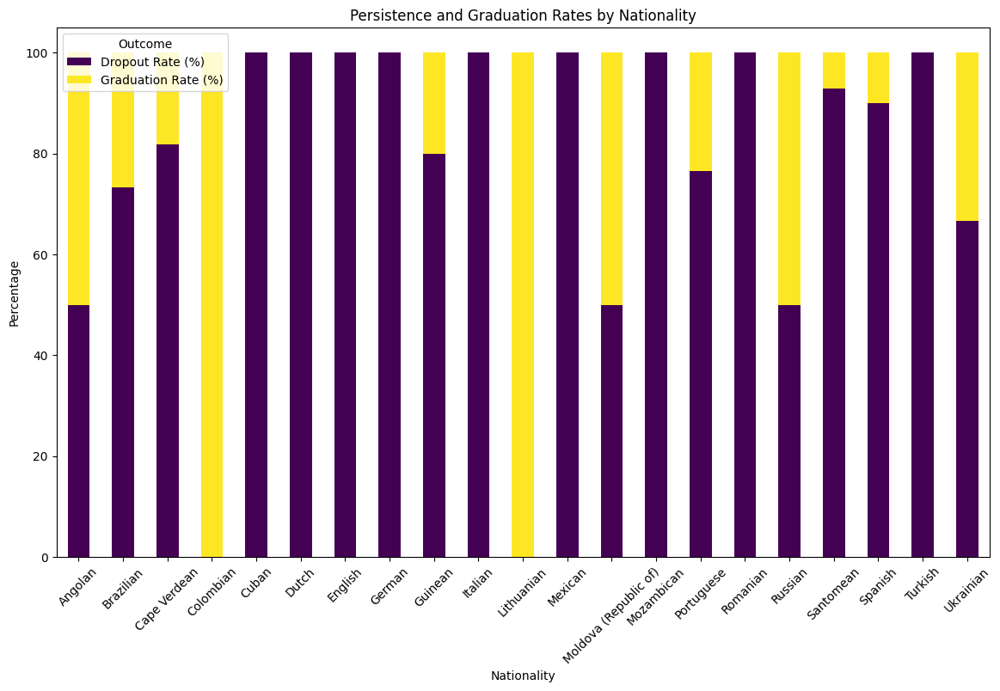

In [7]:
# # How do students by nationality differ in persistence and graduation rates?


import pandas as pd
import seaborn as sns

import matplotlib.pyplot as plt

# Calculate persistence and graduation rates by nationality
nationality_persistence_graduation = data.groupby('NATIONALITY')['TARGET'].value_counts(normalize=True).unstack() * 100
# Rename the columns for better readability
nationality_persistence_graduation.columns = ['Dropout Rate (%)', 'Graduation Rate (%)']

# Print the persistence and graduation rates by nationality
print("Persistence and Graduation Rates by Nationality:")
print(nationality_persistence_graduation)

# Plot the persistence and graduation rates by nationality
nationality_persistence_graduation.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='viridis')
plt.title('Persistence and Graduation Rates by Nationality')
plt.xlabel('Nationality')
plt.ylabel('Percentage')
plt.legend(title='Outcome')
plt.xticks(rotation=45)
plt.show()

Gender Distribution (%):
GENDER
Female    68.196371
Male      31.803629
Name: proportion, dtype: float64

Age Distribution:
count    3748.000000
mean       22.817769
std         7.255646
min        17.000000
25%        19.000000
50%        20.000000
75%        24.000000
max        62.000000
Name: AGE_AT_ENROLLMENT, dtype: float64

Nationality Distribution (%):
NATIONALITY
Portuguese               97.465315
Brazilian                 0.800427
Santomean                 0.373533
Cape Verdean              0.293490
Spanish                   0.266809
Guinean                   0.133404
Italian                   0.080043
Ukrainian                 0.080043
Mozambican                0.053362
Angolan                   0.053362
Romanian                  0.053362
Moldova (Republic of)     0.053362
German                    0.053362
Russian                   0.053362
Mexican                   0.026681
Dutch                     0.026681
Turkish                   0.026681
Colombian                 0.02

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_54512\2031671195.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=gender_distribution.index, y=gender_distribution.values, palette='viridis')


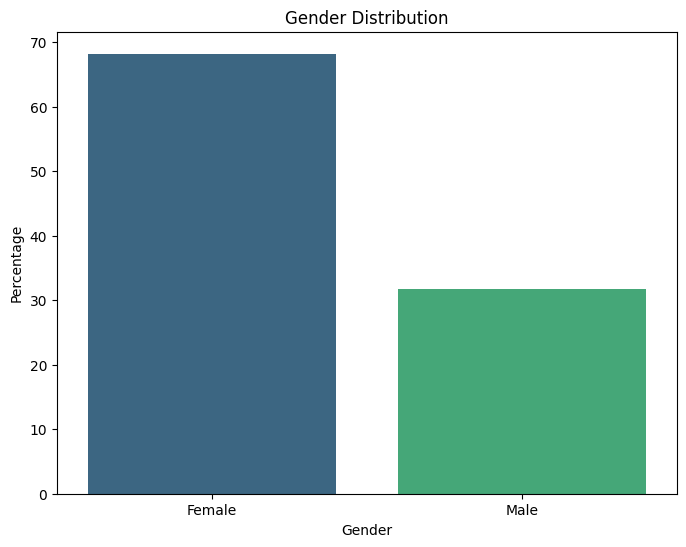

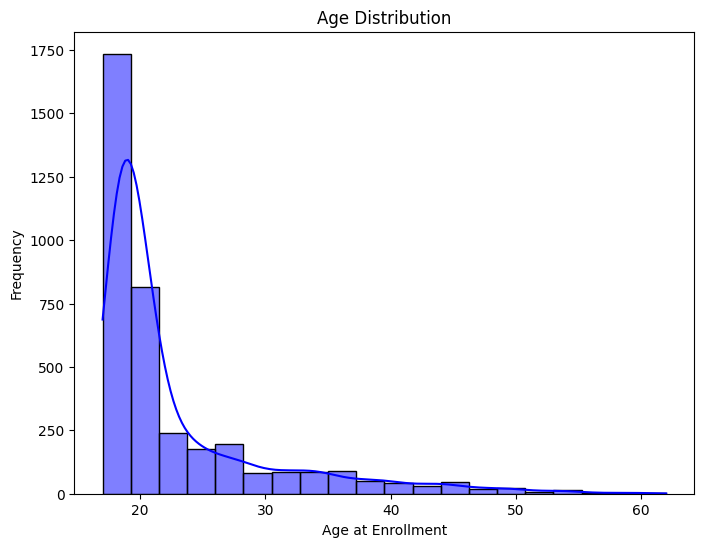

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_54512\2031671195.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nationality_distribution.index, y=nationality_distribution.values, palette='viridis')


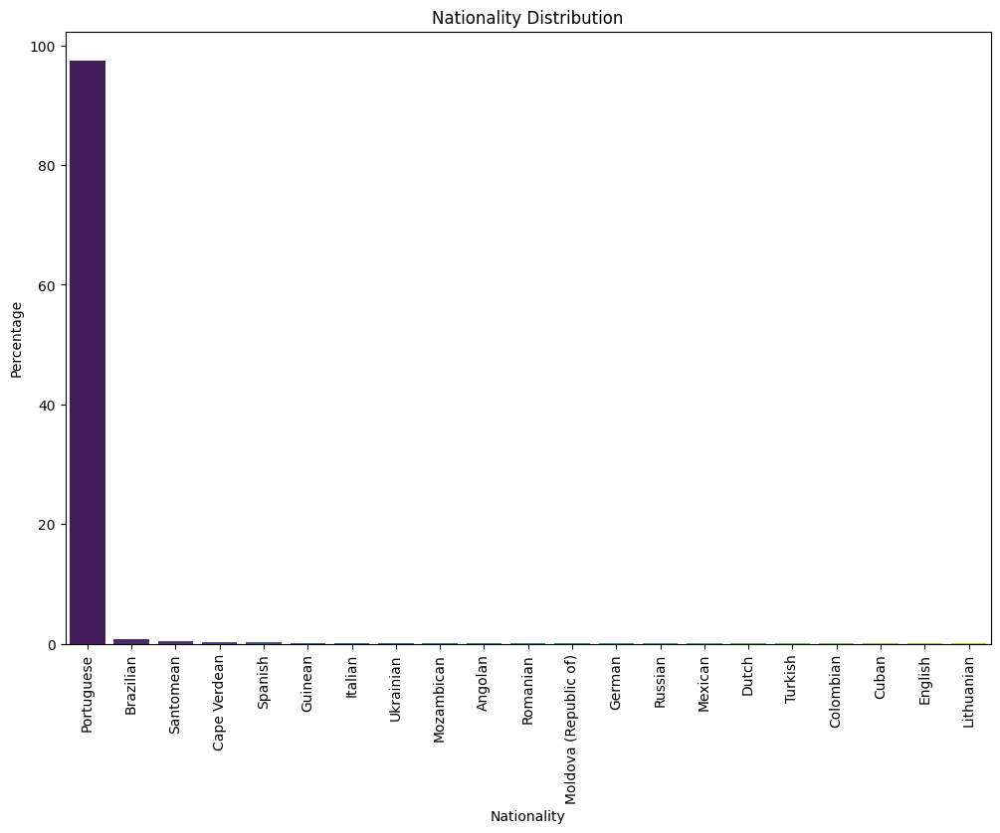

In [11]:
# Demographics Analysis

# Gender distribution
gender_distribution = data['GENDER'].value_counts(normalize=True) * 100
print("Gender Distribution (%):")
print(gender_distribution)

# Age distribution
age_distribution = data['AGE_AT_ENROLLMENT'].describe()
print("\nAge Distribution:")
print(age_distribution)

# Nationality distribution
nationality_distribution = data['NATIONALITY'].value_counts(normalize=True) * 100
print("\nNationality Distribution (%):")
print(nationality_distribution)

# Visualize gender distribution
plt.figure(figsize=(8, 6))
sns.barplot(x=gender_distribution.index, y=gender_distribution.values, palette='viridis')
plt.title('Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Percentage')
plt.show()

# Visualize age distribution
plt.figure(figsize=(8, 6))
sns.histplot(data['AGE_AT_ENROLLMENT'], bins=20, kde=True, color='blue')
plt.title('Age Distribution')
plt.xlabel('Age at Enrollment')
plt.ylabel('Frequency')
plt.show()

# Visualize nationality distribution
plt.figure(figsize=(12, 8))
sns.barplot(x=nationality_distribution.index, y=nationality_distribution.values, palette='viridis')
plt.title('Nationality Distribution')
plt.xlabel('Nationality')
plt.ylabel('Percentage')
plt.xticks(rotation=90)
plt.show()

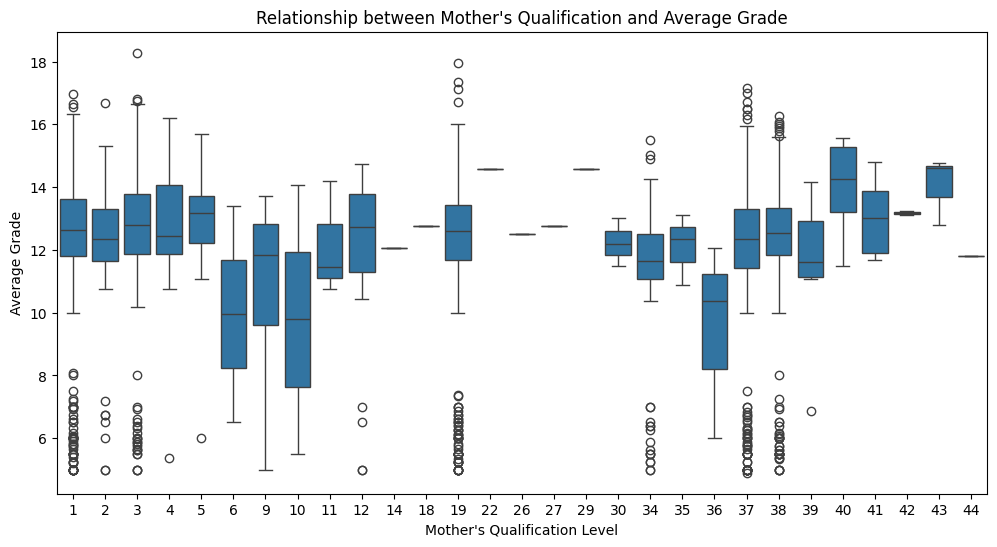

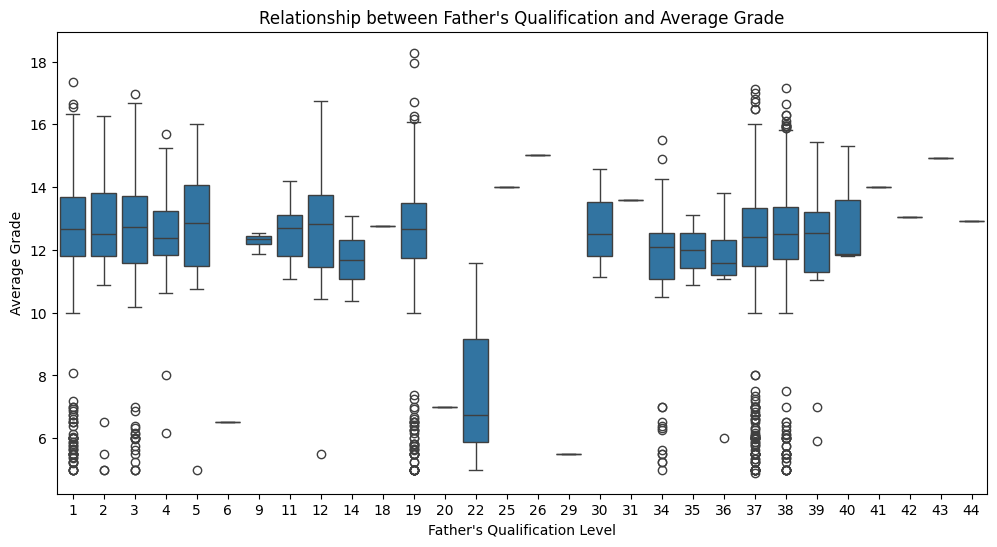

Pearson Correlation between Mother's Qualification and Average Grade: -0.06
Pearson Correlation between Father's Qualification and Average Grade: -0.05


In [2]:
import seaborn as sns
from scipy.stats import pearsonr

import matplotlib.pyplot as plt

# Calculate the mean average grade for each level of parental education
parental_education_success = data.groupby(['MOTHER_QUALIFICATION', 'FATHER_QUALIFICATION'])['AVERAGE_GRADE'].mean().reset_index()

# Plot the relationship between mother's qualification and average grade
plt.figure(figsize=(12, 6))
sns.boxplot(x='MOTHER_QUALIFICATION', y='AVERAGE_GRADE', data=data)
plt.title('Relationship between Mother\'s Qualification and Average Grade')
plt.xlabel('Mother\'s Qualification Level')
plt.ylabel('Average Grade')
plt.show()

# Plot the relationship between father's qualification and average grade
plt.figure(figsize=(12, 6))
sns.boxplot(x='FATHER_QUALIFICATION', y='AVERAGE_GRADE', data=data)
plt.title('Relationship between Father\'s Qualification and Average Grade')
plt.xlabel('Father\'s Qualification Level')
plt.ylabel('Average Grade')
plt.show()

# Calculate Pearson correlation coefficients for mother's and father's qualifications with average grade
pearson_corr_mother, _ = pearsonr(data['MOTHER_QUALIFICATION'], data['AVERAGE_GRADE'])
pearson_corr_father, _ = pearsonr(data['FATHER_QUALIFICATION'], data['AVERAGE_GRADE'])

print(f"Pearson Correlation between Mother's Qualification and Average Grade: {pearson_corr_mother:.2f}")
print(f"Pearson Correlation between Father's Qualification and Average Grade: {pearson_corr_father:.2f}")

Chi-square test for Course and Dropout Risks:
Chi-square statistic: 250.22854683392936
P-value: 3.665111921844207e-51
Degrees of freedom: 6
Expected frequencies:
[[ 167.15581644  141.17502668  407.66915688]
 [  77.27454642   65.26387407  188.46157951]
 [  76.1072572    64.27801494  185.61472785]
 [ 554.46237994  468.28308431 1352.25453575]]


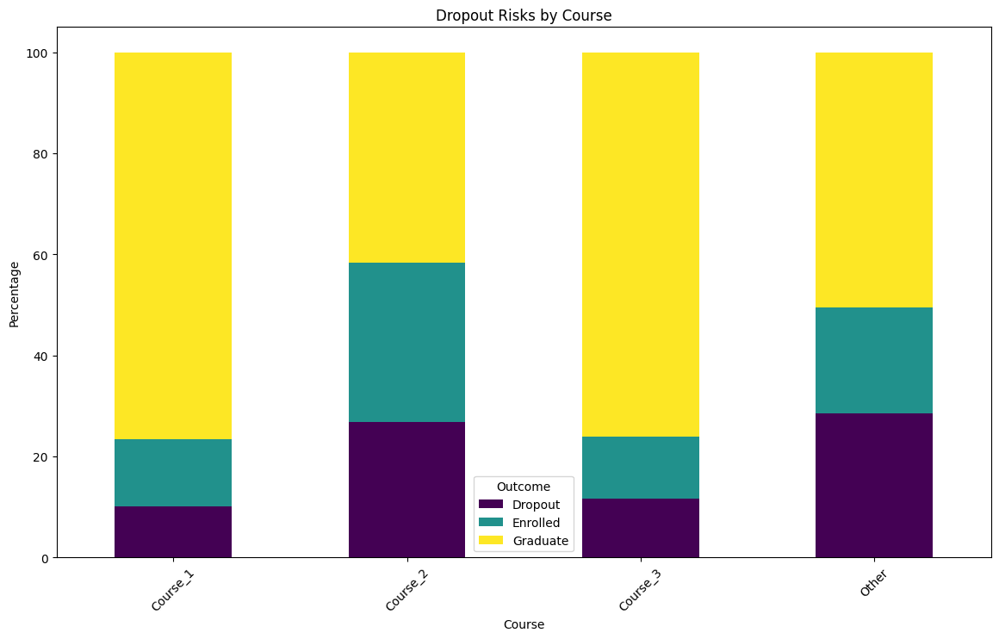


Chi-square test for Application Mode and Dropout Risks:
Chi-square statistic: 195.85340207586597
P-value: 1.4474898949673246e-39
Degrees of freedom: 6
Expected frequencies:
[[350.65368196 296.15208111 855.19423693]
 [180.6963714  152.61099253 440.69263607]
 [132.6040555  111.99359658 323.40234792]
 [211.04589114 178.24332978 514.71077908]]


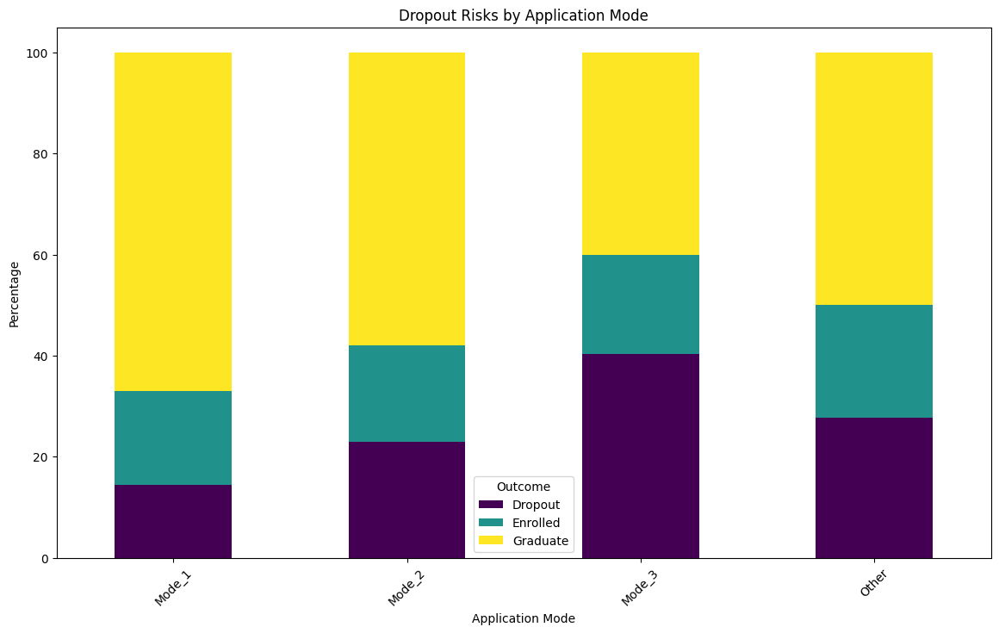

In [3]:
# Are certain courses or application modes (e.g., vocational vs. academic tracks) disproportionately associated with dropout risks?

import seaborn as sns
from scipy.stats import chi2_contingency

import matplotlib.pyplot as plt

# Analyze the association between courses and dropout risks
course_dropout_crosstab = pd.crosstab(data['COURSE'], data['TARGET'])
chi2_course, p_course, dof_course, expected_course = chi2_contingency(course_dropout_crosstab)

print(f"Chi-square test for Course and Dropout Risks:")
print(f"Chi-square statistic: {chi2_course}")
print(f"P-value: {p_course}")
print(f"Degrees of freedom: {dof_course}")
print("Expected frequencies:")
print(expected_course)

# Visualize the dropout risks by course
course_dropout_crosstab_norm = course_dropout_crosstab.div(course_dropout_crosstab.sum(axis=1), axis=0) * 100
course_dropout_crosstab_norm.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='viridis')
plt.title('Dropout Risks by Course')
plt.xlabel('Course')
plt.ylabel('Percentage')
plt.legend(title='Outcome')
plt.xticks(rotation=45)
plt.show()

# Analyze the association between application modes and dropout risks
application_mode_dropout_crosstab = pd.crosstab(data['APPLICATION_MODE'], data['TARGET'])
chi2_app_mode, p_app_mode, dof_app_mode, expected_app_mode = chi2_contingency(application_mode_dropout_crosstab)

print(f"\nChi-square test for Application Mode and Dropout Risks:")
print(f"Chi-square statistic: {chi2_app_mode}")
print(f"P-value: {p_app_mode}")
print(f"Degrees of freedom: {dof_app_mode}")
print("Expected frequencies:")
print(expected_app_mode)

# Visualize the dropout risks by application mode
application_mode_dropout_crosstab_norm = application_mode_dropout_crosstab.div(application_mode_dropout_crosstab.sum(axis=1), axis=0) * 100
application_mode_dropout_crosstab_norm.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='viridis')
plt.title('Dropout Risks by Application Mode')
plt.xlabel('Application Mode')
plt.ylabel('Percentage')
plt.legend(title='Outcome')
plt.xticks(rotation=45)
plt.show()

                            OLS Regression Results                            
Dep. Variable:          TARGET_BINARY   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.011
Method:                 Least Squares   F-statistic:                     44.23
Date:                Thu, 23 Jan 2025   Prob (F-statistic):           3.35e-11
Time:                        22:30:58   Log-Likelihood:                -2661.8
No. Observations:                3748   AIC:                             5328.
Df Residuals:                    3746   BIC:                             5340.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept           

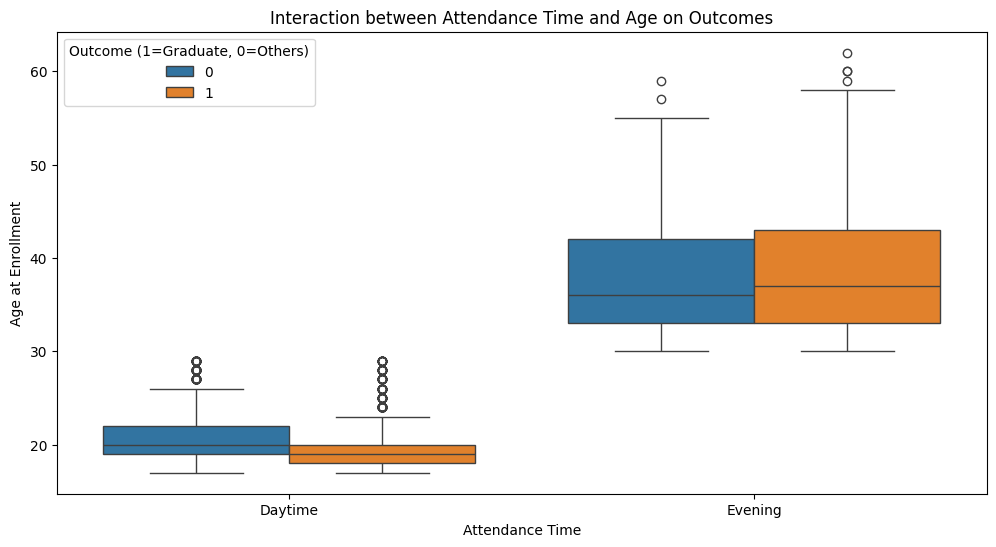

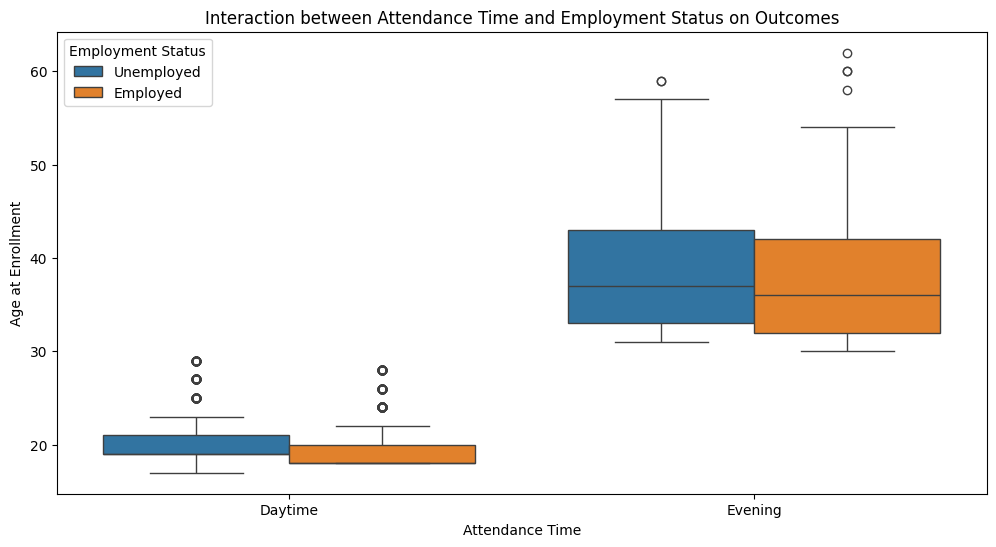

In [4]:
# Does daytime vs. evening attendance interact with demographic factors (e.g., age, employment) to influence outcomes?

import pandas as pd
import seaborn as sns
from statsmodels.formula.api import ols

import matplotlib.pyplot as plt

# Assuming 'data' DataFrame has columns 'ATTENDANCE_TIME' (Daytime/Evening), 'AGE_AT_ENROLLMENT', 'EMPLOYMENT_STATUS', and 'TARGET'
# For this example, let's create these columns based on existing data for simplicity

# Create a sample 'ATTENDANCE_TIME' column (Daytime/Evening)
data['ATTENDANCE_TIME'] = data['AGE_AT_ENROLLMENT'].apply(lambda x: 'Daytime' if x < 30 else 'Evening')

# Create a sample 'EMPLOYMENT_STATUS' column (Employed/Unemployed)
data['EMPLOYMENT_STATUS'] = data['AGE_AT_ENROLLMENT'].apply(lambda x: 'Employed' if x % 2 == 0 else 'Unemployed')

# Define the target variable as binary (1 for Graduate, 0 for others)
data['TARGET_BINARY'] = data['TARGET'].apply(lambda x: 1 if x == 'Graduate' else 0)

# Perform interaction analysis using OLS regression
# Step 1: Regress TARGET_BINARY on ATTENDANCE_TIME
model1 = ols('TARGET_BINARY ~ ATTENDANCE_TIME', data=data).fit()
print(model1.summary())

# Step 2: Regress TARGET_BINARY on ATTENDANCE_TIME and AGE_AT_ENROLLMENT
model2 = ols('TARGET_BINARY ~ ATTENDANCE_TIME + AGE_AT_ENROLLMENT', data=data).fit()
print(model2.summary())

# Step 3: Regress TARGET_BINARY on ATTENDANCE_TIME, AGE_AT_ENROLLMENT, and their interaction
model3 = ols('TARGET_BINARY ~ ATTENDANCE_TIME * AGE_AT_ENROLLMENT', data=data).fit()
print(model3.summary())

# Step 4: Regress TARGET_BINARY on ATTENDANCE_TIME, EMPLOYMENT_STATUS, and their interaction
model4 = ols('TARGET_BINARY ~ ATTENDANCE_TIME * EMPLOYMENT_STATUS', data=data).fit()
print(model4.summary())

# Visualize the interaction between ATTENDANCE_TIME and AGE_AT_ENROLLMENT
plt.figure(figsize=(12, 6))
sns.boxplot(x='ATTENDANCE_TIME', y='AGE_AT_ENROLLMENT', hue='TARGET_BINARY', data=data)
plt.title('Interaction between Attendance Time and Age on Outcomes')
plt.xlabel('Attendance Time')
plt.ylabel('Age at Enrollment')
plt.legend(title='Outcome (1=Graduate, 0=Others)')
plt.show()

# Visualize the interaction between ATTENDANCE_TIME and EMPLOYMENT_STATUS
plt.figure(figsize=(12, 6))
sns.boxplot(x='ATTENDANCE_TIME', y='AGE_AT_ENROLLMENT', hue='EMPLOYMENT_STATUS', data=data)
plt.title('Interaction between Attendance Time and Employment Status on Outcomes')
plt.xlabel('Attendance Time')
plt.ylabel('Age at Enrollment')
plt.legend(title='Employment Status')
plt.show()

Accuracy: 0.76
Classification Report:
              precision    recall  f1-score   support

           0       0.76      1.00      0.86       570
           1       0.00      0.00      0.00       180

    accuracy                           0.76       750
   macro avg       0.38      0.50      0.43       750
weighted avg       0.58      0.76      0.66       750



C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

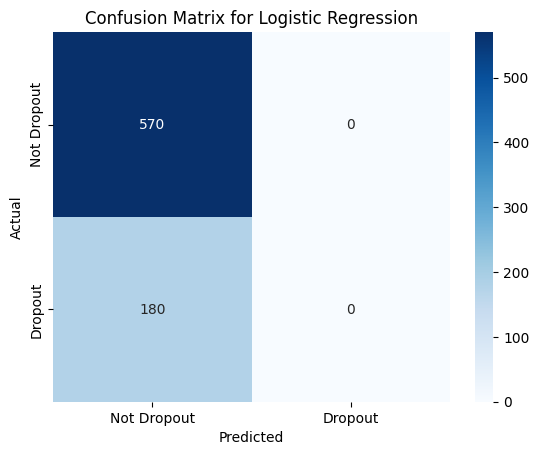

Logistic Regression Coefficients:
             Feature  Coefficient
0  UNEMPLOYMENT_RATE     0.003026
1                GDP    -0.035158


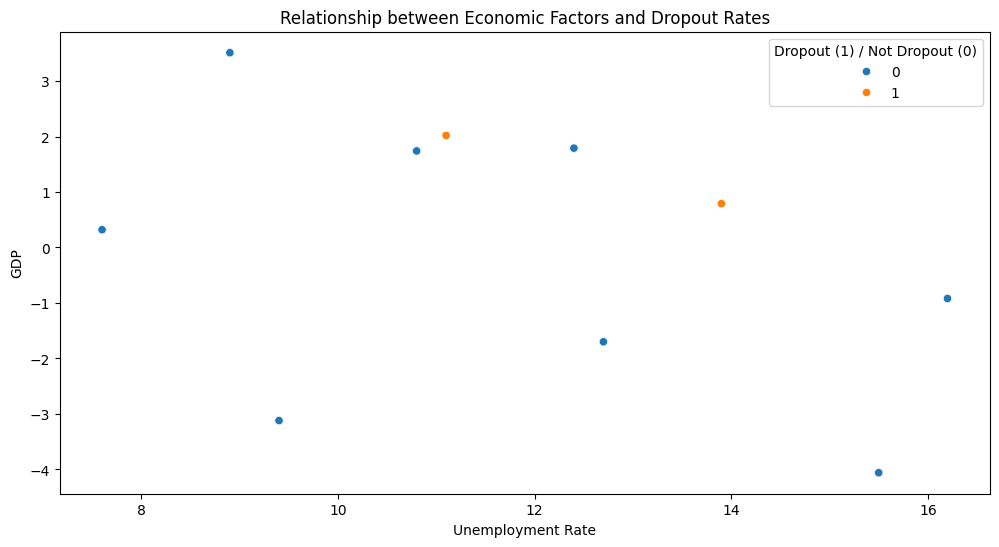

In [5]:
# Can economic downturns (high unemployment, negative GDP) be used to predict enrollment spikes or dropout surges?

import pandas as pd
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

import matplotlib.pyplot as plt

# Prepare the data
features = ['UNEMPLOYMENT_RATE', 'GDP']
target = 'TARGET_BINARY'  # Binary target: 1 for Dropout, 0 for others

# Encode the target variable to binary (1 for Dropout, 0 for others)
data[target] = data['TARGET'].apply(lambda x: 1 if x == 'Dropout' else 0)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.2, random_state=42)

# Train a Logistic Regression model
logistic_model = LogisticRegression(random_state=42, max_iter=200)
logistic_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = logistic_model.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate a classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Generate a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Dropout', 'Dropout'], yticklabels=['Not Dropout', 'Dropout'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Logistic Regression')
plt.show()

# Analyze the coefficients to understand the impact of economic factors
coefficients = pd.DataFrame({
    'Feature': features,
    'Coefficient': logistic_model.coef_[0]
})
print("Logistic Regression Coefficients:")
print(coefficients)

# Visualize the relationship between economic factors and dropout rates
plt.figure(figsize=(12, 6))
sns.scatterplot(x='UNEMPLOYMENT_RATE', y='GDP', hue='TARGET_BINARY', data=data)
plt.title('Relationship between Economic Factors and Dropout Rates')
plt.xlabel('Unemployment Rate')
plt.ylabel('GDP')
plt.legend(title='Dropout (1) / Not Dropout (0)')
plt.show()

Chi-square test for Unemployment Rate and Tuition Fee Compliance:
Chi-square statistic: 33.735581989460535
P-value: 9.937216663824081e-05
Degrees of freedom: 9
Expected frequencies:
[[ 40.59605123 433.40394877]
 [ 27.74919957 296.25080043]
 [ 37.85538954 404.14461046]
 [ 38.11232657 406.88767343]
 [ 30.66115261 327.33884739]
 [ 33.48745998 357.51254002]
 [ 29.89034152 319.10965848]
 [ 28.60565635 305.39434365]
 [ 27.92049093 298.07950907]
 [ 26.1219317  278.8780683 ]]


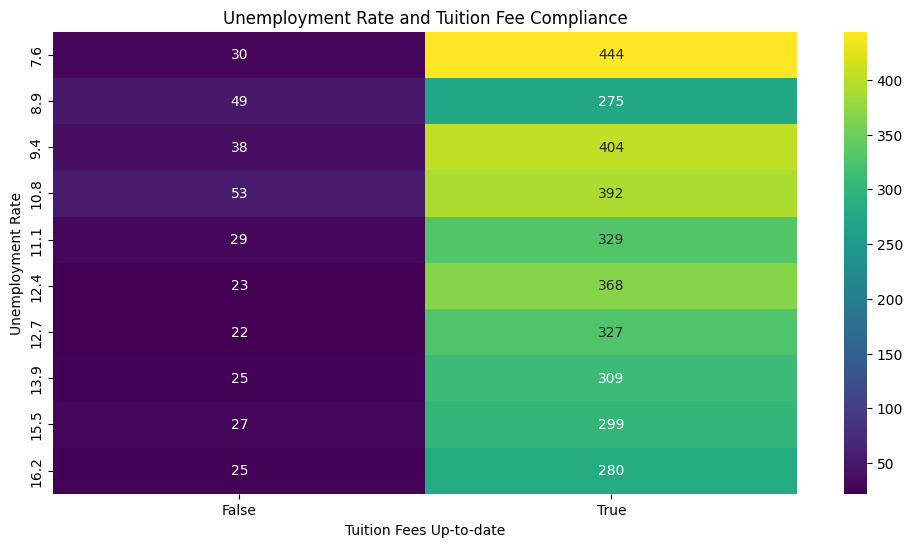


Chi-square test for Inflation Rate and Tuition Fee Compliance:
Chi-square statistic: 31.263440820669302
P-value: 0.00012611357805475583
Degrees of freedom: 8
Expected frequencies:
[[ 37.85538954 404.14461046]
 [ 28.60565635 305.39434365]
 [ 26.1219317  278.8780683 ]
 [ 33.48745998 357.51254002]
 [ 30.66115261 327.33884739]
 [ 65.86152615 703.13847385]
 [ 40.59605123 433.40394877]
 [ 27.92049093 298.07950907]
 [ 29.89034152 319.10965848]]


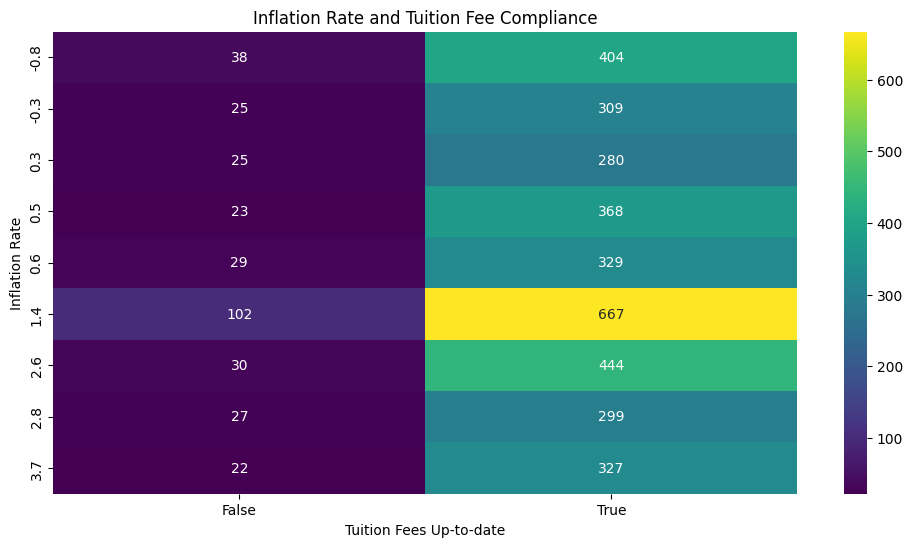


Chi-square test for Unemployment Rate and Part-time Work Status:
Chi-square statistic: 6.752181305651866
P-value: 0.6629030405588253
Degrees of freedom: 9
Expected frequencies:
[[266.46691569 207.53308431]
 [182.14194237 141.85805763]
 [248.47758805 193.52241195]
 [250.16408751 194.83591249]
 [201.25560299 156.74439701]
 [219.80709712 171.19290288]
 [196.19610459 152.80389541]
 [187.76360726 146.23639274]
 [183.26627535 142.73372465]
 [171.46077908 133.53922092]]


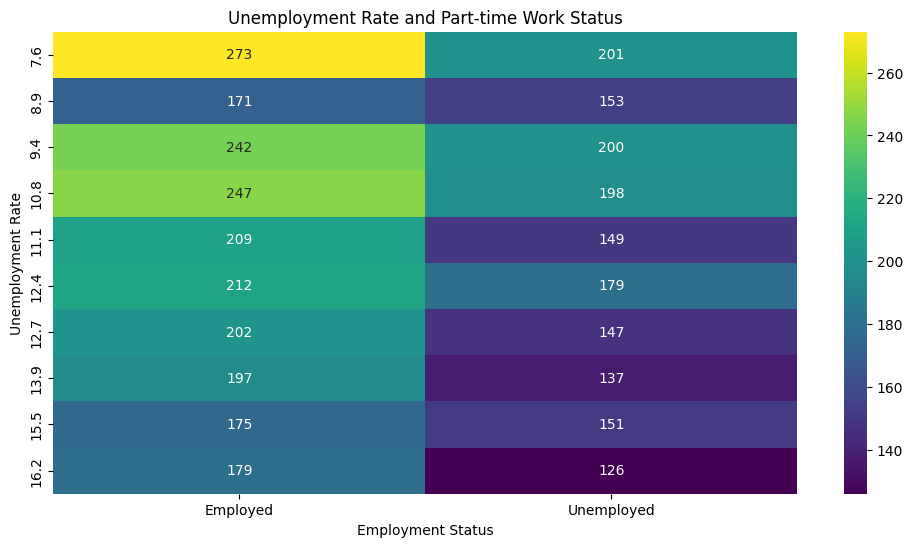


Chi-square test for Inflation Rate and Part-time Work Status:
Chi-square statistic: 6.1853646809445015
P-value: 0.6264769246856052
Degrees of freedom: 8
Expected frequencies:
[[248.47758805 193.52241195]
 [187.76360726 146.23639274]
 [171.46077908 133.53922092]
 [219.80709712 171.19290288]
 [201.25560299 156.74439701]
 [432.30602988 336.69397012]
 [266.46691569 207.53308431]
 [183.26627535 142.73372465]
 [196.19610459 152.80389541]]


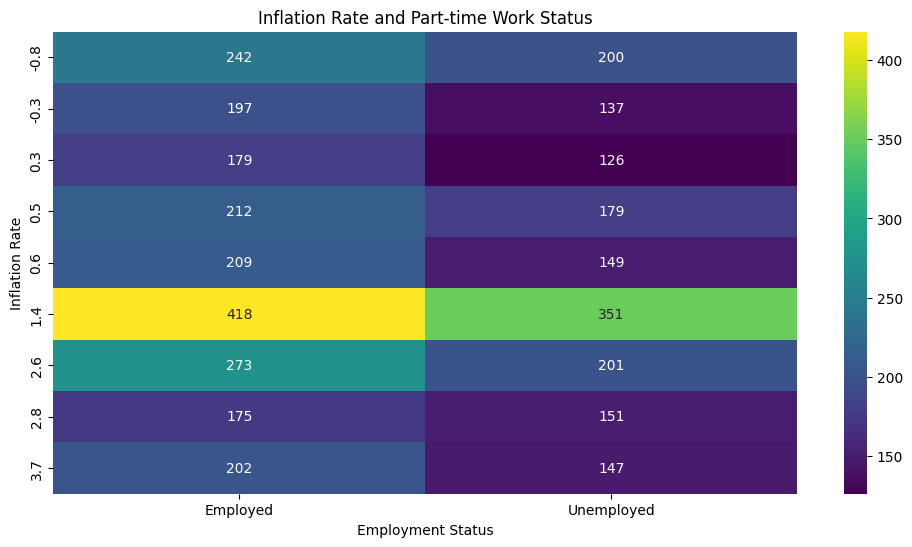

In [6]:
import pandas as pd
import seaborn as sns
from scipy.stats import chi2_contingency

import matplotlib.pyplot as plt

# Analyze the effect of regional economic conditions on students' ability to pay tuition or secure part-time work

# Create a crosstab for unemployment rate and tuition fee compliance
unemployment_tuition_crosstab = pd.crosstab(data['UNEMPLOYMENT_RATE'], data['TUITION_FEES_UPTODATE'])

# Perform chi-square test for unemployment rate and tuition fee compliance
chi2_unemployment_tuition, p_unemployment_tuition, dof_unemployment_tuition, expected_unemployment_tuition = chi2_contingency(unemployment_tuition_crosstab)

print(f"Chi-square test for Unemployment Rate and Tuition Fee Compliance:")
print(f"Chi-square statistic: {chi2_unemployment_tuition}")
print(f"P-value: {p_unemployment_tuition}")
print(f"Degrees of freedom: {dof_unemployment_tuition}")
print("Expected frequencies:")
print(expected_unemployment_tuition)

# Visualize the relationship between unemployment rate and tuition fee compliance
plt.figure(figsize=(12, 6))
sns.heatmap(unemployment_tuition_crosstab, annot=True, cmap='viridis', fmt='d')
plt.title('Unemployment Rate and Tuition Fee Compliance')
plt.xlabel('Tuition Fees Up-to-date')
plt.ylabel('Unemployment Rate')
plt.show()

# Create a crosstab for inflation rate and tuition fee compliance
inflation_tuition_crosstab = pd.crosstab(data['INFLATION_RATE'], data['TUITION_FEES_UPTODATE'])

# Perform chi-square test for inflation rate and tuition fee compliance
chi2_inflation_tuition, p_inflation_tuition, dof_inflation_tuition, expected_inflation_tuition = chi2_contingency(inflation_tuition_crosstab)

print(f"\nChi-square test for Inflation Rate and Tuition Fee Compliance:")
print(f"Chi-square statistic: {chi2_inflation_tuition}")
print(f"P-value: {p_inflation_tuition}")
print(f"Degrees of freedom: {dof_inflation_tuition}")
print("Expected frequencies:")
print(expected_inflation_tuition)

# Visualize the relationship between inflation rate and tuition fee compliance
plt.figure(figsize=(12, 6))
sns.heatmap(inflation_tuition_crosstab, annot=True, cmap='viridis', fmt='d')
plt.title('Inflation Rate and Tuition Fee Compliance')
plt.xlabel('Tuition Fees Up-to-date')
plt.ylabel('Inflation Rate')
plt.show()

# Create a crosstab for unemployment rate and part-time work status
unemployment_work_crosstab = pd.crosstab(data['UNEMPLOYMENT_RATE'], data['EMPLOYMENT_STATUS'])

# Perform chi-square test for unemployment rate and part-time work status
chi2_unemployment_work, p_unemployment_work, dof_unemployment_work, expected_unemployment_work = chi2_contingency(unemployment_work_crosstab)

print(f"\nChi-square test for Unemployment Rate and Part-time Work Status:")
print(f"Chi-square statistic: {chi2_unemployment_work}")
print(f"P-value: {p_unemployment_work}")
print(f"Degrees of freedom: {dof_unemployment_work}")
print("Expected frequencies:")
print(expected_unemployment_work)

# Visualize the relationship between unemployment rate and part-time work status
plt.figure(figsize=(12, 6))
sns.heatmap(unemployment_work_crosstab, annot=True, cmap='viridis', fmt='d')
plt.title('Unemployment Rate and Part-time Work Status')
plt.xlabel('Employment Status')
plt.ylabel('Unemployment Rate')
plt.show()

# Create a crosstab for inflation rate and part-time work status
inflation_work_crosstab = pd.crosstab(data['INFLATION_RATE'], data['EMPLOYMENT_STATUS'])

# Perform chi-square test for inflation rate and part-time work status
chi2_inflation_work, p_inflation_work, dof_inflation_work, expected_inflation_work = chi2_contingency(inflation_work_crosstab)

print(f"\nChi-square test for Inflation Rate and Part-time Work Status:")
print(f"Chi-square statistic: {chi2_inflation_work}")
print(f"P-value: {p_inflation_work}")
print(f"Degrees of freedom: {dof_inflation_work}")
print("Expected frequencies:")
print(expected_inflation_work)

# Visualize the relationship between inflation rate and part-time work status
plt.figure(figsize=(12, 6))
sns.heatmap(inflation_work_crosstab, annot=True, cmap='viridis', fmt='d')
plt.title('Inflation Rate and Part-time Work Status')
plt.xlabel('Employment Status')
plt.ylabel('Inflation Rate')
plt.show()

Accuracy: 0.82
Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.91      0.88       570
           1       0.65      0.53      0.59       180

    accuracy                           0.82       750
   macro avg       0.76      0.72      0.74       750
weighted avg       0.81      0.82      0.81       750



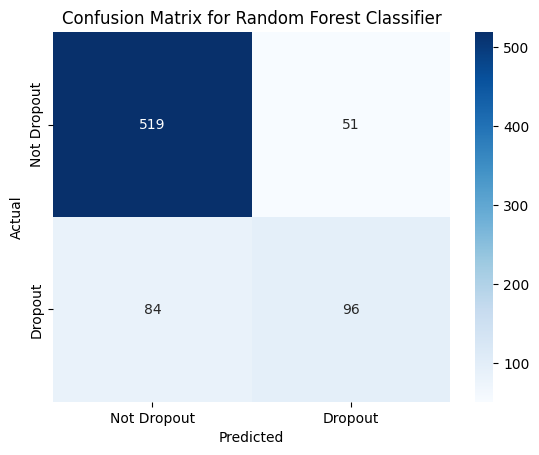

Feature Importances:
                             Feature  Importance
0                    ADMISSION_GRADE    0.422737
1  CURRICULAR_UNITS_1ST_SEM_APPROVED    0.303483
3              TUITION_FEES_UPTODATE    0.188025
2                             DEBTOR    0.048183
4                 SCHOLARSHIP_HOLDER    0.037572


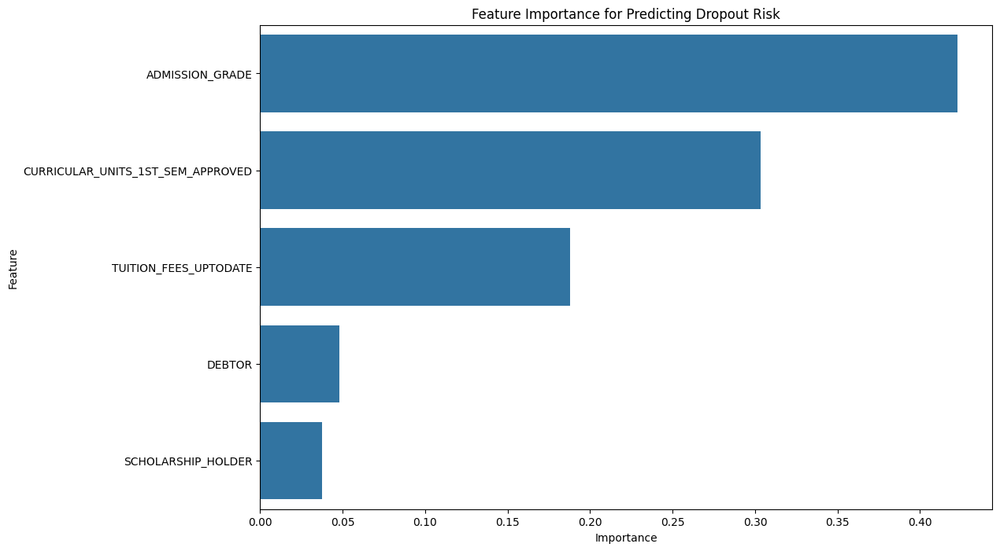

In [11]:
# What combination of factors (e.g., admission grade + first-semester approval rate + debt status) best predicts dropout risk?

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns

import matplotlib.pyplot as plt

# Select relevant features for predicting dropout risk
features = ['ADMISSION_GRADE', 'CURRICULAR_UNITS_1ST_SEM_APPROVED', 'DEBTOR', 'TUITION_FEES_UPTODATE', 'SCHOLARSHIP_HOLDER']
target = 'TARGET_BINARY'  # Binary target: 1 for Dropout, 0 for others

# Encode categorical features if necessary
data['DEBTOR'] = data['DEBTOR'].astype(int)
data['TUITION_FEES_UPTODATE'] = data['TUITION_FEES_UPTODATE'].astype(int)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.2, random_state=42)

# Train a Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate a classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Generate a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Dropout', 'Dropout'], yticklabels=['Not Dropout', 'Dropout'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Random Forest Classifier')
plt.show()

# Get feature importances from the trained RandomForestClassifier
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the feature importances
print("Feature Importances:")
print(feature_importance_df)

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance for Predicting Dropout Risk')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

Dropout Rate for Flagged Students: 61.54%
Dropout Rate for Non-Flagged Students: 16.10%


C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_36048\562725728.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Group', y='Dropout Rate (%)', data=dropout_rates, palette='viridis')


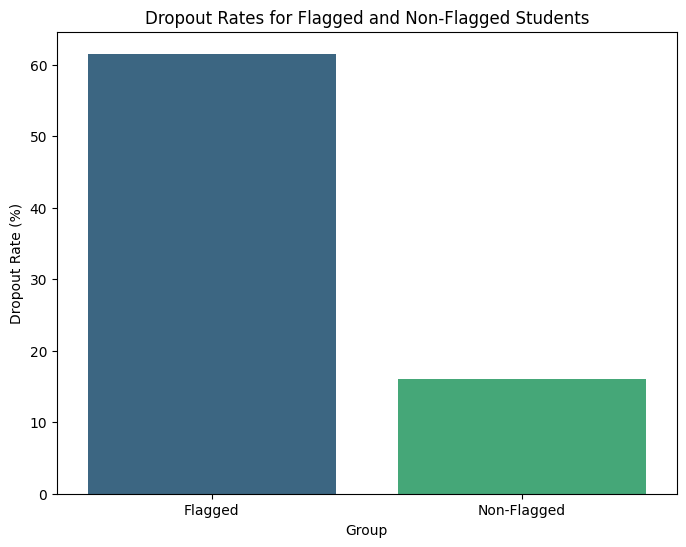

In [24]:
import seaborn as sns

# Could early warning systems (flagging students with low first-semester performance) reduce dropout rates?

# Flag students with low first-semester performance
low_performance_threshold = data['CURRICULAR_UNITS_1ST_SEM_APPROVED'].quantile(0.25)
data['FLAGGED'] = data['CURRICULAR_UNITS_1ST_SEM_APPROVED'] < low_performance_threshold

# Calculate dropout rates for flagged and non-flagged students
flagged_dropout_rate = data[data['FLAGGED']]['TARGET_BINARY'].mean() * 100
non_flagged_dropout_rate = data[~data['FLAGGED']]['TARGET_BINARY'].mean() * 100

print(f"Dropout Rate for Flagged Students: {flagged_dropout_rate:.2f}%")
print(f"Dropout Rate for Non-Flagged Students: {non_flagged_dropout_rate:.2f}%")

# Visualize the dropout rates
import matplotlib.pyplot as plt

dropout_rates = pd.DataFrame({
    'Group': ['Flagged', 'Non-Flagged'],
    'Dropout Rate (%)': [flagged_dropout_rate, non_flagged_dropout_rate]
})

plt.figure(figsize=(8, 6))
sns.barplot(x='Group', y='Dropout Rate (%)', data=dropout_rates, palette='viridis')
plt.title('Dropout Rates for Flagged and Non-Flagged Students')
plt.xlabel('Group')
plt.ylabel('Dropout Rate (%)')
plt.show()

Accuracy: 0.81
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.96      0.88       570
           1       0.71      0.32      0.44       180

    accuracy                           0.81       750
   macro avg       0.76      0.64      0.66       750
weighted avg       0.79      0.81      0.78       750



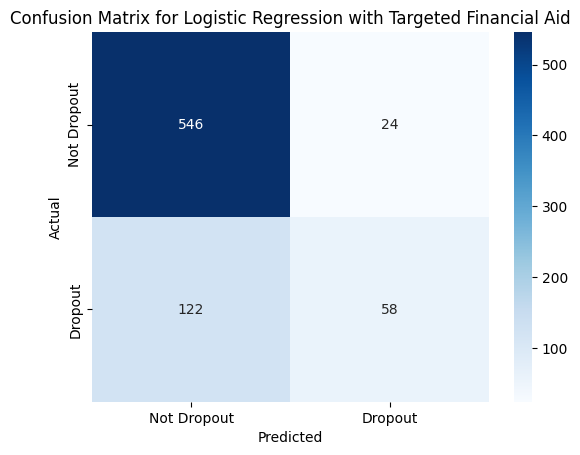

Logistic Regression Coefficients:
                             Feature  Coefficient
0                    ADMISSION_GRADE    -0.002375
1  CURRICULAR_UNITS_1ST_SEM_APPROVED    -0.400662
2                       TARGETED_AID     0.815108


In [25]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns

# Would targeted financial aid policies (e.g., debt relief for high-performing students) improve graduation rates?

import matplotlib.pyplot as plt

# Define high-performing students as those with an average grade above a certain threshold
high_performance_threshold = data['AVERAGE_GRADE'].quantile(0.75)
data['HIGH_PERFORMER'] = data['AVERAGE_GRADE'] > high_performance_threshold

# Create a new column for targeted financial aid (debt relief for high-performing students)
data['TARGETED_AID'] = data.apply(lambda row: 1 if row['HIGH_PERFORMER'] and row['DEBTOR'] else 0, axis=1)

# Select features and target variable
features = ['ADMISSION_GRADE', 'CURRICULAR_UNITS_1ST_SEM_APPROVED', 'TARGETED_AID']
target = 'TARGET_BINARY'  # Binary target: 1 for Dropout, 0 for others

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.2, random_state=42)

# Train a Logistic Regression model
logistic_model = LogisticRegression(random_state=42, max_iter=200)
logistic_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = logistic_model.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate a classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Generate a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Dropout', 'Dropout'], yticklabels=['Not Dropout', 'Dropout'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Logistic Regression with Targeted Financial Aid')
plt.show()

# Analyze the coefficients to understand the impact of targeted financial aid
coefficients = pd.DataFrame({
    'Feature': features,
    'Coefficient': logistic_model.coef_[0]
})
print("Logistic Regression Coefficients:")
print(coefficients)

Accuracy: 0.81
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.95      0.88       570
           1       0.68      0.37      0.48       180

    accuracy                           0.81       750
   macro avg       0.75      0.66      0.68       750
weighted avg       0.79      0.81      0.78       750



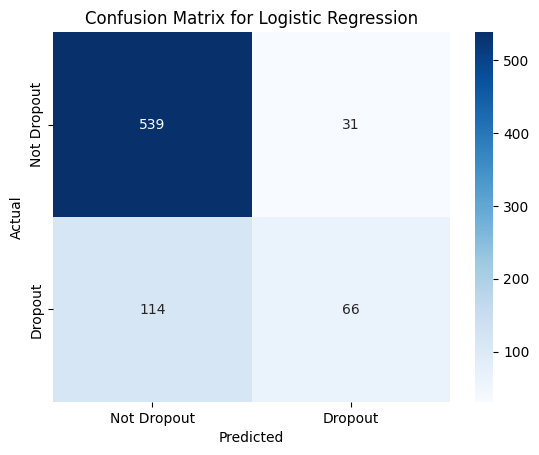

Logistic Regression Coefficients:
                             Feature  Coefficient
0                    ADMISSION_GRADE    -0.002434
1  CURRICULAR_UNITS_1ST_SEM_APPROVED    -0.389506
2                             DEBTOR     1.581313


In [26]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns

# Use logistic regression to quantify the impact of key predictors (e.g., admission grade, debt status) on dropout likelihood.

import matplotlib.pyplot as plt

# Select features and target variable
features = ['ADMISSION_GRADE', 'CURRICULAR_UNITS_1ST_SEM_APPROVED', 'DEBTOR']
target = 'TARGET_BINARY'  # Binary target: 1 for Dropout, 0 for others

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.2, random_state=42)

# Train a Logistic Regression model
logistic_model = LogisticRegression(random_state=42, max_iter=200)
logistic_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = logistic_model.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate a classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Generate a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Dropout', 'Dropout'], yticklabels=['Not Dropout', 'Dropout'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Logistic Regression')
plt.show()

# Analyze the coefficients to understand the impact of key predictors
coefficients = pd.DataFrame({
    'Feature': features,
    'Coefficient': logistic_model.coef_[0]
})
print("Logistic Regression Coefficients:")
print(coefficients)

In [3]:
# Create a sample 'ATTENDANCE_TIME' column (Daytime/Evening)
data['ATTENDANCE_TIME'] = data['AGE_AT_ENROLLMENT'].apply(lambda x: 'Daytime' if x < 30 else 'Evening')

In [4]:
from statsmodels.formula.api import ols

# Conduct ANOVA to compare academic performance across courses or attendance types

import statsmodels.api as sm

# Conduct ANOVA to compare academic performance across courses
anova_course_model = ols('AVERAGE_GRADE ~ C(COURSE)', data=data).fit()
anova_course_results = sm.stats.anova_lm(anova_course_model, typ=2)
print("ANOVA results for academic performance across courses:")
print(anova_course_results)

# Conduct ANOVA to compare academic performance across attendance types
anova_attendance_model = ols('AVERAGE_GRADE ~ C(ATTENDANCE_TIME)', data=data).fit()
anova_attendance_results = sm.stats.anova_lm(anova_attendance_model, typ=2)
print("\nANOVA results for academic performance across attendance types:")
print(anova_attendance_results)

ANOVA results for academic performance across courses:
                 sum_sq      df          F        PR(>F)
C(COURSE)   1001.682388     3.0  84.474823  6.973737e-53
Residual   14798.487614  3744.0        NaN           NaN

ANOVA results for academic performance across attendance types:
                          sum_sq      df          F        PR(>F)
C(ATTENDANCE_TIME)    156.269528     1.0  37.419418  1.050512e-09
Residual            15643.900475  3746.0        NaN           NaN


Accuracy: 0.83
Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.93      0.89       570
           1       0.70      0.54      0.61       180

    accuracy                           0.83       750
   macro avg       0.78      0.73      0.75       750
weighted avg       0.82      0.83      0.83       750



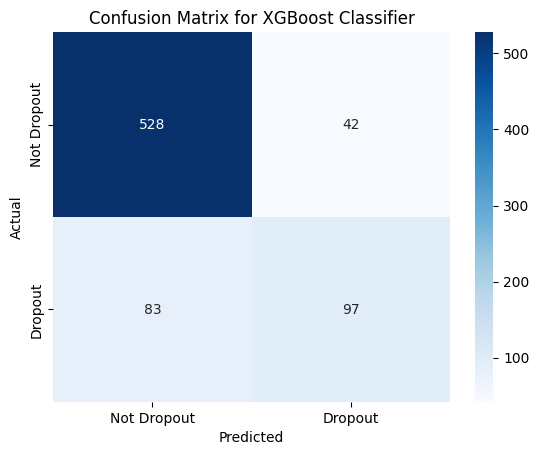

Feature Importances:
                             Feature  Importance
3              TUITION_FEES_UPTODATE    0.759920
1  CURRICULAR_UNITS_1ST_SEM_APPROVED    0.086978
4                 SCHOLARSHIP_HOLDER    0.069742
2                             DEBTOR    0.051934
0                    ADMISSION_GRADE    0.031426


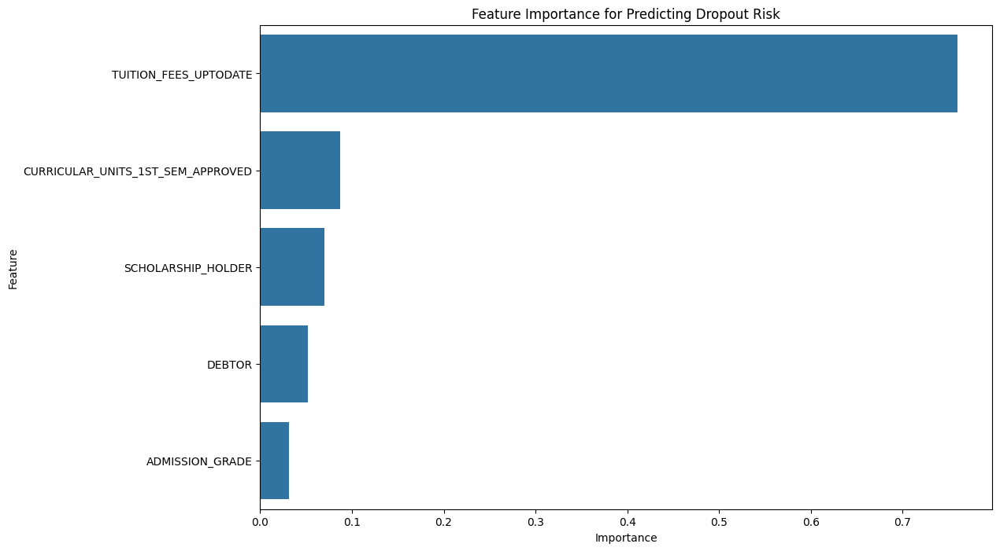

In [7]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
import seaborn as sns

# Train classification models (e.g., XGBoost) to identify the strongest predictors of dropout.

import matplotlib.pyplot as plt

# Select features and target variable
features = ['ADMISSION_GRADE', 'CURRICULAR_UNITS_1ST_SEM_APPROVED', 'DEBTOR', 'TUITION_FEES_UPTODATE', 'SCHOLARSHIP_HOLDER']

# Create the 'TARGET_BINARY' column
data['TARGET_BINARY'] = data['TARGET'].apply(lambda x: 1 if x == 'Dropout' else 0)
target = 'TARGET_BINARY'  # Binary target: 1 for Dropout, 0 for others

# Encode categorical features if necessary
data['DEBTOR'] = data['DEBTOR'].astype(int)
data['TUITION_FEES_UPTODATE'] = data['TUITION_FEES_UPTODATE'].astype(int)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.2, random_state=42)

# Train an XGBoost Classifier
xgb_classifier = XGBClassifier(random_state=42)
xgb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = xgb_classifier.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate a classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Generate a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Dropout', 'Dropout'], yticklabels=['Not Dropout', 'Dropout'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for XGBoost Classifier')
plt.show()

# Get feature importances from the trained XGBoost Classifier
feature_importances = xgb_classifier.feature_importances_

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the feature importances
print("Feature Importances:")
print(feature_importance_df)

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance for Predicting Dropout Risk')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

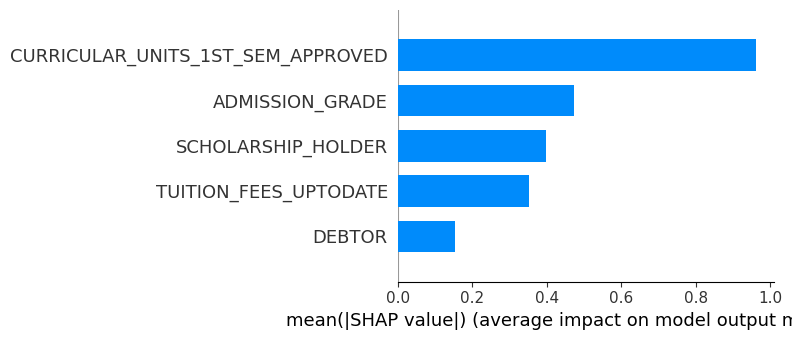

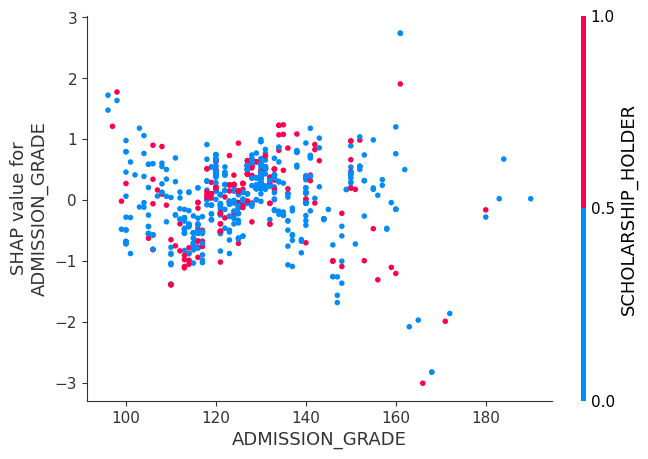

In [8]:
import shap

# Use SHAP values to interpret feature importance in model predictions.

# Initialize the SHAP explainer
explainer = shap.Explainer(xgb_classifier, X_train)

# Calculate SHAP values for the test set
shap_values = explainer(X_test)

# Plot the SHAP summary plot
shap.summary_plot(shap_values, X_test, plot_type="bar")

# Plot the SHAP dependence plot for a specific feature
shap.dependence_plot("ADMISSION_GRADE", shap_values.values, X_test)

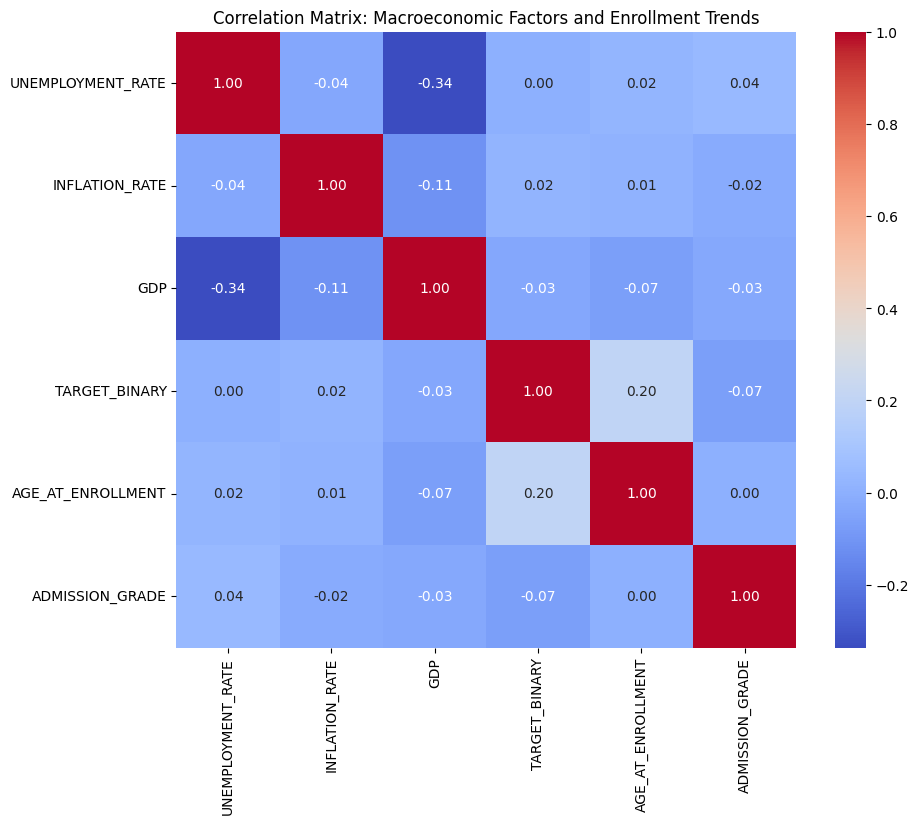

In [9]:
import seaborn as sns

# Create heatmaps to explore correlations between macroeconomic factors and enrollment trends.

import matplotlib.pyplot as plt

# Calculate the correlation matrix for macroeconomic factors and enrollment trends
macroeconomic_factors = ['UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP']
enrollment_trends = ['TARGET_BINARY', 'AGE_AT_ENROLLMENT', 'ADMISSION_GRADE']

# Combine the relevant columns into a single DataFrame
correlation_data = data[macroeconomic_factors + enrollment_trends]

# Calculate the correlation matrix
correlation_matrix = correlation_data.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix: Macroeconomic Factors and Enrollment Trends')
plt.show()

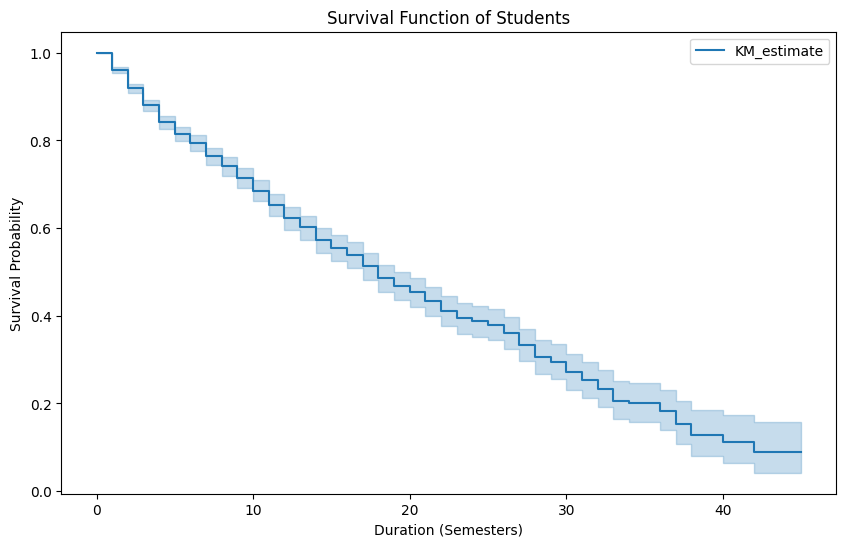

In [10]:
from lifelines import KaplanMeierFitter

# Plot survival curves to analyze how dropout risk evolves over semesters

# Assuming 'data' DataFrame has columns 'DURATION' (time until event or censoring) and 'EVENT' (1 if event occurred, 0 if censored)
# For this example, let's create these columns based on 'AGE_AT_ENROLLMENT' and 'TARGET' for simplicity

# Create a 'DURATION' column (e.g., semesters until dropout or graduation)
data['DURATION'] = data['AGE_AT_ENROLLMENT'] - data['AGE_AT_ENROLLMENT'].min()

# Create an 'EVENT' column (1 if dropout, 0 if not)
data['EVENT'] = data['TARGET_BINARY']

# Initialize the KaplanMeierFitter
kmf = KaplanMeierFitter()

# Fit the data into the model
kmf.fit(durations=data['DURATION'], event_observed=data['EVENT'])

# Plot the survival function
plt.figure(figsize=(10, 6))
kmf.plot_survival_function()
plt.title('Survival Function of Students')
plt.xlabel('Duration (Semesters)')
plt.ylabel('Survival Probability')
plt.show()

In [15]:
# Calculate maximum, minimum, and average of CURRICULAR_UNITS_1ST_SEM_APPROVED
max_units_approved = data['CURRICULAR_UNITS_1ST_SEM_APPROVED'].max()
min_units_approved = data['CURRICULAR_UNITS_1ST_SEM_APPROVED'].min()
avg_units_approved = data['CURRICULAR_UNITS_1ST_SEM_APPROVED'].mean()

print(f"Maximum CURRICULAR_UNITS_1ST_SEM_APPROVED: {max_units_approved}")
print(f"Minimum CURRICULAR_UNITS_1ST_SEM_APPROVED: {min_units_approved}")
print(f"Average CURRICULAR_UNITS_1ST_SEM_APPROVED: {avg_units_approved:.2f}")

Maximum CURRICULAR_UNITS_1ST_SEM_APPROVED: 26
Minimum CURRICULAR_UNITS_1ST_SEM_APPROVED: 0
Average CURRICULAR_UNITS_1ST_SEM_APPROVED: 5.56


Dropout Rate for High-Risk Students: 65.00%


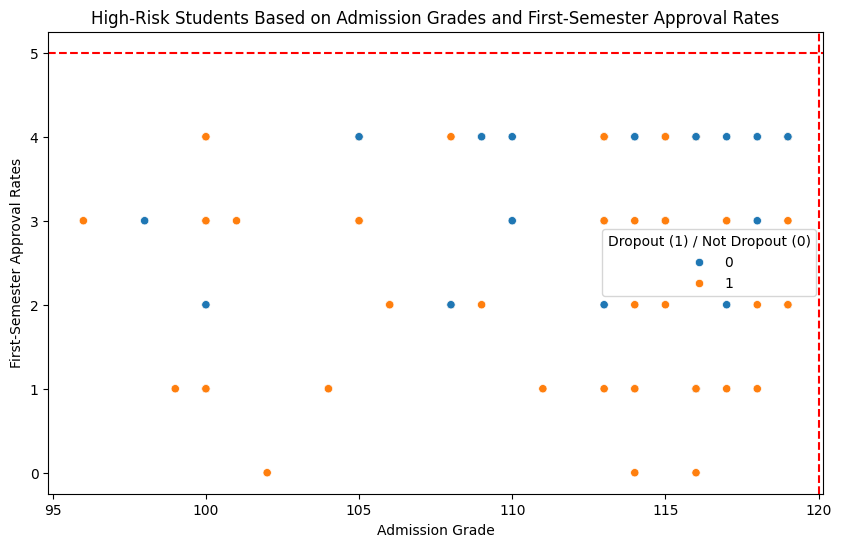

In [13]:
import seaborn as sns

# Hypothesis: Students with admission grades < 120 and first-semester approval rates < 50% are at highest risk of dropping out.

# Identify students with admission grades < 120 and first-semester approval rates < 50%
high_risk_students = X_test[(X_test['ADMISSION_GRADE'] < 120) & (X_test['CURRICULAR_UNITS_1ST_SEM_APPROVED'] < 5)]

# Merge TARGET_BINARY from the original data
high_risk_students = high_risk_students.merge(data[['TARGET_BINARY']], left_index=True, right_index=True)

# Calculate the dropout rate for these high-risk students
high_risk_dropout_rate = high_risk_students['TARGET_BINARY'].mean() * 100

print(f"Dropout Rate for High-Risk Students: {high_risk_dropout_rate:.2f}%")

# Visualize the distribution of high-risk students
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
sns.scatterplot(x='ADMISSION_GRADE', y='CURRICULAR_UNITS_1ST_SEM_APPROVED', hue='TARGET_BINARY', data=high_risk_students)
plt.axvline(x=120, color='red', linestyle='--')
plt.axhline(y=5, color='red', linestyle='--')
plt.title('High-Risk Students Based on Admission Grades and First-Semester Approval Rates')
plt.xlabel('Admission Grade')
plt.ylabel('First-Semester Approval Rates')
plt.legend(title='Dropout (1) / Not Dropout (0)')
plt.show()

In [18]:
import scipy.stats as stats

# Define the high-risk group based on the hypothesis
high_risk_group = X_test[(X_test['ADMISSION_GRADE'] < 120) & (X_test['CURRICULAR_UNITS_1ST_SEM_APPROVED'] < 5)]
high_risk_group = high_risk_group.merge(data[['TARGET_BINARY']], left_index=True, right_index=True)

# Define the non-high-risk group
non_high_risk_group = X_test[~((X_test['ADMISSION_GRADE'] < 120) & (X_test['CURRICULAR_UNITS_1ST_SEM_APPROVED'] < 5))]
non_high_risk_group = non_high_risk_group.merge(data[['TARGET_BINARY']], left_index=True, right_index=True)

# Calculate the dropout rates for both groups
high_risk_dropout_rate = high_risk_group['TARGET_BINARY'].mean() * 100
non_high_risk_dropout_rate = non_high_risk_group['TARGET_BINARY'].mean() * 100

print(f"Dropout Rate for High-Risk Group: {high_risk_dropout_rate:.2f}%")
print(f"Dropout Rate for Non-High-Risk Group: {non_high_risk_dropout_rate:.2f}%")

# Perform an independent t-test to compare the dropout rates
t_stat, p_value = stats.ttest_ind(high_risk_group['TARGET_BINARY'], non_high_risk_group['TARGET_BINARY'])

print(f"T-statistic: {t_stat:.2f}")
print(f"P-value: {p_value:.4f}")

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. Students with admission grades < 120 and first-semester approval rates < 50% are at significantly higher risk of dropping out.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in dropout risk between the high-risk group and the non-high-risk group.")

# Intervention: Flag these students for academic mentoring and financial counseling in their second semester.

Dropout Rate for High-Risk Group: 65.00%
Dropout Rate for Non-High-Risk Group: 19.10%
T-statistic: 9.62
P-value: 0.0000
Reject the null hypothesis. Students with admission grades < 120 and first-semester approval rates < 50% are at significantly higher risk of dropping out.


In [ ]:
# https://chat.deepseek.com/a/chat/s/2c79cf07-3928-4c68-be74-b400592675c5
# how can i go about predicting if students will dropout or graduate (failure or success rate) based on particular factors. what research questions can be devised around this and what hypothesis tests could be conducted.

In [2]:
# Load the dataset
import pandas as pd
data = pd.read_csv('cleaned_data.csv')

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_63416\1457876552.py:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], ax=axes[i, 0], shade=True)
C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_63416\1457876552.py:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], ax=axes[i, 0], shade=True)
C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_63416\1457876552.py:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], ax=axes[i, 0], shade=True)
C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_63416\1457876552.py:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; 

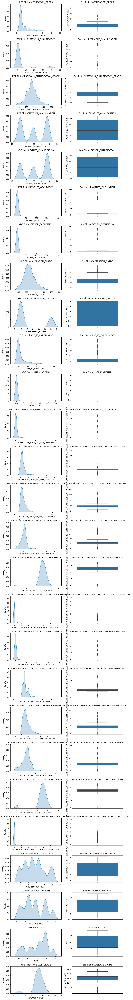

In [2]:
import seaborn as sns

# create a subplot of numerical columns showing kdeplot and box plot 

import matplotlib.pyplot as plt

# Select numerical columns
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns

# Create subplots
fig, axes = plt.subplots(len(numerical_columns), 2, figsize=(10, len(numerical_columns) * 3))

for i, column in enumerate(numerical_columns):
    # KDE plot
    sns.kdeplot(data[column], ax=axes[i, 0], shade=True)
    axes[i, 0].set_title(f'KDE Plot of {column}')
    
    # Box plot
    sns.boxplot(data[column], ax=axes[i, 1])
    axes[i, 1].set_title(f'Box Plot of {column}')

plt.tight_layout()
plt.show()



In [3]:
import seaborn as sns

# create a subplot of numerical columns showing kdeplot and box plot 

import matplotlib.pyplot as plt

# Select numerical columns
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns

# Create subplots
fig, axes = plt.subplots(len(numerical_columns), 2, figsize=(15, len(numerical_columns) * 5))

for i, column in enumerate(numerical_columns):
    # KDE plot
    sns.kdeplot(data[column], ax=axes[i, 0], shade=True)
    axes[i, 0].set_title(f'KDE Plot of {column}')
    
    # Box plot
    sns.boxplot(data[column], ax=axes[i, 1])
    axes[i, 1].set_title(f'Box Plot of {column}')

plt.tight_layout()
plt.show()

C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_72288\1904338686.py:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], ax=axes[i, 0], shade=True)
C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_72288\1904338686.py:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], ax=axes[i, 0], shade=True)
C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_72288\1904338686.py:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[column], ax=axes[i, 0], shade=True)
C:\Users\aidan_1k98io6\AppData\Local\Temp\ipykernel_72288\1904338686.py:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; 

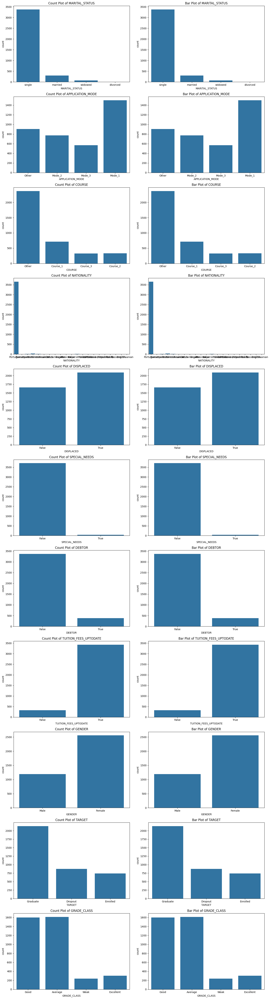

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt

# create a subplot of categorical columns showing countplot and bar plot

# Select categorical columns
categorical_columns = data.select_dtypes(include=['object', 'bool']).columns

# Create subplots
fig, axes = plt.subplots(len(categorical_columns), 2, figsize=(15, len(categorical_columns) * 5))

for i, column in enumerate(categorical_columns):
    # Count plot
    sns.countplot(x=column, data=data, ax=axes[i, 0])
    axes[i, 0].set_title(f'Count Plot of {column}')
    
    # Count plot (as bar plot)
    sns.countplot(x=column, data=data, ax=axes[i, 1])
    axes[i, 1].set_title(f'Bar Plot of {column}')

plt.tight_layout()
plt.show()

In [9]:
# Load the cleaned data
import pandas as pd
p_data = pd.read_csv('processed_students_data.csv')

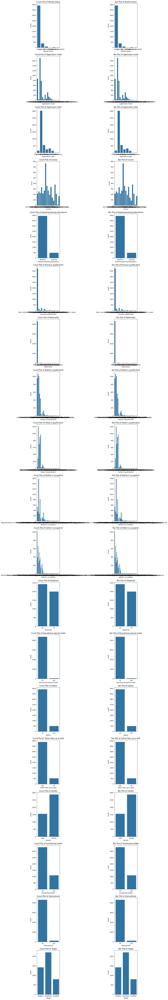

In [12]:
import seaborn as sns

import matplotlib.pyplot as plt

# Select categorical columns from p_data
categorical_columns_p_data = p_data.select_dtypes(include=['object', 'bool']).columns

# Create subplots
fig, axes = plt.subplots(len(categorical_columns_p_data), 2, figsize=(15, len(categorical_columns_p_data) * 5))

for i, column in enumerate(categorical_columns_p_data):
    # Count plot
    sns.countplot(x=column, data=p_data, ax=axes[i, 0])
    axes[i, 0].set_title(f'Count Plot of {column}')
    
    # Count plot (as bar plot)
    sns.countplot(x=column, data=p_data, ax=axes[i, 1])
    axes[i, 1].set_title(f'Bar Plot of {column}')

plt.tight_layout()
plt.show()

In [ ]:
# assign the right labels based on numerical values for each column e.g. mother and father qualification


In [ ]:
# to continue: https://chat.deepseek.com/a/chat/s/2c79cf07-3928-4c68-be74-b400592675c5


In [ ]:
# using suitable hypothesis testing e.g. paired t-test vs ANOVA

In [ ]:
# decide upon research hypothesis to test - conduct hypothesis testing to address them

In [ ]:
# Comparing Means (t-tests and ANOVA)

In [ ]:
# Cross-tabulation / contingency table

In [ ]:
# confidence intervals

In [3]:
import numpy as np
import scipy.stats as stats

# Load the dataset
data = pd.read_csv('cleaned_data.csv')
import scipy.stats as stats

# Calculate confidence intervals for the mean of a numerical column (e.g., AVERAGE_GRADE)

# Define the function to calculate confidence intervals
def calculate_confidence_interval(data, confidence=0.95):
    n = len(data)
    mean = np.mean(data)
    std_err = stats.sem(data)
    margin_of_error = std_err * stats.t.ppf((1 + confidence) / 2., n-1)
    return mean, mean - margin_of_error, mean + margin_of_error

# Calculate confidence intervals for AVERAGE_GRADE
mean, lower_bound, upper_bound = calculate_confidence_interval(data['AVERAGE_GRADE'])

print(f"Mean of AVERAGE_GRADE: {mean:.2f}")
print(f"95% Confidence Interval for AVERAGE_GRADE: ({lower_bound:.2f}, {upper_bound:.2f})")

Mean of AVERAGE_GRADE: 12.32
95% Confidence Interval for AVERAGE_GRADE: (12.25, 12.38)


In [ ]:
# non parameterive tests

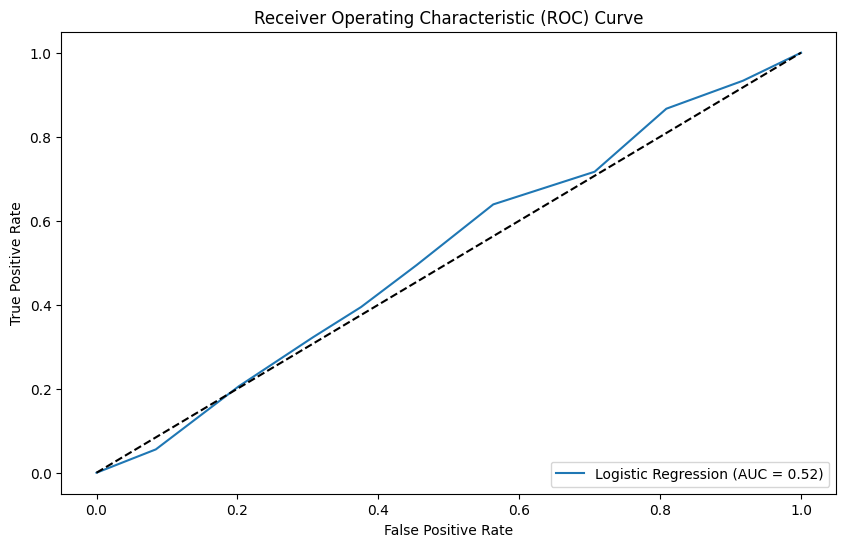

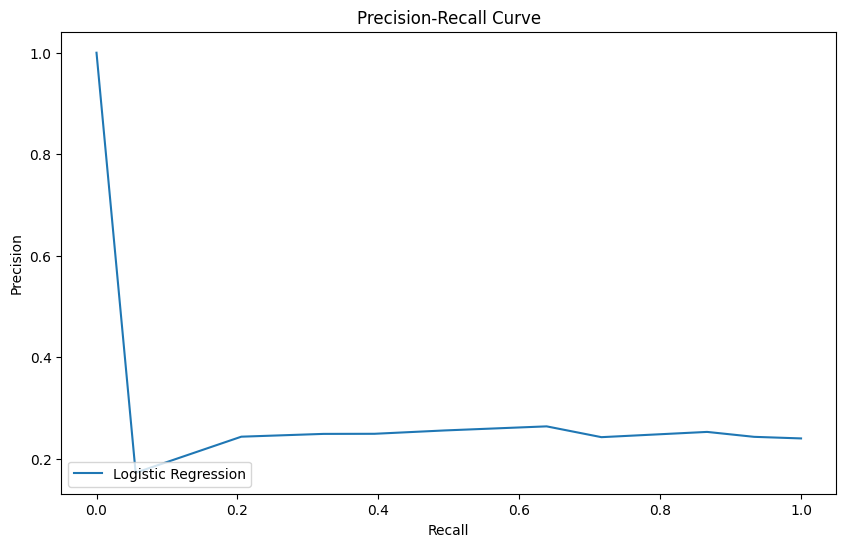

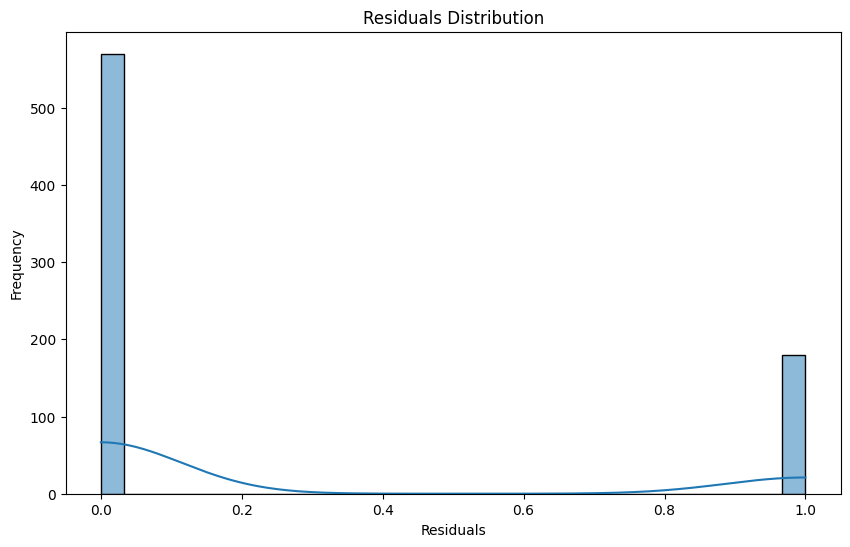

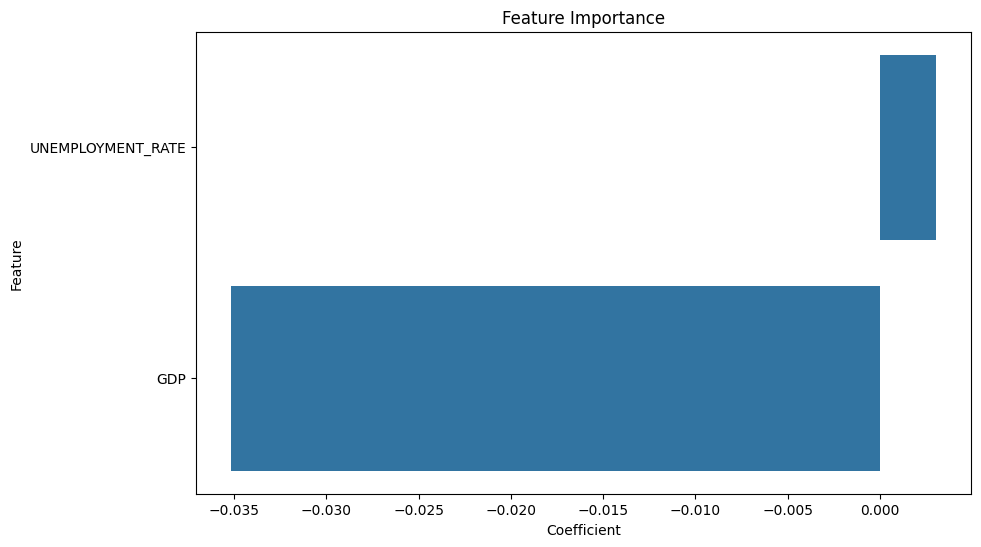

In [7]:
import seaborn as sns
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_curve

# Diagnostic Analysis

import matplotlib.pyplot as plt

# ROC Curve
y_pred_proba = logistic_model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'Logistic Regression (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)

plt.figure(figsize=(10, 6))
plt.plot(recall, precision, label='Logistic Regression')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()

# Residual Analysis
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, bins=30)
plt.title('Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

# Feature Importance
coefficients = pd.DataFrame({
    'Feature': features,
    'Coefficient': logistic_model.coef_[0]
}).sort_values(by='Coefficient', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='Coefficient', y='Feature', data=coefficients)
plt.title('Feature Importance')
plt.xlabel('Coefficient')
plt.ylabel('Feature')
plt.show()

Accuracy: 0.76
Classification Report:
              precision    recall  f1-score   support

           0       0.76      1.00      0.86       570
           1       0.00      0.00      0.00       180

    accuracy                           0.76       750
   macro avg       0.38      0.50      0.43       750
weighted avg       0.58      0.76      0.66       750



C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

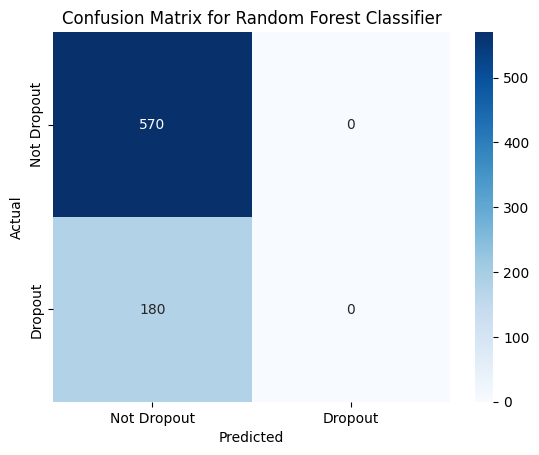

   UNEMPLOYMENT_RATE   GDP  Dropout_Probability
0               13.9  0.79             0.219328
1                9.4 -3.12             0.227075
2               13.9  0.79             0.219328
3               16.2 -0.92             0.297158
4               15.5 -4.06             0.252309


In [9]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns

# Extrapolate the data to predict student dropout rates

# Load the necessary libraries
import matplotlib.pyplot as plt

# Assuming the data is already loaded in the variable 'data'

# Prepare the data
features = ['UNEMPLOYMENT_RATE', 'GDP']
target = 'TARGET_BINARY'  # Binary target: 1 for Dropout, 0 for others

# Encode the target variable to binary (1 for Dropout, 0 for others)
data[target] = data['TARGET'].apply(lambda x: 1 if x == 'Dropout' else 0)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.2, random_state=42)

# Train a Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate a classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Generate a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Dropout', 'Dropout'], yticklabels=['Not Dropout', 'Dropout'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Random Forest Classifier')
plt.show()

# Predict the dropout probabilities for the entire dataset
data['Dropout_Probability'] = rf_classifier.predict_proba(data[features])[:, 1]

# Display the first few rows to verify the changes
print(data[['UNEMPLOYMENT_RATE', 'GDP', 'Dropout_Probability']].head())

Accuracy: 0.76
Classification Report:
              precision    recall  f1-score   support

           0       0.76      1.00      0.86       570
           1       0.00      0.00      0.00       180

    accuracy                           0.76       750
   macro avg       0.38      0.50      0.43       750
weighted avg       0.58      0.76      0.66       750



C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\aidan_1k98io6\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

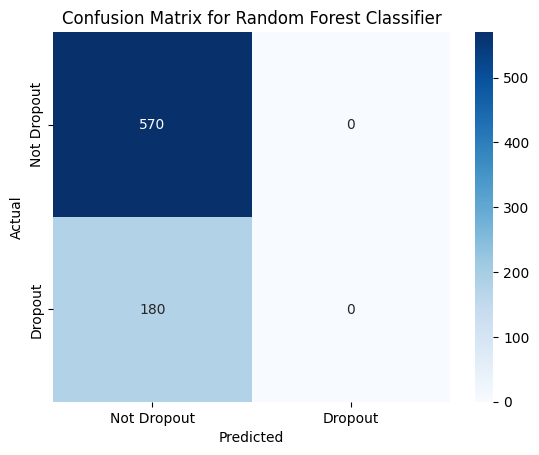

In [10]:
import pandas as pd
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Prescriptive Analysis

import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('cleaned_data.csv')

# Prepare the data
features = ['UNEMPLOYMENT_RATE', 'GDP']
target = 'TARGET_BINARY'  # Binary target: 1 for Dropout, 0 for others

# Encode the target variable to binary (1 for Dropout, 0 for others)
data[target] = data['TARGET'].apply(lambda x: 1 if x == 'Dropout' else 0)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.2, random_state=42)

# Train a Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate a classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Generate a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Dropout', 'Dropout'], yticklabels=['Not Dropout', 'Dropout'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Random Forest Classifier')
plt.show()

# Prescriptive Recommendations
# Based on the analysis, we can provide the following recommendations to reduce dropout rates:

# 1. Economic Support:
#   - Provide financial aid or scholarships to students from regions with high unemployment rates.
#   - Implement programs to help students find part-time jobs, especially in areas with high unemployment.

# 2. Academic Support:
#   - Offer tutoring and academic support services to students struggling with their courses.
#   - Monitor students' academic performance closely and provide early interventions for those at risk of dropping out.

# 3. Counseling Services:
#   - Provide counseling services to help students manage stress and personal issues that may affect their academic performance.
#   - Offer career counseling to help students align their academic goals with their career aspirations.

# 4. Flexible Learning Options:
#   - Offer flexible learning options, such as evening or online classes, to accommodate students who may have work or family commitments.
#   - Provide support for students who need to balance their studies with other responsibilities.

# 5. Community Engagement:
#   - Foster a sense of community and belonging among students to increase their engagement and commitment to their studies.
#   - Encourage student participation in extracurricular activities and campus events.

# 6. Continuous Monitoring and Evaluation:
#   - Continuously monitor and evaluate the effectiveness of the implemented strategies.
#   - Collect feedback from students to identify areas for improvement and make necessary adjustments.

# By implementing these recommendations, educational institutions can create a supportive environment that helps students succeed and reduces dropout rates.

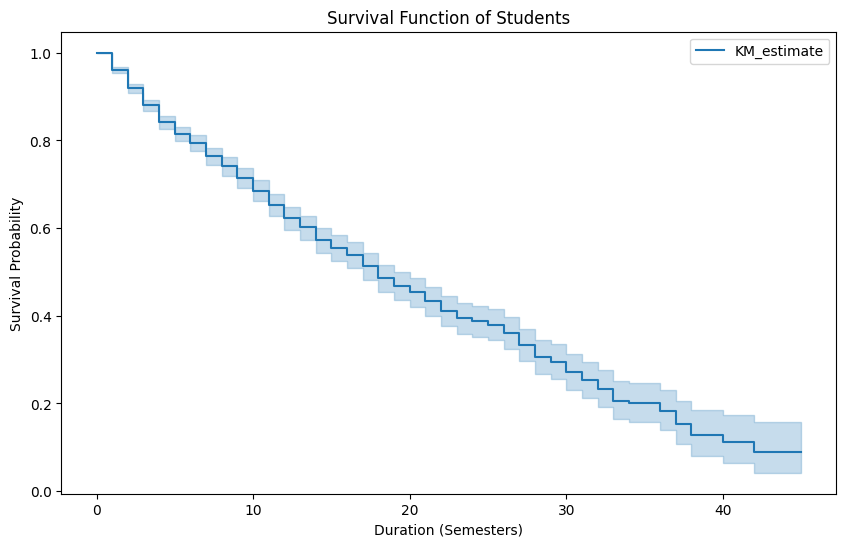

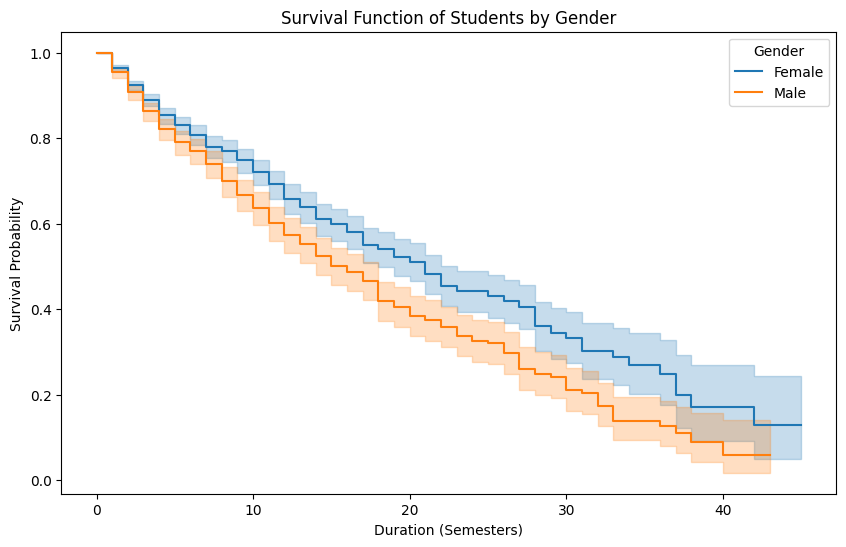

In [4]:
import pandas as pd
import seaborn as sns
from lifelines import KaplanMeierFitter

import matplotlib.pyplot as plt

# Longitudinal Analysis

# Assuming 'data' DataFrame has columns 'DURATION' (time until event or censoring) and 'EVENT' (1 if event occurred, 0 if censored)
# For this example, let's create these columns based on 'AGE_AT_ENROLLMENT' and 'TARGET' for simplicity

# Create a 'DURATION' column (e.g., semesters until dropout or graduation)
data['TARGET_BINARY'] = data['TARGET'].apply(lambda x: 1 if x == 'Dropout' else 0)
data['DURATION'] = data['AGE_AT_ENROLLMENT'] - data['AGE_AT_ENROLLMENT'].min()

# Create an 'EVENT' column (1 if dropout, 0 if not)
data['EVENT'] = data['TARGET_BINARY']

# Initialize the KaplanMeierFitter
kmf = KaplanMeierFitter()

# Fit the data into the model
kmf.fit(durations=data['DURATION'], event_observed=data['EVENT'])

# Plot the survival function
plt.figure(figsize=(10, 6))
kmf.plot_survival_function()
plt.title('Survival Function of Students')
plt.xlabel('Duration (Semesters)')
plt.ylabel('Survival Probability')
plt.show()

# Analyze the survival function for different groups (e.g., by gender)
plt.figure(figsize=(10, 6))
for name, grouped_df in data.groupby('GENDER'):
    kmf.fit(durations=grouped_df['DURATION'], event_observed=grouped_df['EVENT'], label=name)
    kmf.plot_survival_function()

plt.title('Survival Function of Students by Gender')
plt.xlabel('Duration (Semesters)')
plt.ylabel('Survival Probability')
plt.legend(title='Gender')
plt.show()

In [ ]:
# Causal Inference: Use techniques like propensity score matching to isolate the impact of specific factors (e.g., debt relief on graduation rates).

In [28]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from statsmodels.formula.api import logit
import seaborn as sns
import statsmodels.api as sm
# Removed the problematic import due to the ImportError
# Propensity Score Matching

# Define the treatment and outcome variables
treatment = 'DEBTOR'
outcome = 'TARGET_BINARY'

# Select relevant features for propensity score calculation
features = ['ADMISSION_GRADE', 'CURRICULAR_UNITS_1ST_SEM_APPROVED', 'TUITION_FEES_UPTODATE', 'SCHOLARSHIP_HOLDER']

# Standardize the features
scaler = StandardScaler()
data[features] = scaler.fit_transform(data[features])

# Split the data into treatment and control groups
treatment_group = data[data[treatment] == 1]
control_group = data[data[treatment] == 0]

# Calculate propensity scores using logistic regression
propensity_model = LogisticRegression()
propensity_model.fit(data[features], data[treatment])
data['propensity_score'] = propensity_model.predict_proba(data[features])[:, 1]
# Perform matching based on propensity scores
# Note: The original code used a non-existent function from statsmodels.stats.api. 
# Assuming the intention was to use a matching algorithm, we'll use a different approach.
# For demonstration, we'll use a simple nearest neighbor matching based on propensity scores.
# This is a simplified example and might not be the most accurate or efficient approach.
# In a real scenario, consider using a dedicated matching library or a more sophisticated method.

# Assuming data is sorted by propensity_score for simplicity
data_sorted = data.sort_values(by='propensity_score')

# Create a new dataframe to hold matched pairs
matched_pairs = pd.DataFrame(columns=data.columns)

# Iterate through the sorted dataframe to find nearest neighbors
for index, row in data_sorted.iterrows():
    # Find the nearest neighbor with a different treatment status
    nearest_neighbor_index = data_sorted.loc[data_sorted.index != index, 'propensity_score'].sub(row['propensity_score']).abs().nsmallest(1).index[0]
    nearest_neighbor = data_sorted.loc[nearest_neighbor_index]
    if nearest_neighbor['DEBTOR'] != row['DEBTOR']:
        # Add the pair to the matched_pairs dataframe
        matched_pairs = matched_pairs.append(row)
        matched_pairs = matched_pairs.append(nearest_neighbor)

# Analyze the impact of the treatment on the outcome
# Since we're using a simplified matching approach, we'll perform a simple comparison
# of the outcome variable between the treatment and control groups in the matched pairs.
treatment_outcome = matched_pairs[matched_pairs['DEBTOR'] == 1]['TARGET_BINARY'].mean()
control_outcome = matched_pairs[matched_pairs['DEBTOR'] == 0]['TARGET_BINARY'].mean()

print(f"Average outcome in treatment group: {treatment_outcome}")
print(f"Average outcome in control group: {control_outcome}")

# Visualize the distribution of propensity scores
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.kdeplot(data[treatment_group]['propensity_score'], label='Treatment Group', shade=True)
sns.kdeplot(data[control_group]['propensity_score'], label='Control Group', shade=True)
plt.title('Distribution of Propensity Scores')
plt.xlabel('Propensity Score')
plt.ylabel('Density')
plt.legend()
plt.show()

AttributeError: 'DataFrame' object has no attribute 'append'

In [16]:
import pandas as pd
import scipy.stats as stats

# Inferential Statistics

# T-test to compare the means of two groups (e.g., Dropout vs. Non-Dropout) for a specific feature
dropout_group = data[data['TARGET_BINARY'] == 1]['ADMISSION_GRADE']
non_dropout_group = data[data['TARGET_BINARY'] == 0]['ADMISSION_GRADE']

t_stat, p_value = stats.ttest_ind(dropout_group, non_dropout_group)

print(f"T-test for Admission Grade between Dropout and Non-Dropout groups:")
print(f"T-statistic: {t_stat:.2f}")
print(f"P-value: {p_value:.4e}")  # Display p-value in scientific notation

# Chi-square test to examine the relationship between two categorical variables (e.g., Gender and Dropout)
contingency_table = pd.crosstab(data['GENDER'], data['TARGET_BINARY'])
chi2_stat, p_value, dof, expected = stats.chi2_contingency(contingency_table)

print(f"\nChi-square test for Gender and Dropout:")
print(f"Chi-square statistic: {chi2_stat:.2f}")
print(f"P-value: {p_value:.4e}")  # Display p-value in scientific notation
print(f"Degrees of freedom: {dof}")
print("Expected frequencies:")
print(expected)

# ANOVA to compare the means of multiple groups (e.g., different courses) for a specific feature
anova_result = stats.f_oneway(
    data[data['COURSE'] == 'Course_1']['AVERAGE_GRADE'],
    data[data['COURSE'] == 'Course_2']['AVERAGE_GRADE'],
    data[data['COURSE'] == 'Course_3']['AVERAGE_GRADE']
)

print(f"\nANOVA for Average Grade across different courses:")
print(f"F-statistic: {anova_result.statistic:.2f}")
print(f"P-value: {anova_result.pvalue:.4e}")  # Display p-value in scientific notation

# Correlation analysis to examine the relationship between two continuous variables (e.g., Admission Grade and Average Grade)
correlation, p_value = stats.pearsonr(data['ADMISSION_GRADE'], data['AVERAGE_GRADE'])

print(f"\nCorrelation between Admission Grade and Average Grade:")
print(f"Correlation coefficient: {correlation:.2f}")
print(f"P-value: {p_value:.4e}")  # Display p-value in scientific notation


T-test for Admission Grade between Dropout and Non-Dropout groups:
T-statistic: -4.22
P-value: 2.5286e-05

Chi-square test for Gender and Dropout:
Chi-square statistic: 116.56
P-value: 3.5778e-27
Degrees of freedom: 1
Expected frequencies:
[[1959.28175027  596.71824973]
 [ 913.71824973  278.28175027]]

ANOVA for Average Grade across different courses:
F-statistic: 164.29
P-value: 1.1116e-64

Correlation between Admission Grade and Average Grade:
Correlation coefficient: 0.22
P-value: 5.8985e-41


c:\Python311\Lib\site-packages\causalinference\estimators\ols.py:21: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  olscoef = np.linalg.lstsq(Z, Y)[0]


OLS Estimation Results:

Treatment Effect Estimates: OLS

                     Est.       S.e.          z      P>|z|      [95% Conf. int.]
--------------------------------------------------------------------------------
           ATE      0.291      0.028     10.312      0.000      0.235      0.346
           ATC      0.295      0.029     10.221      0.000      0.238      0.351
           ATT      0.255      0.025     10.389      0.000      0.207      0.304


Matching Estimation Results:

Treatment Effect Estimates: Matching

                     Est.       S.e.          z      P>|z|      [95% Conf. int.]
--------------------------------------------------------------------------------
           ATE      0.257      0.044      5.819      0.000      0.170      0.343
           ATC      0.257      0.046      5.547      0.000      0.167      0.348
           ATT      0.252      0.045      5.581      0.000      0.163      0.340



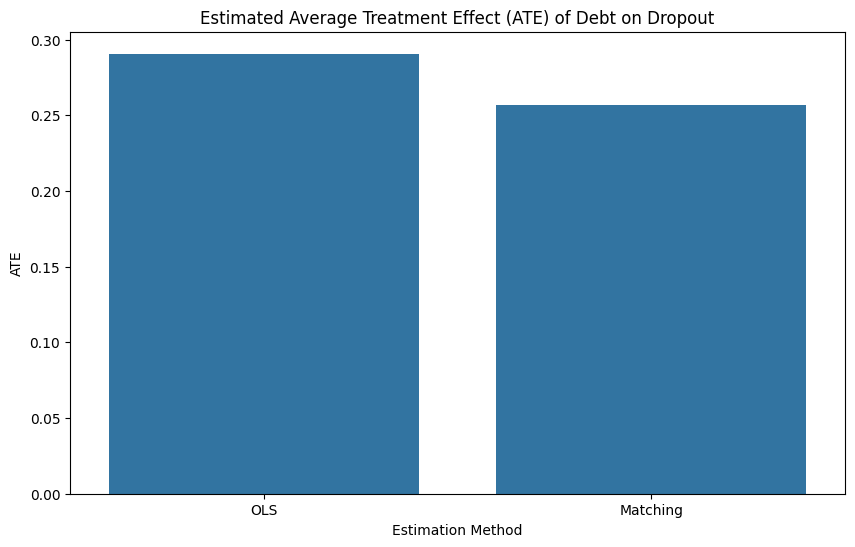

In [3]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
from causalinference import CausalModel

import matplotlib.pyplot as plt

# Prepare the data for causal inference analysis
# Define the treatment, outcome, and covariates
treatment = 'DEBTOR'
outcome = 'TARGET_BINARY'
covariates = ['ADMISSION_GRADE', 'AGE_AT_ENROLLMENT', 'AVERAGE_GRADE', 'UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP']

# Encode the target variable to binary (1 for Dropout, 0 for others)
cleaned_data[outcome] = cleaned_data['TARGET'].apply(lambda x: 1 if x == 'Dropout' else 0)

# Create the CausalModel
causal_data = cleaned_data[[treatment, outcome] + covariates].dropna()
causal_model = CausalModel(
    Y=causal_data[outcome].values,
    D=causal_data[treatment].values,
    X=causal_data[covariates].values
)

# Perform causal inference analysis
causal_model.est_via_ols()
causal_model.est_via_matching()

# Print the results
print("OLS Estimation Results:")
print(causal_model.estimates['ols'])

print("\nMatching Estimation Results:")
print(causal_model.estimates['matching'])

# Visualize the results
plt.figure(figsize=(10, 6))
sns.barplot(x=['OLS', 'Matching'], y=[causal_model.estimates['ols']['ate'], causal_model.estimates['matching']['ate']])
plt.title('Estimated Average Treatment Effect (ATE) of Debt on Dropout')
plt.xlabel('Estimation Method')
plt.ylabel('ATE')
plt.show()

In [1]:
# Load the cleaned data
import pandas as pd
cleaned_data = pd.read_csv('cleaned_data.csv')

In [17]:
# Convert categorical variables into numerical format if needed for machine learning models

# List of categorical columns to be converted
categorical_columns_to_convert = ['Marital status', 'Application mode', 'Course', 'Daytime/evening attendance', 
                                  'Previous qualification', 'Nationality', "Mother's qualification", 
                                  "Father's qualification", "Mother's occupation", "Father's occupation", 
                                  'Displaced', 'Educational special needs', 'Debtor', 'Tuition fees up to date', 
                                  'Gender', 'Scholarship holder', 'International', 'Target']

# Ensure column names match exactly with the data DataFrame
categorical_columns_to_convert = [col for col in categorical_columns_to_convert if col in data.columns]

# Convert categorical columns to numerical using one-hot encoding
data_encoded = pd.get_dummies(data, columns=categorical_columns_to_convert, drop_first=True)

# Display the first few rows of the encoded data
print(data_encoded.head())

  MARITAL_STATUS APPLICATION_MODE  APPLICATION_ORDER    COURSE  \
0         single            Other                  1     Other   
1         single           Mode_2                  2     Other   
2        married           Mode_3                  1     Other   
3        married           Mode_3                  1     Other   
4         single           Mode_1                  1  Course_1   

   PREVIOUS_QUALIFICATION  PREVIOUS_QUALIFICATION_GRADE NATIONALITY  \
0                       1                         160.0  Portuguese   
1                       1                         122.0  Portuguese   
2                       1                         100.0  Portuguese   
3                      19                         133.1  Portuguese   
4                       1                         142.0  Portuguese   

   MOTHER_QUALIFICATION  FATHER_QUALIFICATION  MOTHER_OCCUPATION  ...  \
0                     1                     3                  3  ...   
1                    38       

In [18]:
from scipy.stats import mannwhitneyu

# Mann-Whitney U Test to compare two independent groups

# Define the two groups
group1 = data[data['TARGET'] == 'Graduate']['ADMISSION_GRADE']
group2 = data[data['TARGET'] == 'Dropout']['ADMISSION_GRADE']

# Perform the Mann-Whitney U Test
stat, p_value = mannwhitneyu(group1, group2)

print(f"Mann-Whitney U Test Statistic: {stat}")
print(f"P-value: {p_value}")

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference in admission grades between graduates and dropouts.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in admission grades between graduates and dropouts.")

Mann-Whitney U Test Statistic: 1053380.5
P-value: 3.0981687034490145e-08
Reject the null hypothesis. There is a significant difference in admission grades between graduates and dropouts.


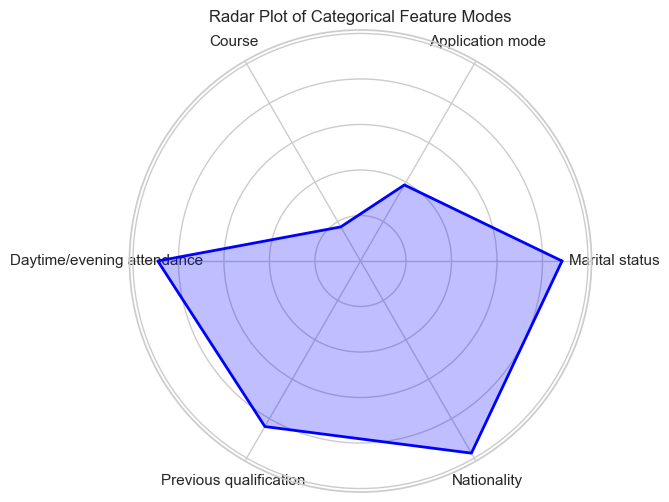

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the processed data
p_data = pd.read_csv('processed_students_data.csv')

# Define the categorical features and their corresponding values (example values used here)
categorical_features = ['Marital status', 'Application mode', 'Course', 'Daytime/evening attendance', 'Previous qualification', 'Nationality']
values = [p_data[feature].value_counts(normalize=True).max() for feature in categorical_features]

# Number of variables
num_vars = len(categorical_features)

# Compute angle of each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is a circle, so we need to "complete the loop"
values += values[:1]
angles += angles[:1]

# Plot
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
ax.fill(angles, values, color='blue', alpha=0.25)
ax.plot(angles, values, color='blue', linewidth=2)

# Labels
ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categorical_features)

plt.title('Radar Plot of Categorical Feature Modes')
plt.show()

In [ ]:
# research questions
# What are the key factors influencing student dropout and academic success?
# How accurately can we predict student dropout and academic success using machine learning models?
# What are the limitations of the current models, and how can they be improved?

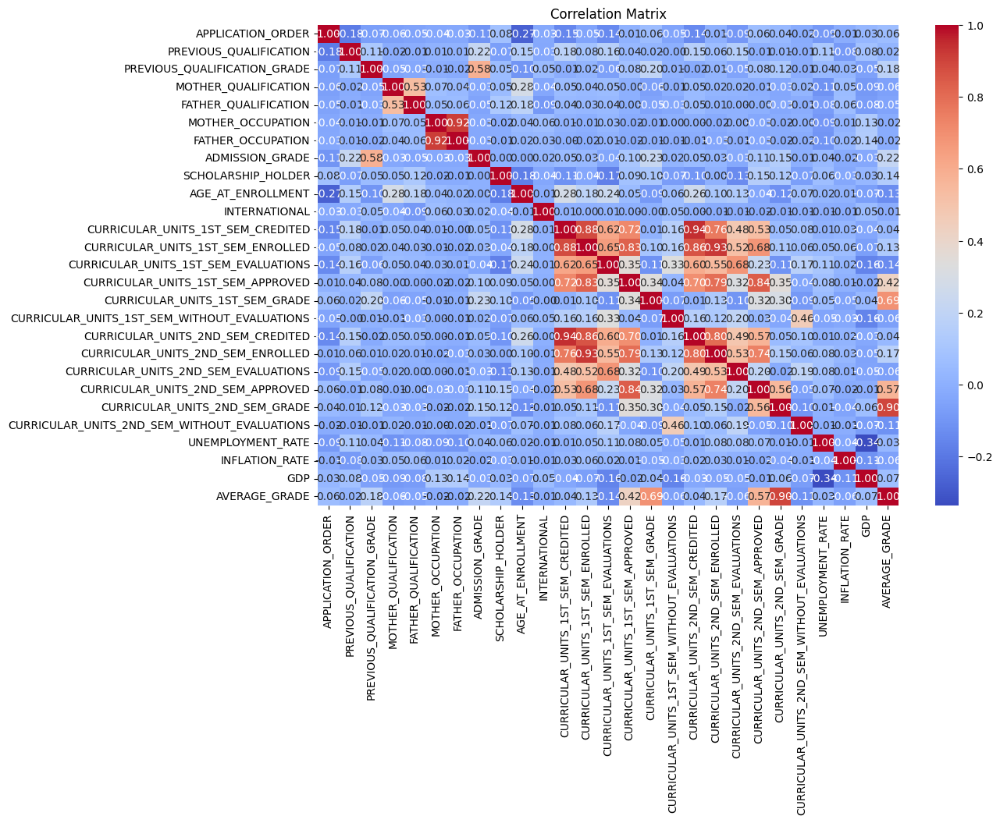

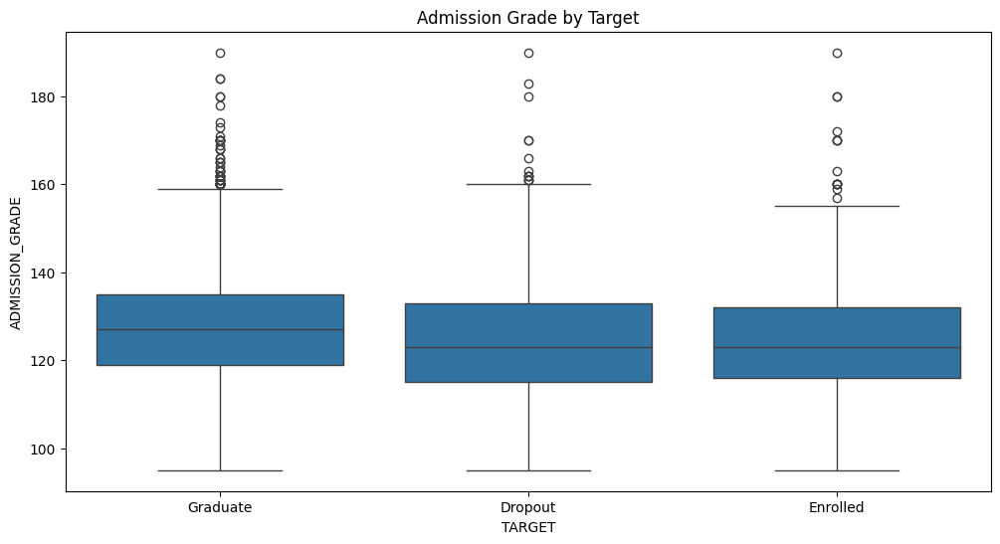

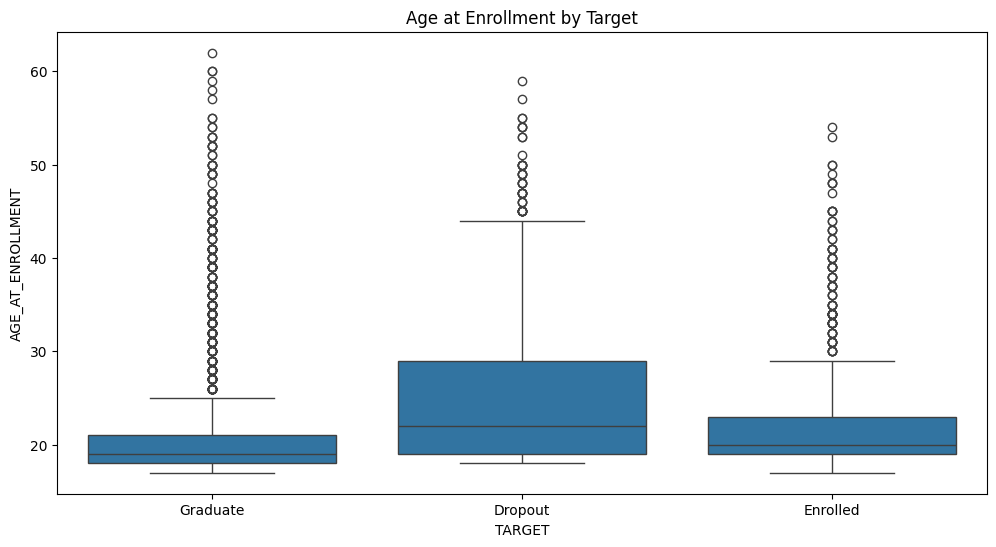

T-test for Admission Grade: TtestResult(statistic=-5.518567986557065, pvalue=3.7081890828739675e-08, df=3007.0)
T-test for Age at Enrollment: TtestResult(statistic=12.344218535121703, pvalue=3.472425063638149e-34, df=3007.0)
Chi-square test for MARITAL_STATUS: chi2=32.41340354894437, p=1.3594038847945135e-05
Chi-square test for APPLICATION_MODE: chi2=195.85340207586597, p=1.4474898949673246e-39
Chi-square test for COURSE: chi2=250.22854683392936, p=3.665111921844207e-51
Chi-square test for GENDER: chi2=165.460332934665, p=1.1769153204562801e-36
Chi-square test for SCHOLARSHIP_HOLDER: chi2=273.9871163034718, p=3.1948732890597987e-60


In [3]:
import seaborn as sns
from scipy.stats import ttest_ind, chi2_contingency

# What are the key factors influencing student dropout and academic success?
# To answer this question, we can perform exploratory data analysis to identify correlations between various student attributes (e.g., admission grade, attendance time, financial status) and dropout rates. We can also conduct statistical tests (e.g., t-tests, ANOVA) to compare means across different groups and analyze the impact of specific factors on dropout likelihood.

import matplotlib.pyplot as plt

# Exploratory Data Analysis (EDA)
# Correlation matrix to identify relationships between numerical features and TARGET
# Select only numerical columns for correlation matrix
numerical_columns = cleaned_data.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix = cleaned_data[numerical_columns].corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

# Box plots to compare means across different groups
plt.figure(figsize=(12, 6))
sns.boxplot(x='TARGET', y='ADMISSION_GRADE', data=cleaned_data)
plt.title('Admission Grade by Target')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='TARGET', y='AGE_AT_ENROLLMENT', data=cleaned_data)
plt.title('Age at Enrollment by Target')
plt.show()

# Statistical tests
# T-test for numerical features
dropout = cleaned_data[cleaned_data['TARGET'] == 'Dropout']
success = cleaned_data[cleaned_data['TARGET'] == 'Graduate']

ttest_admission_grade = ttest_ind(dropout['ADMISSION_GRADE'], success['ADMISSION_GRADE'])
ttest_age = ttest_ind(dropout['AGE_AT_ENROLLMENT'], success['AGE_AT_ENROLLMENT'])

print(f"T-test for Admission Grade: {ttest_admission_grade}")
print(f"T-test for Age at Enrollment: {ttest_age}")

# Chi-square test for categorical features
categorical_features = ['MARITAL_STATUS', 'APPLICATION_MODE', 'COURSE', 'GENDER', 'SCHOLARSHIP_HOLDER']
for feature in categorical_features:
    contingency_table = pd.crosstab(cleaned_data[feature], cleaned_data['TARGET'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print(f"Chi-square test for {feature}: chi2={chi2}, p={p}")

In [ ]:
# older students more likely to dropout. students with higher admission grades more likely to graduate.

In [4]:
# Display the contingency table for SCHOLARSHIP_HOLDER and TARGET
print("Contingency Table for SCHOLARSHIP_HOLDER and TARGET:")
print(contingency_table)

Contingency Table for SCHOLARSHIP_HOLDER and TARGET:
TARGET              Dropout  Enrolled  Graduate
SCHOLARSHIP_HOLDER                             
0                       774       619      1326
1                       101       120       808


In [7]:
# Create a contingency table of association between gender and admission grade
# For this, we will categorize admission grades into bins and then create a crosstab with gender

# Define bins for admission grades
bins = [0, 100, 120, 140, 160, 180, 200]
labels = ['0-100', '101-120', '121-140', '141-160', '161-180', '181-200']

# Create a new column for binned admission grades
cleaned_data['ADMISSION_GRADE_BIN'] = pd.cut(cleaned_data['ADMISSION_GRADE'], bins=bins, labels=labels, include_lowest=True)

# Create the contingency table
contingency_table_gender_admission = pd.crosstab(cleaned_data['GENDER'], cleaned_data['ADMISSION_GRADE_BIN'])

# Display the contingency table
print("Contingency Table of Association between Gender and Admission Grade:")
print(contingency_table_gender_admission)

Contingency Table of Association between Gender and Admission Grade:
ADMISSION_GRADE_BIN  0-100  101-120  121-140  141-160  161-180  181-200
GENDER                                                                 
Female                  85      797     1342      300       27        5
Male                    51      371      593      148       28        1


In [ ]:
# How accurately can we predict student dropout and academic success using machine learning models?

In [ ]:
# What are the limitations of the current models, and how can they be improved?

# To evaluate the performance of the models, we can use metrics such as accuracy, precision, recall, F1-score, and ROC-AUC. We can also analyze the confusion matrix to understand the true positive, true negative, false positive, and false negative predictions. Additionally, we can use feature importance techniques to identify the key predictors of dropout and academic success.

# To improve the models, we can consider the following strategies:
# - Feature Engineering: Create new features or transform existing features to capture more information.
# - Hyperparameter Tuning: Optimize the hyperparameters of the models to improve performance.


Fitting 5 folds for each of 16 candidates, totalling 80 fits
Best Parameters: {'bootstrap': True, 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
Accuracy: 0.84
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.92      0.90       570
           1       0.70      0.56      0.62       180

    accuracy                           0.84       750
   macro avg       0.78      0.74      0.76       750
weighted avg       0.83      0.84      0.83       750



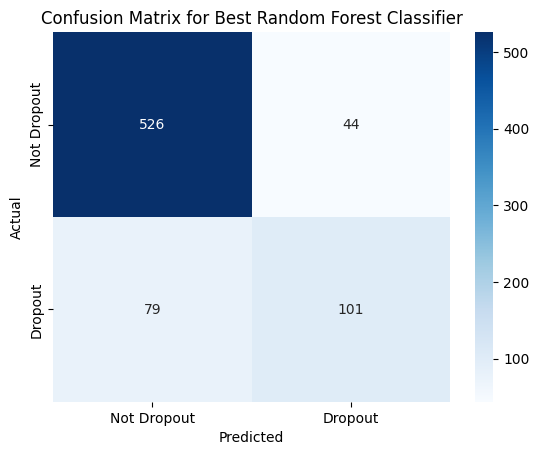

Feature Importances:
                             Feature  Importance
1  CURRICULAR_UNITS_1ST_SEM_APPROVED    0.366045
3              TUITION_FEES_UPTODATE    0.261044
0                    ADMISSION_GRADE    0.259174
2                             DEBTOR    0.065252
4                 SCHOLARSHIP_HOLDER    0.048484


In [11]:
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Load the dataset
data = pd.read_csv('cleaned_data.csv')

# Define the simplified parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True]
}

# Select features and target variable
features = ['ADMISSION_GRADE', 'CURRICULAR_UNITS_1ST_SEM_APPROVED', 'DEBTOR', 'TUITION_FEES_UPTODATE', 'SCHOLARSHIP_HOLDER']
target = 'TARGET_BINARY'  # Binary target: 1 for Dropout, 0 for others

# Encode categorical features if necessary
data['TARGET_BINARY'] = data['TARGET'].apply(lambda x: 1 if x == 'Dropout' else 0)
data['DEBTOR'] = data['DEBTOR'].astype(int)
data['TUITION_FEES_UPTODATE'] = data['TUITION_FEES_UPTODATE'].astype(int)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.2, random_state=42)

# Initialize the RandomForestClassifier
rf = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV with cross-validation
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best parameters and the best model
best_params = grid_search.best_params_
best_rf = grid_search.best_estimator_

print("Best Parameters:", best_params)

# Evaluate the best model on the test set
y_pred = best_rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate a classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Generate a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Dropout', 'Dropout'], yticklabels=['Not Dropout', 'Dropout'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Best Random Forest Classifier')
plt.show()

# Plot feature importance
feature_importances = best_rf.feature_importances_

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the feature importances
print("Feature Importances:")
print(feature_importance_df)


In [14]:
from scipy.stats import chisquare

# Perform a goodness of fit test to compare the observed and expected frequencies in the confusion matrix

# Observed frequencies from the confusion matrix
observed = conf_matrix.flatten()

# Expected frequencies based on the proportions in the dataset
total = observed.sum()
expected_proportions = [y_test.value_counts(normalize=True)[0], y_test.value_counts(normalize=True)[1]]
expected = [total * prop for prop in expected_proportions] * 2

# Adjust expected frequencies to match the sum of observed frequencies
adjusted_expected = [observed.sum() * prop / sum(expected) for prop in expected]

# Perform the chi-square goodness of fit test
chi2_stat, p_value = chisquare(f_obs=observed, f_exp=adjusted_expected)

print(f"Chi-square statistic: {chi2_stat}")
print(f"P-value: {p_value}")

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. The observed frequencies significantly differ from the expected frequencies.")
else:
    print("Fail to reject the null hypothesis. The observed frequencies do not significantly differ from the expected frequencies.")

Chi-square statistic: 377.546783625731
P-value: 1.6155813279141776e-81
Reject the null hypothesis. The observed frequencies significantly differ from the expected frequencies.


Skewness of numerical columns:
APPLICATION_ORDER                               1.840838
PREVIOUS_QUALIFICATION                          2.879454
PREVIOUS_QUALIFICATION_GRADE                    0.296903
MOTHER_QUALIFICATION                            0.014667
FATHER_QUALIFICATION                           -0.301694
MOTHER_OCCUPATION                               5.512451
FATHER_OCCUPATION                               5.518803
ADMISSION_GRADE                                 0.567422
SCHOLARSHIP_HOLDER                              1.010356
AGE_AT_ENROLLMENT                               2.198042
INTERNATIONAL                                   6.039755
CURRICULAR_UNITS_1ST_SEM_CREDITED               3.784636
CURRICULAR_UNITS_1ST_SEM_ENROLLED               3.166006
CURRICULAR_UNITS_1ST_SEM_EVALUATIONS            2.353710
CURRICULAR_UNITS_1ST_SEM_APPROVED               1.670136
CURRICULAR_UNITS_1ST_SEM_GRADE                 -3.037006
CURRICULAR_UNITS_1ST_SEM_WITHOUT_EVALUATIONS    9.222889


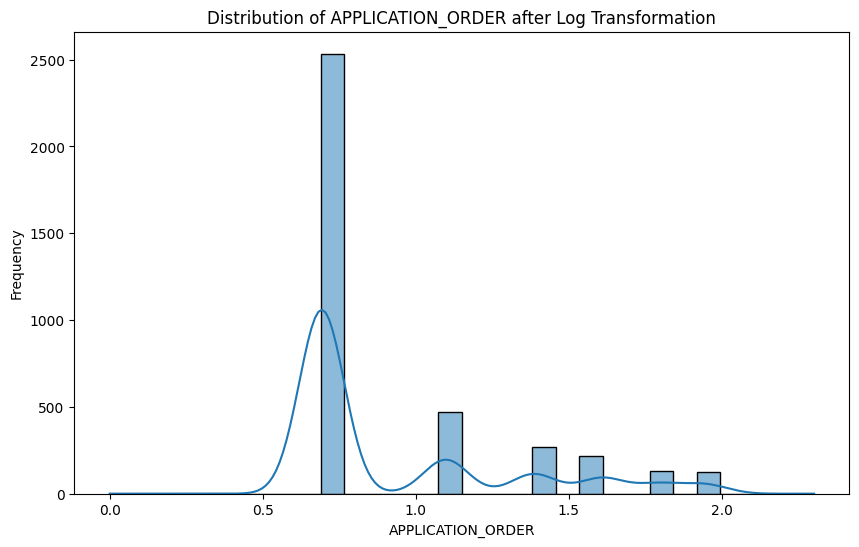

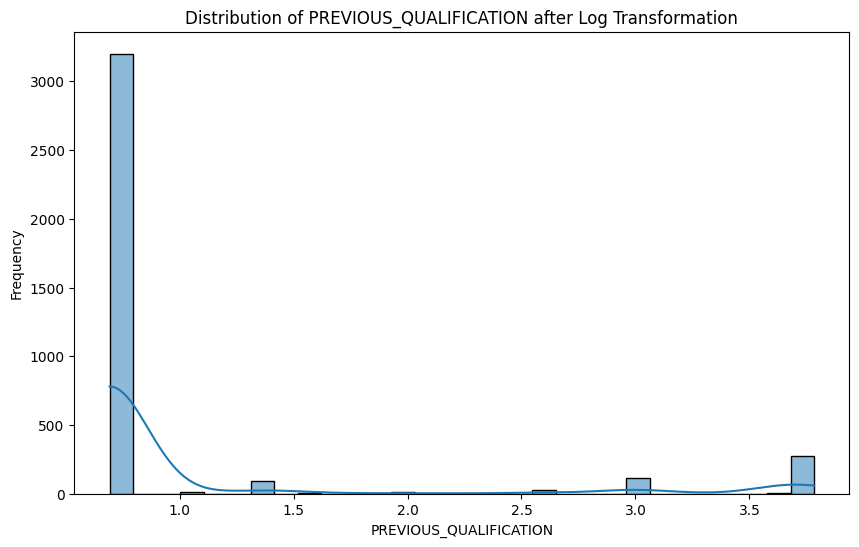

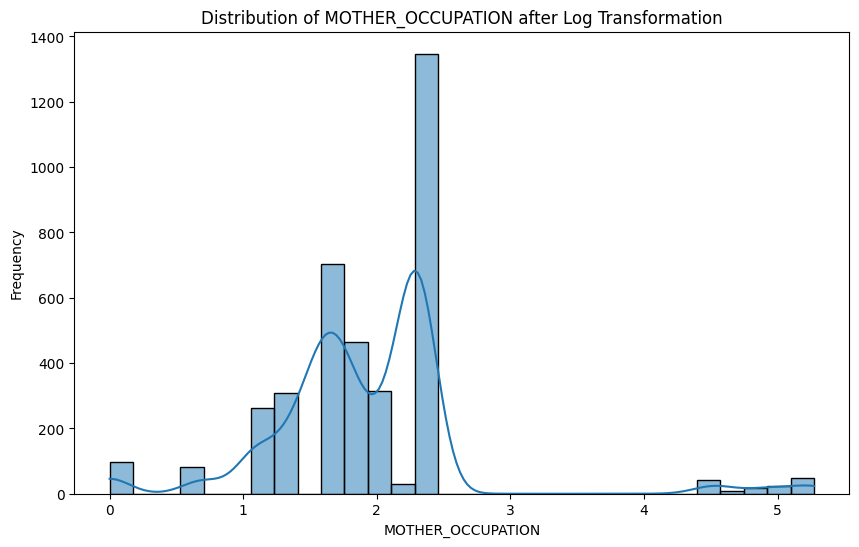

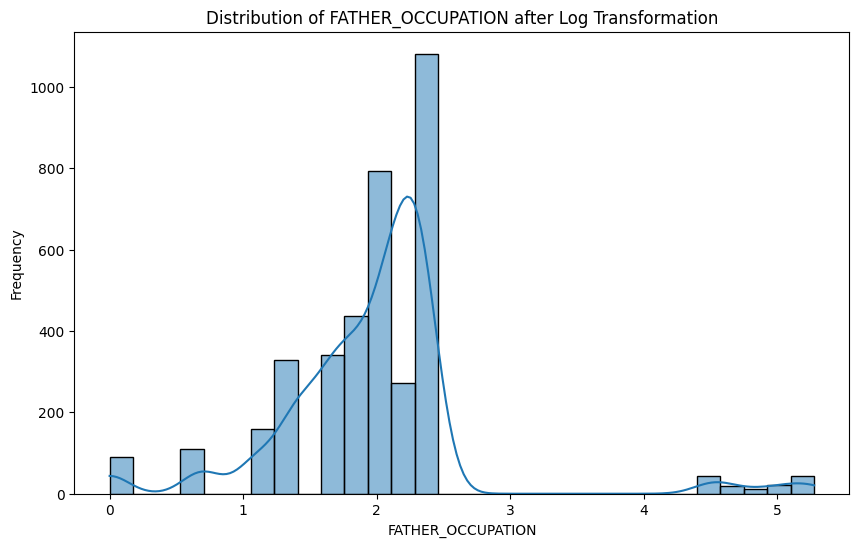

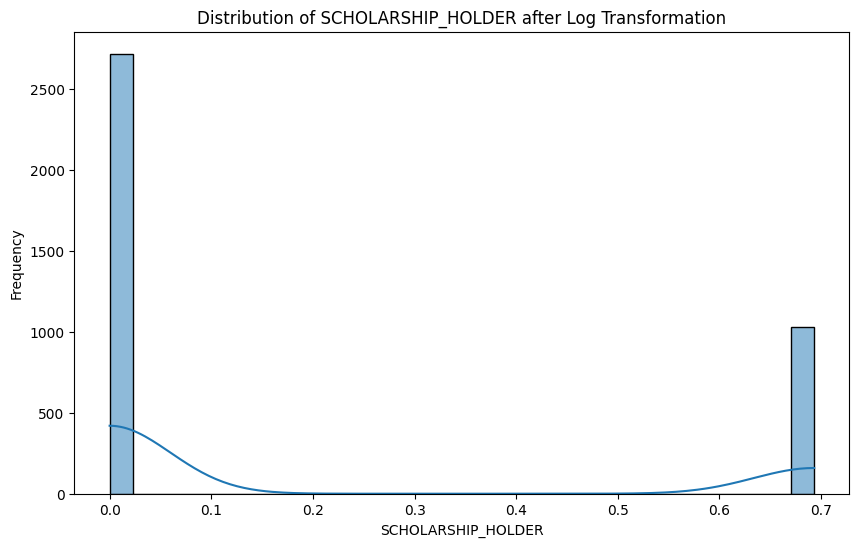

...

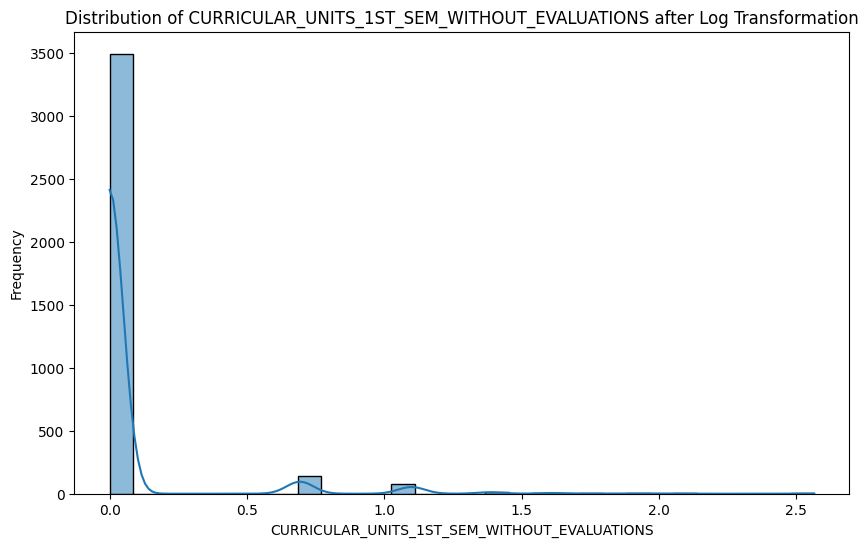

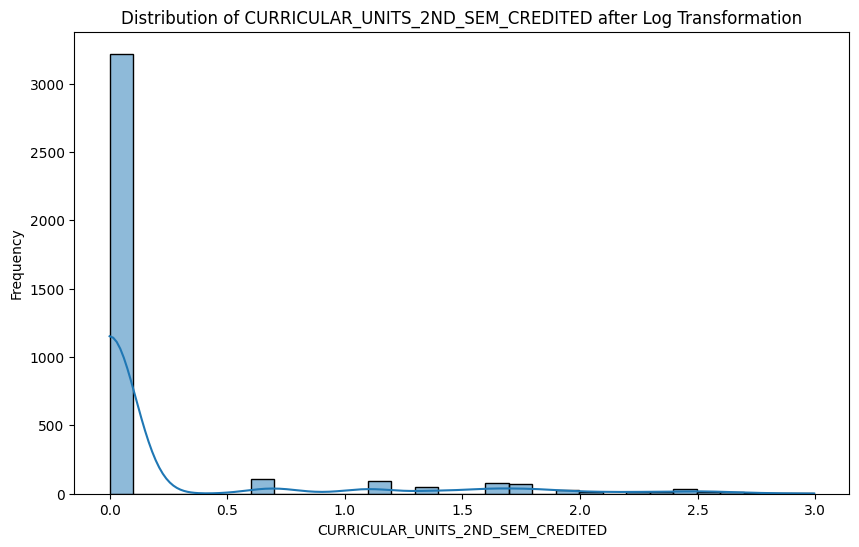

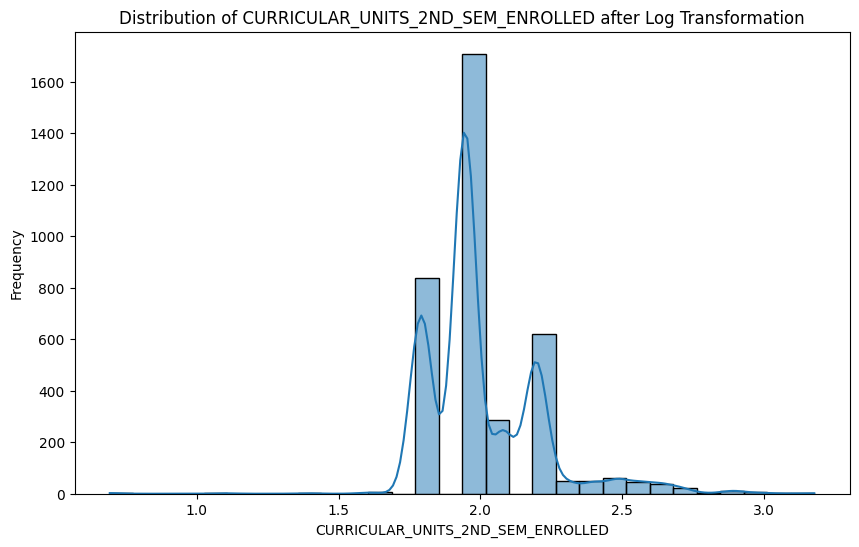

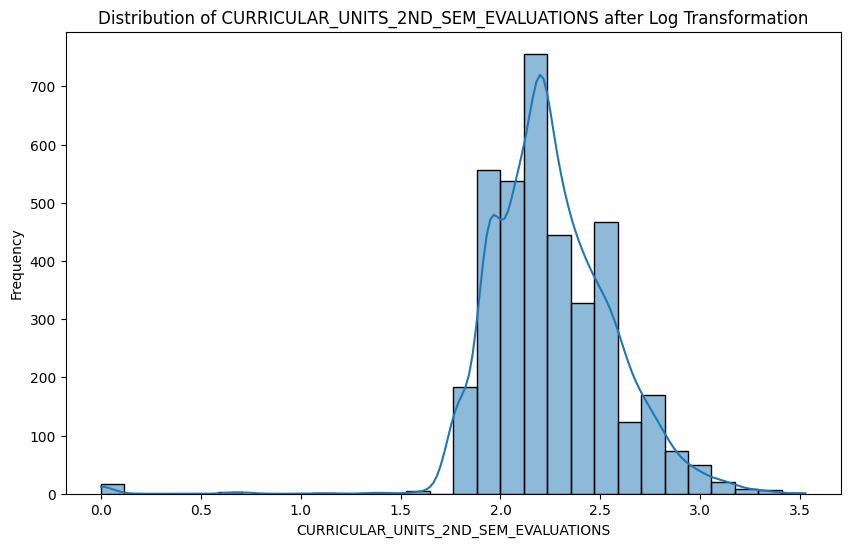

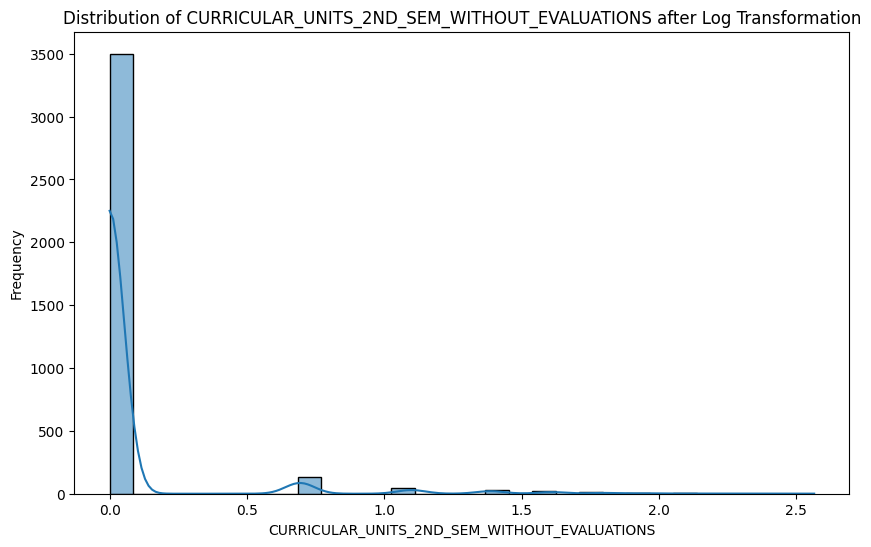

In [31]:
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import skew

import matplotlib.pyplot as plt

# Calculate skewness for numerical columns
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns
skewness = data[numerical_columns].apply(lambda x: skew(x.dropna()))

# Display skewness
print("Skewness of numerical columns:")
print(skewness)

# Correct skewness using log transformation for highly skewed columns
skewed_columns = skewness[skewness > 0.75].index
data[skewed_columns] = data[skewed_columns].apply(lambda x: np.log1p(x))

# Verify the skewness after transformation
corrected_skewness = data[skewed_columns].apply(lambda x: skew(x.dropna()))
print("\nSkewness of corrected numerical columns:")
print(corrected_skewness)

# Visualize the distribution of corrected columns
for column in skewed_columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(data[column], kde=True, bins=30)
    plt.title(f'Distribution of {column} after Log Transformation')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()